# Bitcoin Next Day Price Prediction Using ANN Models

This notebook is based off of data and models for predicting bitcoin price found in the journal article: 

**"Time-series forecasting of Bitcoin prices using high-dimensional features: a machine learning approach"**
https://link.springer.com/article/10.1007/s00521-020-05129-6

All data was retrieved from https://bitinfocharts.com using a web scraper found in the notebook, BTC_Data_Scraper. This scraper was originally created by https://github.com/heliphix/btc_data and I made a few small alterations to properly save the data on my machine.

bitinfocharts.com contains numerous metrics about bitcoin's blockchain, which is the freely accessible, open ledger network for bitcoin. The raw features data obtained are: Transactions, Block size, Sent from addresses, Difficulty, Average transaction value, Mining profitability, Sent BTC, Fee-to-reward ratio, Median transaction fee, Average transaction fee, Block time, Hashrate, Median transaction value, Active addresses, Top 100 to total.

From these features, multiple other features were derived by using WMA (weighted moving average), EMA (Exponential Moving Average), SMA (Simple Moving Average), RSI (Relative Strength Index), STD (Standard Deviation), VAR (Variance), TRIX (Triple Moving Exponential, and ROC (Rate of Change). All of these variations were used with different time windows of such as 7-day weighted moving average or 14-day rate of change, etc. 

This notebook accesses the saved CSV file for the raw and transformed data.

This notebook is broken into multiple sections:

    Importing and Scaling the Data
    Feature Selection through Feature Importance, Variance Inflation Factor, and Cross-Correlation Analysis
    Artificial Neural Network Models using features determined from the original journal article
    ANN Models using different Date Range Intervals for the data, along with grid search through hyperparameters
    ANN using the features from the Feature Selection section this notebook, iterating through the top 20 features
    Simple Benchmark Regression using the current price as the prediction for the next day price
    
    
### Importing and Scaling the Data:
As stated above, the data is from bitinfocharts.com and has raw features as well as transformed features. The data date range is from July 17, 2010 to October 10, 2021. The data is scaled using MinMaxScaler, range -1 to 1, for the feature analysis and selection portion.

### Feature Selection
The first analysis of features is using **Random Forest Regression Feature Importance**. This uses Random Forests for predicting regression values and assigns a value to the feature as to its average importance in determining the regression prediction. The higher the value of the feature, the more important. The highest scoring 100 features were kept from the 735 total original features.

The second analysis of features is **Variance Inflation Factor**. This expresses the amount of collinearity a feature has and the higher the VIF score the higher the collinearity of the feature. The 20 lowest VIF score features are selected from the subset of the 100 features analyzed by VIF.

The final analysis of features is a **Correlation Matrix** of features and the target (next_day_price). Using the correlation matrix, which measures how closely two data series follow each other in movement, I removed two highly correlated features from the subset of 20 VIF features. This left 18 features that score high on importance, have low collinearity and are not highly correlated to each other. 

### Artificial Neural Network Models using Journal Article Features
6 Artificial Neural Network Models were created. Each model had a different date range interval. The first three date ranges are from the journal article while the last three use date ranges with more current ending dates.

    ANN Model 1 used data from April 1, 2013 to July 19, 2016 (Interval 1) -from journal article
    ANN Model 2 used data from April 1, 2013 to April 1, 2017 (Interval 2) -from journal article
    ANN Model 3 used data from April 1, 2013 to December 31, 2019 (Interval 3) -from journal article
    ANN Model 4 used data from April 1, 2013 to September 1, 2021 (Interval 4)
    ANN Model 5 used data from April 1, 2015 to September 1, 2021 (Interval 5)
    ANN Model 6 used data from April 1, 2014 to September 1, 2021 (Interval 6)
    
Each of these models was given the same set of 10 features, which were determined from the journal article, and target (next_day_price), just different date ranges which is a parameter that may make a difference in the performance of the model.

Each model had 4 hidden layers, used batch size 64, and had early stopping after 100 epochs of no improvement of validation loss.

Then each model looped through a grid search of hyperparameters for tuning:
    
    Optimizers ['Adam', 'RMSprop']
    Neurons [200, 300, 400, 500, 600]
    Activation ['relu', 'elu']
    Learning Rate [0.01, 0.001, 0.0001]
    
The statistics for each run of the model were the R-squared, Mean Absolute Error, and Mean Absolute Percentage Error. The holdout R-squared was the main statistic for choosing a model, since it shows how close the residuals are to the regression line. Secondarily, the holdout MAPE was used to view how much percentage error there is from the predictions. 

The **holdout dataset** consisted of the final 30 days of data, which is also the most current data from the set.

#### Results from the ANN Models using hyperparameter tuning and different date ranges
The best holdout statistics for each date range interval are below.

**Interval 1:** 

    R-squared: 0.646
    MAPE: 3.876
    Model hyperparameters: Neurons = 400, Optimizer = Adam, Activation = relu, Learning Rate = 0.001
    
**Interval 2:**

    R-squared: 0.714
    MAPE: 3.370
    Model hyperparameters: Neurons = 300, Optimizer = Adam, Activation = relu, Learning Rate = 0.001
    
**Interval 3:**

    R-squared: 0.712
    MAPE: 3.372
    Model hyperparameters: Neurons = 600, Optimizer = Adam, Activation = relu, Learning Rate = 0.01
    
**Interval 4:**
    
    R-squared: 0.829
    MAPE: 2.564
    Model hyperparameters: Neurons = 300, Optimizer = Adam, Activation = relu, Learning Rate = 0.001
    
**Interval 5:**

    R-squared: 0.801
    MAPE: 2.703
    Model hyperparameters: Neurons = 200, Optimizer = Adam, Activation = relu, Learning Rate = 0.001
    
**Interval 6:**

    R-squared: 0.792
    MAPE: 2.866
    Model hyperparameters: Neurons = 600, Optimizer = Adam, Activation = relu, Learning Rate = 0.001
    

### ANN Model using the Features from Feature Importance, VIF, and Correlation Matrix
Taking the top 20 features from the VIF analysis to iterate through in combination to compare the effect it has on the ANN model performance. Starting with the top 6 features and training an ANN model. Then adding the one more feature to the list of features and training the ANN model. After which, the holdout R-squared scores are compared and if the holdout R-squared score is better, then keep that feature in the list otherwise drop that feature.

**The ANN model consisted of hyperparameters that scored well in previous analysis: 4 hidden layers, 300 neurons per layer, 0.0001 learning rate, RMSprop optimizer, relu activation, and batch size 64.**

The list of features that created the best score:

    median_transaction_fee3momUSD
    fee_to_reward7momUSD
    top100cap7mom
    mining_profitability7rsi
    top100cap14mom
    price3wmaUSD
    transactionvalue90emaUSD
    difficulty30sma
    fee_to_reward90smaUSD
    
**The holdout statistics from these features through the model are:**

    R-squared: 0.9711
    MAPE: 1.0354


### Benchmark Statistics
A benchmark regression model for comparison was created. The model simply used the current price as the prediction for the next day price. The idea is to see how close would someone be to predicting the next day's price by simply stating the price today.

**Benchmark Stats:**

    R-squared: 0.869
    MAPE: 2.194
    

### Concluding Analysis

The best model from this notebook is using ANN with 
    
    4 hidden layers, 300 neurons per layer 
    learning rate of 0.01
    optimizer of Adam
    activation function of relu
    64 batch size
    Interval 4 date range of April 1, 2013 to September 1, 2021.

The metrics from this model are only slightly better for the R-squared than the benchmark of using the current price as the next day prediction. And slightly worse for the MAPE score.

**R-squared ANN Model: 0.9711**                  

**R-squared Benchmark: 0.869**

**MAPE ANN Model: 1.0354** 

**MAPE Benchmark: 2.194**

In [1]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import rcParams
import matplotlib.pyplot as plt
%matplotlib inline

import keras
from keras.models import Sequential 
from keras.layers import Dense, Dropout
from keras.wrappers.scikit_learn import KerasRegressor
from keras import losses
from keras.constraints import maxnorm
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_validate
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from keras.models import load_model
from keras.callbacks import *

import re

In [2]:
path = './785fdd6c-f171-4d7b-8fee-43af010fd31b/Merged_Unconverted_BTC_Data.csv'
full_df = pd.read_csv(path)

In [3]:
full_df.head()

,Unnamed: 0,Date,priceUSD,transactions,size,sentbyaddress,difficulty,hashrate,mining_profitability,sentinusdUSD,...,price3rsiUSD,price7rsiUSD,price14rsiUSD,price30rsiUSD,price90rsiUSD,price3rocUSD,price7rocUSD,price14rocUSD,price30rocUSD,price90rocUSD
0,0,2010/07/17,0.0495,235,649.653,390,181.543,2.775561e+09,154298.0,1193.0,...,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0
1,1,2010/07/18,0.0726,248,765.285,424,181.543,1.554461e+09,401834.0,2612.0,...,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0
2,2,2010/07/19,0.0859,354,756.040,553,181.543,1.551287e+09,481473.0,4047.0,...,0.000,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0
3,3,2010/07/20,0.0783,413,984.707,632,181.543,1.640430e+09,431831.0,2341.0,...,82.751,0.0,0.0,0.0,0.0,58.099,0.0,0.0,0.0,0.0
4,4,2010/07/21,0.0767,256,542.483,440,181.543,1.723493e+09,460783.0,2122.0,...,78.603,0.0,0.0,0.0,0.0,5.652,0.0,0.0,0.0,0.0


In [4]:
full_df.drop(columns=['Unnamed: 0'], axis=1, inplace=True)

In [5]:
# insert a column of random values to use as comparison during feature importance
full_df['random'] = np.random.random(size=len(full_df))
full_df.tail()

,Date,priceUSD,transactions,size,sentbyaddress,difficulty,hashrate,mining_profitability,sentinusdUSD,transactionfeesUSD,...,price7rsiUSD,price14rsiUSD,price30rsiUSD,price90rsiUSD,price3rocUSD,price7rocUSD,price14rocUSD,price30rocUSD,price90rocUSD,random
4099,2021/10/06,52731.0,267618,696073.0,488363,1.989305e+13,1.544660e+20,0.286,6.991315e+10,3.550,...,85.161,71.057,62.066,55.349,9.824,25.940,24.000,1.872,60.297,0.777425
4100,2021/10/07,54374.0,325734,854943.0,560697,1.989305e+13,1.258129e+20,0.393,5.696495e+10,4.498,...,87.675,73.867,63.984,56.124,13.039,25.692,23.385,8.755,63.959,0.523643
4101,2021/10/08,54422.0,279908,844820.0,475151,1.989305e+13,1.309637e+20,0.320,4.871631e+10,4.018,...,87.747,73.948,64.040,56.147,8.873,18.333,26.147,17.559,61.467,0.881530
4102,2021/10/09,54742.0,246039,707791.0,369119,1.989305e+13,1.341666e+20,0.389,2.574088e+10,3.268,...,88.270,74.505,64.413,56.298,3.813,14.458,28.594,17.963,61.983,0.192400
4103,2021/10/10,55138.0,211347,518114.0,229335,1.989305e+13,1.547325e+20,0.359,2.514802e+10,3.322,...,88.952,75.212,64.882,56.486,1.406,14.837,28.849,20.052,63.607,0.798727


In [6]:
# create a column of the next day price
full_df['next_day_price'] = full_df['priceUSD'].shift(-1)

# create a new order for the columns
new_columns = ['Date', 'priceUSD', 'next_day_price'] + list(full_df.columns[2:-1])

# reorganize the dataframe
full_df = full_df[new_columns]
full_df.head()

,Date,priceUSD,next_day_price,transactions,size,sentbyaddress,difficulty,hashrate,mining_profitability,sentinusdUSD,...,price7rsiUSD,price14rsiUSD,price30rsiUSD,price90rsiUSD,price3rocUSD,price7rocUSD,price14rocUSD,price30rocUSD,price90rocUSD,random
0,2010/07/17,0.0495,0.0726,235,649.653,390,181.543,2.775561e+09,154298.0,1193.0,...,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.414314
1,2010/07/18,0.0726,0.0859,248,765.285,424,181.543,1.554461e+09,401834.0,2612.0,...,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.332997
2,2010/07/19,0.0859,0.0783,354,756.040,553,181.543,1.551287e+09,481473.0,4047.0,...,0.0,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,0.026992
3,2010/07/20,0.0783,0.0767,413,984.707,632,181.543,1.640430e+09,431831.0,2341.0,...,0.0,0.0,0.0,0.0,58.099,0.0,0.0,0.0,0.0,0.840085
4,2010/07/21,0.0767,0.0649,256,542.483,440,181.543,1.723493e+09,460783.0,2122.0,...,0.0,0.0,0.0,0.0,5.652,0.0,0.0,0.0,0.0,0.445061


In [7]:
# drop the last row since it has a NaN from next_day_price
full_df = full_df.dropna()

# check that no NaNs in the dataframe, should return False
False in full_df.isna()

False

## Scale the Data

In [8]:
from sklearn.preprocessing import MinMaxScaler, RobustScaler
from sklearn.pipeline import Pipeline

estimators = [] # create a list for the scalers
estimators.append(['minmax', MinMaxScaler((-1, 1))])


# add the scalers to the Pipeline
scale = Pipeline(estimators, verbose=True)

In [9]:
scaled_df = scale.fit_transform(full_df.iloc[:, 3:])
scaled_df = pd.DataFrame(scaled_df, columns=full_df.columns[3:])
scaled_df.head()

[Pipeline] ............ (step 1 of 1) Processing minmax, total=   0.1s


,transactions,size,sentbyaddress,difficulty,hashrate,mining_profitability,sentinusdUSD,transactionfeesUSD,median_transaction_feeUSD,confirmationtime,...,price7rsiUSD,price14rsiUSD,price30rsiUSD,price90rsiUSD,price3rocUSD,price7rocUSD,price14rocUSD,price30rocUSD,price90rocUSD,random
0,-0.999417,-0.999345,-0.999551,-1.0,-1.0,-0.359059,-1.0,-1.000000,-1.0,-0.329467,...,-1.0,-1.0,-1.0,-1.0,-0.255509,-0.515601,-0.668476,-0.844407,-0.949709,-0.171176
1,-0.999364,-0.999113,-0.999458,-1.0,-1.0,0.669186,-1.0,-0.999992,-1.0,-0.325600,...,-1.0,-1.0,-1.0,-1.0,-0.255509,-0.515601,-0.668476,-0.844407,-0.949709,-0.333873
2,-0.998931,-0.999132,-0.999104,-1.0,-1.0,1.000000,-1.0,-0.999999,-1.0,-0.333333,...,-1.0,-1.0,-1.0,-1.0,-0.255509,-0.515601,-0.668476,-0.844407,-0.949709,-0.946126
3,-0.998691,-0.998674,-0.998888,-1.0,-1.0,0.793791,-1.0,-1.000000,-1.0,-0.359111,...,-1.0,-1.0,-1.0,-1.0,0.565440,-0.515601,-0.668476,-0.844407,-0.949709,0.680704
4,-0.999331,-0.999560,-0.999414,-1.0,-1.0,0.914055,-1.0,-1.000000,-1.0,-0.439584,...,-1.0,-1.0,-1.0,-1.0,-0.175645,-0.515601,-0.668476,-0.844407,-0.949709,-0.109656


In [10]:
# rename the dataframe X
X = scaled_df
X.shape

(4103, 736)

In [11]:
# create the target series
y = full_df['next_day_price']
y.shape

(4103,)

## Perform Random Forest Regression to Find Feature Importance

In [12]:
# import the Random Forest Regressor to be used for feature importance
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=100, n_jobs=-1, oob_score=True, bootstrap=True, random_state=42)
rf.fit(X, y)

RandomForestRegressor(n_jobs=-1, oob_score=True, random_state=42)

In [13]:
# gather the feature importances from the model
feat_importances = rf.feature_importances_
feat_importances.shape

(736,)

In [14]:
# create a Series for the importances
forest_importance = pd.Series(feat_importances, index=scaled_df.columns)
forest_importance = forest_importance.sort_values(ascending=False)

### Variance Inflation Factor
Check the VIF on the top 100 features based on importance, to find the best scoring in combination with Random Forest Importance

In [15]:
# select the top 100 feature names by importance
top_100 = forest_importance[:100].index

# filter only the top 100 features from X dataframe
X_100 = X[top_100]
X_100.head()

,price3wmaUSD,price90wmaUSD,price30smaUSD,transactionvalue90emaUSD,price3emaUSD,transactionvalue90wmaUSD,transactionvalue90smaUSD,price7smaUSD,price14emaUSD,price90emaUSD,...,fee_to_reward7momUSD,transactionvalue7varUSD,price30momUSD,transactions30var,price30rocUSD,top100cap90wma,hashrate30std,transactionfees7trxUSD,median_transaction_fee3momUSD,transactions7trx
0,-1.000000,-1.0,-1.0,-1.0,-1.000000,-1.0,-1.0,-1.0,-1.0,-1.0,...,-0.017617,-1.0,-0.001352,-0.999460,-0.844407,0.209034,-1.0,-0.969228,-0.027404,-0.337119
1,-1.000000,-1.0,-1.0,-1.0,-1.000000,-1.0,-1.0,-1.0,-1.0,-1.0,...,-0.017617,-1.0,-0.001352,-0.999461,-0.844407,0.214160,-1.0,-0.969228,-0.027404,-0.516024
2,-0.999998,-1.0,-1.0,-1.0,-0.999998,-1.0,-1.0,-1.0,-1.0,-1.0,...,-0.017617,-1.0,-0.001352,-0.999463,-0.844407,0.218965,-1.0,-0.969228,-0.027404,-0.628934
3,-0.999997,-1.0,-1.0,-1.0,-0.999998,-1.0,-1.0,-1.0,-1.0,-1.0,...,-0.017617,-1.0,-0.001352,-0.999465,-0.844407,0.223343,-1.0,-0.969228,-0.027404,-0.702302
4,-0.999997,-1.0,-1.0,-1.0,-0.999998,-1.0,-1.0,-1.0,-1.0,-1.0,...,-0.017617,-1.0,-0.001352,-0.999467,-0.844407,0.227829,-1.0,-0.969228,-0.027404,-0.758267


In [16]:
# perform VIF on X
vif = [variance_inflation_factor(X_100.values, i) for i in range(X_100.shape[1])]


In [17]:
# convert into a Series
vif = pd.Series(vif, index=X_100.columns)
sorted_vif = vif.sort_values(ascending=True)
sorted_vif

median_transaction_fee3momUSD    1.915593e+00
fee_to_reward7momUSD             2.038508e+00
top100cap7mom                    2.504069e+00
mining_profitability7rsi         2.631560e+00
top100cap14mom                   2.964852e+00
                                     ...     
difficulty30ema                  1.490979e+07
hashrate90ema                    2.491608e+07
difficulty14ema                  7.394004e+07
price14emaUSD                    1.035214e+08
price7emaUSD                     1.306480e+08
Length: 100, dtype: float64

## Correlation Matrix for Top 20 Features from VIF

In [18]:
# filter only the top 20 VIF valued features
top_20_feat = list(sorted_vif[:20].index)
top_20_feat

['median_transaction_fee3momUSD',
 'fee_to_reward7momUSD',
 'top100cap7mom',
 'mining_profitability7rsi',
 'top100cap14mom',
 'price90rsiUSD',
 'sentinusd14momUSD',
 'price3rsiUSD',
 'price7rsiUSD',
 'transactionvalue30trxUSD',
 'price3trxUSD',
 'confirmationtime7std',
 'activeaddresses90trx',
 'mediantransactionvalue14trxUSD',
 'fee_to_reward90trxUSD',
 'price30momUSD',
 'activeaddresses30sma',
 'price30rocUSD',
 'difficulty90mom',
 'fee_to_reward90stdUSD']

In [19]:
# filter the scaled_df with the top_20_feat
top_20_df = scaled_df[top_20_feat]
top_20_df.head()


,median_transaction_fee3momUSD,fee_to_reward7momUSD,top100cap7mom,mining_profitability7rsi,top100cap14mom,price90rsiUSD,sentinusd14momUSD,price3rsiUSD,price7rsiUSD,transactionvalue30trxUSD,price3trxUSD,confirmationtime7std,activeaddresses90trx,mediantransactionvalue14trxUSD,fee_to_reward90trxUSD,price30momUSD,activeaddresses30sma,price30rocUSD,difficulty90mom,fee_to_reward90stdUSD
0,-0.027404,-0.017617,-0.024946,-1.0,-0.002235,-1.0,0.049669,-1.000000,-1.0,-0.537736,-0.294878,0.364204,-0.317552,-0.554032,-0.670695,-0.001352,-0.999406,-0.844407,0.312189,-1.0
1,-0.027404,-0.017617,-0.023466,-1.0,-0.013720,-1.0,0.049669,-1.000000,-1.0,-0.537736,-0.294878,0.404686,-0.280929,-0.554032,-0.670695,-0.001352,-0.999362,-0.844407,0.312189,-1.0
2,-0.027404,-0.017617,-0.009477,-1.0,-0.021553,-1.0,0.049669,-1.000000,-1.0,-0.537736,-0.294878,0.525856,-0.246092,-0.554032,-0.670695,-0.001352,-0.999322,-0.844407,0.312189,-1.0
3,-0.027404,-0.017617,-0.000454,-1.0,-0.023571,-1.0,0.049669,0.655086,-1.0,-0.537736,-0.294878,0.467905,-0.213042,-0.554032,-0.670695,-0.001352,-0.999282,-0.844407,0.312189,-1.0
4,-0.027404,-0.017617,0.007090,-1.0,-0.026791,-1.0,0.049669,0.572123,-1.0,-0.537736,-0.294878,0.282129,-0.182671,-0.554032,-0.670695,-0.001352,-0.999251,-0.844407,0.312189,-1.0


In [20]:
# add the next_day_price to the df
next_day_price = full_df.loc[:, ('next_day_price')]
top_20_df.loc[:, ['next_day_price']] = next_day_price
top_20_df.head()

C:\Users\dagar\anaconda3\envs\nn37\lib\site-packages\pandas\core\indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


,median_transaction_fee3momUSD,fee_to_reward7momUSD,top100cap7mom,mining_profitability7rsi,top100cap14mom,price90rsiUSD,sentinusd14momUSD,price3rsiUSD,price7rsiUSD,transactionvalue30trxUSD,...,confirmationtime7std,activeaddresses90trx,mediantransactionvalue14trxUSD,fee_to_reward90trxUSD,price30momUSD,activeaddresses30sma,price30rocUSD,difficulty90mom,fee_to_reward90stdUSD,next_day_price
0,-0.027404,-0.017617,-0.024946,-1.0,-0.002235,-1.0,0.049669,-1.000000,-1.0,-0.537736,...,0.364204,-0.317552,-0.554032,-0.670695,-0.001352,-0.999406,-0.844407,0.312189,-1.0,0.0726
1,-0.027404,-0.017617,-0.023466,-1.0,-0.013720,-1.0,0.049669,-1.000000,-1.0,-0.537736,...,0.404686,-0.280929,-0.554032,-0.670695,-0.001352,-0.999362,-0.844407,0.312189,-1.0,0.0859
2,-0.027404,-0.017617,-0.009477,-1.0,-0.021553,-1.0,0.049669,-1.000000,-1.0,-0.537736,...,0.525856,-0.246092,-0.554032,-0.670695,-0.001352,-0.999322,-0.844407,0.312189,-1.0,0.0783
3,-0.027404,-0.017617,-0.000454,-1.0,-0.023571,-1.0,0.049669,0.655086,-1.0,-0.537736,...,0.467905,-0.213042,-0.554032,-0.670695,-0.001352,-0.999282,-0.844407,0.312189,-1.0,0.0767
4,-0.027404,-0.017617,0.007090,-1.0,-0.026791,-1.0,0.049669,0.572123,-1.0,-0.537736,...,0.282129,-0.182671,-0.554032,-0.670695,-0.001352,-0.999251,-0.844407,0.312189,-1.0,0.0649


In [21]:
# reorder the columns for next_day_price to be first
new_cols = ['next_day_price'] + list(top_20_df.columns[:-1])
top_20_df = top_20_df[new_cols]

In [22]:
correlations = top_20_df.corr()
correlations.head()

,next_day_price,median_transaction_fee3momUSD,fee_to_reward7momUSD,top100cap7mom,mining_profitability7rsi,top100cap14mom,price90rsiUSD,sentinusd14momUSD,price3rsiUSD,price7rsiUSD,...,price3trxUSD,confirmationtime7std,activeaddresses90trx,mediantransactionvalue14trxUSD,fee_to_reward90trxUSD,price30momUSD,activeaddresses30sma,price30rocUSD,difficulty90mom,fee_to_reward90stdUSD
next_day_price,1.000000,0.007653,-0.019959,0.017318,0.093656,0.029324,0.093348,0.052429,0.004362,0.003273,...,-0.005902,0.046123,-0.259029,-0.012469,-0.146237,0.303459,0.672863,-0.044963,0.037377,0.499720
median_transaction_fee3momUSD,0.007653,1.000000,0.476590,-0.008352,0.155309,0.032329,0.045814,0.063151,0.070232,0.084165,...,0.087170,0.052904,-0.009102,0.041145,-0.012581,0.128449,-0.001719,0.045310,0.033377,-0.041946
fee_to_reward7momUSD,-0.019959,0.476590,1.000000,-0.025641,0.120584,0.057462,0.034495,0.067575,0.035468,0.073380,...,0.036892,0.168273,-0.010252,0.089688,-0.029810,0.096583,-0.008864,0.052991,0.078250,-0.072631
top100cap7mom,0.017318,-0.008352,-0.025641,1.000000,0.008206,0.538785,-0.007531,0.004269,0.002224,0.018240,...,0.029673,-0.073857,-0.008321,0.050268,0.010658,0.014382,0.002542,0.037936,0.013764,0.014618
mining_profitability7rsi,0.093656,0.155309,0.120584,0.008206,1.000000,0.018144,0.330631,0.032882,0.511118,0.599956,...,0.622962,-0.064446,-0.111325,0.240633,0.144860,0.213418,0.101933,0.356741,-0.043532,0.056820


### Correlation of Features with Next Day Price

In [23]:
# take just the correlations with the next day price
next_day_price_corr = correlations.iloc[0].sort_values(ascending=False)
next_day_price_corr

next_day_price                    1.000000
activeaddresses30sma              0.672863
fee_to_reward90stdUSD             0.499720
price30momUSD                     0.303459
mining_profitability7rsi          0.093656
price90rsiUSD                     0.093348
transactionvalue30trxUSD          0.075296
sentinusd14momUSD                 0.052429
confirmationtime7std              0.046123
difficulty90mom                   0.037377
top100cap14mom                    0.029324
top100cap7mom                     0.017318
median_transaction_fee3momUSD     0.007653
price3rsiUSD                      0.004362
price7rsiUSD                      0.003273
price3trxUSD                     -0.005902
mediantransactionvalue14trxUSD   -0.012469
fee_to_reward7momUSD             -0.019959
price30rocUSD                    -0.044963
fee_to_reward90trxUSD            -0.146237
activeaddresses90trx             -0.259029
Name: next_day_price, dtype: float64

### Correlation Matrix with all 20 Features

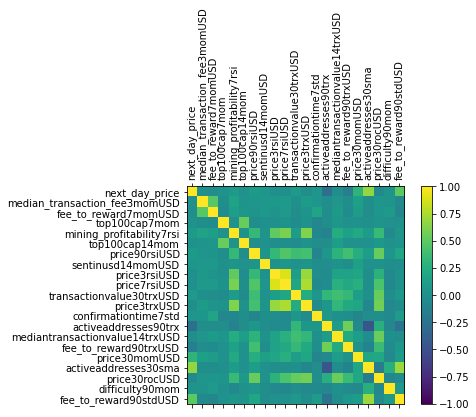

In [24]:
fig = plt.figure()
ax = fig.add_subplot(111)
cax = ax.matshow(correlations, vmin=-1, vmax=1)
fig.colorbar(cax)
ticks = np.arange(0, correlations.shape[0], 1)
ax.set_xticks(ticks)
ax.set_yticks(ticks)
ax.set_xticklabels(correlations.index, rotation='vertical')
ax.set_yticklabels(correlations.index)
plt.rcParams["figure.figsize"] = (10,10)
plt.show()

### Remove high cross-correlated features

In [25]:
# create a correlation function to find highly correlated features
def correlation(dataset, threshold):
    col_corr = dict() # create a dictionary for storing name and count
    corr_matrix = dataset.corr()
    # iterate through each row and column
    for i in range(len(corr_matrix.columns)):
        row_list = list()
        for j in range(i):
            if corr_matrix.iloc[i, j] > threshold:
                colname = corr_matrix.columns[i] # retrieve the column name
                rowname = corr_matrix.columns[j] # retrieve the row name
                row_list.append(rowname) # append the rowname to list 
                col_corr[colname] = row_list # set the list to the column name
                    
    return col_corr

In [26]:
# remove the next_day_price from the features to be cross correlated
feat_df = top_20_df.drop(columns=['next_day_price'])

#sanity check
'next_day_price' in feat_df.columns


False

In [27]:
high_corr = correlation(feat_df, 0.75)
len(high_corr)

2

In [28]:
# which features are cross correlated with each other
for k,v in high_corr.items():
    print(k, v)

price7rsiUSD ['price3rsiUSD']
price3trxUSD ['price7rsiUSD']


#### This shows that only price7rsiUSD, price3trxUSD, price3rsiUSD, and price3rocUSD are highly correlated. 

Removing price3trxUSD and price7rsiUSD should remove the most cross-correlation

### Create a DataFrame without the cross-correlated features

In [29]:
# create a list of the features that have high influence and low cross correlation
best_cols = list(top_20_df.drop(columns=['price3trxUSD', 'price7rsiUSD']).columns)

# add date to the list of columns
final_cols = ['Date']
for name in best_cols:
    final_cols.append(name)

# filter only the desired columns for a dataframe with raw data values
final_df = full_df[final_cols]
final_df.head()

,Date,next_day_price,median_transaction_fee3momUSD,fee_to_reward7momUSD,top100cap7mom,mining_profitability7rsi,top100cap14mom,price90rsiUSD,sentinusd14momUSD,price3rsiUSD,transactionvalue30trxUSD,confirmationtime7std,activeaddresses90trx,mediantransactionvalue14trxUSD,fee_to_reward90trxUSD,price30momUSD,activeaddresses30sma,price30rocUSD,difficulty90mom,fee_to_reward90stdUSD
0,2010/07/17,0.0726,0.0,0.0,-0.508,0.0,-0.088,0.0,0.0,0.000,0.0,5.263,0.541,0.0,0.0,0.0,848.133,0.0,173.723,0.0
1,2010/07/18,0.0859,0.0,0.0,-0.477,0.0,-0.327,0.0,0.0,0.000,0.0,5.409,0.582,0.0,0.0,0.0,869.567,0.0,173.723,0.0
2,2010/07/19,0.0783,0.0,0.0,-0.184,0.0,-0.490,0.0,0.0,0.000,0.0,5.846,0.621,0.0,0.0,0.0,889.333,0.0,173.723,0.0
3,2010/07/20,0.0767,0.0,0.0,0.005,0.0,-0.532,0.0,0.0,82.751,0.0,5.637,0.658,0.0,0.0,0.0,909.267,0.0,173.557,0.0
4,2010/07/21,0.0649,0.0,0.0,0.163,0.0,-0.599,0.0,0.0,78.603,0.0,4.967,0.692,0.0,0.0,0.0,924.700,0.0,170.079,0.0


# Test Data on ANN Model

In [20]:
# create function for MAPE
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [31]:
# create a 3 hidden layer model function for testing hyperparameters

def interval2_ann_model_nextday_eda(X, y, lr=0.001, neurons=400, activation='relu', opt='Adam', batch_size=64, epochs=5000, count=0):
    ''' 
        X is a dataframe of the dates and features using non-standardized values
        The Date column must be the first column in the X dataframe
        y is a dataframe or 1D array of the target values
    '''
    # assign the string values to variables for file naming later in the Checkpoint
    opt_name = opt
    acti = activation
    # remove the . in the learning rate
    learn_rt = re.sub('\.', '-', str(lr))
    
    # create a holdout series of the last 30 days of data
    X_holdout = X.iloc[-30:, 1:] # exclude the first column which is the date column
    y_holdout = y[-30:]
    
    # extract the data from the dates of Interval 2
    date_bool = (X.iloc[:, 0] >= '2013/04/01') & (X.iloc[:, 0] <= '2017/04/01')
    X = X[date_bool]
    # remove the date column
    X = X.iloc[:, 1:]
    # adjust the range of y df
    y = y[X.index]
    
    # create train test split of data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=15)
    
    # scale the data
    estimators = [] # create a list for the scalers
    estimators.append(['minmax', MinMaxScaler()])
    estimators.append(['robust', RobustScaler()])
    # add the scalers to the Pipeline
    scale = Pipeline(estimators, verbose=True)
    # fit the scaler to the training data
    scale.fit(X_train)
    # transform the training, testing, and holdout data
    X_train = scale.transform(X_train)
    X_test = scale.transform(X_test)
    X_holdout = scale.transform(X_holdout)
    

    # define the shape of the input number of features
    shape = X_train.shape[1]
    
    # create call backs to save the model after each epoch if it is the best seen so far
    # and for early stopping when model has not improved after 100 epochs
    mcp_save = ModelCheckpoint('trained_models/ANN2_reg_nextday_eda' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int1'+'_'+str(count)+'.hdf5', save_best_only=True, monitor='val_loss', mode='auto')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=100, verbose=1, mode='auto')
        
    # create a special definition for the ANN model to adjust hyperparameters
    def seq_model(initializer='normal', activation=activation, neurons=neurons, NUM_FEATURES=shape, opt=opt, lr=lr):
        # create model
        model = Sequential()
        model.add(Dense(neurons, input_shape=(NUM_FEATURES,), kernel_initializer=initializer, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(1, activation=activation, kernel_initializer=initializer))
        # Compile model
        # select an optimizer
        if opt == 'Adam':
            opt = tf.keras.optimizers.Adam(learning_rate=lr)
        elif opt == 'RMSprop':
            opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
        elif opt == 'Adagrad':
            opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
        model.compile(loss='logcosh', optimizer=opt, metrics=['mae'])
        return model
        
    # define the 4 Dense layer model
    ann_model = seq_model(activation=activation, neurons=neurons, NUM_FEATURES=shape)
    

    # create the regressor
    regressor=KerasRegressor(build_fn=seq_model, batch_size=batch_size, epochs=epochs, verbose=0, shuffle=True,
                         validation_split=0.1, validation_freq=1,
                        use_multiprocessing=True, callbacks=[mcp_save,earlyStopping])
    
    # fit the model on training data
    regressor.fit(X_train, y_train)
    
    # use training data for predictions
    y_train_pred = regressor.predict(X_train)
    # calculate R-squared score for train data
    r2 = r2_score(y_train, y_train_pred)
    print('Training R-Squared:', r2)
    
    # use testing data for predictions
    y_test_pred = regressor.predict(X_test)
    # calculate R-squared score for test data
    r2 = r2_score(y_test, y_test_pred)
    print('\nTesting R-Squared:', r2)
    
    # use holdout data for predictions
    y_holdout_pred = regressor.predict(X_holdout)
    # calculate R-squared score for holdout data
    r2 = r2_score(y_holdout, y_holdout_pred)
    print('\n30day Holdout R-Squared:', r2)
    # calculate mean absolute error for holdout data
    mae = mean_absolute_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAE:', mae)
    # calculate mean absolute percentage error for holdout data
    mape = mean_absolute_percentage_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAPE:', mape)
    # calculate root mean squared error 
    rmse = np.sqrt(mean_squared_error(y_holdout, y_holdout_pred))
    print('\n30day Holdout RMSE:', rmse)
    
    # create a df of the holdout predicted and actual
    holdout_df = pd.DataFrame(zip(y_holdout, y_holdout_pred), columns=['actual', 'predicted'])
    
    plt.plot(holdout_df.index, holdout_df['actual'], color='black', label='Actual')
    plt.plot(holdout_df.index, holdout_df['predicted'], color='red', label='Predicted')
    plt.legend()
    plt.show()
    
    
    print('---------Model Summary For Above Results----------')
    print(X.columns)
    print('trained_models/ANN2_reg_nextday_eda' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int1'+'_'+str(count)+'.hdf5')
    print('Number of Neurons:', neurons)
    print('Activation:', activation)
    print('Optimizer:', opt_name)
    print('Learning Rate:', lr)
    print('Batch Size:', batch_size, '\n\n\n')

In [32]:
# create a df with the features and with Date as the first column
x_cols = ['Date'] + list(final_df.columns[2:])
X = final_df[x_cols]

# create a y series from the next_day_price column
y = final_df['next_day_price']

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00296: early stopping
Training R-Squared: 0.9976568393194771

Testing R-Squared: 0.9917557134927671

30day Holdout R-Squared: -109.68668418176237

30day Holdout MAE: 41923.04873962402

30day Holdout MAPE: 90.26683568955757

30day Holdout RMSE: 42029.67438134574


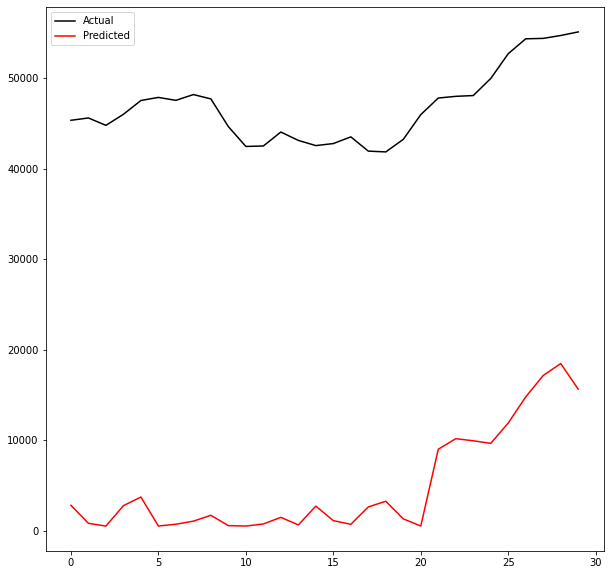

---------Model Summary For Above Results----------
Index(['median_transaction_fee3momUSD', 'fee_to_reward7momUSD',
       'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom',
       'price90rsiUSD', 'sentinusd14momUSD', 'price3rsiUSD',
       'transactionvalue30trxUSD', 'confirmationtime7std',
       'activeaddresses90trx', 'mediantransactionvalue14trxUSD',
       'fee_to_reward90trxUSD', 'price30momUSD', 'activeaddresses30sma',
       'price30rocUSD', 'difficulty90mom', 'fee_to_reward90stdUSD'],
      dtype='object')
trained_models/ANN2_reg_nextday_eda400Adam0-001relu64Int1_0.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 





In [33]:
# test out the top features from the EDA of Feature Importance, VIF, and cross-correlation
interval2_ann_model_nextday_eda(X, y)

### The Results from the Preliminary EDA Analysis and ANN

There is no quick and easy positive result from running the EDA and narrowing down the features based on Random Forest Regressor Feature Importance, Variance Inflation Factor and Cross-Correlation elimination.

## ----------------------New Features from the Paper-------------------------------------------------------
    
#### End of Day Features:
    median_transaction_fee30trxUSD
    median_transaction_fee7trxUSD
    price90emaUSD
    size90trx
    transactions
    price30wmaUSD
    price3wmaUSD
    price7wmaUSD
    median_transaction_fee7rocUSD
    difficulty30rsi
    
#### 7 Day Features:
    size90trx
    price3wmaUSD
    price7wmaUSD
    median_transaction_fee7rocUSD
    difficulty30rsi
    mining_profitability
    price30smaUSD
    sentinusd90emaUSD
    transactionvalueUSD
    top100cap
    
    
#### 30 Day Features:
    median_transaction_fee30trxUSD
    size90trx
    price30wmaUSD
    price3wmaUSD
    difficulty30rsi
    mining_profitability
    price30smaUSD
    sentinusd90emaUSD
    transactionvalueUSD
    difficulty90mom
    hashrate90var
    price90wmaUSD
    sentinusd90smaUSD
    median_transaction_feeUSD

## Date Intervals from the ML paper

Interval 1: April 1, 2013 to July 19, 2016

Interval 2: April 1, 2013 to April 1, 2017

Interval 3: April 1, 2013 to Dec 31, 2019

### Create a Function for Next Day Prediction using Interval I

In [34]:
X.head()

,Date,median_transaction_fee3momUSD,fee_to_reward7momUSD,top100cap7mom,mining_profitability7rsi,top100cap14mom,price90rsiUSD,sentinusd14momUSD,price3rsiUSD,transactionvalue30trxUSD,confirmationtime7std,activeaddresses90trx,mediantransactionvalue14trxUSD,fee_to_reward90trxUSD,price30momUSD,activeaddresses30sma,price30rocUSD,difficulty90mom,fee_to_reward90stdUSD
0,2010/07/17,0.0,0.0,-0.508,0.0,-0.088,0.0,0.0,0.000,0.0,5.263,0.541,0.0,0.0,0.0,848.133,0.0,173.723,0.0
1,2010/07/18,0.0,0.0,-0.477,0.0,-0.327,0.0,0.0,0.000,0.0,5.409,0.582,0.0,0.0,0.0,869.567,0.0,173.723,0.0
2,2010/07/19,0.0,0.0,-0.184,0.0,-0.490,0.0,0.0,0.000,0.0,5.846,0.621,0.0,0.0,0.0,889.333,0.0,173.723,0.0
3,2010/07/20,0.0,0.0,0.005,0.0,-0.532,0.0,0.0,82.751,0.0,5.637,0.658,0.0,0.0,0.0,909.267,0.0,173.557,0.0
4,2010/07/21,0.0,0.0,0.163,0.0,-0.599,0.0,0.0,78.603,0.0,4.967,0.692,0.0,0.0,0.0,924.700,0.0,170.079,0.0


In [35]:
# create a 3 hidden layer model function for testing hyperparameters

def interval1_ann_model_nextday(X, y, lr=0.01, neurons=300, activation='relu', opt='Adam', batch_size=64, epochs=5000, count=0):
    ''' 
        X is a dataframe of the dates and features using non-standardized values
        The Date column must be the first column in the X dataframe
        y is a dataframe or 1D array of the target values
    '''
    # assign the string values to variables for file naming later in the Checkpoint
    opt_name = opt
    acti = activation
    # remove the . in the learning rate
    learn_rt = re.sub('\.', '-', str(lr))
    
    # create a holdout series of the last 30 days of data
    X_holdout = X.iloc[-30:, 1:] # exclude the first column which is the date column
    y_holdout = y[-30:]
    
    # extract the data from the dates of Interval 1
    date_bool = (X.iloc[:, 0] >= '2013/04/01') & (X.iloc[:, 0] <= '2016/07/19')
    X = X[date_bool]
    # remove the date column
    X = X.iloc[:, 1:]
    # adjust the range of y df
    y = y[X.index]
    
    # create train test split of data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=15)
    
    # scale the data
    estimators = [] # create a list for the scalers
    estimators.append(['minmax', MinMaxScaler()])
    estimators.append(['robust', RobustScaler()])
    # add the scalers to the Pipeline
    scale = Pipeline(estimators, verbose=True)
    # fit the scaler to the training data
    scale.fit(X_train)
    # transform the training, testing, and holdout data
    X_train = scale.transform(X_train)
    X_test = scale.transform(X_test)
    X_holdout = scale.transform(X_holdout)
    

    # define the shape of the input number of features
    shape = X_train.shape[1]
    
    # create call backs to save the model after each epoch if it is the best seen so far
    # and for early stopping when model has not improved after 100 epochs
    mcp_save = ModelCheckpoint('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int1'+'_'+str(count)+'.hdf5', save_best_only=True, monitor='val_loss', mode='auto')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=100, verbose=1, mode='auto')
        
    # create a special definition for the ANN model to adjust hyperparameters
    def seq_model(initializer='normal', activation=activation, neurons=neurons, NUM_FEATURES=shape, opt=opt, lr=lr):
        # create model
        model = Sequential()
        model.add(Dense(neurons, input_shape=(NUM_FEATURES,), kernel_initializer=initializer, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(1, activation=activation, kernel_initializer=initializer))
        # Compile model
        # select an optimizer
        if opt == 'Adam':
            opt = tf.keras.optimizers.Adam(learning_rate=lr)
        elif opt == 'RMSprop':
            opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
        elif opt == 'Adagrad':
            opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
        model.compile(loss='logcosh', optimizer=opt, metrics=['mae'])
        return model
        
    # define the 4 Dense layer model
    ann_model = seq_model(activation=activation, neurons=neurons, NUM_FEATURES=shape)
    

    # create the regressor
    regressor=KerasRegressor(build_fn=seq_model, batch_size=batch_size, epochs=epochs, verbose=0, shuffle=True,
                         validation_split=0.1, validation_freq=1,
                        use_multiprocessing=True, callbacks=[mcp_save,earlyStopping])
    
    # fit the model on training data
    regressor.fit(X_train, y_train)
    
    # use training data for predictions
    y_train_pred = regressor.predict(X_train)
    # calculate R-squared score for train data
    r2 = r2_score(y_train, y_train_pred)
    print('Training R-Squared:', r2)
    
    # use testing data for predictions
    y_test_pred = regressor.predict(X_test)
    # calculate R-squared score for test data
    r2 = r2_score(y_test, y_test_pred)
    print('\nTesting R-Squared:', r2)
    
    # use holdout data for predictions
    y_holdout_pred = regressor.predict(X_holdout)
    # calculate R-squared score for holdout data
    r2 = r2_score(y_holdout, y_holdout_pred)
    print('\n30day Holdout R-Squared:', r2)
    # calculate mean absolute error for holdout data
    mae = mean_absolute_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAE:', mae)
    # calculate mean absolute percentage error for holdout data
    mape = mean_absolute_percentage_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAPE:', mape)
    # calculate root mean squared error 
    rmse = np.sqrt(mean_squared_error(y_holdout, y_holdout_pred))
    print('\n30day Holdout RMSE:', rmse)
    
    # create a df of the holdout predicted and actual
    holdout_df = pd.DataFrame(zip(y_holdout, y_holdout_pred), columns=['actual', 'predicted'])
    
    plt.plot(holdout_df.index, holdout_df['actual'], color='black', label='Actual')
    plt.plot(holdout_df.index, holdout_df['predicted'], color='red', label='Predicted')
    plt.legend()
    plt.show()
    
    print('---------Model Summary For Above Results----------')
    print('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int1'+'_'+str(count)+'.hdf5')
    print('Number of Neurons:', neurons)
    print('Activation:', activation)
    print('Optimizer:', opt_name)
    print('Learning Rate:', lr)
    print('Batch Size:', batch_size, '\n\n\n')

## Prepare the data for the model for Next Day Prediction

Select only the relevant features
    
    median_transaction_fee30trxUSD
    median_transaction_fee7trxUSD
    price90emaUSD
    size90trx
    transactions
    price30wmaUSD
    price3wmaUSD
    price7wmaUSD
    median_transaction_fee7rocUSD
    difficulty30rsi
 

Make sure the date column is the first column

Create the next_day_price columns

Separate the features into X df and the next_day_price into y df

In [36]:
# create the next_day_price column
full_df['next_day_price'] = full_df['priceUSD'].shift(-1)

# filter down to the relevant features
selected_feats_date = ['Date', 'median_transaction_fee30trxUSD', 'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx', 
                  'transactions', 'price30wmaUSD', 'price3wmaUSD', 'price7wmaUSD', 'median_transaction_fee7rocUSD',
                 'difficulty30rsi']
X = full_df[selected_feats_date]

# create the target df to confirm next_day_price is actually the next day of price
prices = full_df[['priceUSD', 'next_day_price']]
prices.head()

,priceUSD,next_day_price
0,0.0495,0.0726
1,0.0726,0.0859
2,0.0859,0.0783
3,0.0783,0.0767
4,0.0767,0.0649


In [37]:
# create the target df of only next_day_price
y = prices['next_day_price']

# drop the final row from both X and y because there is no next_day_price for the final row
X = X.iloc[:-1, :]
y = y[:-1]

X.shape, y.shape # check that the number of rows is equal for X and y

((4102, 11), (4102,))

In [38]:
# double check that the X df has only feature columns and Date as the first column
X.columns

Index(['Date', 'median_transaction_fee30trxUSD',
       'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx',
       'transactions', 'price30wmaUSD', 'price3wmaUSD', 'price7wmaUSD',
       'median_transaction_fee7rocUSD', 'difficulty30rsi'],
      dtype='object')

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00301: early stopping
Training R-Squared: 0.9909511808345238

Testing R-Squared: 0.9891277283925898

30day Holdout R-Squared: -1.9170257619109332

30day Holdout MAE: 5957.774739583333

30day Holdout MAPE: 12.64755875786753

30day Holdout RMSE: 6296.906611555073


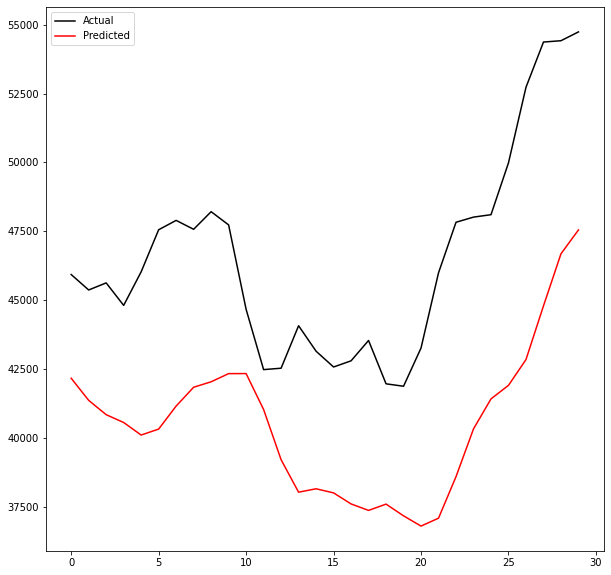

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int1_0.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 





In [39]:
# test runn of the interval1_ann_model_nextday()
interval1_ann_model_nextday(X, y)

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00247: early stopping
Training R-Squared: 0.9834575837378983

Testing R-Squared: 0.9826715425046095

30day Holdout R-Squared: 0.5287618444710656

30day Holdout MAE: 1986.3475260416667

30day Holdout MAPE: 4.118034840136788

30day Holdout RMSE: 2530.91374148851


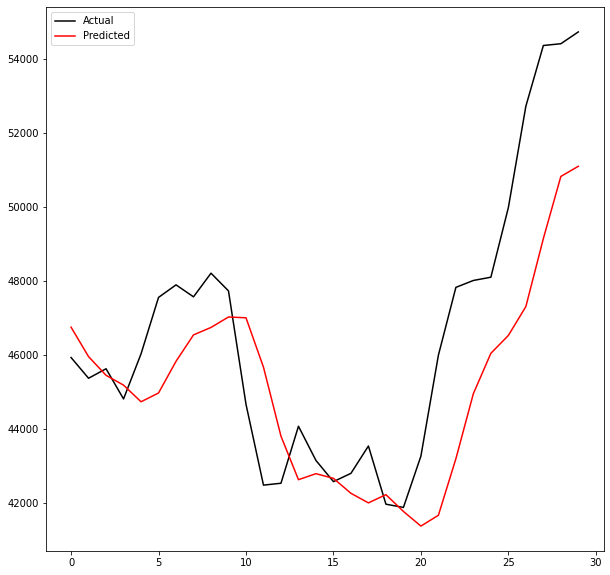

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01relu64Int1_0.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00360: early stopping
Training R-Squared: 0.9923005357868475

Testing R-Squared: 0.9877650432551771

30day Holdout R-Squared: -17.20294310125363

30day Holdout MAE: 15575.283528645834

30day Holdout MAPE: 33.3637363614654

30day Holdout RMSE: 15729.971141611562


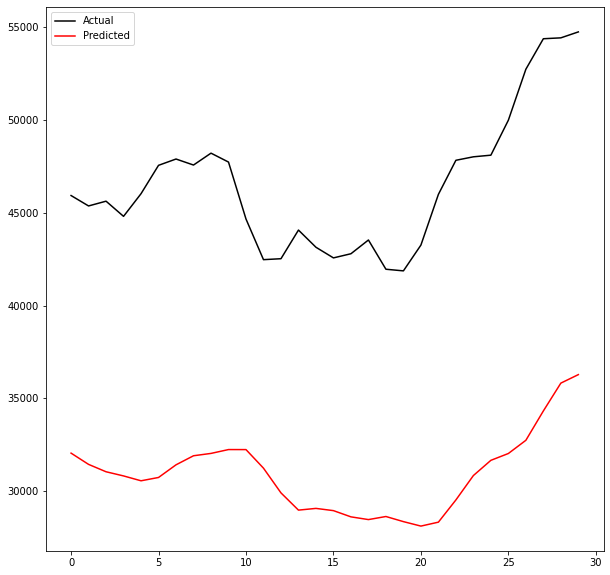

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01elu64Int1_1.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.535381902003283

Testing R-Squared: -3.335405285329344

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


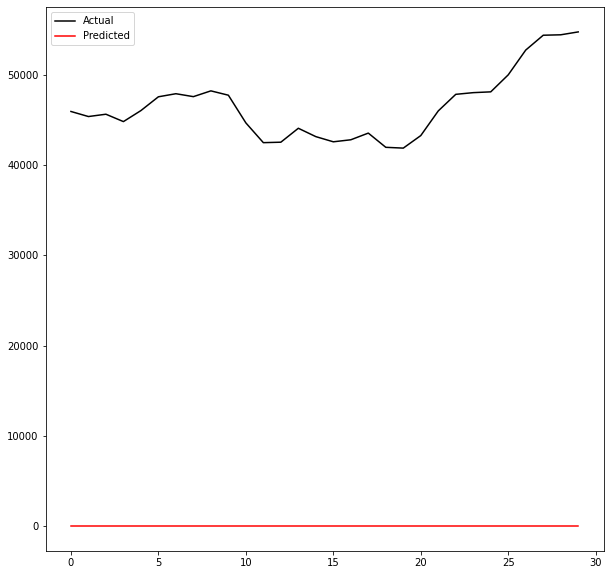

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001relu64Int1_2.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00151: early stopping
Training R-Squared: 0.988027806038288

Testing R-Squared: 0.9873113103417238

30day Holdout R-Squared: -36.175395084808954

30day Holdout MAE: 22344.001171875

30day Holdout MAPE: 47.93296808583544

30day Holdout RMSE: 22479.410413435842


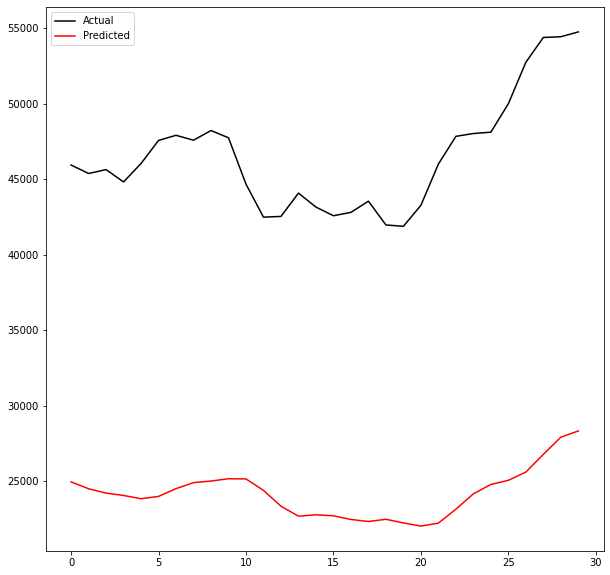

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001elu64Int1_3.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00523: early stopping
Training R-Squared: 0.9910862551807808

Testing R-Squared: 0.9893678716011498

30day Holdout R-Squared: -1.4829408972864053

30day Holdout MAE: 5415.757682291666

30day Holdout MAPE: 11.97219989525977

30day Holdout RMSE: 5809.520801145913


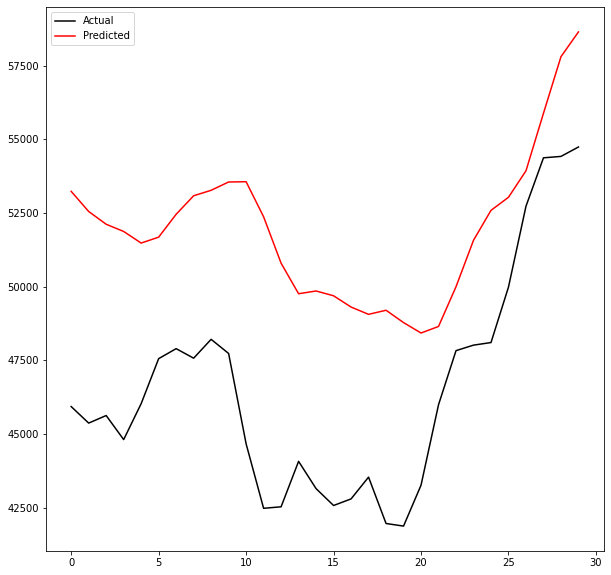

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001relu64Int1_4.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00496: early stopping
Training R-Squared: 0.989604892718439

Testing R-Squared: 0.9900656358936529

30day Holdout R-Squared: -15.732165401953704

30day Holdout MAE: 14869.298307291667

30day Holdout MAPE: 31.76735947262332

30day Holdout RMSE: 15081.106074031552


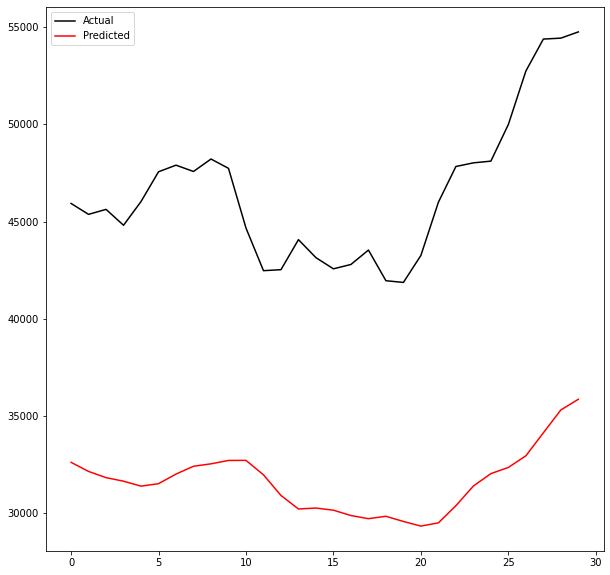

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001elu64Int1_5.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00190: early stopping
Training R-Squared: 0.9901731882229873

Testing R-Squared: 0.9885253159299314

30day Holdout R-Squared: -2.854742785869815

30day Holdout MAE: 6927.662760416667

30day Holdout MAPE: 14.697311457802611

30day Holdout RMSE: 7238.604062884878


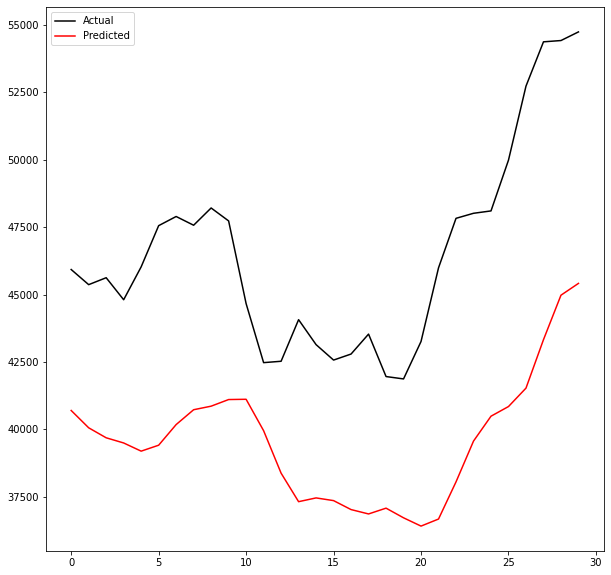

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int1_6.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00329: early stopping
Training R-Squared: 0.991952330279066

Testing R-Squared: 0.9902408719109407

30day Holdout R-Squared: -17.64128784741459

30day Holdout MAE: 15730.542903645834

30day Holdout MAPE: 33.65001520190604

30day Holdout RMSE: 15918.241029642488


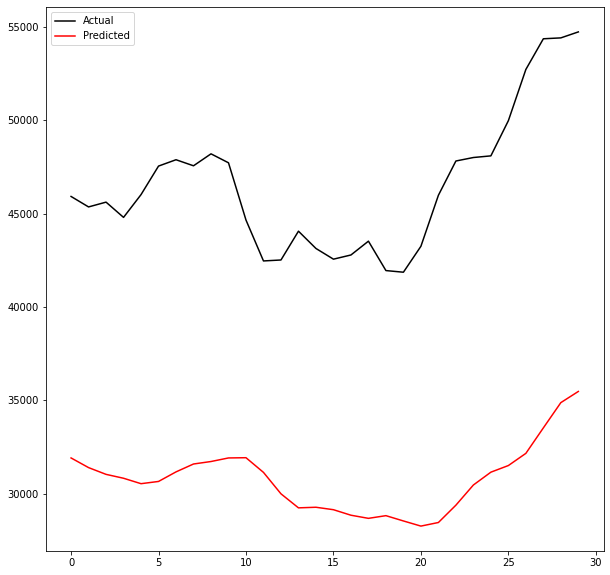

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01elu64Int1_7.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00702: early stopping
Training R-Squared: 0.9963302498334202

Testing R-Squared: 0.9879126527663965

30day Holdout R-Squared: -5.303722013579267

30day Holdout MAE: 8800.373177083333

30day Holdout MAPE: 18.609886553376285

30day Holdout RMSE: 9256.68844069773


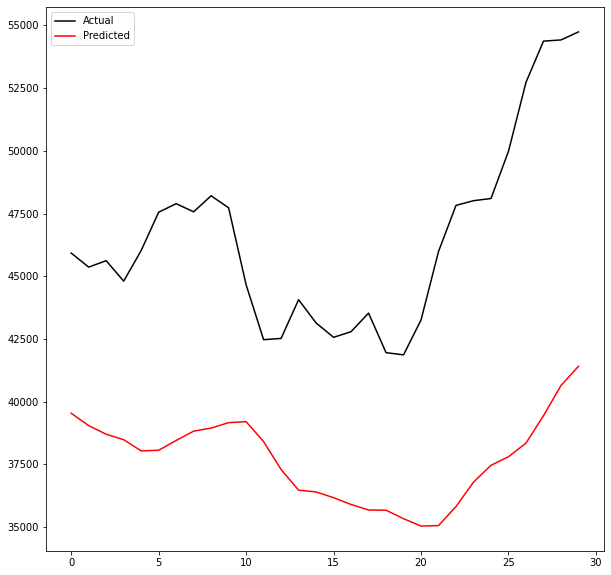

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001relu64Int1_8.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00185: early stopping
Training R-Squared: 0.9885247940073716

Testing R-Squared: 0.9879586846390488

30day Holdout R-Squared: -31.063312827086847

30day Holdout MAE: 20732.769075520835

30day Holdout MAPE: 44.45373313863234

30day Holdout RMSE: 20876.674320622125


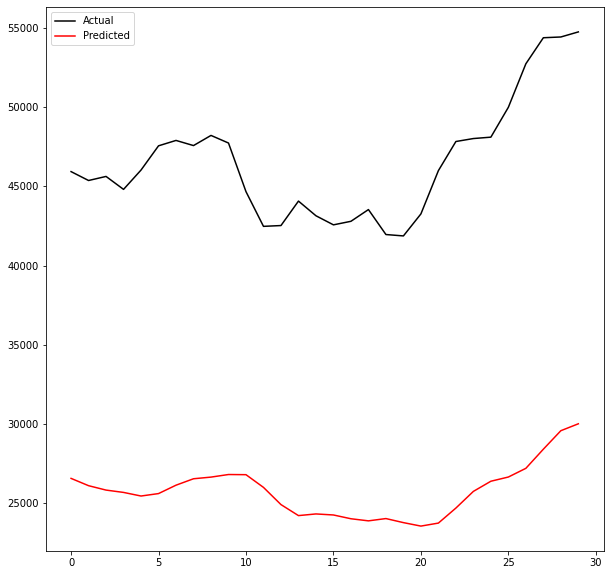

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001elu64Int1_9.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00477: early stopping
Training R-Squared: 0.9916931075839232

Testing R-Squared: 0.989787121577215

30day Holdout R-Squared: -1.1587384143365997

30day Holdout MAE: 4971.408984375

30day Holdout MAPE: 11.021111098673675

30day Holdout RMSE: 5416.978725654572


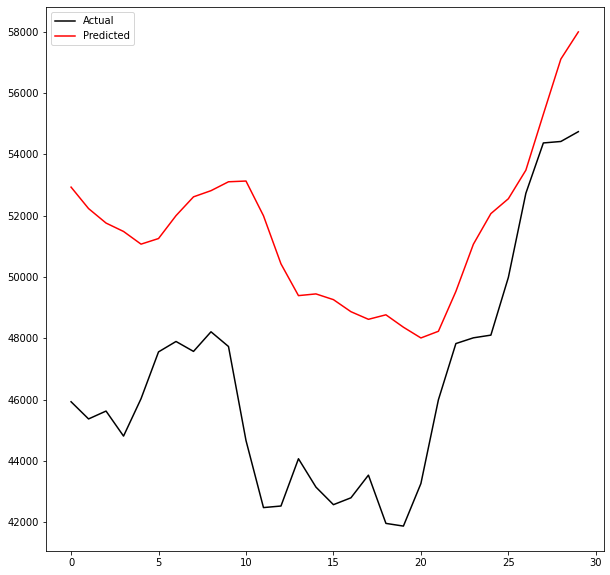

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001relu64Int1_10.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00290: early stopping
Training R-Squared: 0.98970895405205

Testing R-Squared: 0.9898464604592897

30day Holdout R-Squared: -30.56248188884463

30day Holdout MAE: 20562.564908854165

30day Holdout MAPE: 44.07846847905878

30day Holdout RMSE: 20712.985121038346


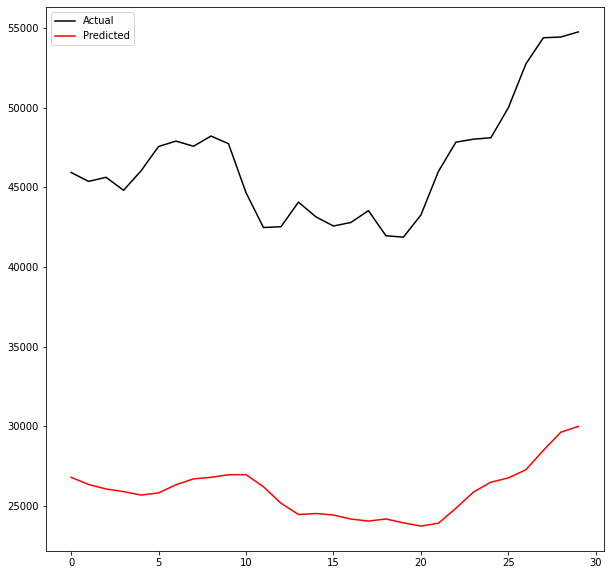

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001elu64Int1_11.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00233: early stopping
Training R-Squared: 0.9887844838226013

Testing R-Squared: 0.9853082606560611

30day Holdout R-Squared: -3.729002580889291

30day Holdout MAE: 7769.903515625

30day Holdout MAPE: 16.594506147373263

30day Holdout RMSE: 8017.5540353269025


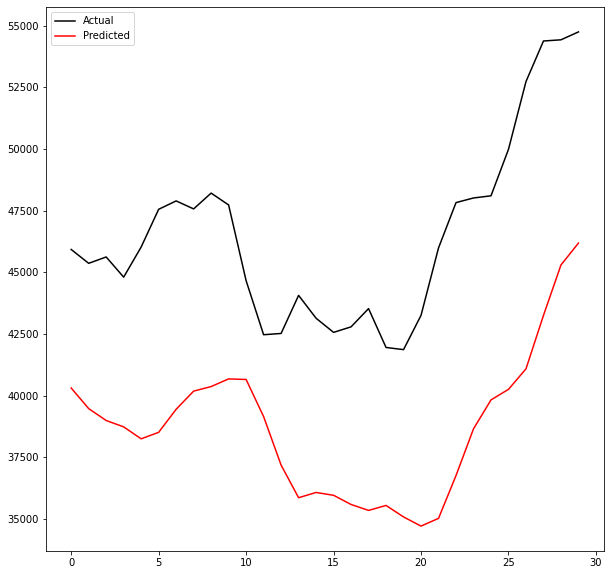

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01relu64Int1_12.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00305: early stopping
Training R-Squared: 0.9901744270747569

Testing R-Squared: 0.9866215358667875

30day Holdout R-Squared: -19.514811033310956

30day Holdout MAE: 16516.8900390625

30day Holdout MAPE: 35.34616803469624

30day Holdout RMSE: 16699.01598908959


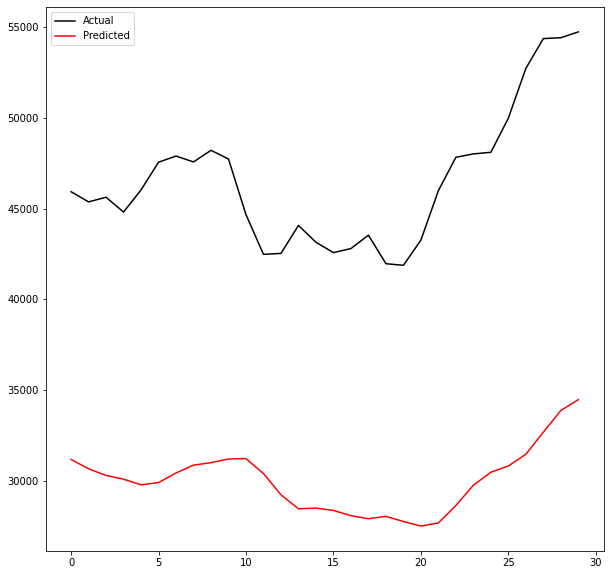

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01elu64Int1_13.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00284: early stopping
Training R-Squared: 0.9802667558743452

Testing R-Squared: 0.9779775354594448

30day Holdout R-Squared: 0.6463338267972937

30day Holdout MAE: 1803.2279947916666

30day Holdout MAPE: 3.8759659295799014

30day Holdout RMSE: 2192.5720908105595


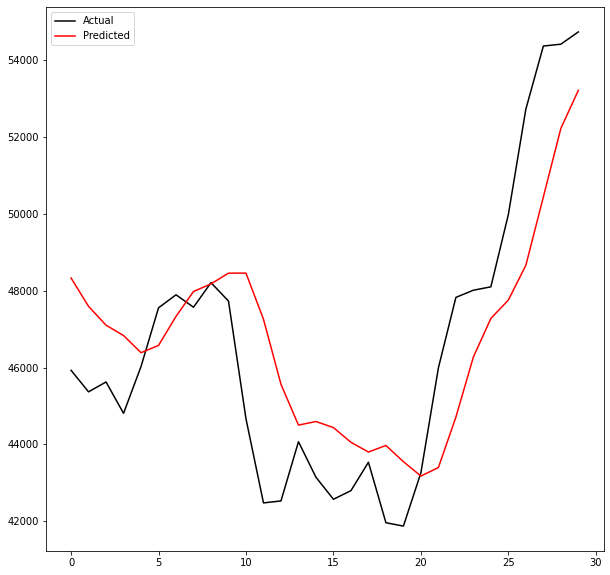

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001relu64Int1_14.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00330: early stopping
Training R-Squared: 0.9906706833835054

Testing R-Squared: 0.988365163613328

30day Holdout R-Squared: -31.966551945196834

30day Holdout MAE: 21024.10546875

30day Holdout MAPE: 45.0796276050179

30day Holdout RMSE: 21168.6851169748


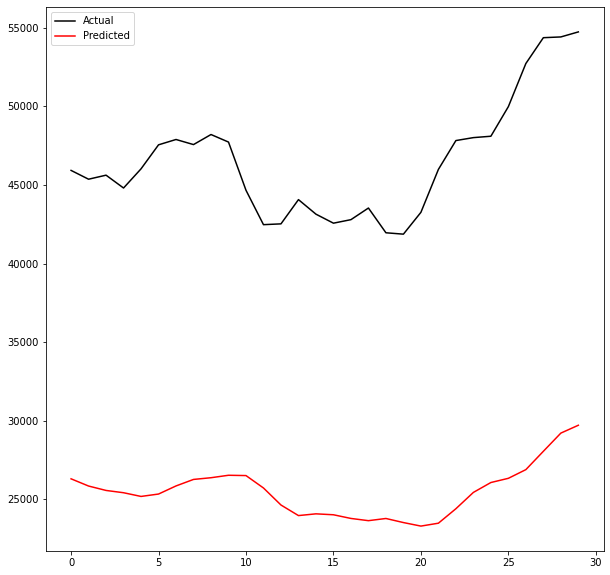

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001elu64Int1_15.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00548: early stopping
Training R-Squared: 0.9916208097853024

Testing R-Squared: 0.9884669765672612

30day Holdout R-Squared: -0.6077411949564382

30day Holdout MAE: 4159.709635416667

30day Holdout MAPE: 9.274211576713281

30day Holdout RMSE: 4674.823192418961


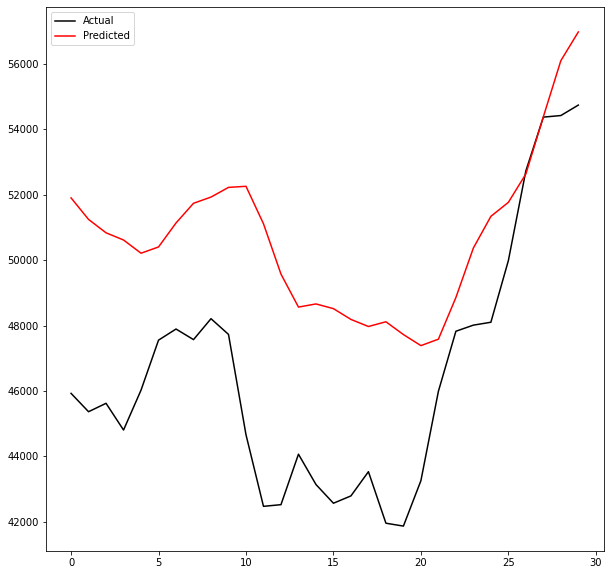

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001relu64Int1_16.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00502: early stopping
Training R-Squared: 0.9899658243277849

Testing R-Squared: 0.9899110162389295

30day Holdout R-Squared: -30.86983205571166

30day Holdout MAE: 20674.589518229168

30day Holdout MAPE: 44.33297651384356

30day Holdout RMSE: 20813.590586069895


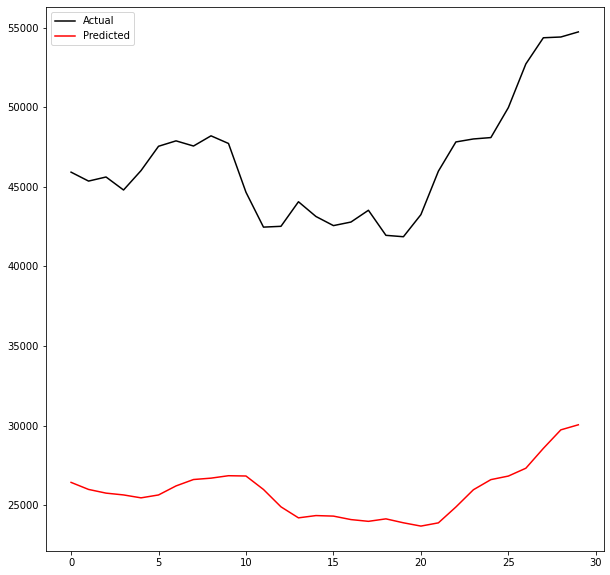

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001elu64Int1_17.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00288: early stopping
Training R-Squared: 0.9910175010225862

Testing R-Squared: 0.9891284914552052

30day Holdout R-Squared: -3.79005080877398

30day Holdout MAE: 7732.633072916667

30day Holdout MAPE: 16.404143099217762

30day Holdout RMSE: 8069.138690940326


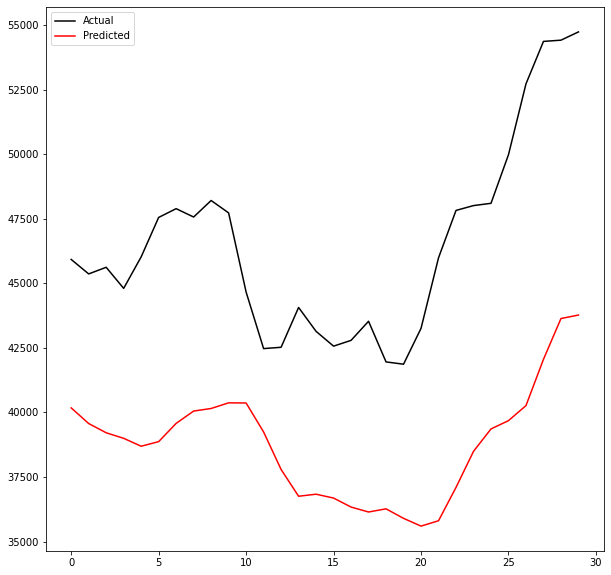

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01relu64Int1_18.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00317: early stopping
Training R-Squared: 0.9918263210952084

Testing R-Squared: 0.9891524229138637

30day Holdout R-Squared: -15.387128968428005

30day Holdout MAE: 14789.230859375

30day Holdout MAPE: 31.750680734288007

30day Holdout RMSE: 14924.801231620731


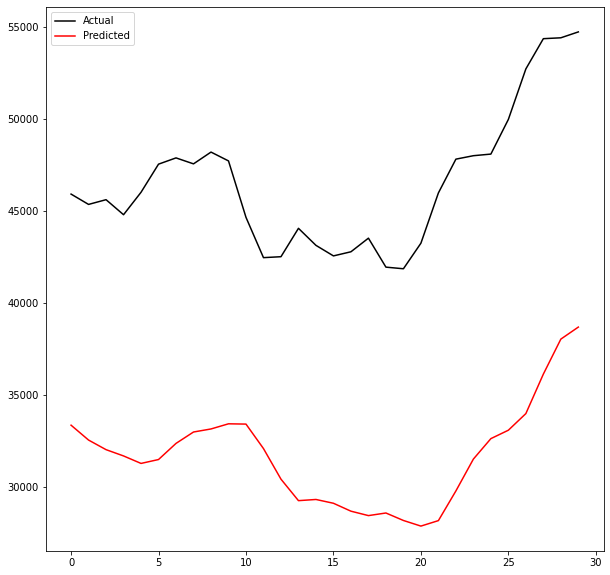

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01elu64Int1_19.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00712: early stopping
Training R-Squared: 0.9967499381433422

Testing R-Squared: 0.9881297008605766

30day Holdout R-Squared: -4.229940435840203

30day Holdout MAE: 8046.945572916667

30day Holdout MAPE: 17.04353376652582

30day Holdout RMSE: 8431.512562380023


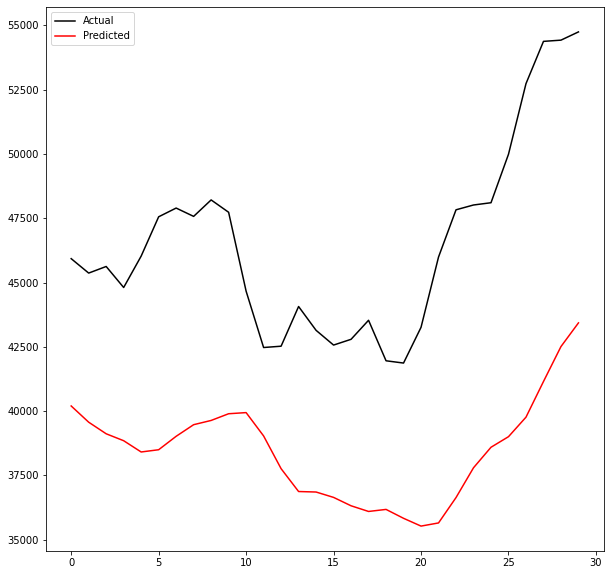

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001relu64Int1_20.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00224: early stopping
Training R-Squared: 0.9897985001160069

Testing R-Squared: 0.988212268642528

30day Holdout R-Squared: -24.999813290544946

30day Holdout MAE: 18638.444661458332

30day Holdout MAPE: 39.92782059146391

30day Holdout RMSE: 18799.324079226382


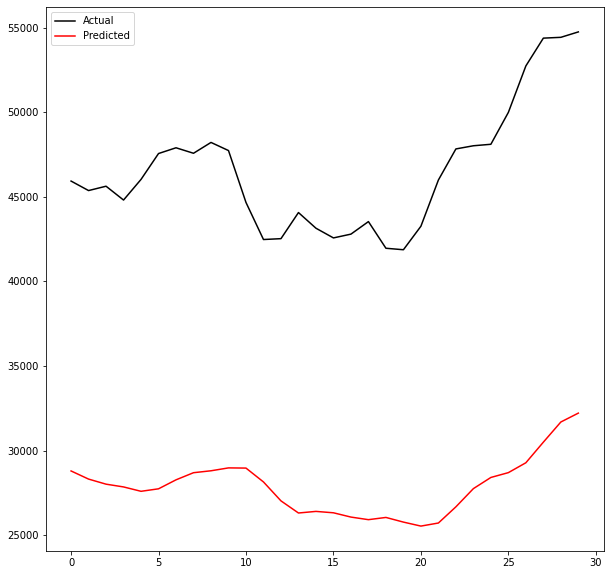

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001elu64Int1_21.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00443: early stopping
Training R-Squared: 0.9933917278223772

Testing R-Squared: 0.9896059993145474

30day Holdout R-Squared: 0.034907845881018695

30day Holdout MAE: 3079.3630208333334

30day Holdout MAPE: 6.898641789840668

30day Holdout RMSE: 3621.9421759963802


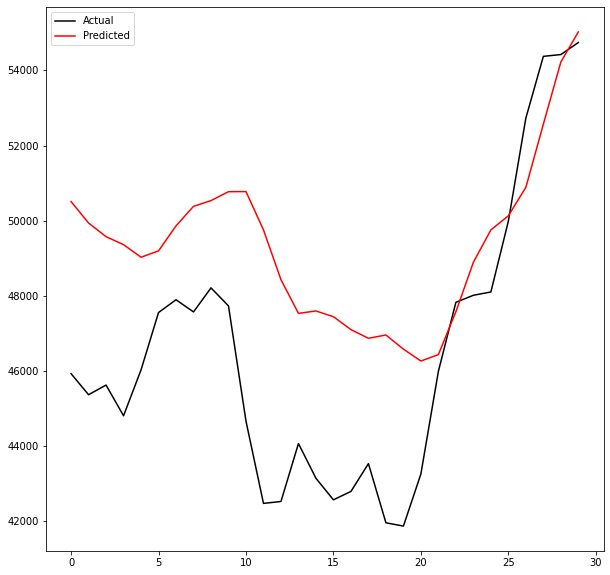

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001relu64Int1_22.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00468: early stopping
Training R-Squared: 0.9899614741019565

Testing R-Squared: 0.9897994890764937

30day Holdout R-Squared: -44.803868811921646

30day Holdout MAE: 24828.365234375

30day Holdout MAPE: 53.29728632478891

30day Holdout RMSE: 24952.16313507065


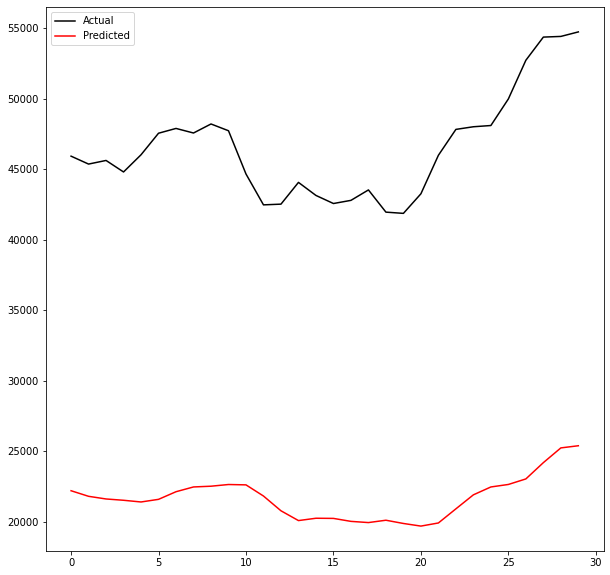

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001elu64Int1_23.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00370: early stopping
Training R-Squared: 0.9922758698153673

Testing R-Squared: 0.987490562529924

30day Holdout R-Squared: -3.5807592812840836

30day Holdout MAE: 7557.085546875

30day Holdout MAPE: 16.02871540486614

30day Holdout RMSE: 7890.887563120959


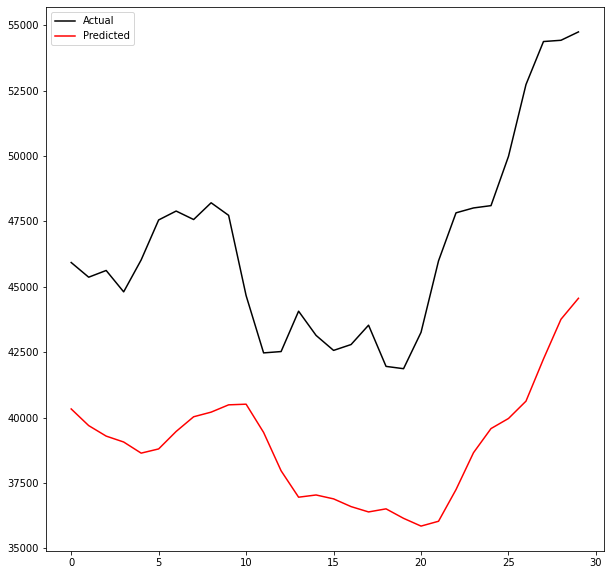

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01relu64Int1_24.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00227: early stopping
Training R-Squared: 0.9889097795386308

Testing R-Squared: 0.9878196308715449

30day Holdout R-Squared: -47.30129142336385

30day Holdout MAE: 25468.606380208334

30day Holdout MAPE: 54.62435076045603

30day Holdout RMSE: 25623.384368786956


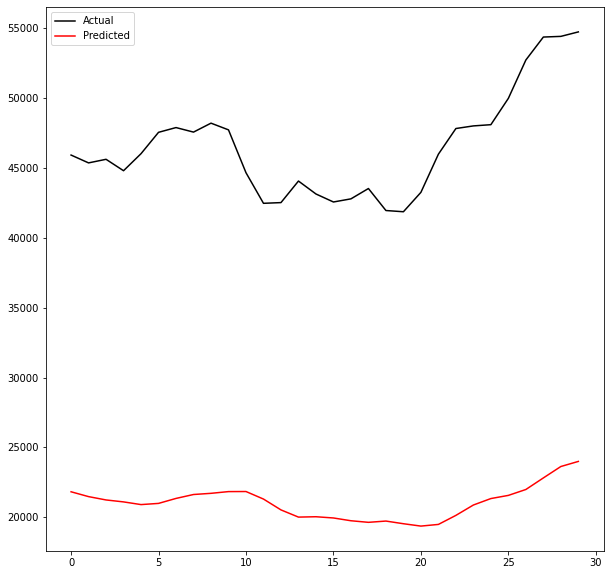

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01elu64Int1_25.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00204: early stopping
Training R-Squared: 0.9803336452435263

Testing R-Squared: 0.9764325923230918

30day Holdout R-Squared: -1.2410852217393948

30day Holdout MAE: 5067.456640625

30day Holdout MAPE: 10.664843498441872

30day Holdout RMSE: 5519.329297300671


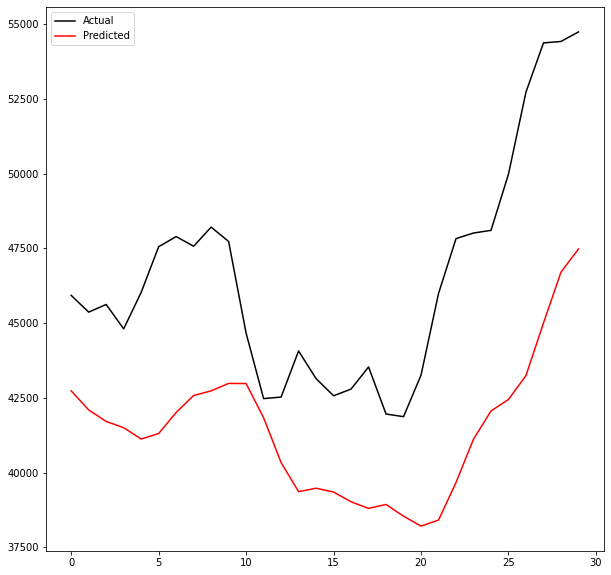

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001relu64Int1_26.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00323: early stopping
Training R-Squared: 0.9914655569195346

Testing R-Squared: 0.9899729870293239

30day Holdout R-Squared: -39.94258776756253

30day Holdout MAE: 23437.305078125

30day Holdout MAPE: 50.25349133520138

30day Holdout RMSE: 23590.913838038956


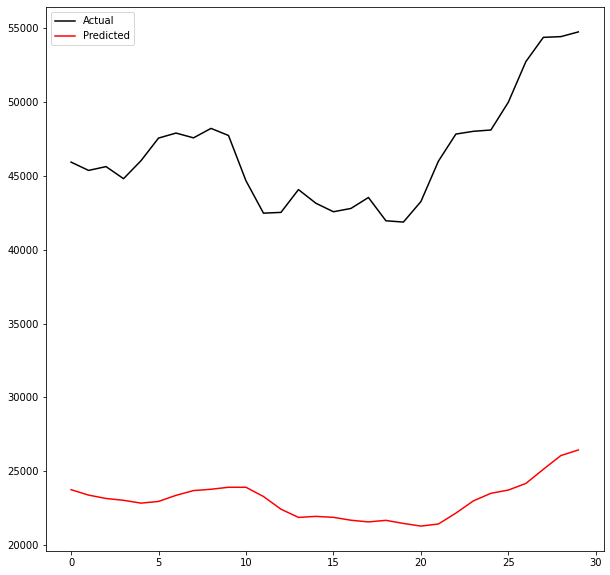

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001elu64Int1_27.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01122: early stopping
Training R-Squared: 0.9957062035030344

Testing R-Squared: 0.9882587274217693

30day Holdout R-Squared: 0.2856642635624098

30day Holdout MAE: 2683.0904947916665

30day Holdout MAPE: 5.96251836057694

30day Holdout RMSE: 3116.07791807075


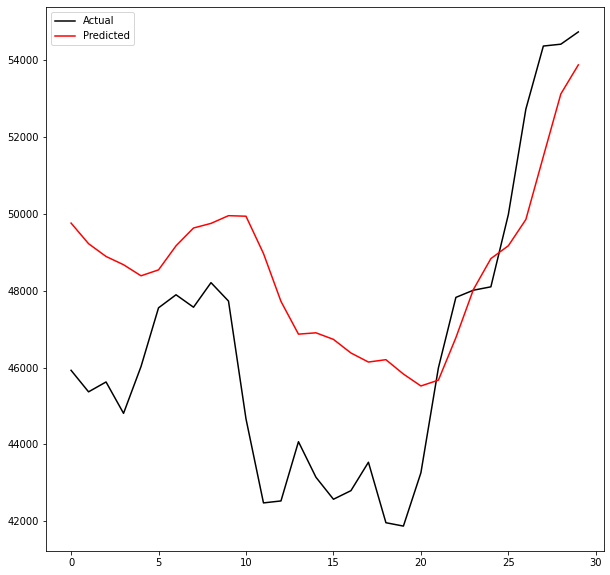

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001relu64Int1_28.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00496: early stopping
Training R-Squared: 0.9900194396528761

Testing R-Squared: 0.989474307676764

30day Holdout R-Squared: -44.01844263499318

30day Holdout MAE: 24597.1349609375

30day Holdout MAPE: 52.770532569503615

30day Holdout RMSE: 24737.30327998436


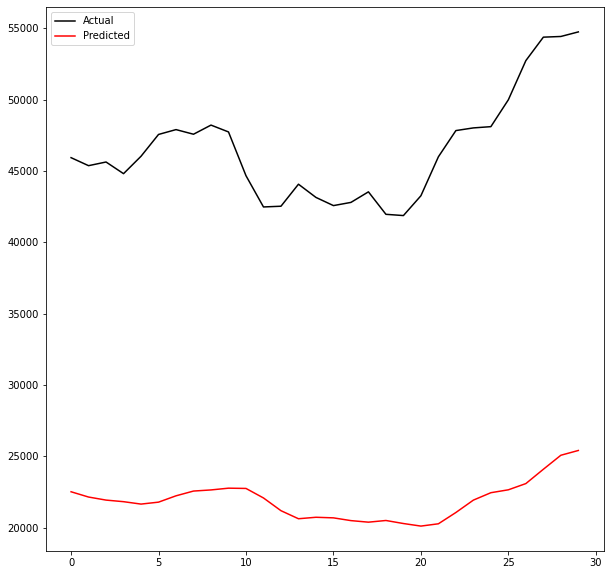

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001elu64Int1_29.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00292: early stopping
Training R-Squared: 0.9714113257893823

Testing R-Squared: 0.9697444935376394

30day Holdout R-Squared: 0.15485812961447676

30day Holdout MAE: 2732.3294270833335

30day Holdout MAPE: 5.6374246482768084

30day Holdout RMSE: 3389.3930078895155


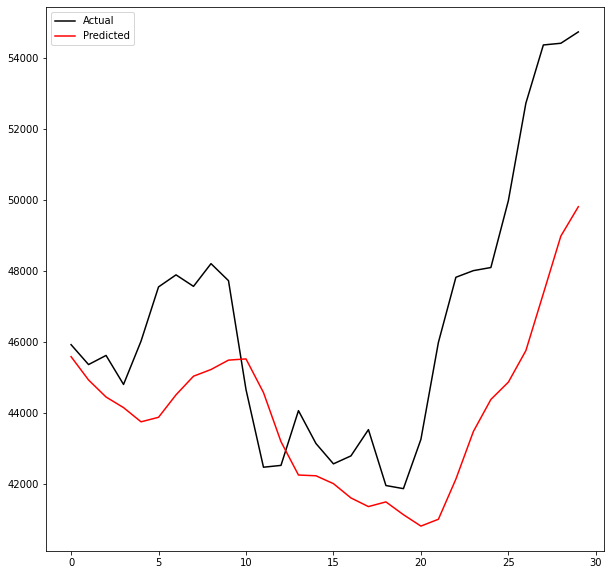

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01relu64Int1_30.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00420: early stopping
Training R-Squared: 0.9877502729261233

Testing R-Squared: 0.9829712832124297

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


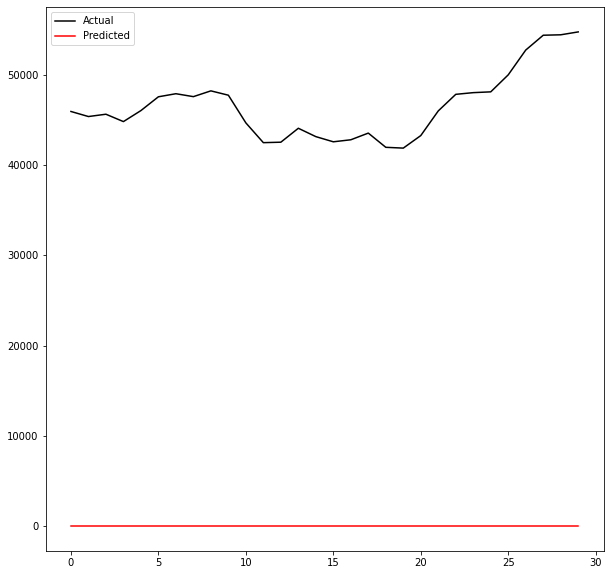

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01elu64Int1_31.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00351: early stopping
Training R-Squared: 0.964191830746128

Testing R-Squared: 0.965051124535557

30day Holdout R-Squared: 0.17515872724963077

30day Holdout MAE: 2839.169010416667

30day Holdout MAPE: 6.340768483248876

30day Holdout RMSE: 3348.438385640146


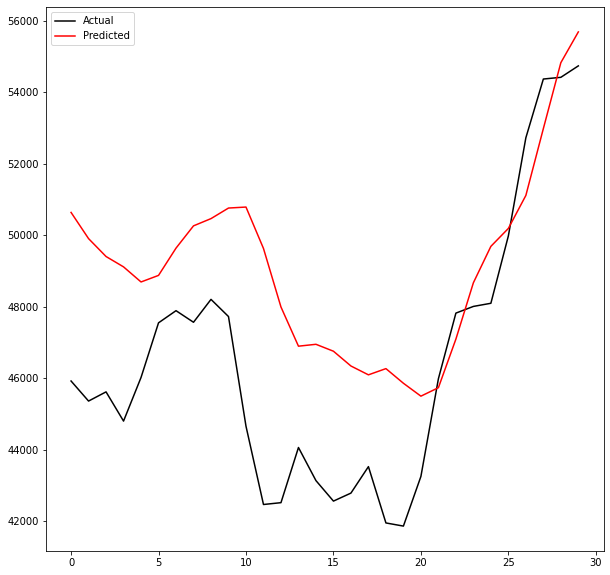

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001relu64Int1_32.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00330: early stopping
Training R-Squared: 0.9887159411325621

Testing R-Squared: 0.9885815798093307

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


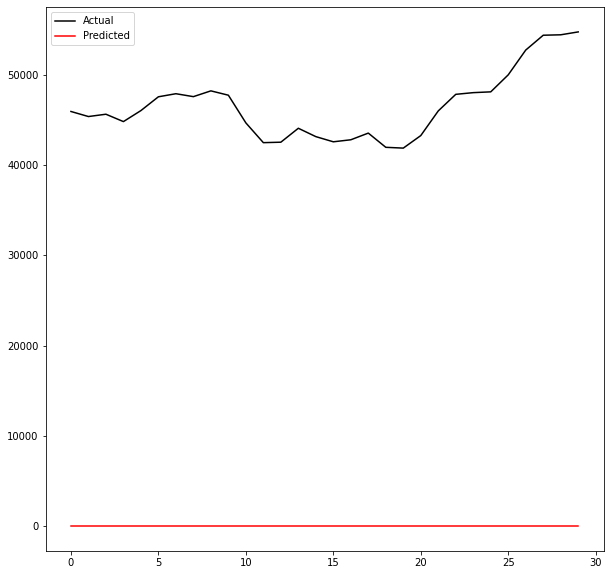

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001elu64Int1_33.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.535381902003283

Testing R-Squared: -3.335405285329344

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


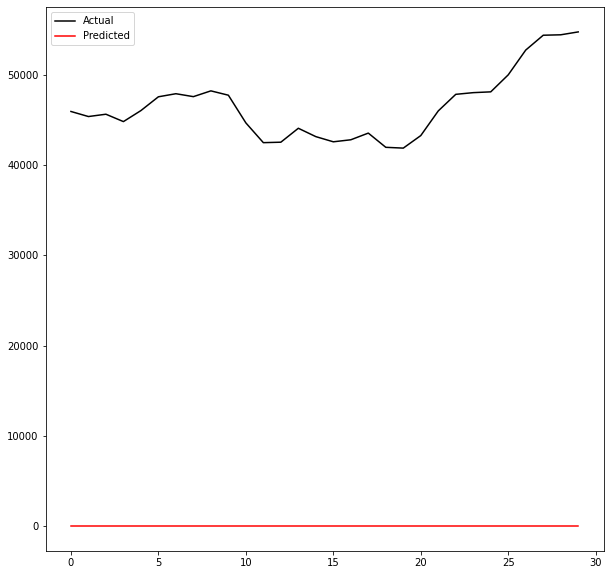

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001relu64Int1_34.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00530: early stopping
Training R-Squared: 0.9890095948163398

Testing R-Squared: 0.9899281271979898

30day Holdout R-Squared: -20.340299895189254

30day Holdout MAE: 16858.614518229166

30day Holdout MAPE: 36.0842833410719

30day Holdout RMSE: 17031.67570391973


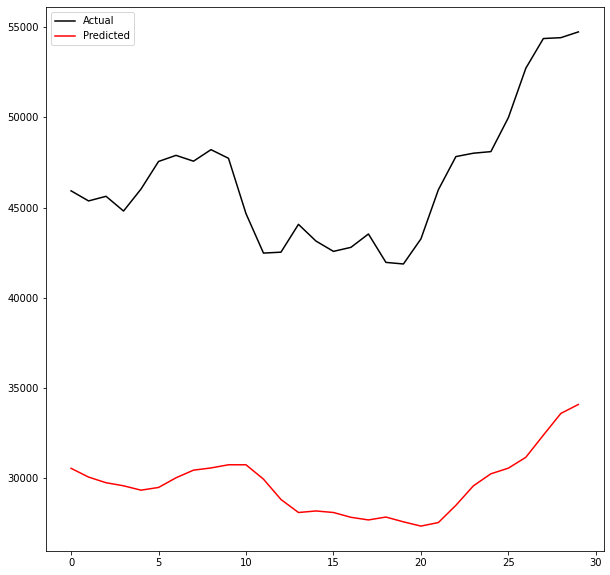

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001elu64Int1_35.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.535381902003283

Testing R-Squared: -3.335405285329344

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


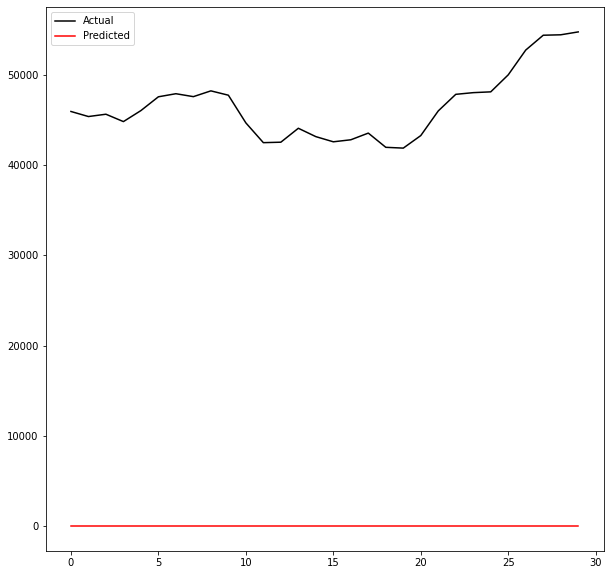

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01relu64Int1_36.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00243: early stopping
Training R-Squared: 0.9794527042508152

Testing R-Squared: 0.9797824234171633

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


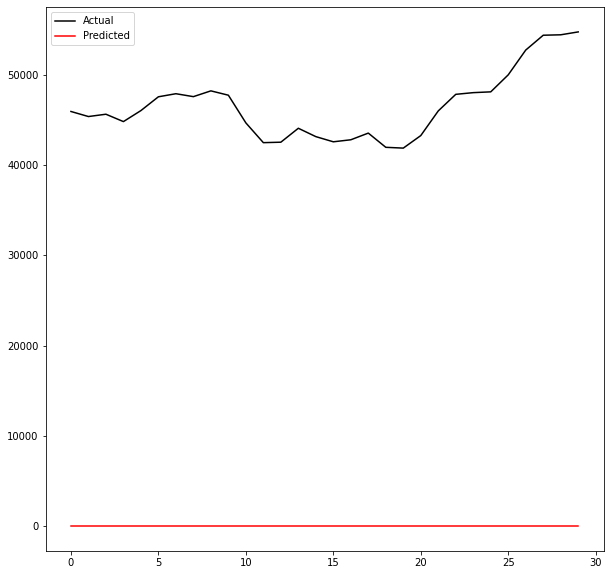

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01elu64Int1_37.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00537: early stopping
Training R-Squared: 0.977256196839661

Testing R-Squared: 0.9699667888493775

30day Holdout R-Squared: -7.920115670098257

30day Holdout MAE: 10713.688671875

30day Holdout MAPE: 22.783386601058762

30day Holdout RMSE: 11011.395537616305


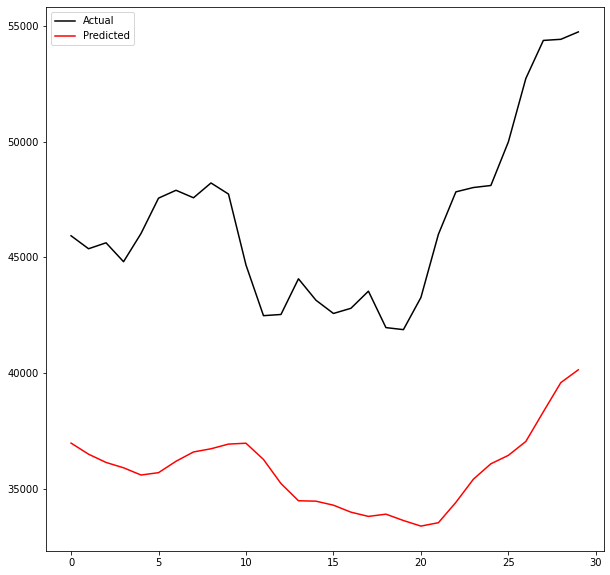

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001relu64Int1_38.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00472: early stopping
Training R-Squared: 0.9901533636579565

Testing R-Squared: 0.9886527835947294

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


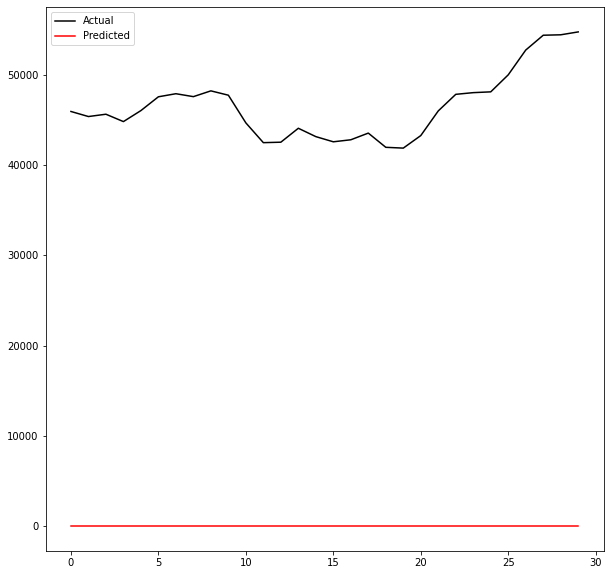

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001elu64Int1_39.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00493: early stopping
Training R-Squared: 0.9912725654509965

Testing R-Squared: 0.9891840826418365

30day Holdout R-Squared: -0.05838877981099433

30day Holdout MAE: 3277.50078125

30day Holdout MAPE: 7.320567054956539

30day Holdout RMSE: 3792.9728466063366


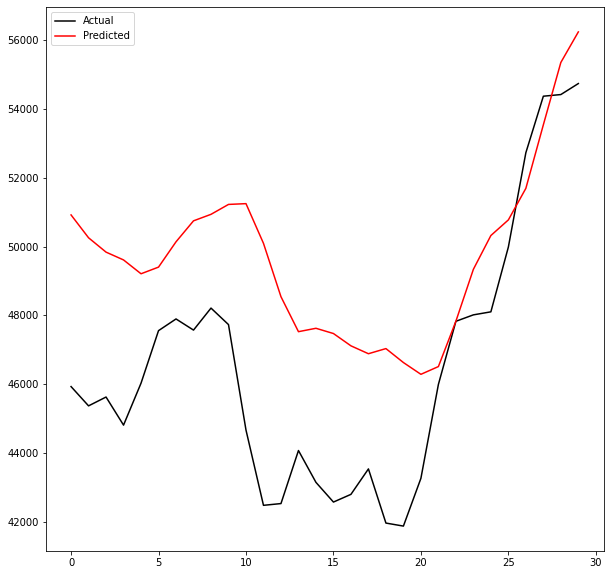

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int1_40.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00375: early stopping
Training R-Squared: 0.9898149547215606

Testing R-Squared: 0.9897271028879472

30day Holdout R-Squared: -25.274837748366817

30day Holdout MAE: 18735.990299479166

30day Holdout MAPE: 40.132612419878406

30day Holdout RMSE: 18898.491580608323


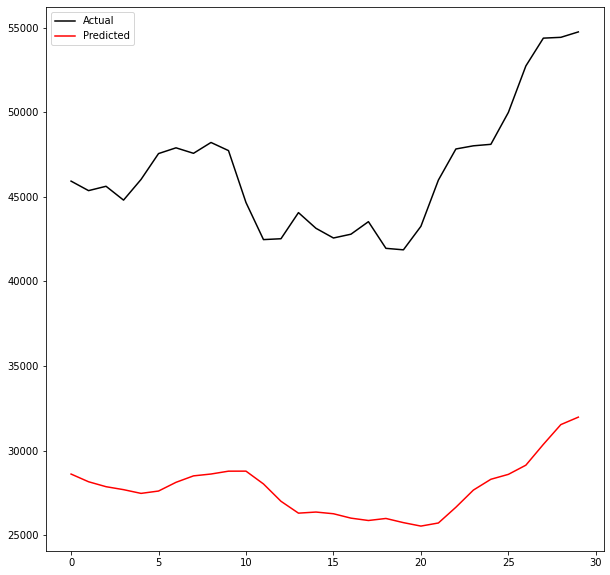

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001elu64Int1_41.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00634: early stopping
Training R-Squared: 0.9794863989033583

Testing R-Squared: 0.9757277412287879

30day Holdout R-Squared: -4.518525804418772

30day Holdout MAE: 8402.381510416666

30day Holdout MAPE: 18.43432829656022

30day Holdout RMSE: 8661.012370330218


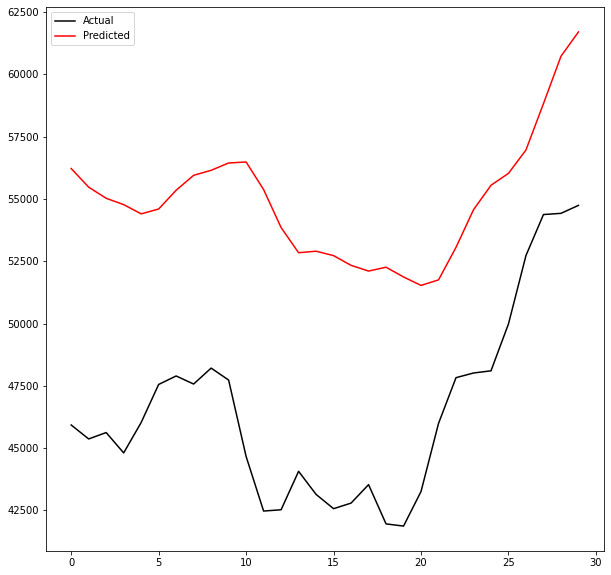

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01relu64Int1_42.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.554380492678127

Testing R-Squared: -3.3489910925961004

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


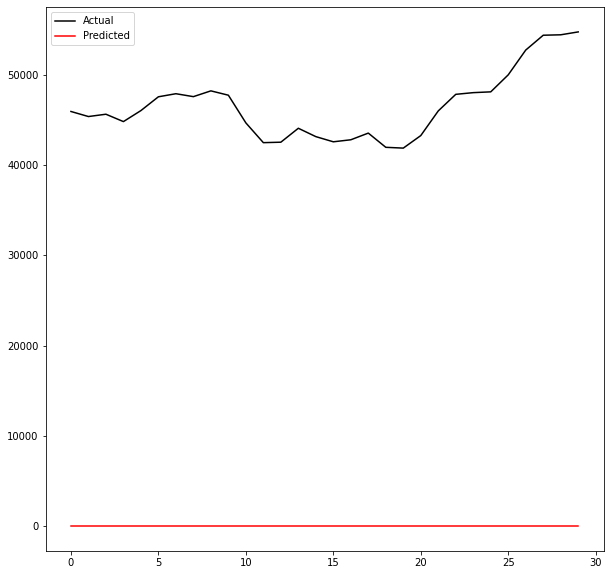

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01elu64Int1_43.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00216: early stopping
Training R-Squared: 0.9287973340338286

Testing R-Squared: 0.9278718062019712

30day Holdout R-Squared: -0.6287896794690757

30day Holdout MAE: 3997.8830729166666

30day Holdout MAPE: 8.274898997594068

30day Holdout RMSE: 4705.324985694525


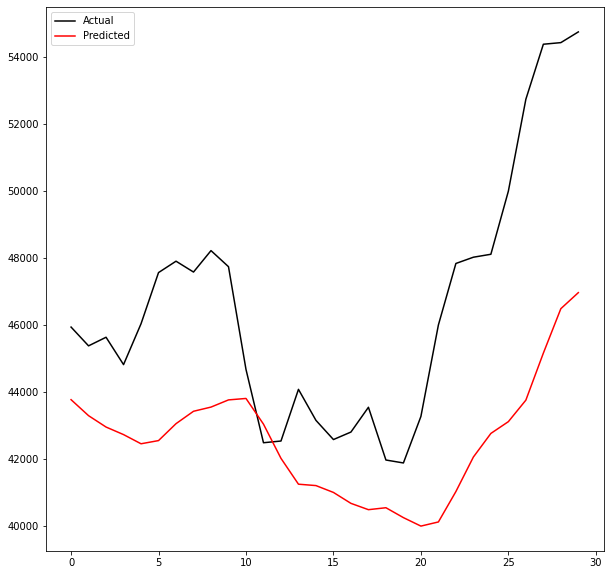

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001relu64Int1_44.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00360: early stopping
Training R-Squared: 0.9880854635529709

Testing R-Squared: 0.9866429906273495

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


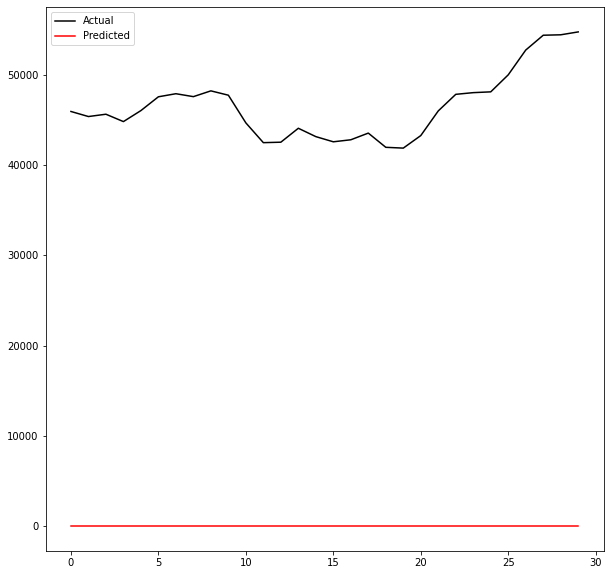

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001elu64Int1_45.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00714: early stopping
Training R-Squared: 0.9893531114002914

Testing R-Squared: 0.9867283735402106

30day Holdout R-Squared: 0.49899570616744615

30day Holdout MAE: 2206.6701822916666

30day Holdout MAPE: 4.891871520273776

30day Holdout RMSE: 2609.623436755681


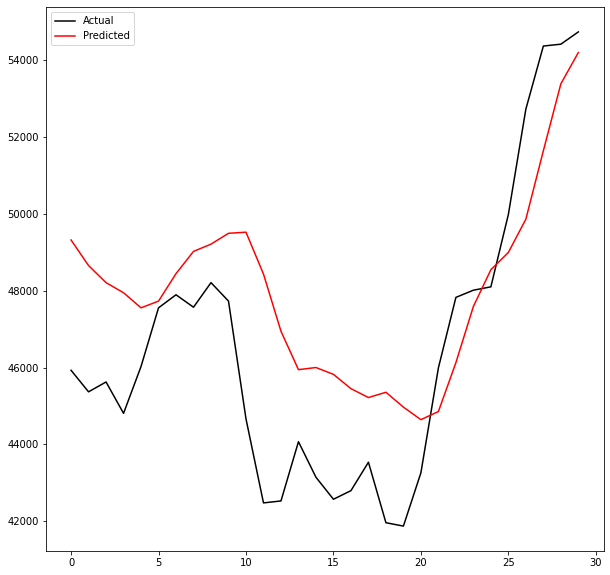

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001relu64Int1_46.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00402: early stopping
Training R-Squared: 0.9900362570260184

Testing R-Squared: 0.9897562219361256

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


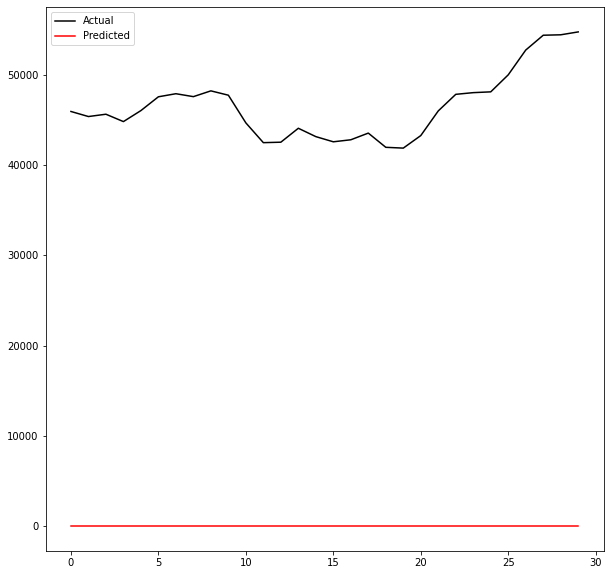

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001elu64Int1_47.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.535381902003283

Testing R-Squared: -3.335405285329344

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


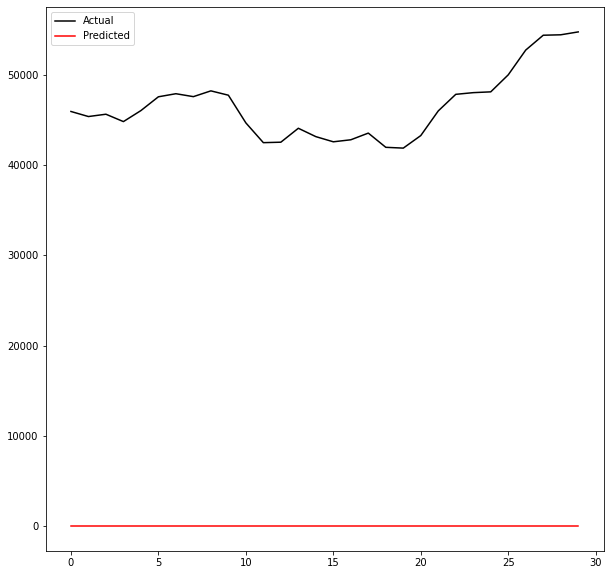

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01relu64Int1_48.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00519: early stopping
Training R-Squared: 0.9798285728263213

Testing R-Squared: 0.9654695378691173

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


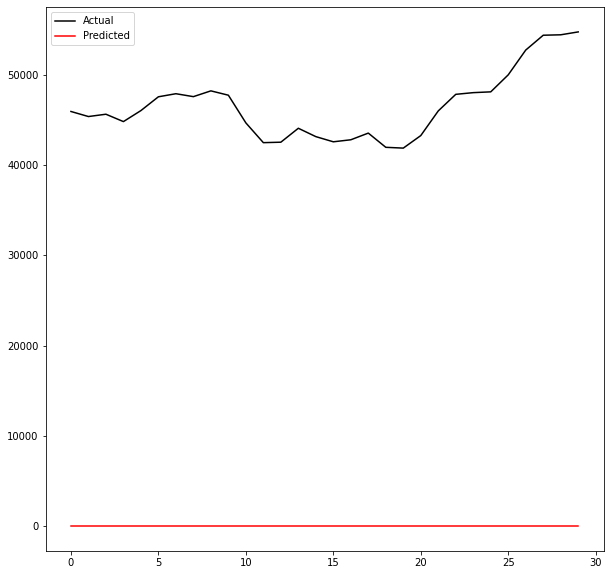

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01elu64Int1_49.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00759: early stopping
Training R-Squared: 0.9712738979479851

Testing R-Squared: 0.9629178733002034

30day Holdout R-Squared: -10.2732484151033

30day Holdout MAE: 12074.657096354167

30day Holdout MAPE: 25.678186500723765

30day Holdout RMSE: 12378.88871367304


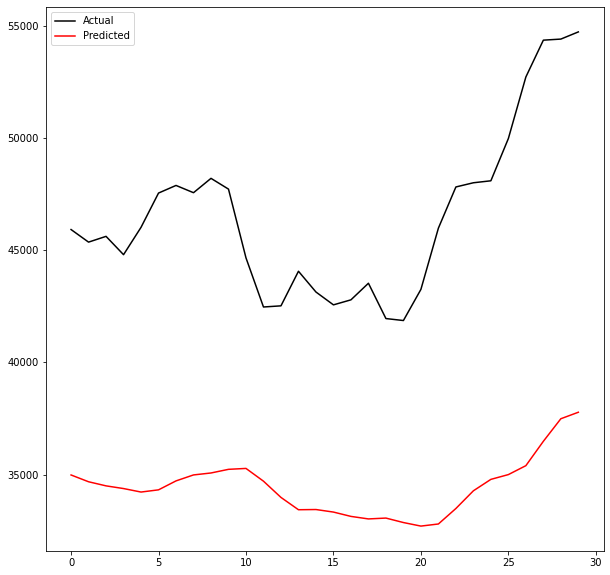

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001relu64Int1_50.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00259: early stopping
Training R-Squared: 0.9740681559569436

Testing R-Squared: 0.9729203232045784

30day Holdout R-Squared: -35.805686555457854

30day Holdout MAE: 22215.602864583332

30day Holdout MAPE: 47.63337001771318

30day Holdout RMSE: 22367.352479804274


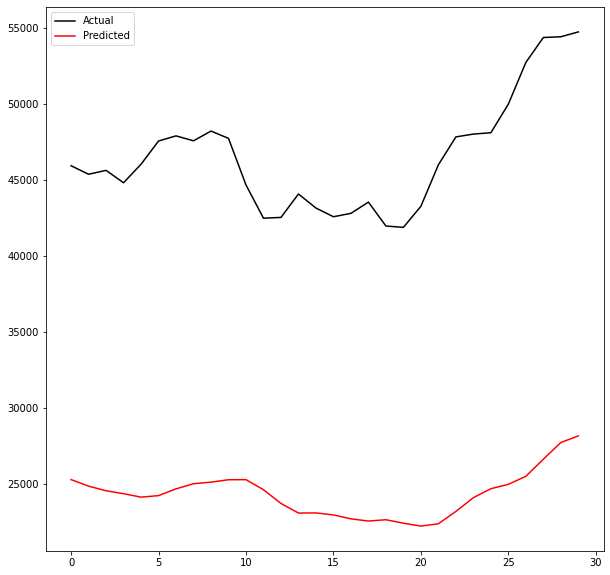

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001elu64Int1_51.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.535381902003283

Testing R-Squared: -3.335405285329344

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


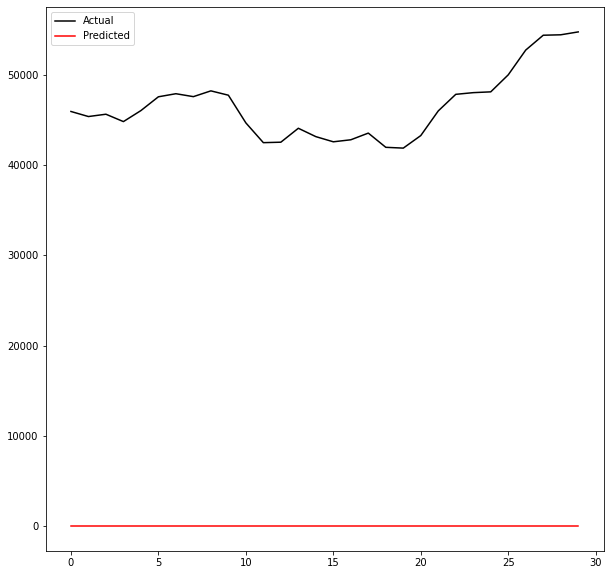

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001relu64Int1_52.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00346: early stopping
Training R-Squared: 0.9895566584251679

Testing R-Squared: 0.9890864461123969

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


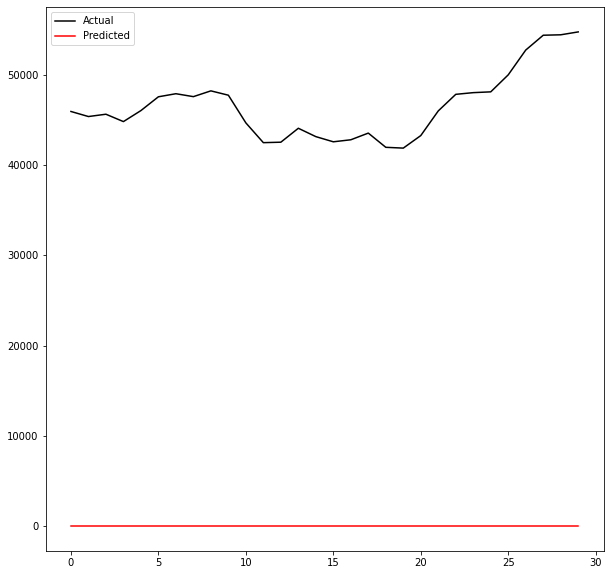

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001elu64Int1_53.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00431: early stopping
Training R-Squared: 0.9831424511389997

Testing R-Squared: 0.9823799979326158

30day Holdout R-Squared: -1.4616783326929612

30day Holdout MAE: 5296.861979166667

30day Holdout MAPE: 11.124970543595786

30day Holdout RMSE: 5784.592519356952


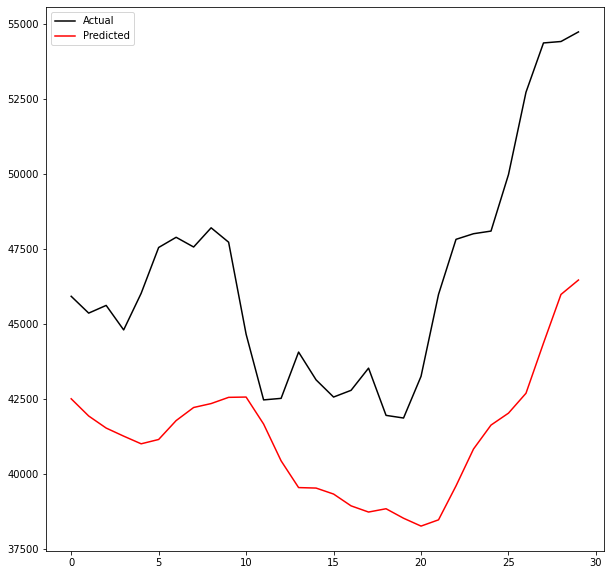

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01relu64Int1_54.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00382: early stopping
Training R-Squared: 0.9896569652499492

Testing R-Squared: 0.9832940504715646

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


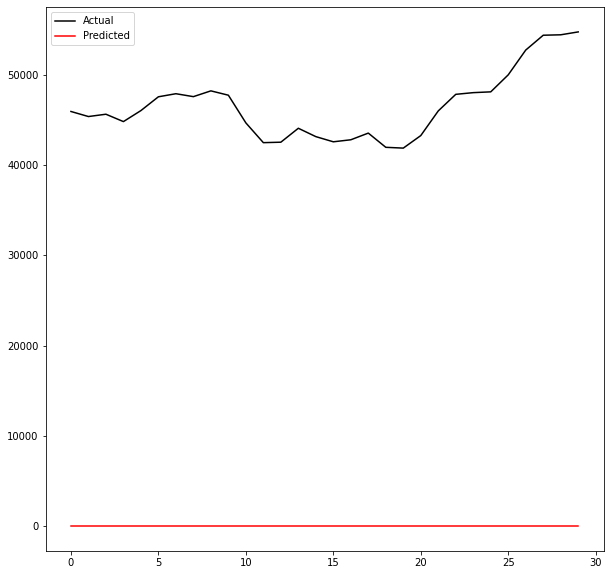

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01elu64Int1_55.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00834: early stopping
Training R-Squared: 0.9845847190680439

Testing R-Squared: 0.9778030185160778

30day Holdout R-Squared: -29.878081363831697

30day Holdout MAE: 20230.3701171875

30day Holdout MAPE: 43.227494873867464

30day Holdout RMSE: 20487.18427097568


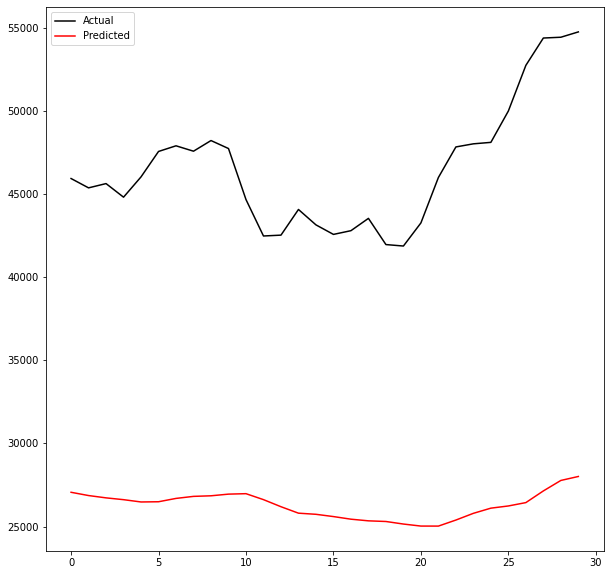

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001relu64Int1_56.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00487: early stopping
Training R-Squared: 0.9932185008730301

Testing R-Squared: 0.9897969709495413

30day Holdout R-Squared: -119.95326498627274

30day Holdout MAE: 40439.86228841146

30day Holdout MAPE: 86.96206106460359

30day Holdout RMSE: 40547.671384420864


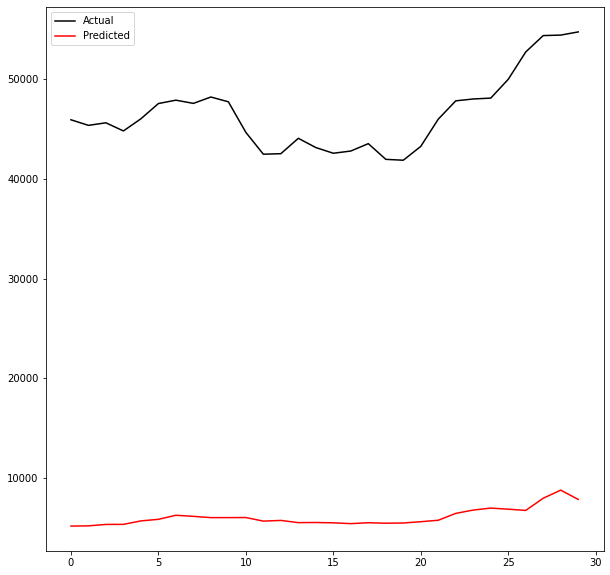

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001elu64Int1_57.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.535381902003283

Testing R-Squared: -3.335405285329344

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


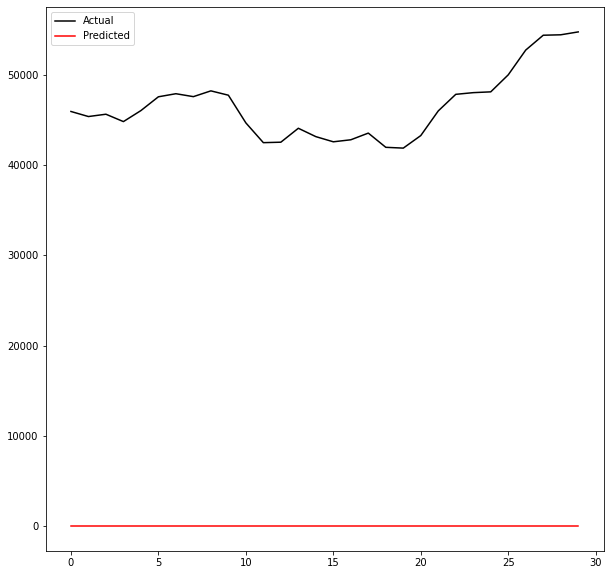

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001relu64Int1_58.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00239: early stopping
Training R-Squared: 0.9895893768781829

Testing R-Squared: 0.9893054564470873

30day Holdout R-Squared: -97.58311493895343

30day Holdout MAE: 36499.822102864586

30day Holdout MAPE: 78.4721059517748

30day Holdout RMSE: 36606.51525349939


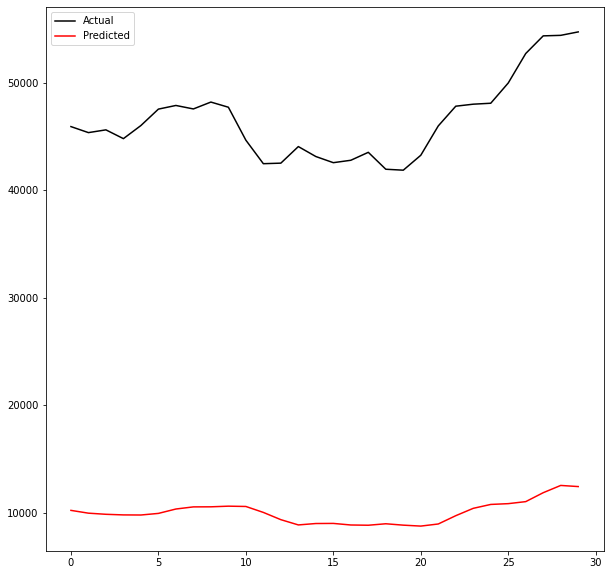

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001elu64Int1_59.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 





In [40]:
opt_list = ['Adam', 'RMSprop']
activation_list = ['relu', 'elu']
neuron_list = [200, 300, 400, 500, 600]
lr_list = [0.01, 0.001, 0.0001]

count = 0

for op in opt_list:
    for neuron in neuron_list:
        for l in lr_list:
            for act in activation_list:
                interval1_ann_model_nextday(X, y, lr=l, activation=act,
                                            neurons=neuron, opt=op, batch_size=64, epochs=5000, count=count)
                count+=1

## ANN Model for Interval 2

In [41]:
# double check that the X df has only feature columns and Date as the first column
X.columns

Index(['Date', 'median_transaction_fee30trxUSD',
       'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx',
       'transactions', 'price30wmaUSD', 'price3wmaUSD', 'price7wmaUSD',
       'median_transaction_fee7rocUSD', 'difficulty30rsi'],
      dtype='object')

In [42]:
# double check y and X have same number of rows
y.shape, X.shape

((4102,), (4102, 11))

In [43]:
# create a 4 hidden layer model function for testing hyperparameters

def interval2_ann_model_nextday(X, y, lr=0.01, neurons=300, activation='relu', opt='Adam', batch_size=64, epochs=5000, count=0):
    ''' 
        X is a dataframe of the dates and features using non-standardized values
        The Date column must be the first column in the X dataframe
        y is a dataframe or 1D array of the target values
    '''
    # assign the string values to variables for file naming later in the Checkpoint
    opt_name = opt
    acti = activation
    # remove the . in the learning rate
    learn_rt = re.sub('\.', '-', str(lr))
    
    # create a holdout series of the last 30 days of data
    X_holdout = X.iloc[-30:, 1:] # exclude the first column which is the date column
    y_holdout = y[-30:]
    
    # extract the data from the dates of Interval 2
    date_bool = (X.iloc[:, 0] >= '2013/04/01') & (X.iloc[:, 0] <= '2017/04/01')
    X = X[date_bool]
    # remove the date column
    X = X.iloc[:, 1:]
    # adjust the range of y df
    y = y[X.index]
    
    # create train test split of data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=15)
    
    # scale the data
    estimators = [] # create a list for the scalers
    estimators.append(['minmax', MinMaxScaler()])
    estimators.append(['robust', RobustScaler()])
    # add the scalers to the Pipeline
    scale = Pipeline(estimators, verbose=True)
    # fit the scaler to the training data
    scale.fit(X_train)
    # transform the training, testing, and holdout data
    X_train = scale.transform(X_train)
    X_test = scale.transform(X_test)
    X_holdout = scale.transform(X_holdout)
    
        
    # define the shape of the input number of features
    shape = X_train.shape[1]
    # create call backs to save the model after each epoch if it is the best seen so far
    # and for early stopping when model has not improved after 100 epochs
    mcp_save = ModelCheckpoint('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int2'+'_'+str(count)+'.hdf5', save_best_only=True, monitor='val_loss', mode='auto')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=100, verbose=1, mode='auto')
        
    # create a special definition for the ANN model to adjust hyperparameters
    def seq_model(initializer='normal', activation=activation, neurons=neurons, NUM_FEATURES=shape, opt=opt, lr=lr):
        # create model
        model = Sequential()
        model.add(Dense(neurons, input_shape=(NUM_FEATURES,), kernel_initializer=initializer, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(1, activation=activation, kernel_initializer=initializer))
        # Compile model
        # select an optimizer
        if opt == 'Adam':
            opt = tf.keras.optimizers.Adam(learning_rate=lr)
        elif opt == 'RMSprop':
            opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
        elif opt == 'Adagrad':
            opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
        model.compile(loss='logcosh', optimizer=opt, metrics=['mae'])
        return model
        
    # define the 4 Dense layer model
    ann_model = seq_model(activation=activation, neurons=neurons, NUM_FEATURES=shape)
    

    # create the regressor
    regressor=KerasRegressor(build_fn=seq_model, batch_size=batch_size, epochs=epochs, verbose=0, shuffle=True,
                         validation_split=0.1, validation_freq=1,
                        use_multiprocessing=True, callbacks=[mcp_save,earlyStopping])
    
    # fit the model on training data
    regressor.fit(X_train, y_train)
    
    # use training data for predictions
    y_train_pred = regressor.predict(X_train)
    # calculate R-squared score for train data
    r2 = r2_score(y_train, y_train_pred)
    print('Training R-Squared:', r2)
    
    # use testing data for predictions
    y_test_pred = regressor.predict(X_test)
    # calculate R-squared score for test data
    r2 = r2_score(y_test, y_test_pred)
    print('\nTesting R-Squared:', r2)
    
    # use holdout data for predictions
    y_holdout_pred = regressor.predict(X_holdout)
    # calculate R-squared score for holdout data
    r2 = r2_score(y_holdout, y_holdout_pred)
    print('\n30day Holdout R-Squared:', r2)
    # calculate mean absolute error for holdout data
    mae = mean_absolute_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAE:', mae)
    # calculate mean absolute percentage error for holdout data
    mape = mean_absolute_percentage_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAPE:', mape)
    # calculate root mean squared error 
    rmse = np.sqrt(mean_squared_error(y_holdout, y_holdout_pred))
    print('\n30day Holdout RMSE:', rmse)
    
    # create a df of the holdout predicted and actual
    holdout_df = pd.DataFrame(zip(y_holdout, y_holdout_pred), columns=['actual', 'predicted'])
    
    plt.plot(holdout_df.index, holdout_df['actual'], color='black', label='Actual')
    plt.plot(holdout_df.index, holdout_df['predicted'], color='red', label='Predicted')
    plt.legend()
    plt.show()
    
    print('---------Model Summary For Above Results----------')
    print('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int2'+'_'+str(count)+'.hdf5')
    print('Number of Neurons:', neurons)
    print('Activation:', activation)
    print('Optimizer:', opt_name)
    print('Learning Rate:', lr)
    print('Batch Size:', batch_size, '\n\n\n')

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00330: early stopping
Training R-Squared: 0.9915410209348191

Testing R-Squared: 0.9908261775665123

30day Holdout R-Squared: 0.0984191525913205

30day Holdout MAE: 3117.8889322916666

30day Holdout MAPE: 6.569376160698784

30day Holdout RMSE: 3500.7367902414294


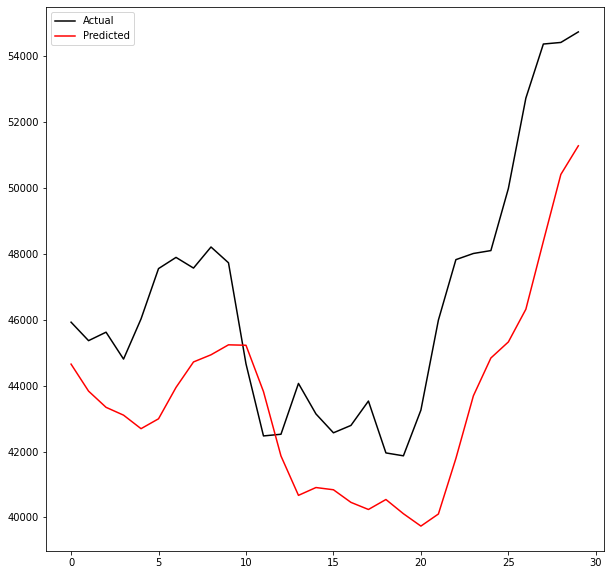

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int2_0.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 





In [44]:
# test run of the interval2_ann_model_nextday()
interval2_ann_model_nextday(X, y)

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00271: early stopping
Training R-Squared: 0.9872254905252283

Testing R-Squared: 0.986379546549789

30day Holdout R-Squared: 0.6641226293071838

30day Holdout MAE: 1761.795703125

30day Holdout MAPE: 3.8358128640545908

30day Holdout RMSE: 2136.7193967357675


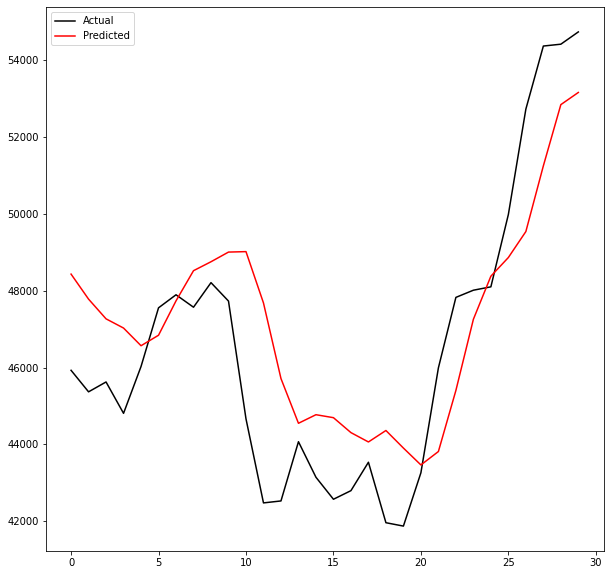

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01relu64Int2_61.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00237: early stopping
Training R-Squared: 0.9924864935457464

Testing R-Squared: 0.992923469267944

30day Holdout R-Squared: -6.989708567994622

30day Holdout MAE: 10205.773697916668

30day Holdout MAPE: 21.77094211037183

30day Holdout RMSE: 10421.316582020465


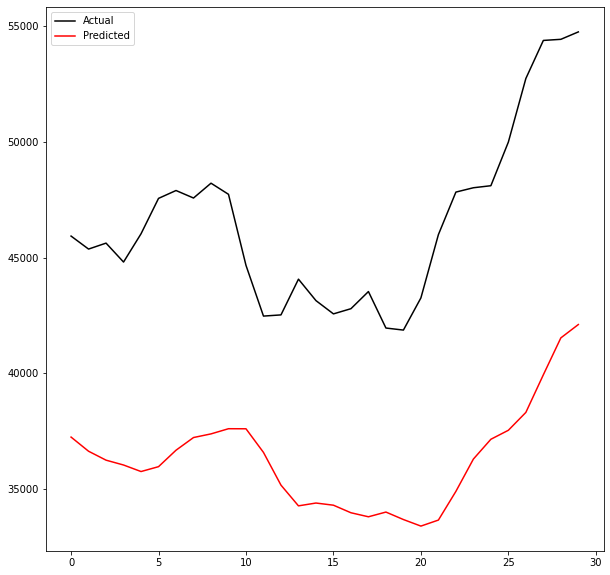

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01elu64Int2_62.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00235: early stopping
Training R-Squared: 0.9927180398587199

Testing R-Squared: 0.9930294140090604

30day Holdout R-Squared: 0.5078099745231867

30day Holdout MAE: 2104.4063802083333

30day Holdout MAPE: 4.390099933105026

30day Holdout RMSE: 2586.5657596426167


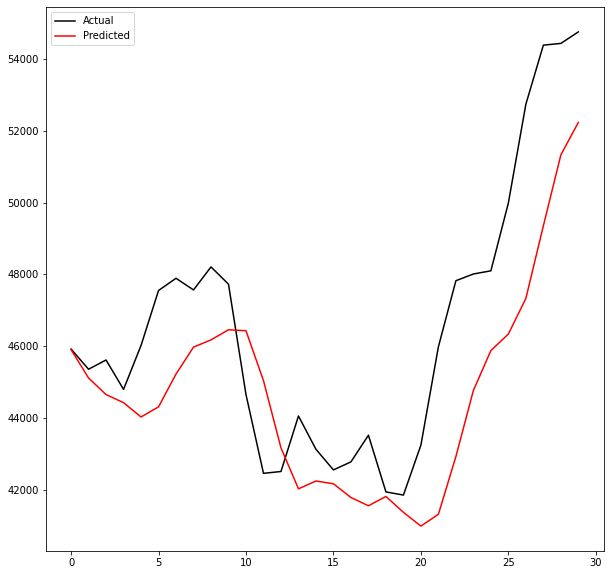

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001relu64Int2_63.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00261: early stopping
Training R-Squared: 0.9919335911011933

Testing R-Squared: 0.9935868198074281

30day Holdout R-Squared: -10.407799428104514

30day Holdout MAE: 12257.5126953125

30day Holdout MAPE: 26.183112075032867

30day Holdout RMSE: 12452.543241069618


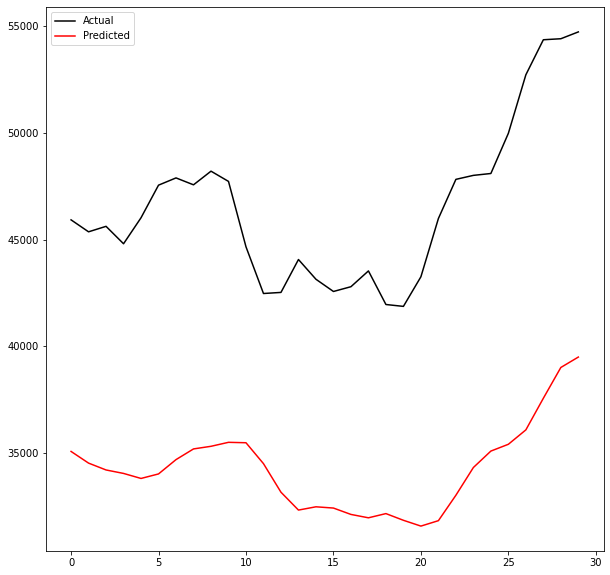

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001elu64Int2_64.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00415: early stopping
Training R-Squared: 0.9931450674493746

Testing R-Squared: 0.9935186816823137

30day Holdout R-Squared: -0.032587927720656884

30day Holdout MAE: 3225.98125

30day Holdout MAPE: 7.19805559174444

30day Holdout RMSE: 3746.4560456712156


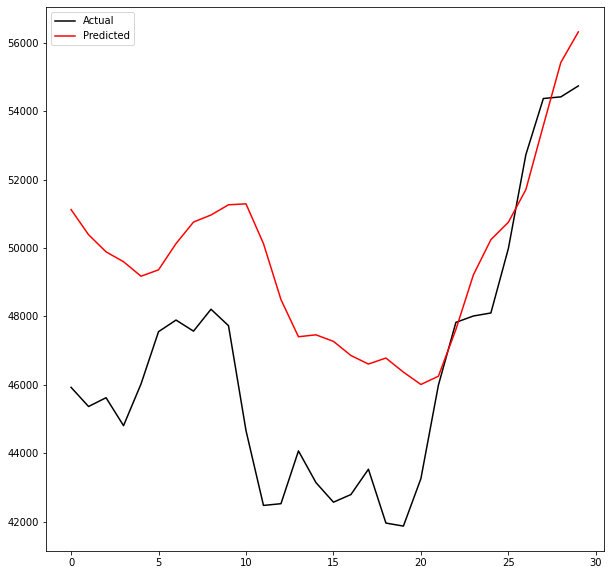

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001relu64Int2_65.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00822: early stopping
Training R-Squared: 0.992205129176283

Testing R-Squared: 0.993917903909704

30day Holdout R-Squared: -4.543887524343827

30day Holdout MAE: 8420.711588541666

30day Holdout MAPE: 17.910874389832397

30day Holdout RMSE: 8680.891445193643


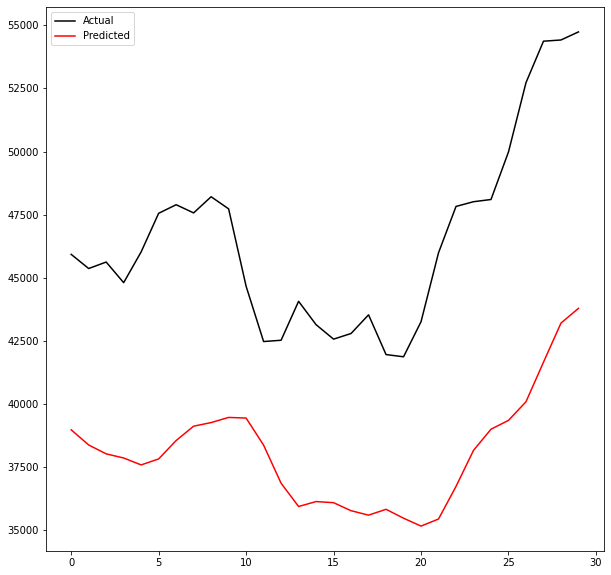

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001elu64Int2_66.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00449: early stopping
Training R-Squared: 0.993910604462573

Testing R-Squared: 0.9929221340756333

30day Holdout R-Squared: -11.240808337608488

30day Holdout MAE: 12638.225065104167

30day Holdout MAPE: 26.920038379218575

30day Holdout RMSE: 12899.181958723984


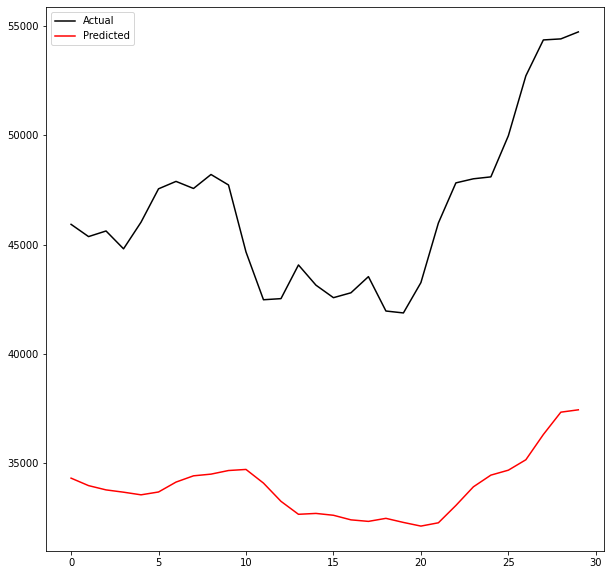

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int2_67.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00419: early stopping
Training R-Squared: 0.9917361090723681

Testing R-Squared: 0.9897618644282631

30day Holdout R-Squared: -40.53190152714172

30day Holdout MAE: 23620.85234375

30day Holdout MAPE: 50.666701086164544

30day Holdout RMSE: 23760.087074487106


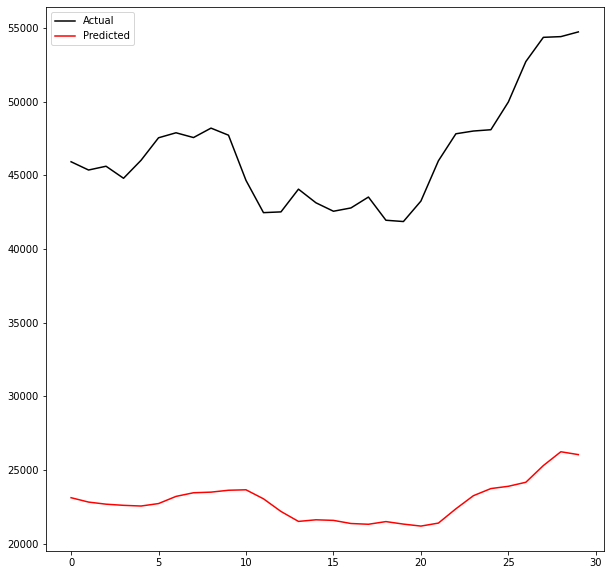

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01elu64Int2_68.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00213: early stopping
Training R-Squared: 0.9915995768594459

Testing R-Squared: 0.9902586059315912

30day Holdout R-Squared: 0.7141096195978858

30day Holdout MAE: 1563.8046875

30day Holdout MAPE: 3.370455425919145

30day Holdout RMSE: 1971.3189254868078


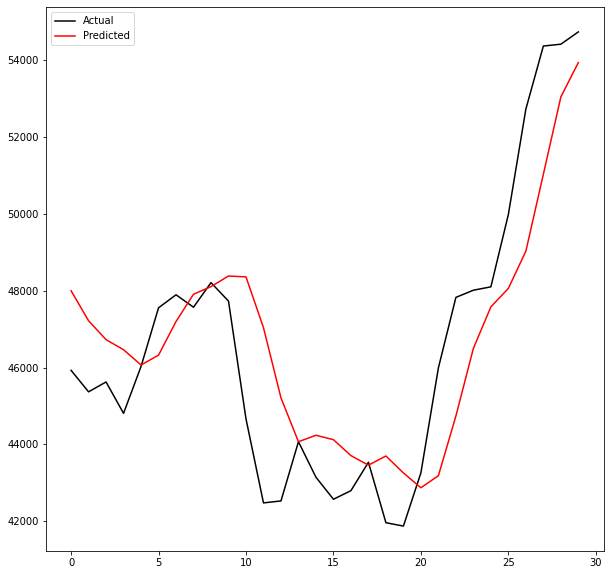

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001relu64Int2_69.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00519: early stopping
Training R-Squared: 0.9929367987778759

Testing R-Squared: 0.9934490841107105

30day Holdout R-Squared: -9.012200450970791

30day Holdout MAE: 11466.095768229166

30day Holdout MAPE: 24.48336902239539

30day Holdout RMSE: 11665.997741632134


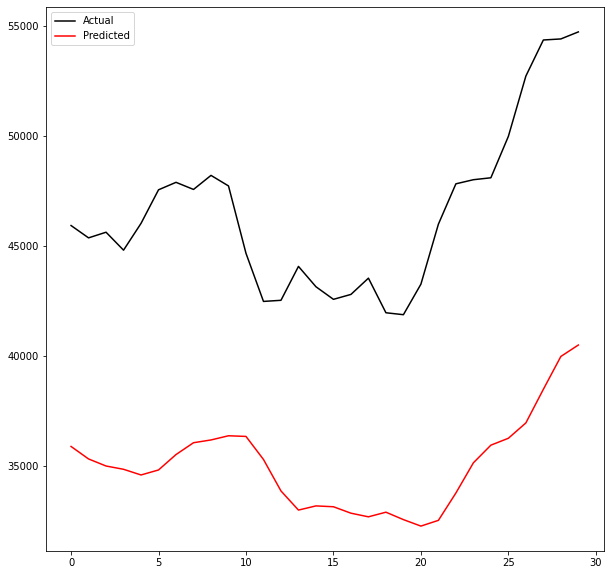

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001elu64Int2_70.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00422: early stopping
Training R-Squared: 0.9940546713365677

Testing R-Squared: 0.9937613429900145

30day Holdout R-Squared: -0.478464348358022

30day Holdout MAE: 4005.026822916667

30day Holdout MAPE: 8.891368794811875

30day Holdout RMSE: 4482.936098288634


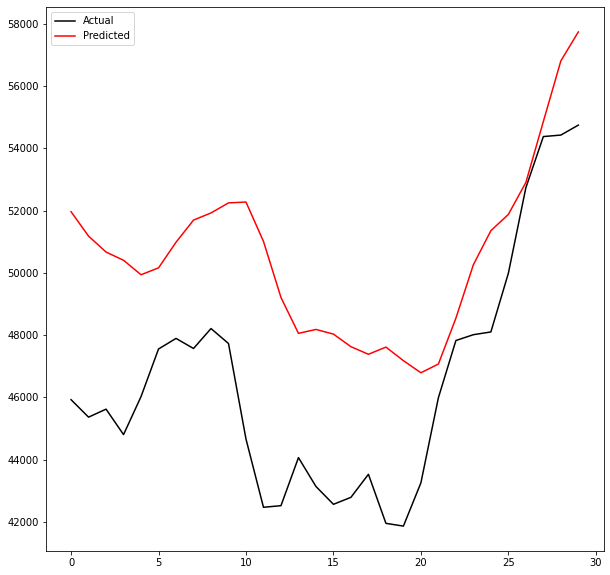

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001relu64Int2_71.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00629: early stopping
Training R-Squared: 0.9925552711890191

Testing R-Squared: 0.9939011029526569

30day Holdout R-Squared: -15.959949736720482

30day Holdout MAE: 15013.684895833334

30day Holdout MAPE: 32.121416774254534

30day Holdout RMSE: 15183.41283118163


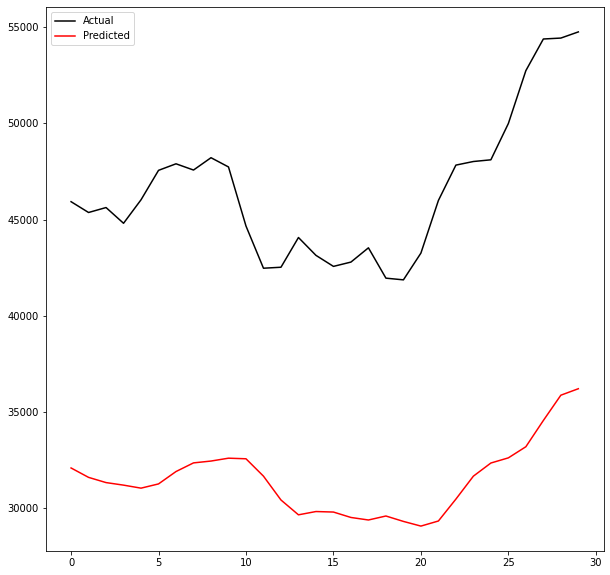

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001elu64Int2_72.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00299: early stopping
Training R-Squared: 0.985850463771616

Testing R-Squared: 0.9862177257607181

30day Holdout R-Squared: -0.8435791889940238

30day Holdout MAE: 4550.693098958333

30day Holdout MAPE: 9.541594120635393

30day Holdout RMSE: 5005.967417525675


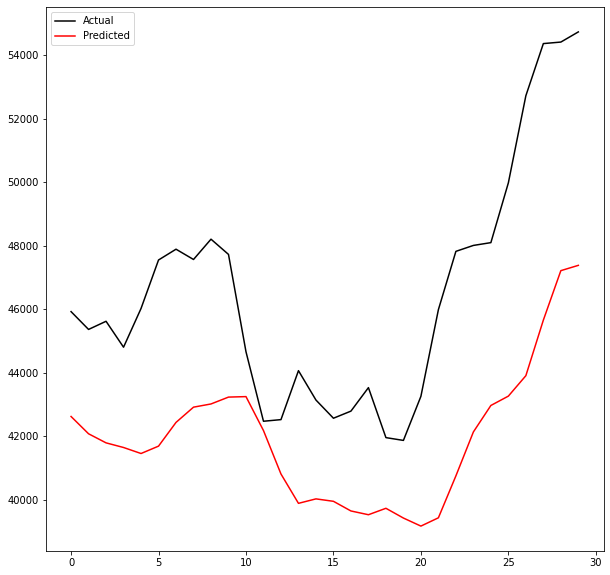

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01relu64Int2_73.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00251: early stopping
Training R-Squared: 0.9934969298950584

Testing R-Squared: 0.9936410026342155

30day Holdout R-Squared: -14.967712713938761

30day Holdout MAE: 14550.672330729167

30day Holdout MAPE: 31.116446146681376

30day Holdout RMSE: 14732.56870986554


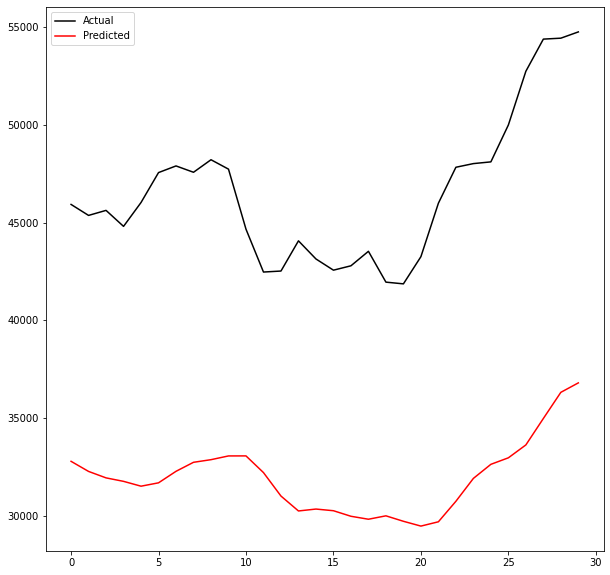

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01elu64Int2_74.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00307: early stopping
Training R-Squared: 0.9947243232606082

Testing R-Squared: 0.9926031608029221

30day Holdout R-Squared: 0.4905050164316511

30day Holdout MAE: 2154.6305989583334

30day Holdout MAPE: 4.492368055344756

30day Holdout RMSE: 2631.6436196980612


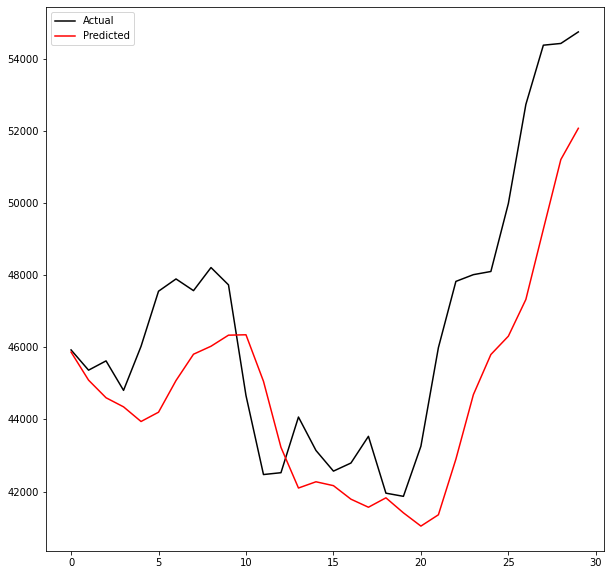

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001relu64Int2_75.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00532: early stopping
Training R-Squared: 0.9905092038364187

Testing R-Squared: 0.9898596234310277

30day Holdout R-Squared: -32.31925367444265

30day Holdout MAE: 21124.2576171875

30day Holdout MAPE: 45.264046402072395

30day Holdout RMSE: 21281.623347405355


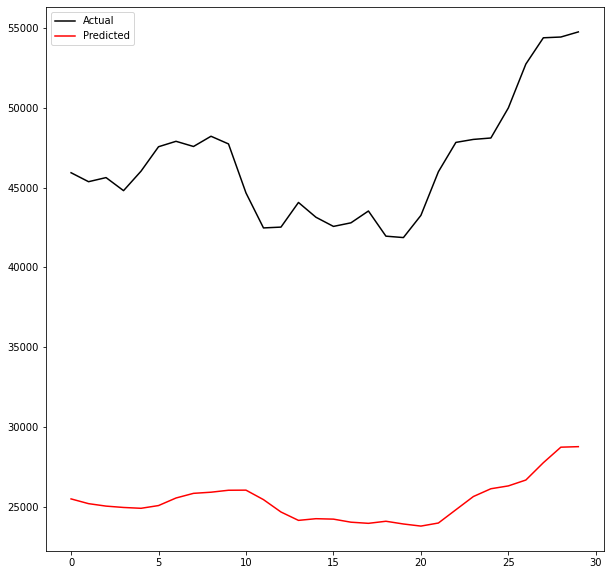

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001elu64Int2_76.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00355: early stopping
Training R-Squared: 0.9937599636752915

Testing R-Squared: 0.9931744757590794

30day Holdout R-Squared: -1.4626187200917071

30day Holdout MAE: 5403.651432291666

30day Holdout MAPE: 11.924944582090575

30day Holdout RMSE: 5785.697301900564


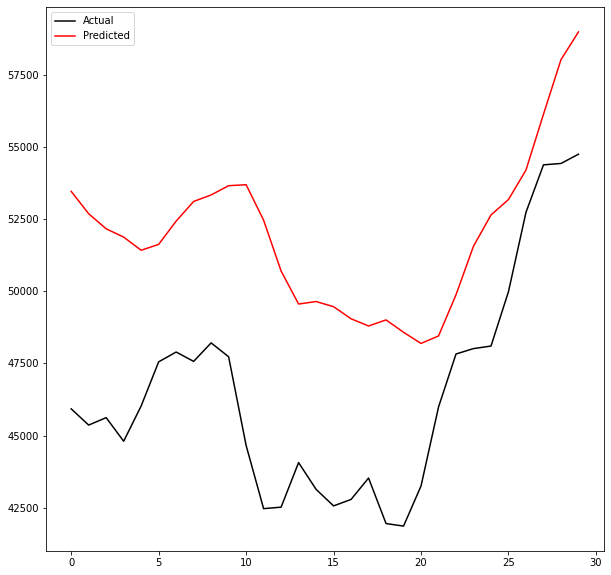

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001relu64Int2_77.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00479: early stopping
Training R-Squared: 0.9925701481004796

Testing R-Squared: 0.9939455222536773

30day Holdout R-Squared: -8.64388376461204

30day Holdout MAE: 11215.314388020834

30day Holdout MAPE: 23.9068677186103

30day Holdout RMSE: 11449.409897578702


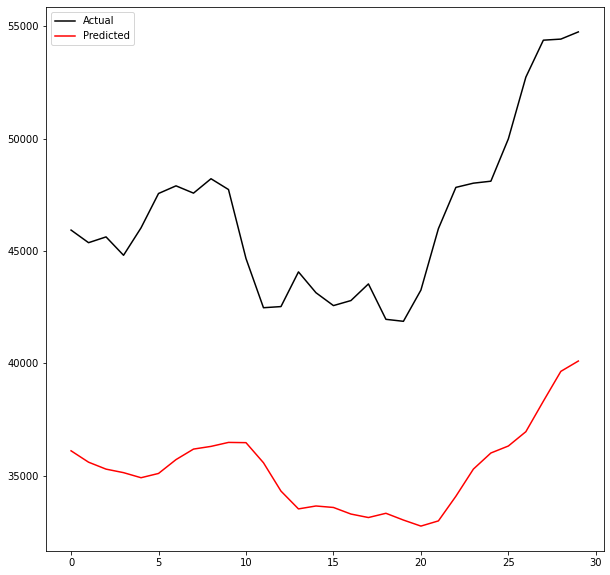

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001elu64Int2_78.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00304: early stopping
Training R-Squared: 0.9896224587618249

Testing R-Squared: 0.9893271011991115

30day Holdout R-Squared: -3.781813966209243

30day Holdout MAE: 7745.8046875

30day Holdout MAPE: 16.430834603631066

30day Holdout RMSE: 8062.197968931205


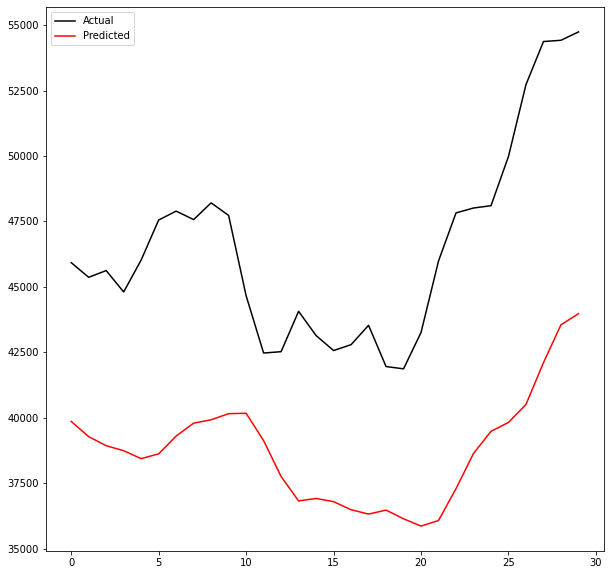

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01relu64Int2_79.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00407: early stopping
Training R-Squared: 0.9928167151328543

Testing R-Squared: 0.991600207291506

30day Holdout R-Squared: -8.413238301780684

30day Holdout MAE: 11104.1017578125

30day Holdout MAPE: 23.699188365484826

30day Holdout RMSE: 11311.667914128087


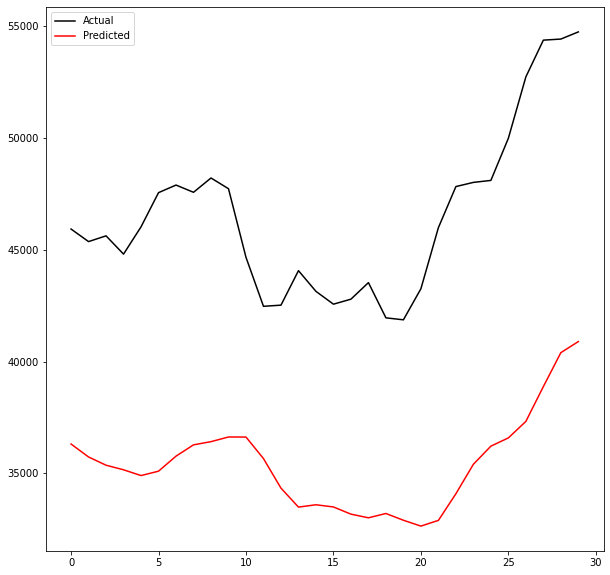

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01elu64Int2_80.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00277: early stopping
Training R-Squared: 0.9942650956148887

Testing R-Squared: 0.9920685767255033

30day Holdout R-Squared: 0.6792380187403453

30day Holdout MAE: 1690.694921875

30day Holdout MAPE: 3.571927245572791

30day Holdout RMSE: 2088.086875881201


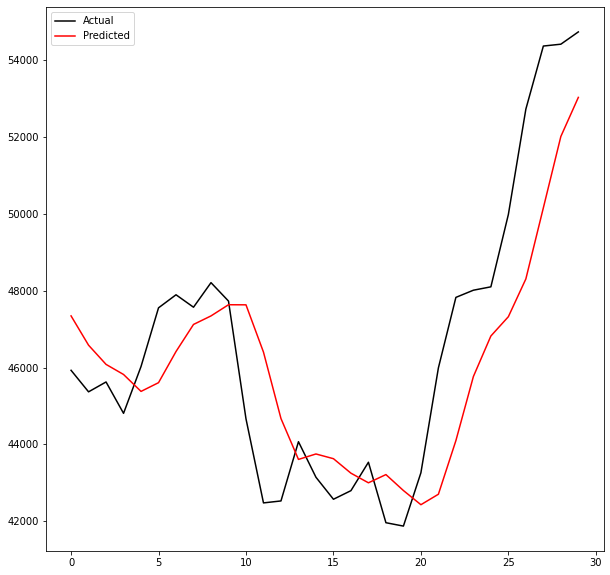

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001relu64Int2_81.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00175: early stopping
Training R-Squared: 0.9924965539491899

Testing R-Squared: 0.9932493381279213

30day Holdout R-Squared: -18.43801776876427

30day Holdout MAE: 16078.687369791667

30day Holdout MAPE: 34.404753942536

30day Holdout RMSE: 16254.855288436625


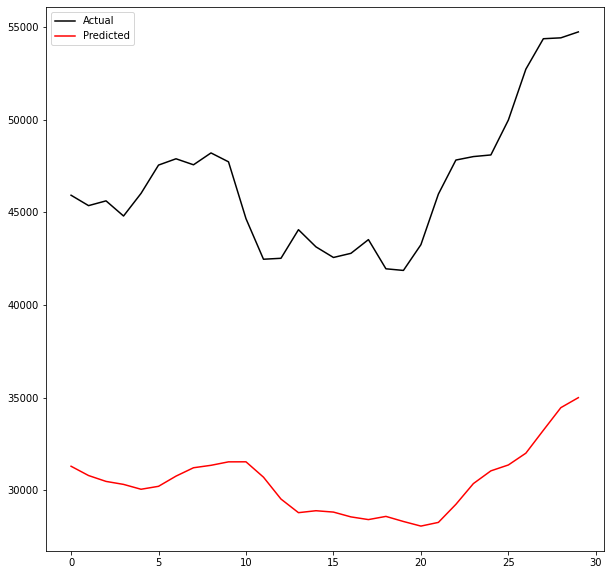

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001elu64Int2_82.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00538: early stopping
Training R-Squared: 0.9943677143147407

Testing R-Squared: 0.9924861152754948

30day Holdout R-Squared: -1.4892094557139686

30day Holdout MAE: 5449.053255208333

30day Holdout MAPE: 12.028276163004449

30day Holdout RMSE: 5816.849683668603


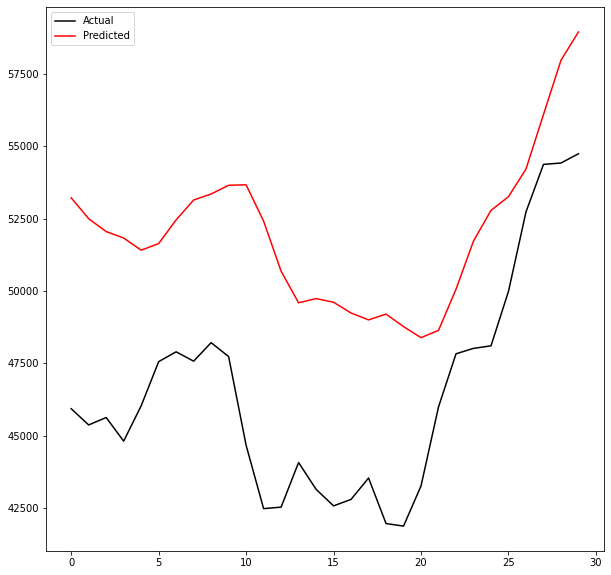

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001relu64Int2_83.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00388: early stopping
Training R-Squared: 0.9924571689341269

Testing R-Squared: 0.9937860535620874

30day Holdout R-Squared: -10.80536724400706

30day Holdout MAE: 12456.510416666666

30day Holdout MAPE: 26.588799815229653

30day Holdout RMSE: 12667.673783840297


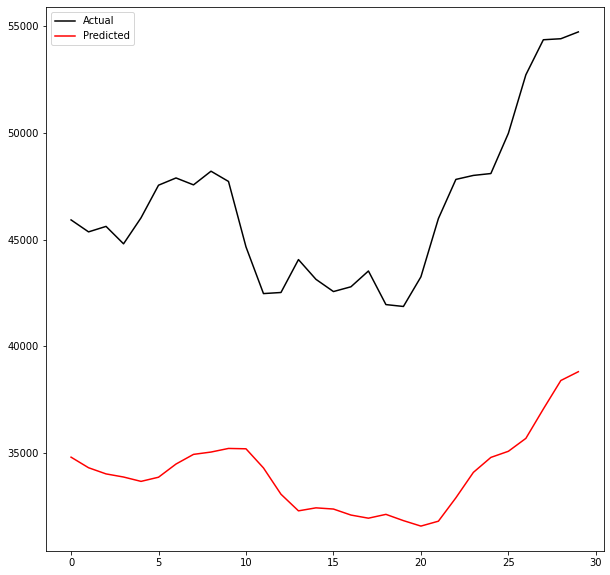

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001elu64Int2_84.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00266: early stopping
Training R-Squared: 0.990902702356545

Testing R-Squared: 0.9908207571690506

30day Holdout R-Squared: -1.8478466676143777

30day Holdout MAE: 5895.148828125

30day Holdout MAPE: 12.487185621446924

30day Holdout RMSE: 6221.791042560434


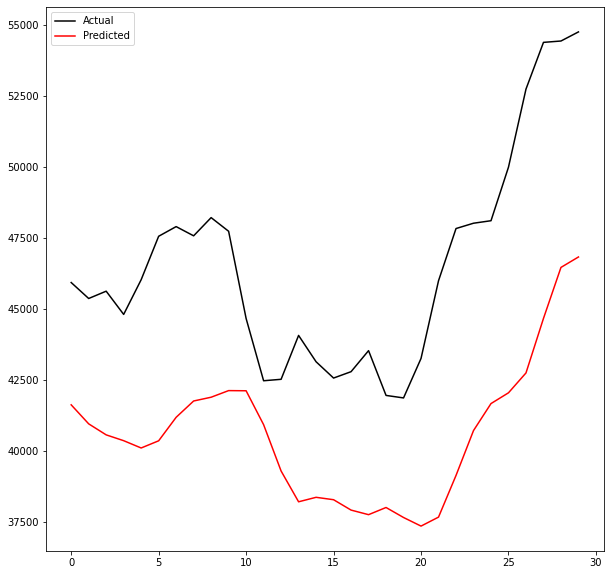

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01relu64Int2_85.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00228: early stopping
Training R-Squared: 0.9913693470596692

Testing R-Squared: 0.9920206346718424

30day Holdout R-Squared: -35.15176140533028

30day Holdout MAE: 22018.453580729165

30day Holdout MAPE: 47.20595379606521

30day Holdout RMSE: 22167.762052767674


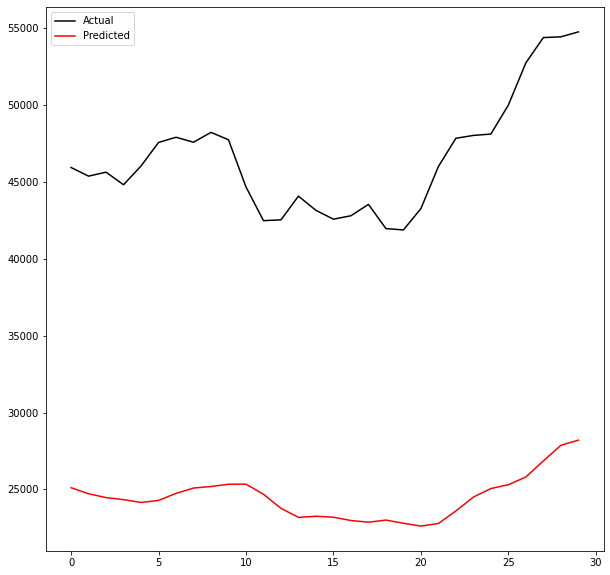

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01elu64Int2_86.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00254: early stopping
Training R-Squared: 0.99378177207121

Testing R-Squared: 0.9922190009108268

30day Holdout R-Squared: 0.664561336174136

30day Holdout MAE: 1756.7645833333333

30day Holdout MAPE: 3.864678635280553

30day Holdout RMSE: 2135.323500720509


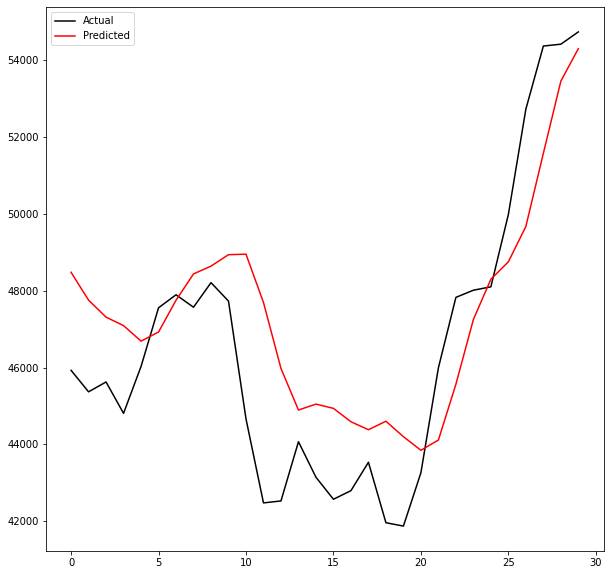

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001relu64Int2_87.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00414: early stopping
Training R-Squared: 0.992991349583806

Testing R-Squared: 0.9918645304821884

30day Holdout R-Squared: -36.44963235052389

30day Holdout MAE: 22407.872526041665

30day Holdout MAPE: 48.0349290807729

30day Holdout RMSE: 22562.17166955456


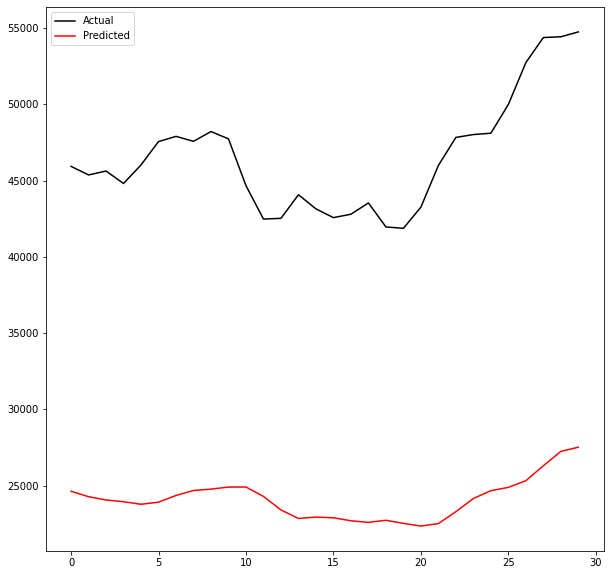

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001elu64Int2_88.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00350: early stopping
Training R-Squared: 0.9944386711992822

Testing R-Squared: 0.9929804404679828

30day Holdout R-Squared: 0.13822315532030327

30day Holdout MAE: 2947.678645833333

30day Holdout MAPE: 6.554164318493348

30day Holdout RMSE: 3422.587267973444


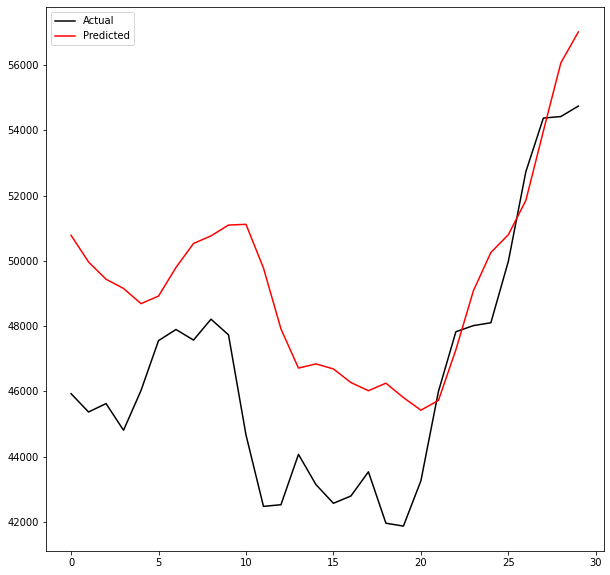

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001relu64Int2_89.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00363: early stopping
Training R-Squared: 0.9925844484151634

Testing R-Squared: 0.9937338183744984

30day Holdout R-Squared: -24.034440220351836

30day Holdout MAE: 18306.1779296875

30day Holdout MAPE: 39.236340606609076

30day Holdout RMSE: 18447.013368748638


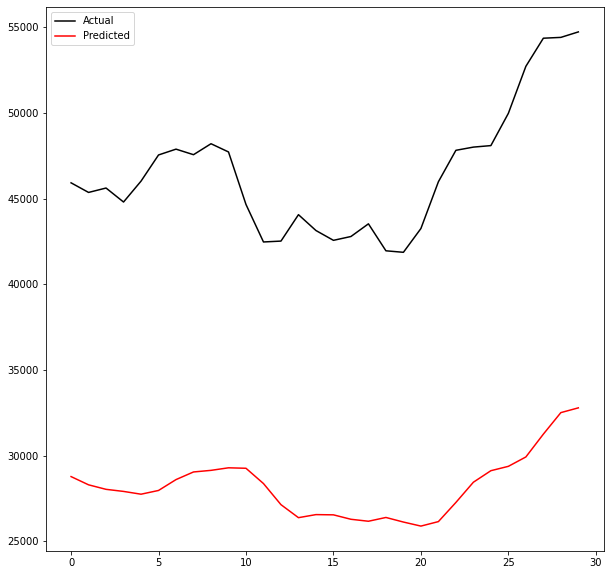

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001elu64Int2_90.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00185: early stopping
Training R-Squared: 0.9863301884931255

Testing R-Squared: 0.9863428003980628

30day Holdout R-Squared: 0.20017552758990476

30day Holdout MAE: 2674.616015625

30day Holdout MAPE: 5.528626439424423

30day Holdout RMSE: 3297.2696429768994


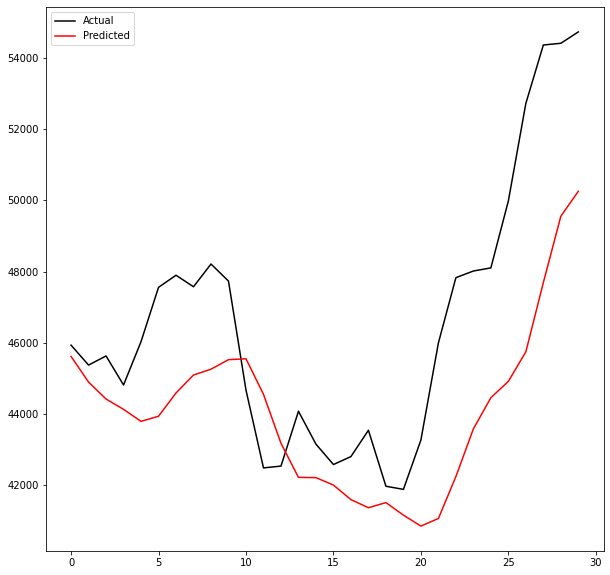

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01relu64Int2_91.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00402: early stopping
Training R-Squared: 0.9898044121857681

Testing R-Squared: 0.9806114315784527

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


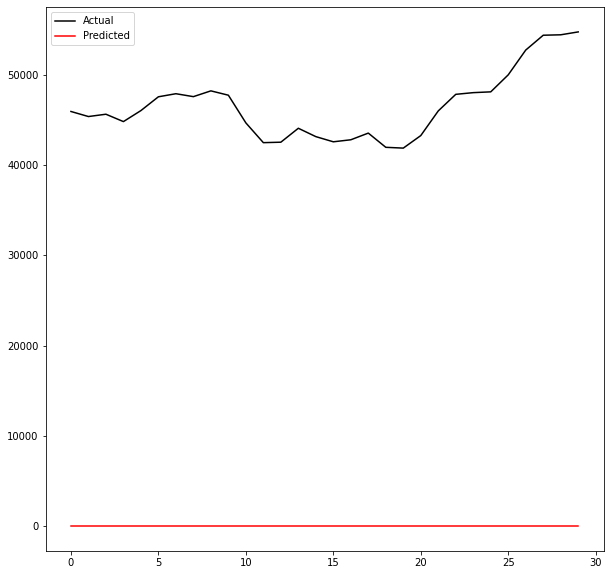

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01elu64Int2_92.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.020664582517832

Testing R-Squared: -3.09049090857292

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


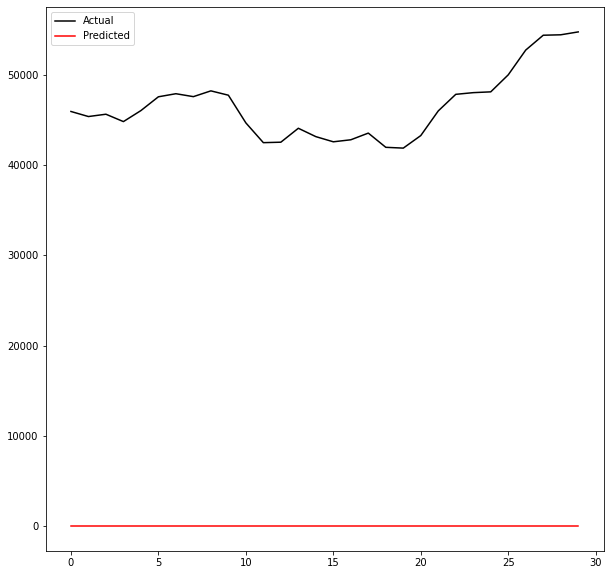

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001relu64Int2_93.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00445: early stopping
Training R-Squared: 0.99258678532306

Testing R-Squared: 0.9924914700360571

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


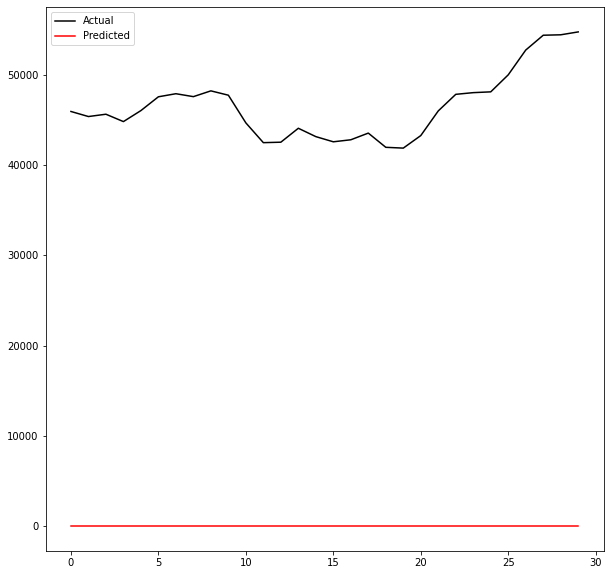

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001elu64Int2_94.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.020664582517832

Testing R-Squared: -3.09049090857292

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


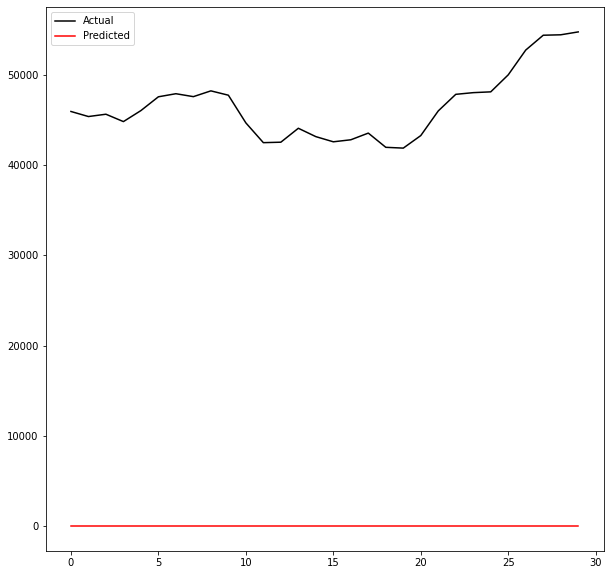

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001relu64Int2_95.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00723: early stopping
Training R-Squared: 0.9890567192864659

Testing R-Squared: 0.9911087721674052

30day Holdout R-Squared: -4.513940560347309

30day Holdout MAE: 8358.30859375

30day Holdout MAPE: 17.744737129562065

30day Holdout RMSE: 8657.413482725511


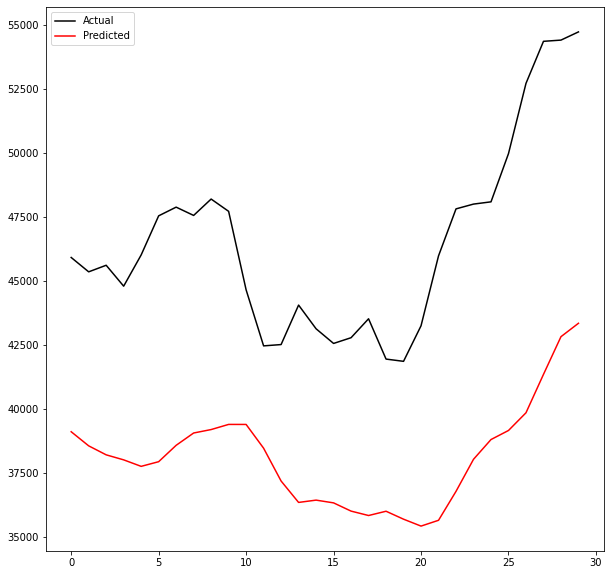

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001elu64Int2_96.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.020664582517832

Testing R-Squared: -3.09049090857292

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


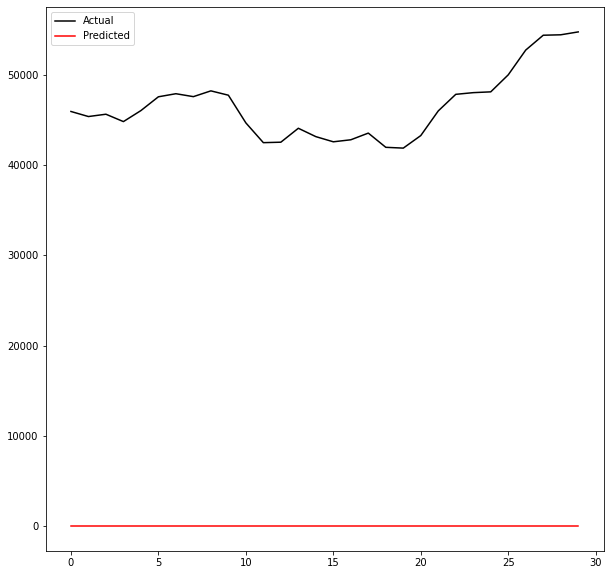

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01relu64Int2_97.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00639: early stopping
Training R-Squared: 0.9830186139181577

Testing R-Squared: 0.9610717070150052

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


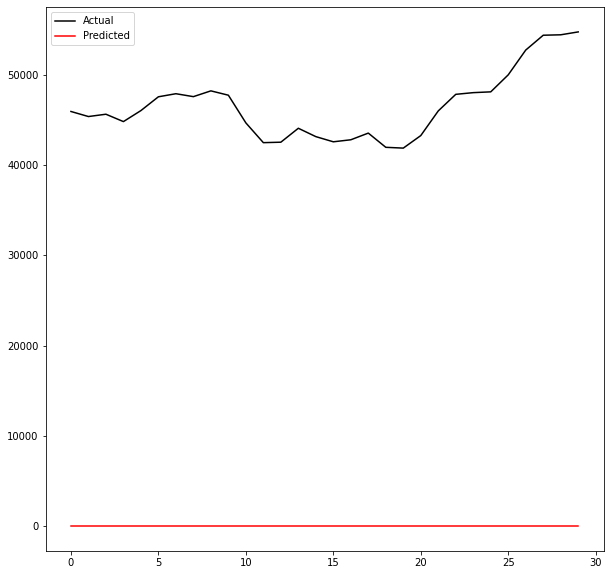

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01elu64Int2_98.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00318: early stopping
Training R-Squared: 0.98490420720674

Testing R-Squared: 0.9840477959174901

30day Holdout R-Squared: -2.186208571221493

30day Holdout MAE: 6135.160546875

30day Holdout MAPE: 12.921556511620821

30day Holdout RMSE: 6581.03530835724


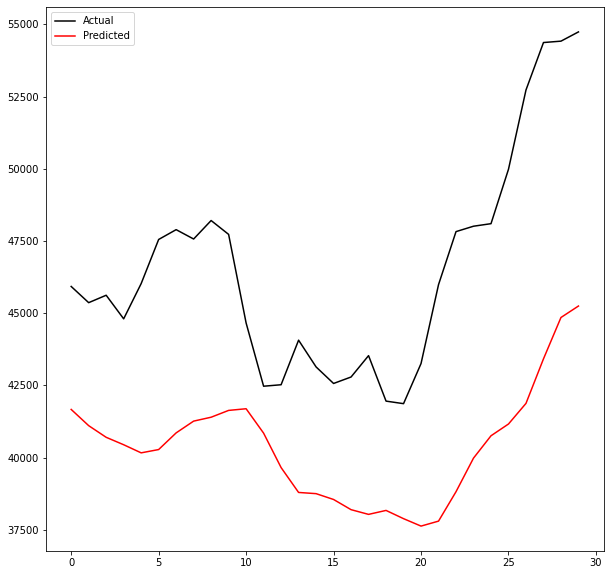

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001relu64Int2_99.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00573: early stopping
Training R-Squared: 0.9934459824219602

Testing R-Squared: 0.990631281376613

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


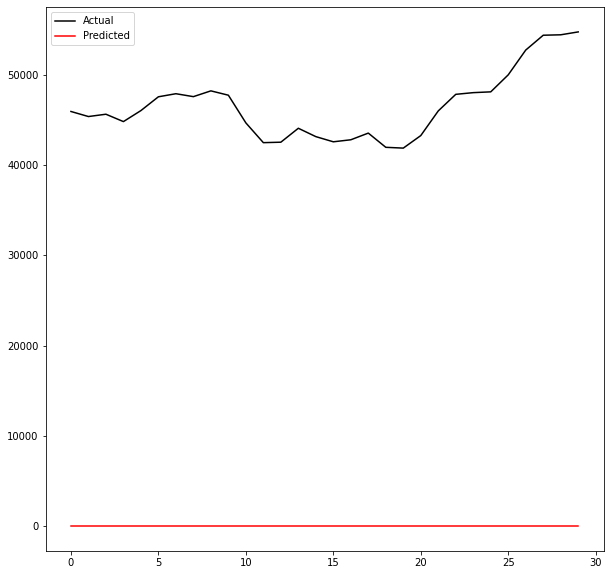

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001elu64Int2_100.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00722: early stopping
Training R-Squared: 0.9929541080660567

Testing R-Squared: 0.9922209752122975

30day Holdout R-Squared: -0.6149659547512383

30day Holdout MAE: 4227.5484375

30day Holdout MAPE: 9.37595400670511

30day Holdout RMSE: 4685.315122463642


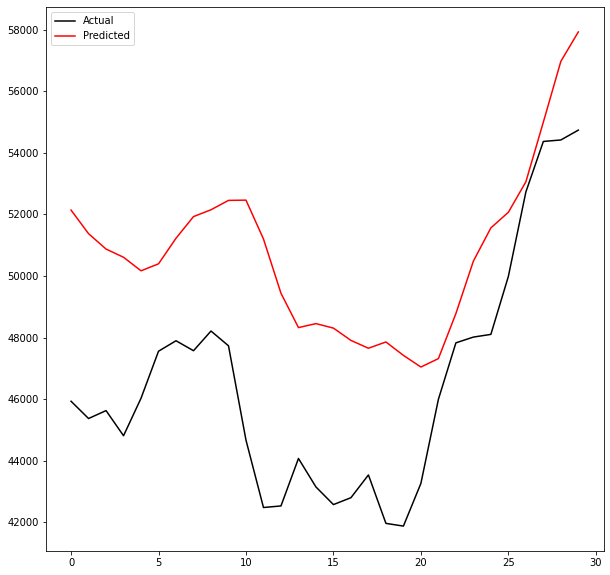

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int2_101.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00492: early stopping
Training R-Squared: 0.9920406120352206

Testing R-Squared: 0.9935662230023217

30day Holdout R-Squared: -13.813030383144387

30day Holdout MAE: 13982.631966145833

30day Holdout MAPE: 29.86683363275776

30day Holdout RMSE: 14189.891570498303


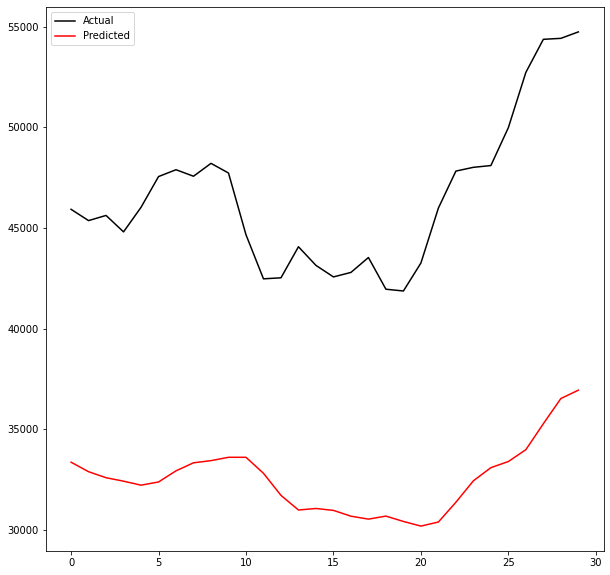

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001elu64Int2_102.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00351: early stopping
Training R-Squared: 0.9883104560663877

Testing R-Squared: 0.9911075105271164

30day Holdout R-Squared: -4.3424646691913

30day Holdout MAE: 8101.793619791667

30day Holdout MAPE: 17.101701488250843

30day Holdout RMSE: 8521.73352090535


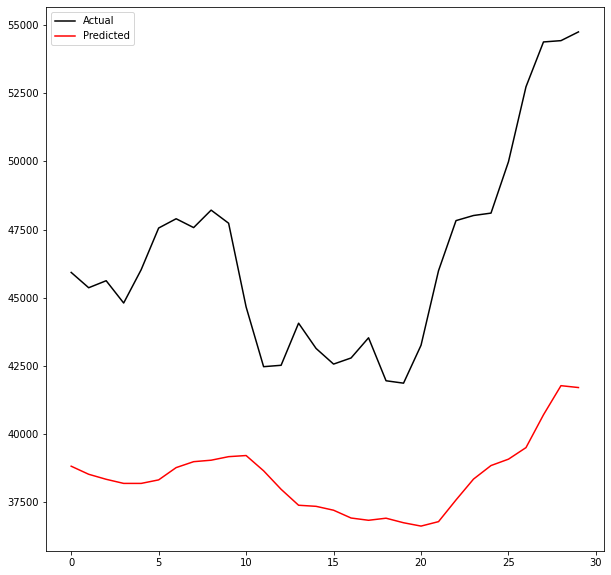

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01relu64Int2_103.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.034261771231619

Testing R-Squared: -3.1037160911206927

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


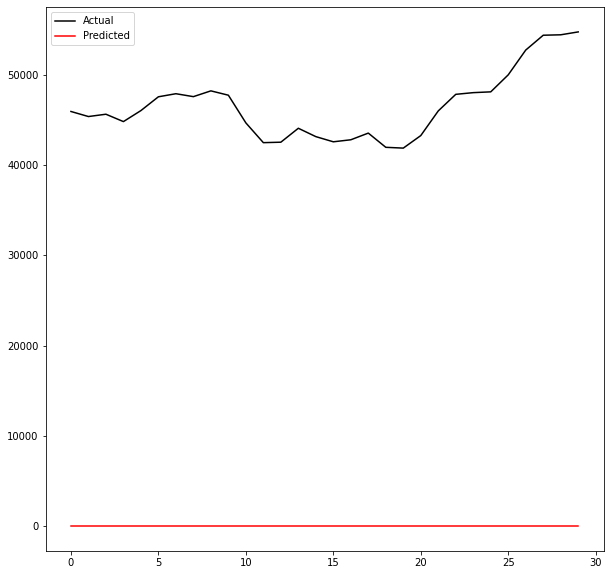

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01elu64Int2_104.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00518: early stopping
Training R-Squared: 0.9847131847772808

Testing R-Squared: 0.9827044703511366

30day Holdout R-Squared: -6.614476346957304

30day Holdout MAE: 9841.781510416668

30day Holdout MAPE: 20.890392248654127

30day Holdout RMSE: 10173.65816055745


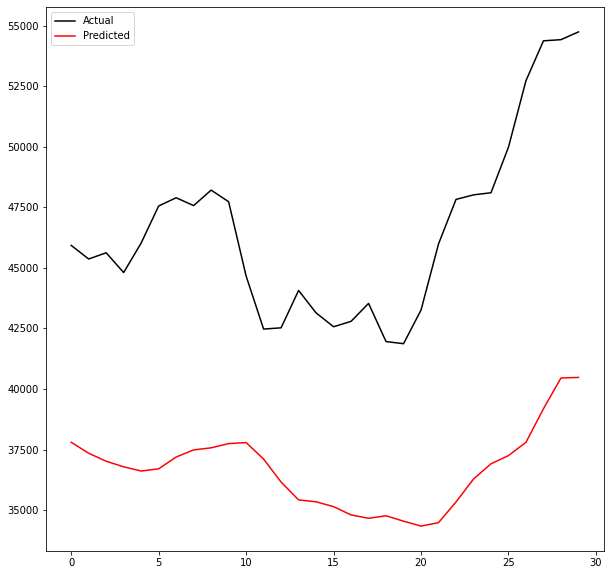

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001relu64Int2_105.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00303: early stopping
Training R-Squared: 0.9903488129051427

Testing R-Squared: 0.9901739194083511

30day Holdout R-Squared: -89.58777336279213

30day Holdout MAE: 34350.21267903646

30day Holdout MAPE: 73.28006766648359

30day Holdout RMSE: 35090.69036670293


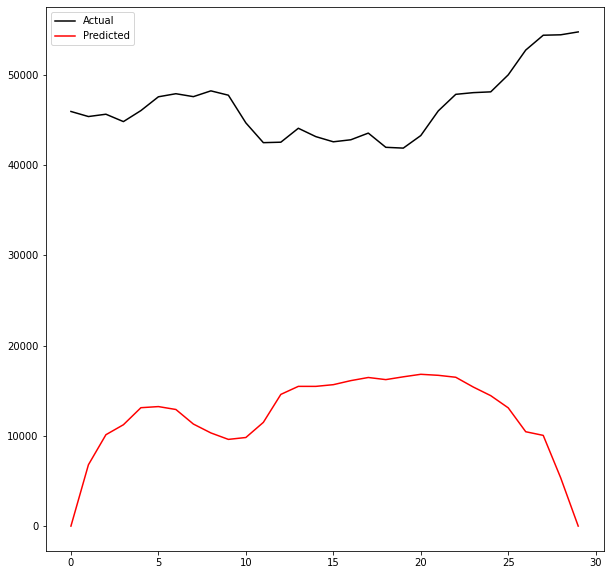

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001elu64Int2_106.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00559: early stopping
Training R-Squared: 0.9936070744485473

Testing R-Squared: 0.9925584459828869

30day Holdout R-Squared: -0.30004856561779847

30day Holdout MAE: 3686.4432291666667

30day Holdout MAPE: 8.21306069196834

30day Holdout RMSE: 4203.750270813142


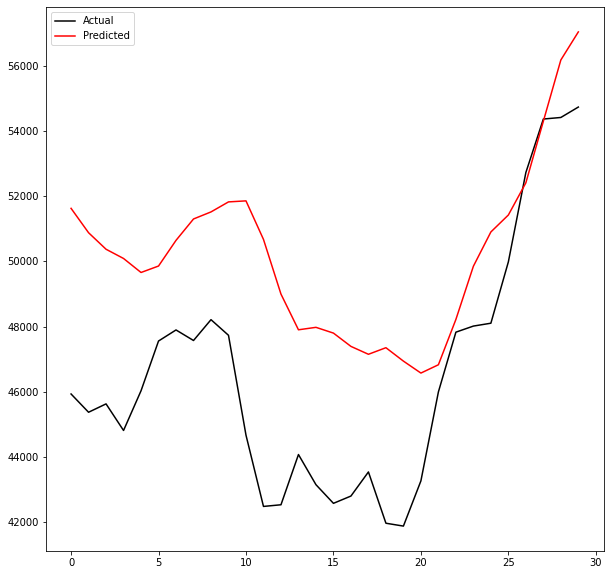

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001relu64Int2_107.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00476: early stopping
Training R-Squared: 0.9903118407549141

Testing R-Squared: 0.9916524681826399

30day Holdout R-Squared: -31.80264780825668

30day Holdout MAE: 20973.107877604165

30day Holdout MAPE: 44.965442706934915

30day Holdout RMSE: 21115.995978687683


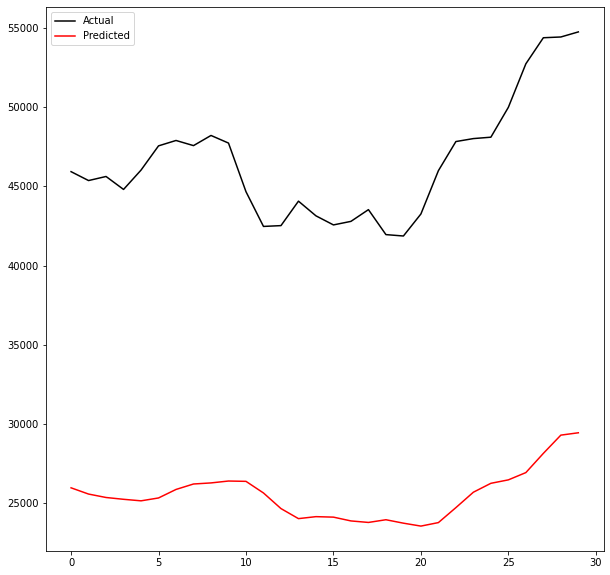

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001elu64Int2_108.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00340: early stopping
Training R-Squared: 0.978767431709998

Testing R-Squared: 0.9766439621624736

30day Holdout R-Squared: -0.6652701909030918

30day Holdout MAE: 4094.271875

30day Holdout MAPE: 8.504361163918675

30day Holdout RMSE: 4757.726514154632


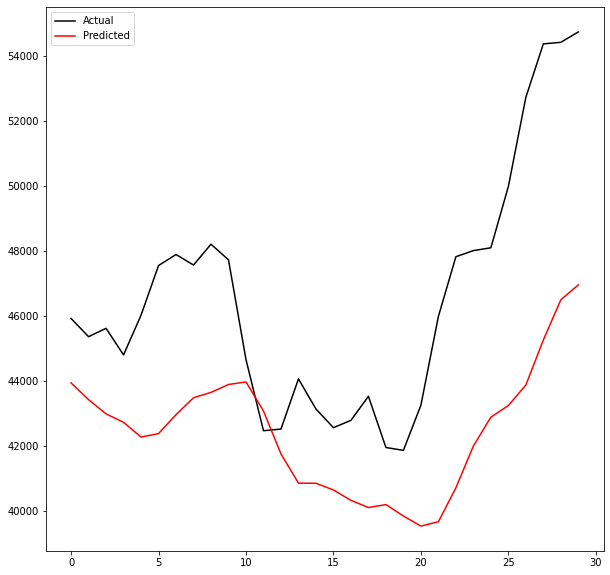

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01relu64Int2_109.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.034261771231619

Testing R-Squared: -3.1037160911206927

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


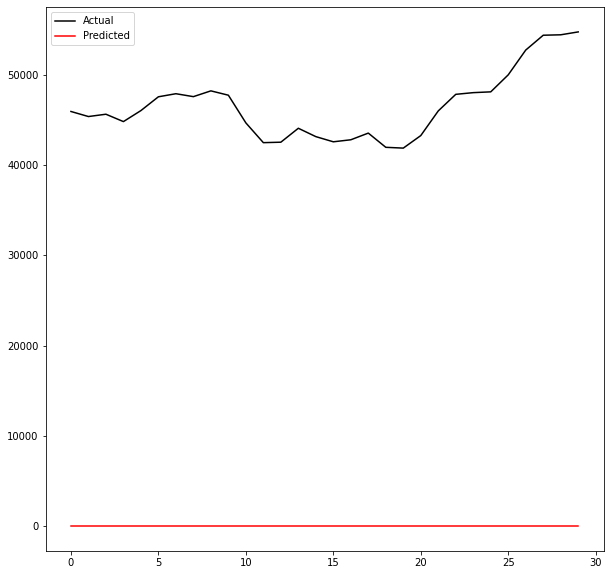

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01elu64Int2_110.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00348: early stopping
Training R-Squared: 0.982437480417862

Testing R-Squared: 0.9817015136379943

30day Holdout R-Squared: -2.2131545841627003

30day Holdout MAE: 6176.140625

30day Holdout MAPE: 13.012693844464545

30day Holdout RMSE: 6608.804882552058


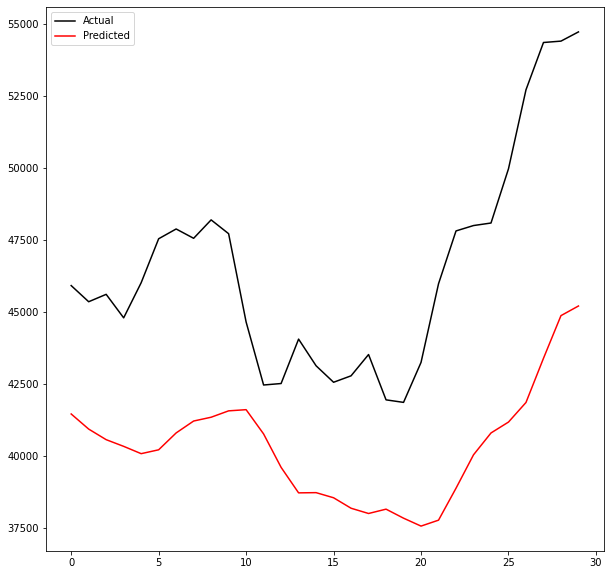

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001relu64Int2_111.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00267: early stopping
Training R-Squared: 0.9759510871452647

Testing R-Squared: 0.9750523661735726

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


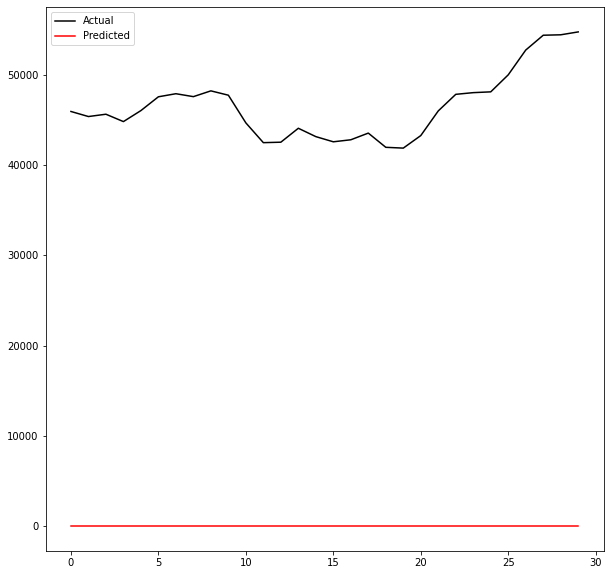

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001elu64Int2_112.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00623: early stopping
Training R-Squared: 0.9935973126805873

Testing R-Squared: 0.9921789215068625

30day Holdout R-Squared: -0.08716654298042914

30day Holdout MAE: 3343.548307291667

30day Holdout MAPE: 7.459507463929273

30day Holdout RMSE: 3844.1927865304197


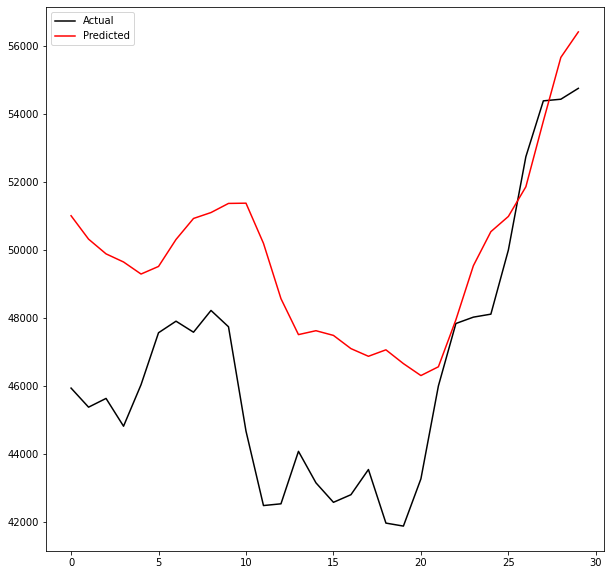

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001relu64Int2_113.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00339: early stopping
Training R-Squared: 0.9900613444015869

Testing R-Squared: 0.9908766553742435

30day Holdout R-Squared: -39.440435321391945

30day Holdout MAE: 23298.095247395835

30day Holdout MAPE: 49.959756758892404

30day Holdout RMSE: 23445.79865212692


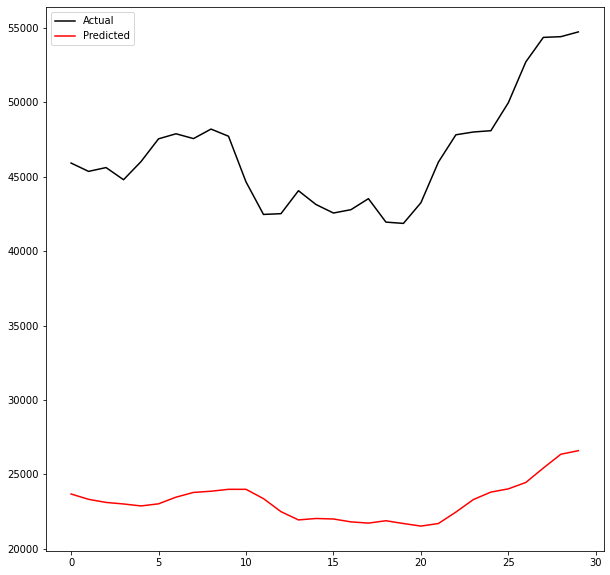

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001elu64Int2_114.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00364: early stopping
Training R-Squared: 0.9861723641523297

Testing R-Squared: 0.9856064908544087

30day Holdout R-Squared: -14.055174812150508

30day Holdout MAE: 14097.363541666668

30day Holdout MAPE: 30.11739944734071

30day Holdout RMSE: 14305.40051328318


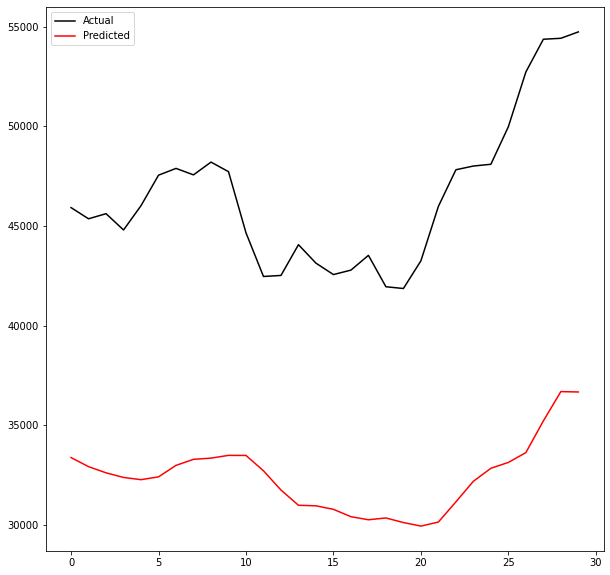

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01relu64Int2_115.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -3.034261771231619

Testing R-Squared: -3.1037160911206927

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


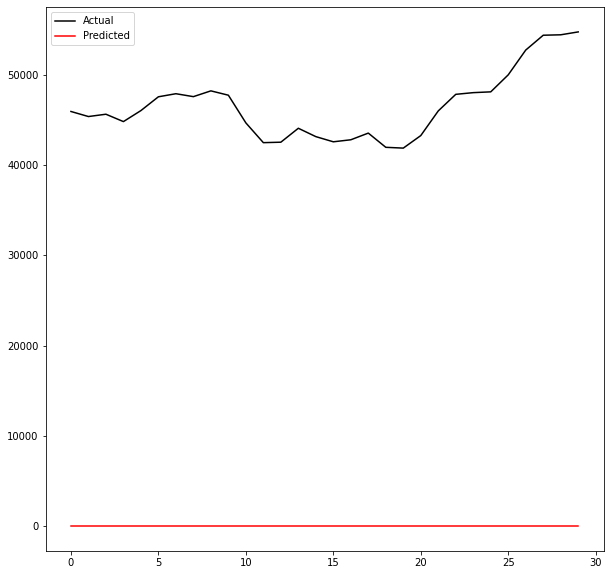

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01elu64Int2_116.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00250: early stopping
Training R-Squared: 0.9837436877802548

Testing R-Squared: 0.9834501325849098

30day Holdout R-Squared: -0.124241260004323

30day Holdout MAE: 3279.6462239583334

30day Holdout MAPE: 6.794538120725326

30day Holdout RMSE: 3909.190908494895


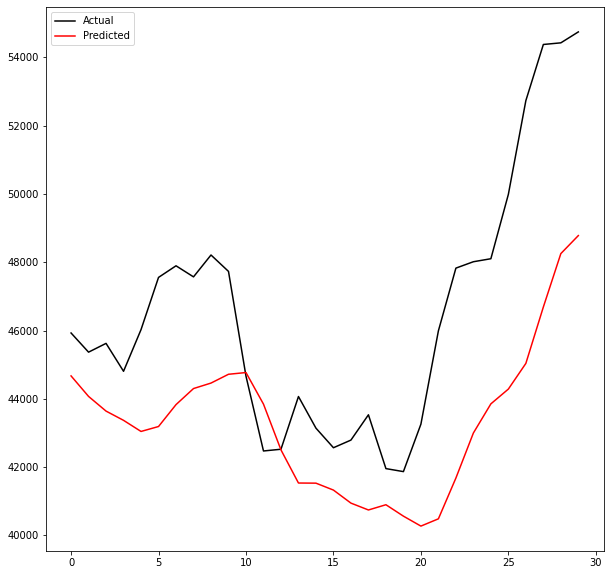

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001relu64Int2_117.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00299: early stopping
Training R-Squared: 0.9820484862758515

Testing R-Squared: 0.9816235878495686

30day Holdout R-Squared: -62.173102274546686

30day Holdout MAE: 29110.735611979166

30day Holdout MAPE: 62.399383266852595

30day Holdout RMSE: 29303.751469976913


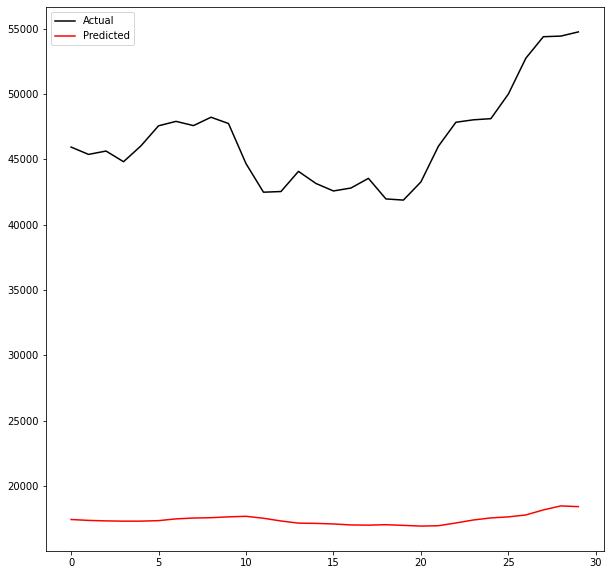

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001elu64Int2_118.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00620: early stopping
Training R-Squared: 0.9935469618086802

Testing R-Squared: 0.9914808179502339

30day Holdout R-Squared: -0.3760958222990243

30day Holdout MAE: 3814.838411458333

30day Holdout MAPE: 8.495013533598485

30day Holdout RMSE: 4324.953657156621


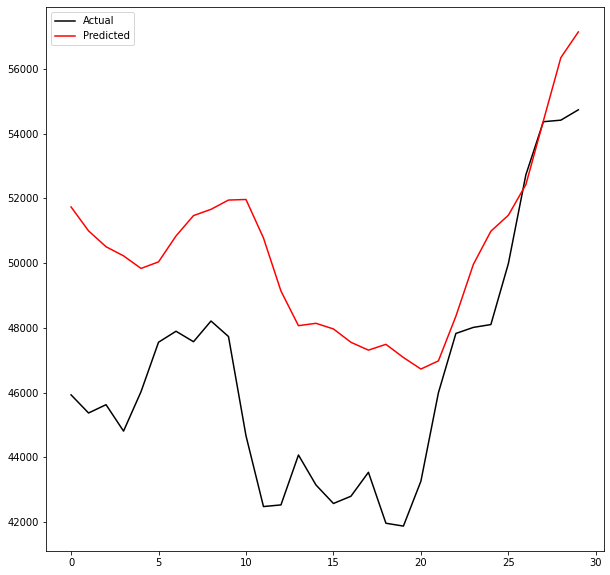

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001relu64Int2_119.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00436: early stopping
Training R-Squared: 0.9921574752377327

Testing R-Squared: 0.9936062297877452

30day Holdout R-Squared: -41.033266484264814

30day Holdout MAE: 23756.292708333334

30day Holdout MAPE: 50.94704846545606

30day Holdout RMSE: 23903.07040429801


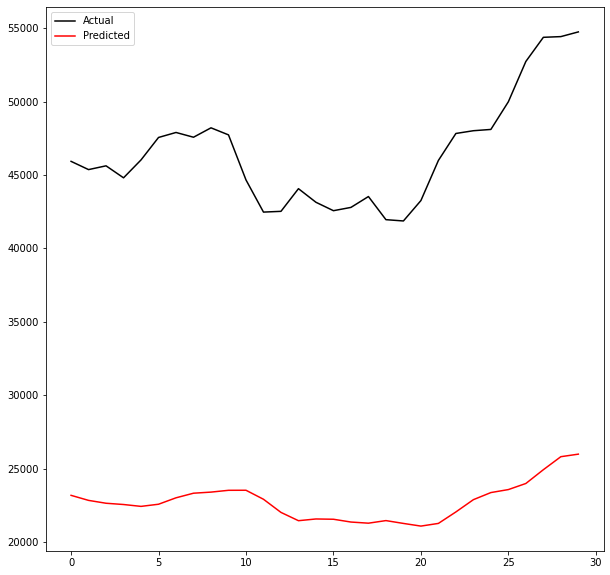

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001elu64Int2_120.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 





In [45]:
opt_list = ['Adam', 'RMSprop']
activation_list = ['relu', 'elu']
neuron_list = [200, 300, 400, 500, 600]
lr_list = [0.01, 0.001, 0.0001]

count += 1

for op in opt_list:
    for neuron in neuron_list:
        for l in lr_list:
            for act in activation_list:
                interval2_ann_model_nextday(X, y, lr=l, activation=act,
                                            neurons=neuron, opt=op, batch_size=64, epochs=5000, count=count)
                count += 1

## Interval 3 ANN Model

In [46]:
# double check that the X df has only feature columns and Date as the first column
X.columns

Index(['Date', 'median_transaction_fee30trxUSD',
       'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx',
       'transactions', 'price30wmaUSD', 'price3wmaUSD', 'price7wmaUSD',
       'median_transaction_fee7rocUSD', 'difficulty30rsi'],
      dtype='object')

In [47]:
# double check y and X have same number of rows
y.shape, X.shape

((4102,), (4102, 11))

In [48]:
# create a 4 hidden layer model function for testing hyperparameters

def interval3_ann_model_nextday(X, y, lr=0.01, neurons=300, activation='relu', opt='Adam', batch_size=64, epochs=5000, count=0):
    ''' 
        X is a dataframe of the dates and features using non-standardized values
        The Date column must be the first column in the X dataframe
        y is a dataframe or 1D array of the target values
    '''
    # assign the string values to variables for file naming later in the Checkpoint
    opt_name = opt
    acti = activation
    # remove the . in the learning rate
    learn_rt = re.sub('\.', '-', str(lr))
    
    # create a holdout series of the last 30 days of data
    X_holdout = X.iloc[-30:, 1:] # exclude the first column which is the date column
    y_holdout = y[-30:]
    
    # extract the data from the dates of Interval 3
    date_bool = (X.iloc[:, 0] >= '2013/04/01') & (X.iloc[:, 0] <= '2019/12/31')
    X = X[date_bool]
    # remove the date column
    X = X.iloc[:, 1:]
    # adjust the range of y df
    y = y[X.index]
    
    # create train test split of data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=15)
    
    # scale the data
    estimators = [] # create a list for the scalers
    estimators.append(['minmax', MinMaxScaler()])
    estimators.append(['robust', RobustScaler()])
    # add the scalers to the Pipeline
    scale = Pipeline(estimators, verbose=True)
    # fit the scaler to the training data
    scale.fit(X_train)
    # transform the training, testing, and holdout data
    X_train = scale.transform(X_train)
    X_test = scale.transform(X_test)
    X_holdout = scale.transform(X_holdout)
    
#     # select an optimizer
#     if opt == 'Adam':
#         opt = tf.keras.optimizers.Adam(learning_rate=lr)
#     elif opt == 'RMSProp':
#         opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
#     elif opt == 'Adagrad':
#         opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
    # define the shape of the input number of features
    shape = X_train.shape[1]
    
    # create call backs to save the model after each epoch if it is the best seen so far
    # and for early stopping when model has not improved after 100 epochs
    mcp_save = ModelCheckpoint('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int3'+'_'+str(count)+'.hdf5', save_best_only=True, monitor='val_loss', mode='auto')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=100, verbose=1, mode='auto')
        
    # create a special definition for the ANN model to adjust hyperparameters
    def seq_model(initializer='normal', activation=activation, neurons=neurons, NUM_FEATURES=shape, opt=opt, lr=lr):
        # create model
        model = Sequential()
        model.add(Dense(neurons, input_shape=(NUM_FEATURES,), kernel_initializer=initializer, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(1, activation=activation, kernel_initializer=initializer))
        # Compile model
        # select an optimizer
        if opt == 'Adam':
            opt = tf.keras.optimizers.Adam(learning_rate=lr)
        elif opt == 'RMSprop':
            opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
        elif opt == 'Adagrad':
            opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
        model.compile(loss='logcosh', optimizer=opt, metrics=['mae'])
        return model
        
    # define the 4 Dense layer model
    ann_model = seq_model(activation=activation, neurons=neurons, NUM_FEATURES=shape)
    

    # create the regressor
    regressor=KerasRegressor(build_fn=seq_model, batch_size=batch_size, epochs=epochs, verbose=0, shuffle=True,
                         validation_split=0.1, validation_freq=1,
                        use_multiprocessing=True, callbacks=[mcp_save,earlyStopping])
    
    # fit the model on training data
    regressor.fit(X_train, y_train)
    
    # use training data for predictions
    y_train_pred = regressor.predict(X_train)
    # calculate R-squared score for train data
    r2 = r2_score(y_train, y_train_pred)
    print('Training R-Squared:', r2)
    
    # use testing data for predictions
    y_test_pred = regressor.predict(X_test)
    # calculate R-squared score for test data
    r2 = r2_score(y_test, y_test_pred)
    print('\nTesting R-Squared:', r2)
    
    # use holdout data for predictions
    y_holdout_pred = regressor.predict(X_holdout)
    # calculate R-squared score for holdout data
    r2 = r2_score(y_holdout, y_holdout_pred)
    print('\n30day Holdout R-Squared:', r2)
    # calculate mean absolute error for holdout data
    mae = mean_absolute_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAE:', mae)
    # calculate mean absolute percentage error for holdout data
    mape = mean_absolute_percentage_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAPE:', mape)
    # calculate root mean squared error 
    rmse = np.sqrt(mean_squared_error(y_holdout, y_holdout_pred))
    print('\n30day Holdout RMSE:', rmse)
    
    # create a df of the holdout predicted and actual
    holdout_df = pd.DataFrame(zip(y_holdout, y_holdout_pred), columns=['actual', 'predicted'])
    
    plt.plot(holdout_df.index, holdout_df['actual'], color='black', label='Actual')
    plt.plot(holdout_df.index, holdout_df['predicted'], color='red', label='Predicted')
    plt.legend()
    plt.show()
    
    print('---------Model Summary For Above Results----------')
    print('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int3'+'_'+str(count)+'.hdf5')
    print('Number of Neurons:', neurons)
    print('Activation:', activation)
    print('Optimizer:', opt_name)
    print('Learning Rate:', lr)
    print('Batch Size:', batch_size, '\n\n\n')

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00288: early stopping
Training R-Squared: 0.9958107037770282

Testing R-Squared: 0.9956269210308564

30day Holdout R-Squared: -1.5212926632654669

30day Holdout MAE: 5375.992057291666

30day Holdout MAPE: 11.301238125486227

30day Holdout RMSE: 5854.216104774686


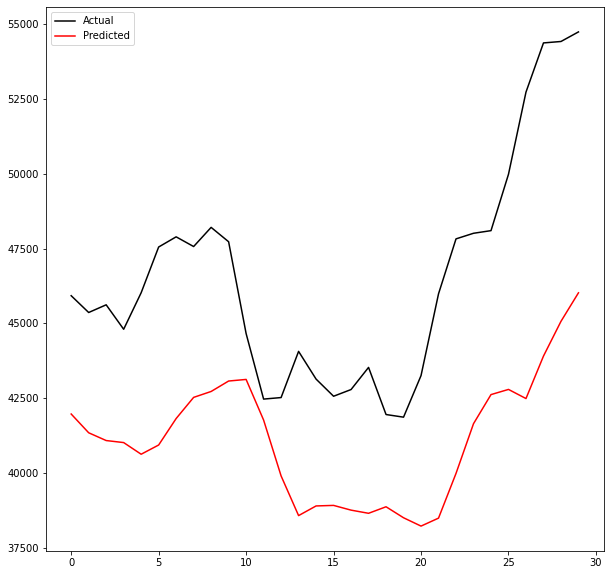

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int3_0.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 





In [49]:
# test run of the interval3_ann_model_nextday()
interval3_ann_model_nextday(X, y)

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00337: early stopping
Training R-Squared: 0.9968191694917755

Testing R-Squared: 0.9961255329366944

30day Holdout R-Squared: -2.5569036850196247

30day Holdout MAE: 6478.176692708334

30day Holdout MAPE: 13.648948429303912

30day Holdout RMSE: 6953.33530896256


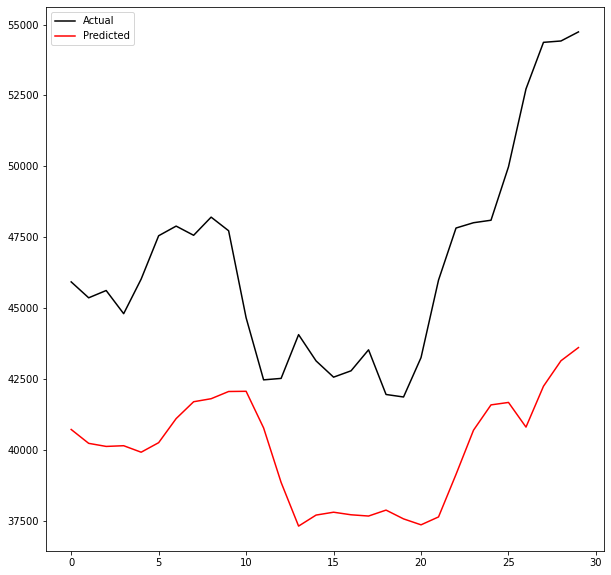

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01relu64Int3_122.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00296: early stopping
Training R-Squared: 0.9949668599723369

Testing R-Squared: 0.9964866728065657

30day Holdout R-Squared: -0.38954482805478197

30day Holdout MAE: 3947.024609375

30day Holdout MAPE: 8.314541796423432

30day Holdout RMSE: 4346.03681744


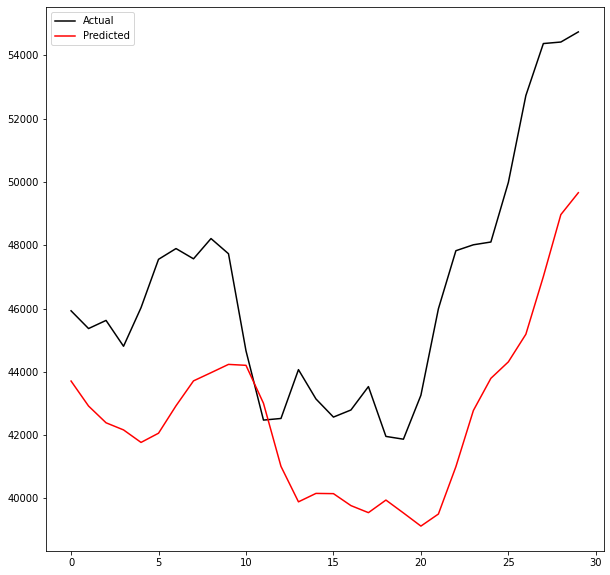

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01elu64Int3_123.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00634: early stopping
Training R-Squared: 0.9980550446114731

Testing R-Squared: 0.9962943038142855

30day Holdout R-Squared: -0.9533454731893172

30day Holdout MAE: 4842.773307291666

30day Holdout MAPE: 10.255402138723205

30day Holdout RMSE: 5152.839914760554


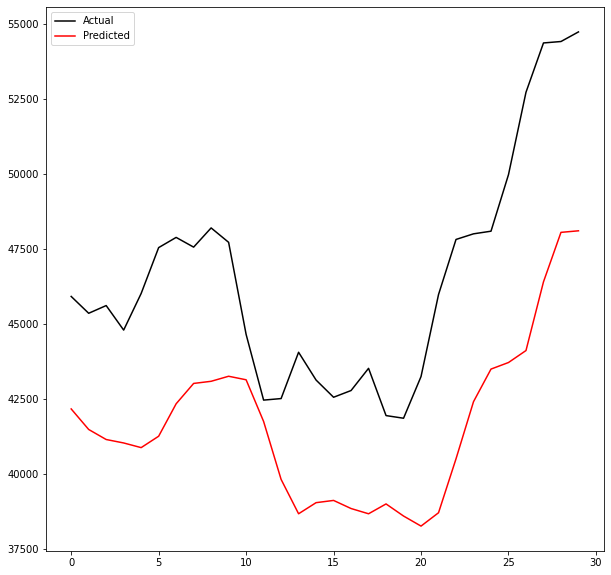

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001relu64Int3_124.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00669: early stopping
Training R-Squared: 0.9961679843974783

Testing R-Squared: 0.9964632611929519

30day Holdout R-Squared: -2.5268543038742473

30day Holdout MAE: 6680.482682291667

30day Holdout MAPE: 14.216485333022238

30day Holdout RMSE: 6923.901479198983


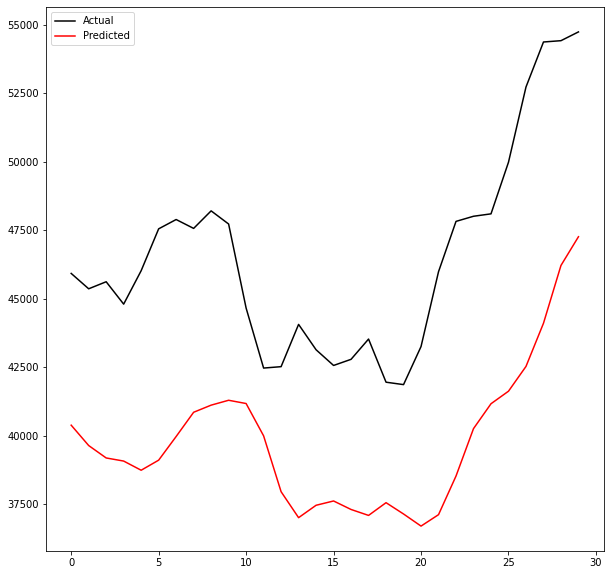

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001elu64Int3_125.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01061: early stopping
Training R-Squared: 0.9960570654172464

Testing R-Squared: 0.9966834940648066

30day Holdout R-Squared: 0.43453349944154607

30day Holdout MAE: 2354.175260416667

30day Holdout MAPE: 4.924238252933843

30day Holdout RMSE: 2772.42981610747


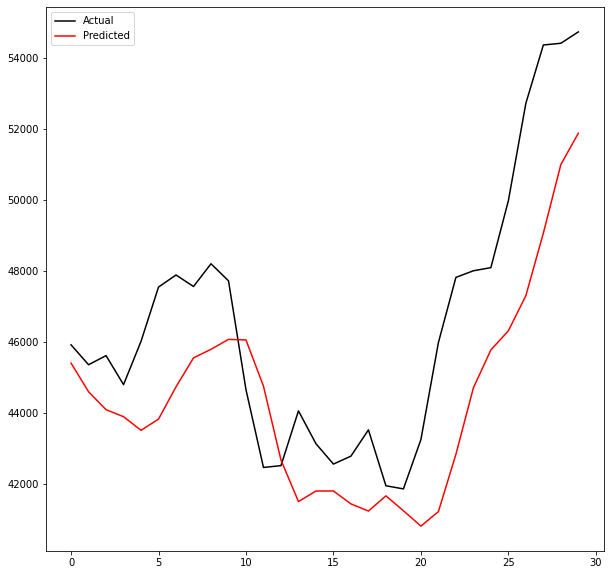

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001relu64Int3_126.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01487: early stopping
Training R-Squared: 0.9957569277234634

Testing R-Squared: 0.9967920160232201

30day Holdout R-Squared: -0.7979900532732316

30day Holdout MAE: 4576.139713541666

30day Holdout MAPE: 9.651688616969272

30day Holdout RMSE: 4943.68467844385


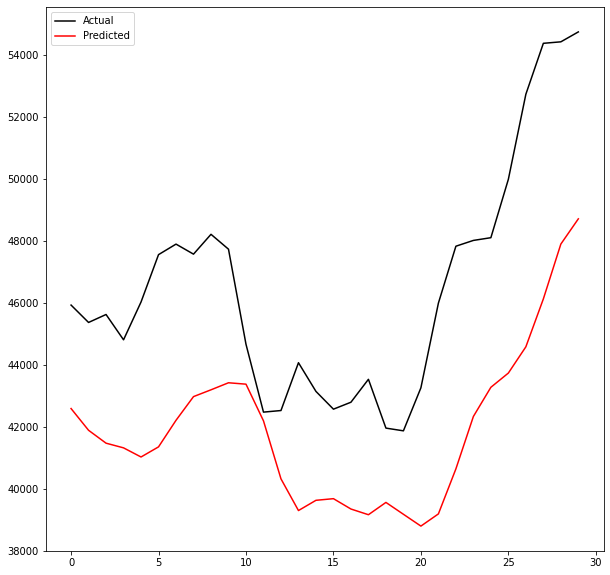

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001elu64Int3_127.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00288: early stopping
Training R-Squared: 0.9969494436270883

Testing R-Squared: 0.9961236822901658

30day Holdout R-Squared: -0.6319697436801035

30day Holdout MAE: 4147.030729166667

30day Holdout MAPE: 8.656590370226738

30day Holdout RMSE: 4709.916106115902


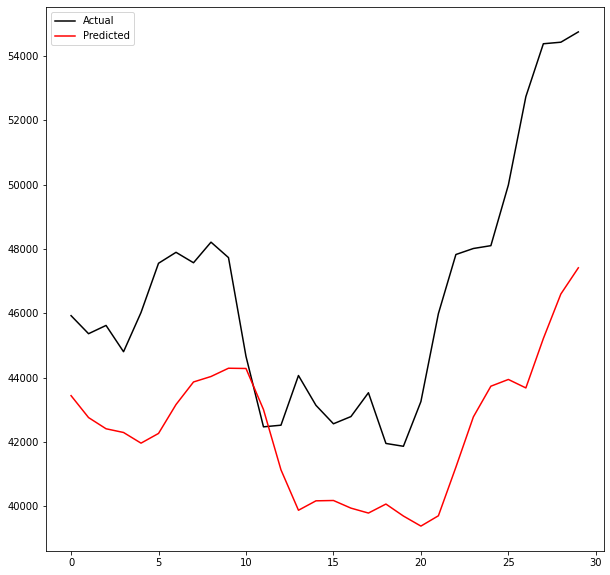

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int3_128.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00657: early stopping
Training R-Squared: 0.994310171763317

Testing R-Squared: 0.993191363795978

30day Holdout R-Squared: -0.042722392105762674

30day Holdout MAE: 3192.38671875

30day Holdout MAPE: 6.6408134484101895

30day Holdout RMSE: 3764.7961877092944


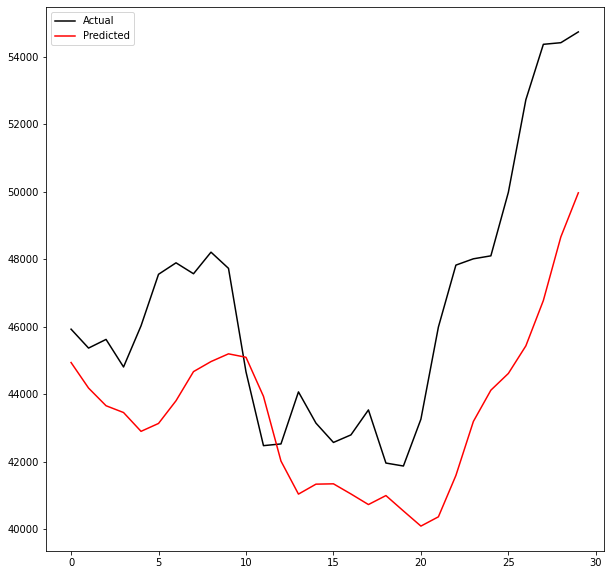

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01elu64Int3_129.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00500: early stopping
Training R-Squared: 0.9980895767813106

Testing R-Squared: 0.9968822668455921

30day Holdout R-Squared: 0.2266321504923673

30day Holdout MAE: 2719.8127604166666

30day Holdout MAPE: 5.640904340733339

30day Holdout RMSE: 3242.277458053432


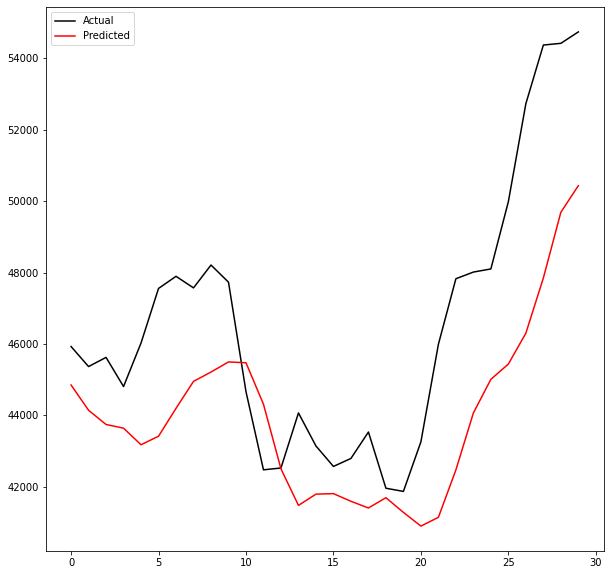

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001relu64Int3_130.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00415: early stopping
Training R-Squared: 0.9957582407815154

Testing R-Squared: 0.9959253134967551

30day Holdout R-Squared: -1.5903770146408025

30day Holdout MAE: 5595.6640625

30day Holdout MAPE: 11.828154070911015

30day Holdout RMSE: 5933.877944601561


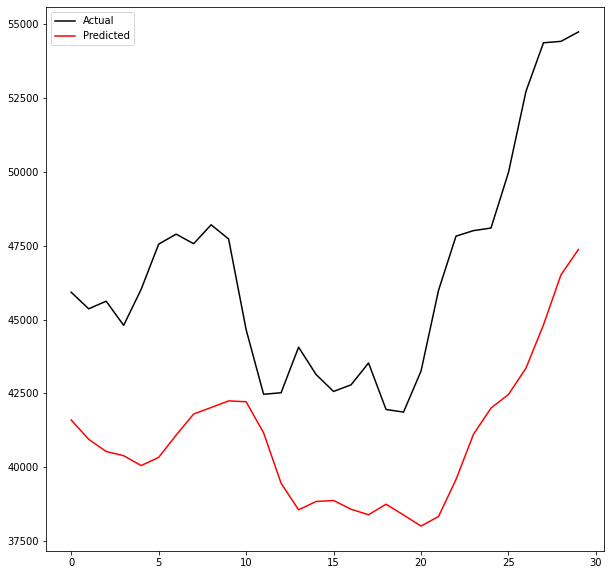

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001elu64Int3_131.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00888: early stopping
Training R-Squared: 0.9965771125021414

Testing R-Squared: 0.9963920887571757

30day Holdout R-Squared: 0.4382571093784339

30day Holdout MAE: 2371.618229166667

30day Holdout MAPE: 4.982002425389838

30day Holdout RMSE: 2763.286481865276


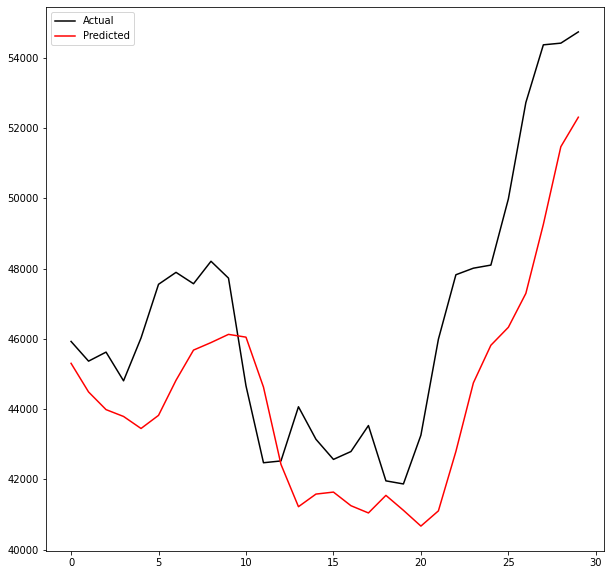

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001relu64Int3_132.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01055: early stopping
Training R-Squared: 0.9957226018536758

Testing R-Squared: 0.9965143473222876

30day Holdout R-Squared: -1.3838113610237617

30day Holdout MAE: 5387.985416666666

30day Holdout MAPE: 11.406350415187053

30day Holdout RMSE: 5692.369233746564


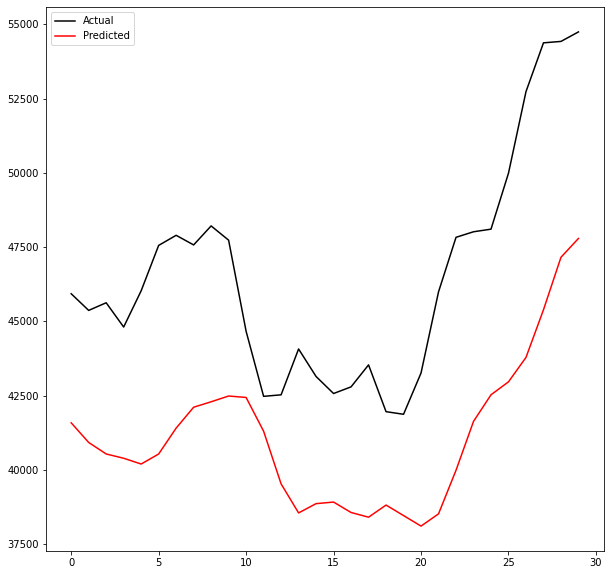

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001elu64Int3_133.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00336: early stopping
Training R-Squared: 0.9968453923864958

Testing R-Squared: 0.9952957566971163

30day Holdout R-Squared: -0.6284497723368994

30day Holdout MAE: 4020.26640625

30day Holdout MAPE: 8.344540771518906

30day Holdout RMSE: 4704.833990143409


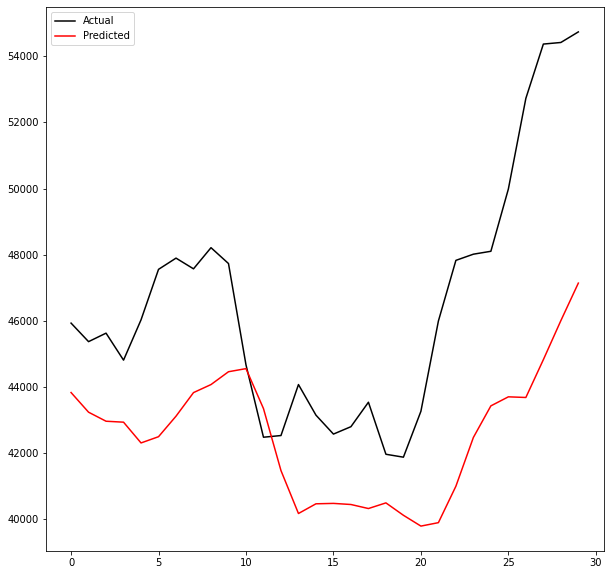

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01relu64Int3_134.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00330: early stopping
Training R-Squared: 0.9955820583142897

Testing R-Squared: 0.9957997739599433

30day Holdout R-Squared: 0.16937174752693063

30day Holdout MAE: 2896.73046875

30day Holdout MAPE: 6.043518243562793

30day Holdout RMSE: 3360.163960697663


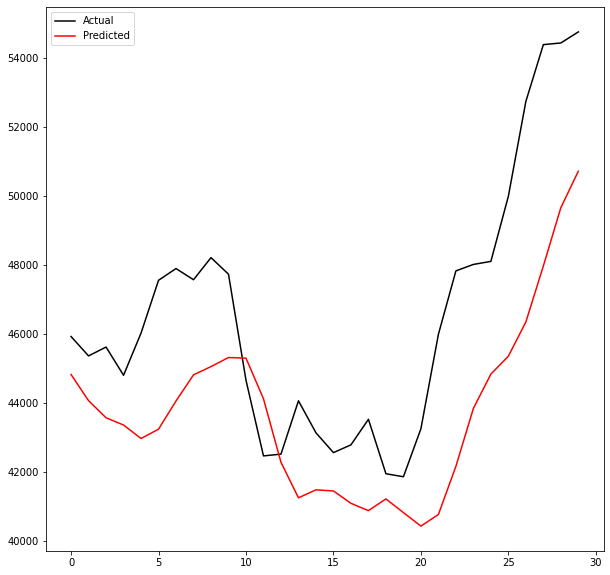

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01elu64Int3_135.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00412: early stopping
Training R-Squared: 0.9980063086517436

Testing R-Squared: 0.9960629759785542

30day Holdout R-Squared: -0.689520949415066

30day Holdout MAE: 4343.698046875

30day Holdout MAPE: 9.119188483047854

30day Holdout RMSE: 4792.2438717855075


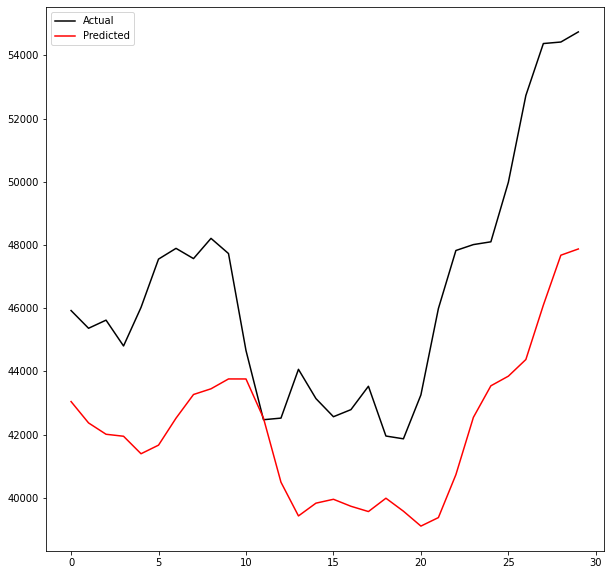

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001relu64Int3_136.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00576: early stopping
Training R-Squared: 0.9963184367544258

Testing R-Squared: 0.9961837665892946

30day Holdout R-Squared: -2.5865489630045

30day Holdout MAE: 6626.268229166667

30day Holdout MAPE: 14.009163311247008

30day Holdout RMSE: 6982.251727303668


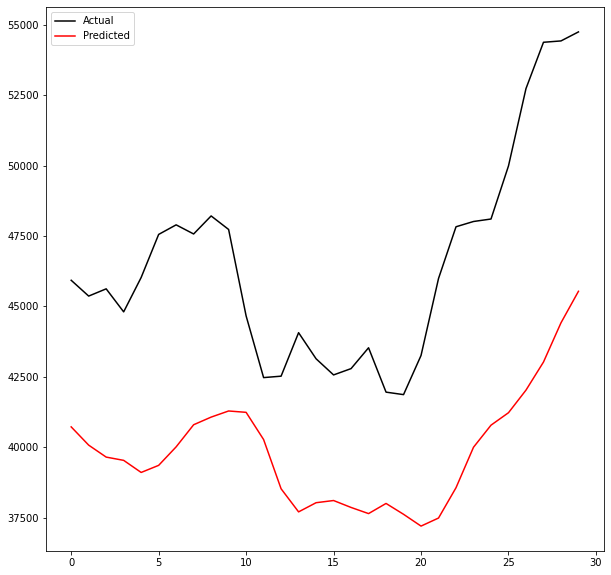

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001elu64Int3_137.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00887: early stopping
Training R-Squared: 0.9968417568784366

Testing R-Squared: 0.9966206455094542

30day Holdout R-Squared: 0.5419018199205421

30day Holdout MAE: 2030.019921875

30day Holdout MAPE: 4.242619558826599

30day Holdout RMSE: 2495.378352755831


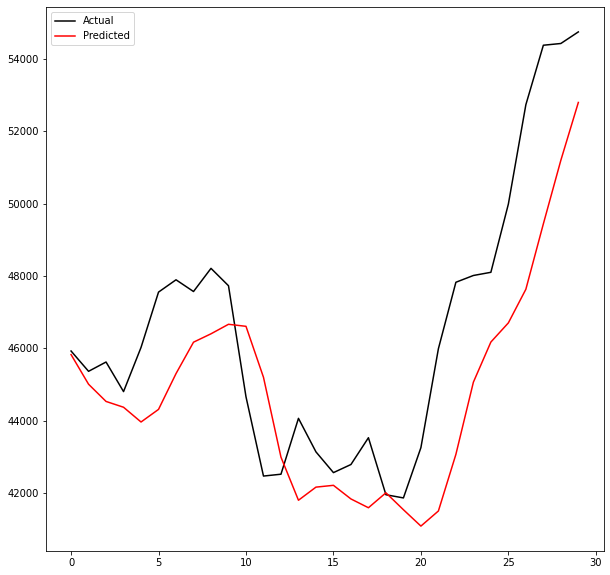

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001relu64Int3_138.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01028: early stopping
Training R-Squared: 0.9958864029323833

Testing R-Squared: 0.9964018680853481

30day Holdout R-Squared: -0.5818195329731415

30day Holdout MAE: 4273.712890625

30day Holdout MAPE: 9.015319038014848

30day Holdout RMSE: 4636.9838907018075


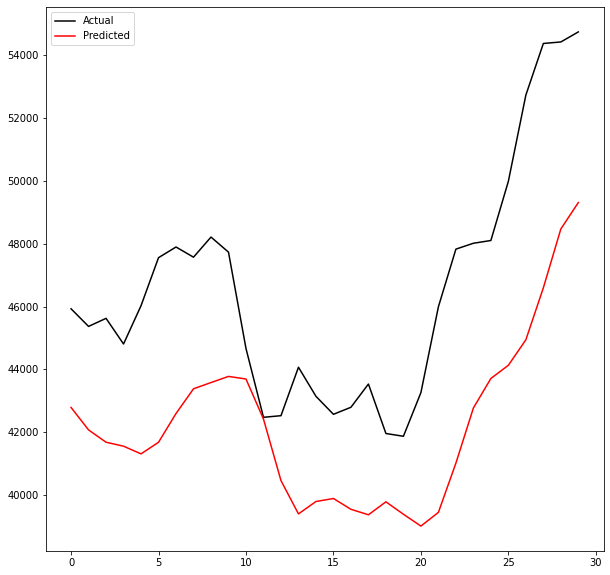

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001elu64Int3_139.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00210: early stopping
Training R-Squared: 0.9935931766357231

Testing R-Squared: 0.992451414957561

30day Holdout R-Squared: 0.47543790009303677

30day Holdout MAE: 2029.9858072916666

30day Holdout MAPE: 4.1900204534197725

30day Holdout RMSE: 2670.272447843054


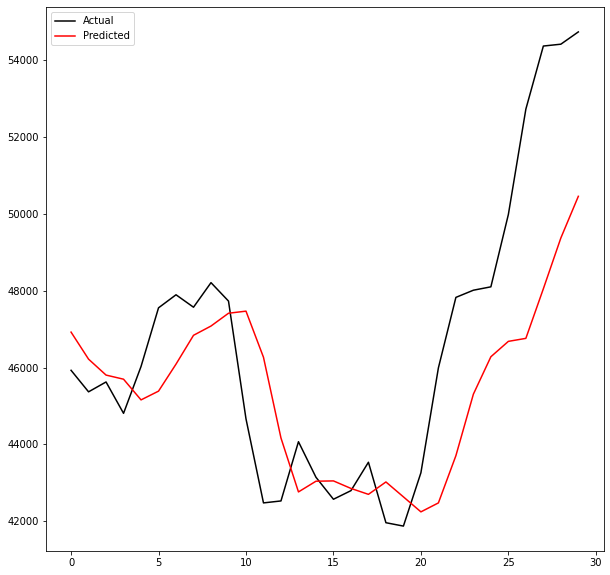

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01relu64Int3_140.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00338: early stopping
Training R-Squared: 0.9959503080342461

Testing R-Squared: 0.9960822286925227

30day Holdout R-Squared: -0.40877328855577844

30day Holdout MAE: 3989.7208333333333

30day Holdout MAPE: 8.426483045726949

30day Holdout RMSE: 4376.0036373515


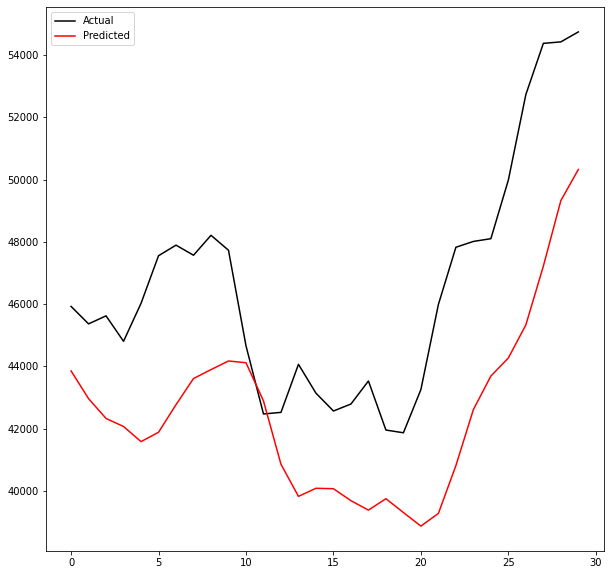

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01elu64Int3_141.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00570: early stopping
Training R-Squared: 0.9985123135342543

Testing R-Squared: 0.9962561171645269

30day Holdout R-Squared: -0.42828786466846935

30day Holdout MAE: 3964.318880208333

30day Holdout MAPE: 8.312102185574236

30day Holdout RMSE: 4406.207985280595


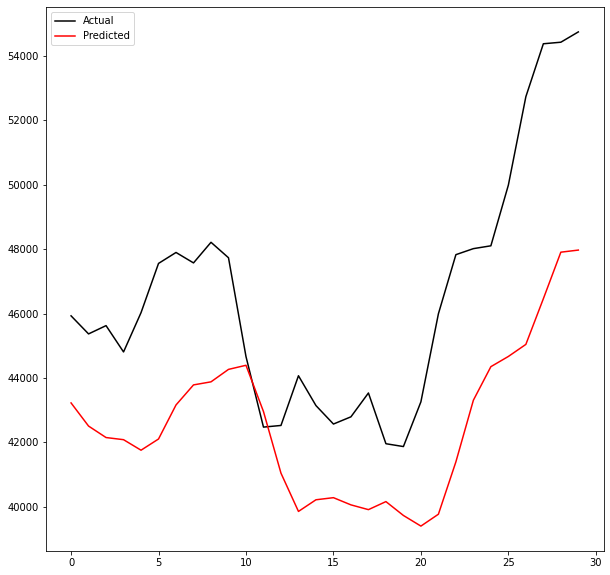

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001relu64Int3_142.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00237: early stopping
Training R-Squared: 0.9955407361409288

Testing R-Squared: 0.9963074682212364

30day Holdout R-Squared: -2.57904861595814

30day Holdout MAE: 6703.7671875

30day Holdout MAPE: 14.240615135997395

30day Holdout RMSE: 6974.947112258552


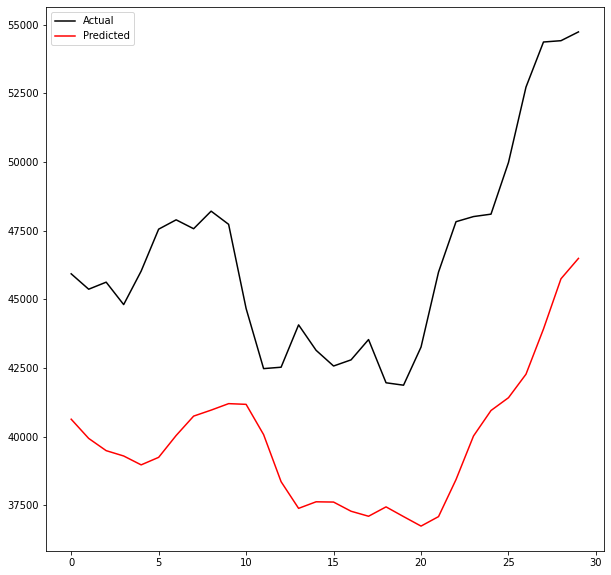

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001elu64Int3_143.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00662: early stopping
Training R-Squared: 0.9970377724824875

Testing R-Squared: 0.9963692543231722

30day Holdout R-Squared: 0.3886284692541132

30day Holdout MAE: 2455.2532552083335

30day Holdout MAPE: 5.145361638775587

30day Holdout RMSE: 2882.768220570109


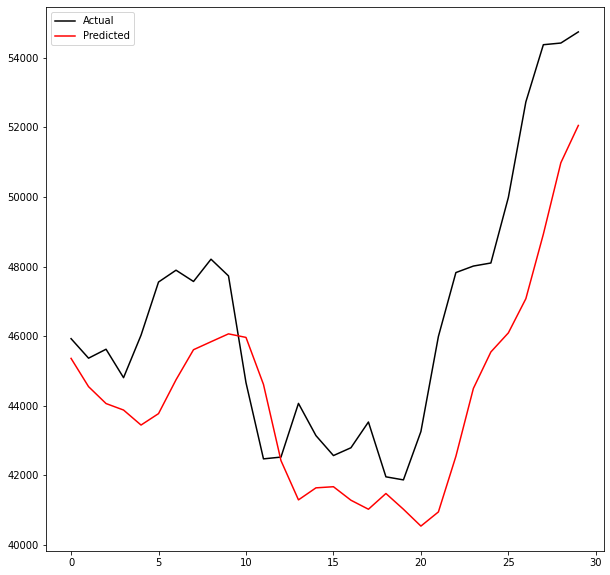

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001relu64Int3_144.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01259: early stopping
Training R-Squared: 0.99622956122818

Testing R-Squared: 0.9964847442438532

30day Holdout R-Squared: -1.6299833674583208

30day Holdout MAE: 5674.264322916667

30day Holdout MAPE: 12.02892389100329

30day Holdout RMSE: 5979.069767154358


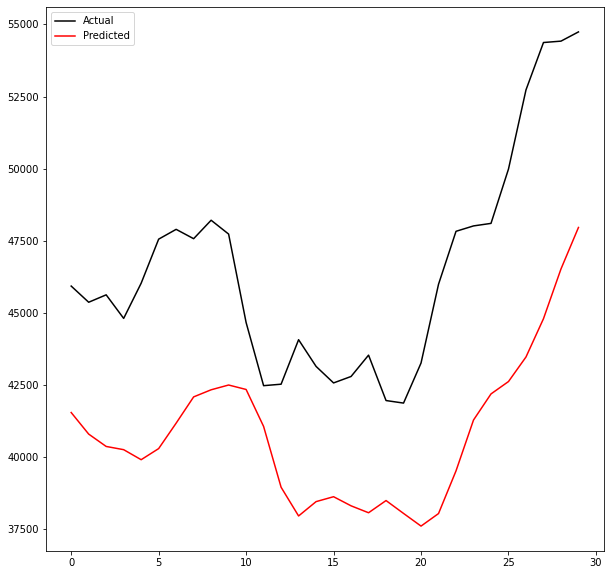

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001elu64Int3_145.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00370: early stopping
Training R-Squared: 0.9917658293124579

Testing R-Squared: 0.9872025533049056

30day Holdout R-Squared: 0.7119324781627481

30day Holdout MAE: 1559.1483072916667

30day Holdout MAPE: 3.371798051687029

30day Holdout RMSE: 1978.8107833085517


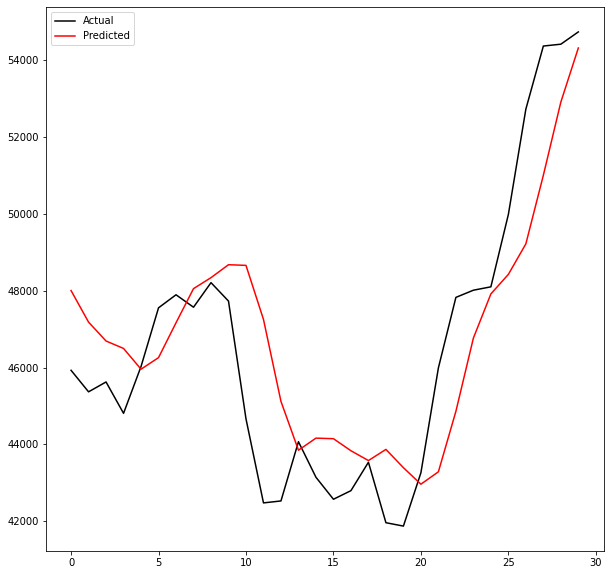

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01relu64Int3_146.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00360: early stopping
Training R-Squared: 0.9958683151534122

Testing R-Squared: 0.9958276481691644

30day Holdout R-Squared: 0.5134773954772001

30day Holdout MAE: 2011.83828125

30day Holdout MAPE: 4.1632267355682355

30day Holdout RMSE: 2571.6308768806744


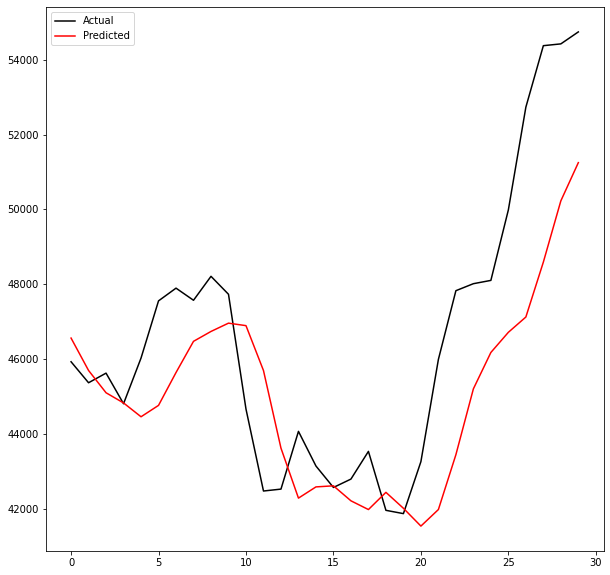

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01elu64Int3_147.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00536: early stopping
Training R-Squared: 0.9983820533529363

Testing R-Squared: 0.9955274253697738

30day Holdout R-Squared: -0.333609877127921

30day Holdout MAE: 3831.955598958333

30day Holdout MAPE: 8.067367592147047

30day Holdout RMSE: 4257.665336268831


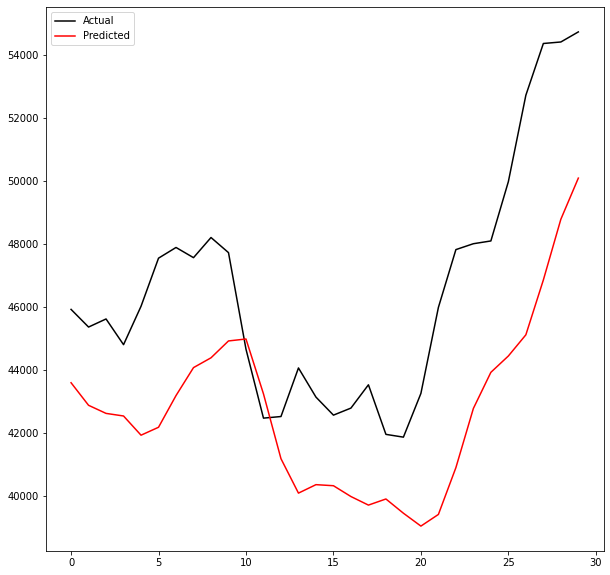

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001relu64Int3_148.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00313: early stopping
Training R-Squared: 0.9955136164043691

Testing R-Squared: 0.9956533583709508

30day Holdout R-Squared: -2.1923351953408035

30day Holdout MAE: 6274.009635416666

30day Holdout MAPE: 13.28668070109573

30day Holdout RMSE: 6587.359465295971


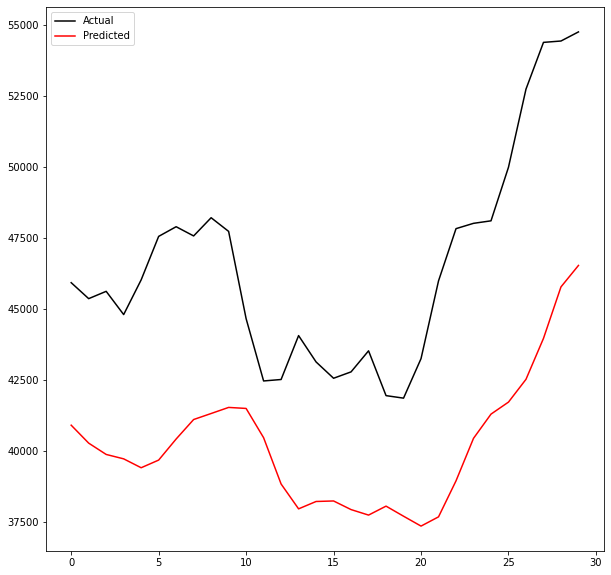

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001elu64Int3_149.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00666: early stopping
Training R-Squared: 0.9973994925476203

Testing R-Squared: 0.9960062312516369

30day Holdout R-Squared: 0.5423713112893481

30day Holdout MAE: 1956.3727864583334

30day Holdout MAPE: 4.060470671021653

30day Holdout RMSE: 2494.099304969352


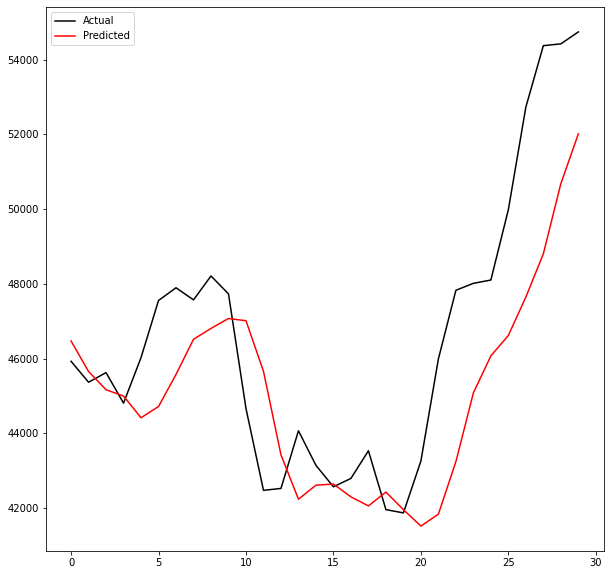

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001relu64Int3_150.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01538: early stopping
Training R-Squared: 0.9969538732308225

Testing R-Squared: 0.9965777085941997

30day Holdout R-Squared: -3.6504277663872093

30day Holdout MAE: 7661.3265625

30day Holdout MAPE: 16.283282218110326

30day Holdout RMSE: 7950.667135776624


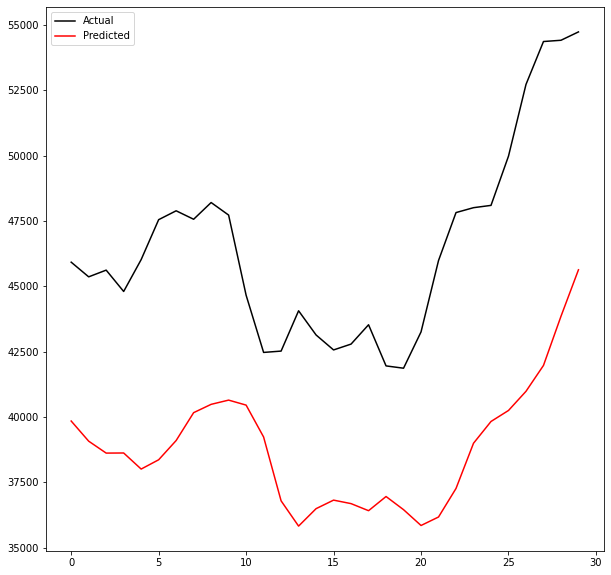

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001elu64Int3_151.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: Adam
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.6542952438667127

Testing R-Squared: -0.6499885175350233

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


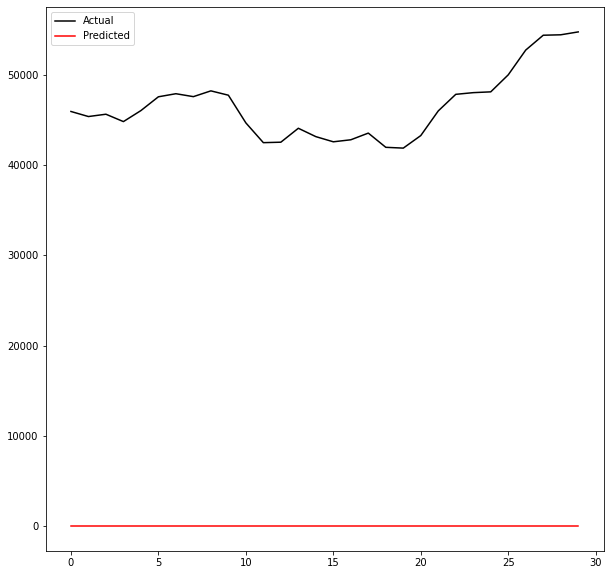

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01relu64Int3_152.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00550: early stopping
Training R-Squared: 0.991696976864076

Testing R-Squared: 0.9900681799919503

30day Holdout R-Squared: -18.311281103569062

30day Holdout MAE: 15945.655794270833

30day Holdout MAPE: 34.053159597364996

30day Holdout RMSE: 16201.777471289503


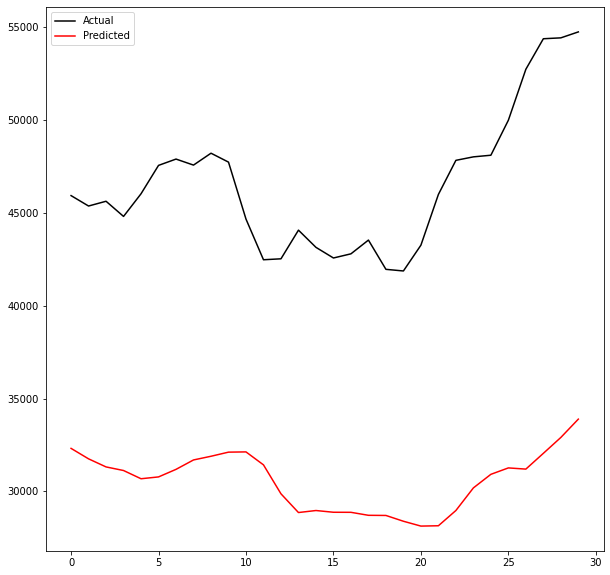

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01elu64Int3_153.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00351: early stopping
Training R-Squared: 0.995466101239522

Testing R-Squared: 0.9942779446996328

30day Holdout R-Squared: 0.5075399917004839

30day Holdout MAE: 2042.7311197916667

30day Holdout MAPE: 4.232969411350571

30day Holdout RMSE: 2587.2750716469764


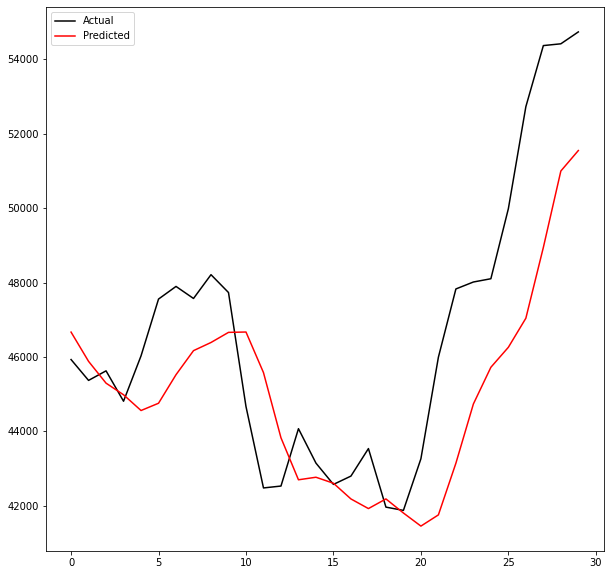

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001relu64Int3_154.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00366: early stopping
Training R-Squared: 0.9943187982542471

Testing R-Squared: 0.9961472955346308

30day Holdout R-Squared: -2.1470448293931628

30day Holdout MAE: 6213.502994791666

30day Holdout MAPE: 13.16579973175692

30day Holdout RMSE: 6540.464380075301


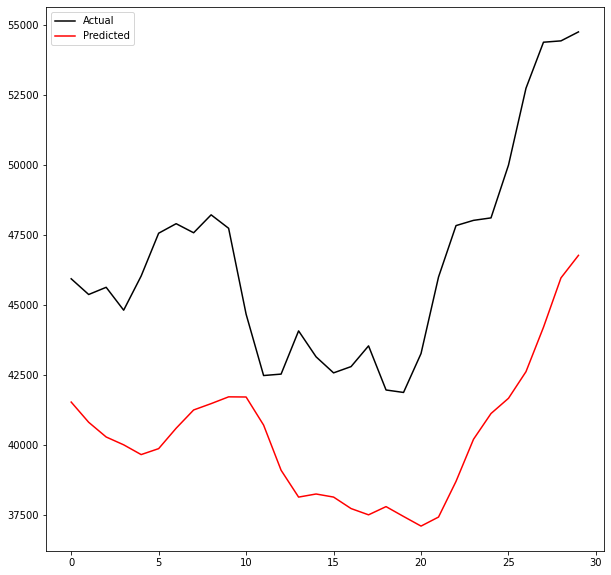

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001elu64Int3_155.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01332: early stopping
Training R-Squared: 0.9959646700070789

Testing R-Squared: 0.9966160103924139

30day Holdout R-Squared: 0.5102081775803522

30day Holdout MAE: 2154.134765625

30day Holdout MAPE: 4.513985550179148

30day Holdout RMSE: 2580.2565251582337


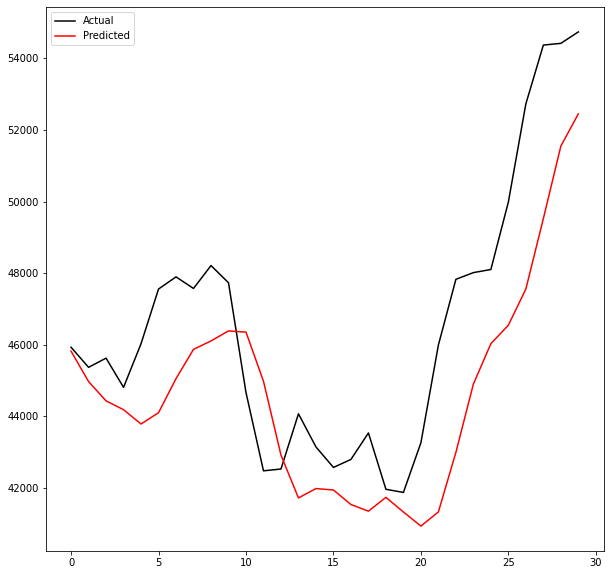

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001relu64Int3_156.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01334: early stopping
Training R-Squared: 0.9954615259904833

Testing R-Squared: 0.9965485965304385

30day Holdout R-Squared: -1.1778990753129013

30day Holdout MAE: 5096.723697916666

30day Holdout MAPE: 10.771470488646582

30day Holdout RMSE: 5440.965790474108


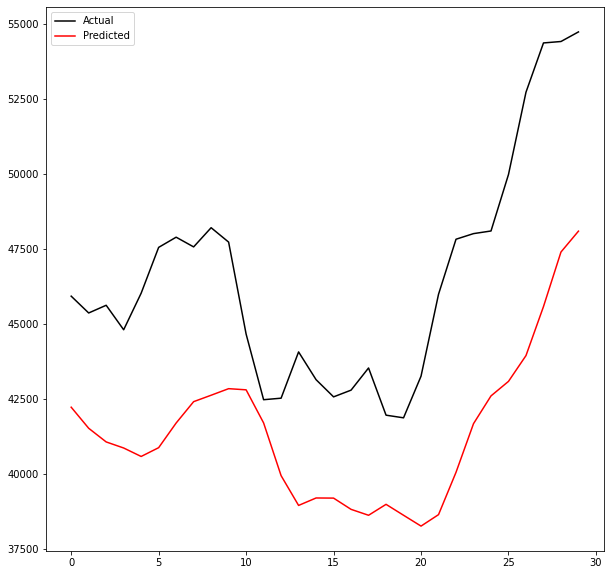

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001elu64Int3_157.hdf5
Number of Neurons: 200
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00408: early stopping
Training R-Squared: 0.9952682562945788

Testing R-Squared: 0.9951997876895459

30day Holdout R-Squared: 0.2554694055661464

30day Holdout MAE: 2638.563932291667

30day Holdout MAPE: 5.477451105261257

30day Holdout RMSE: 3181.254356166932


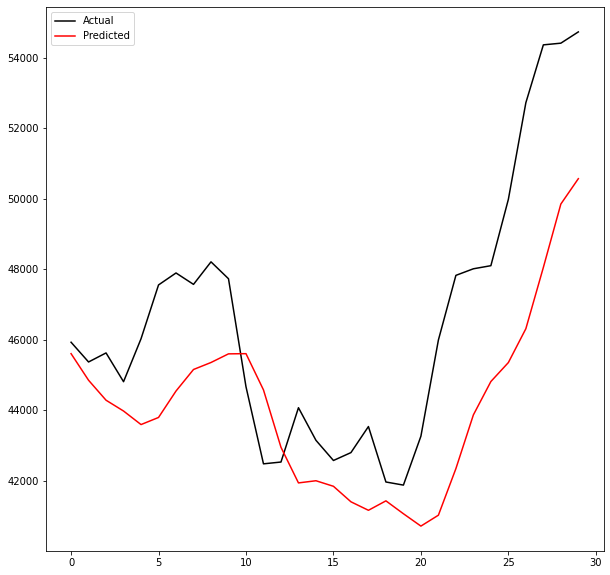

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01relu64Int3_158.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00424: early stopping
Training R-Squared: 0.9955092948426316

Testing R-Squared: 0.9924235718223083

30day Holdout R-Squared: -9.542520834261456

30day Holdout MAE: 11672.295442708333

30day Holdout MAPE: 24.835066816780007

30day Holdout RMSE: 11970.970320130693


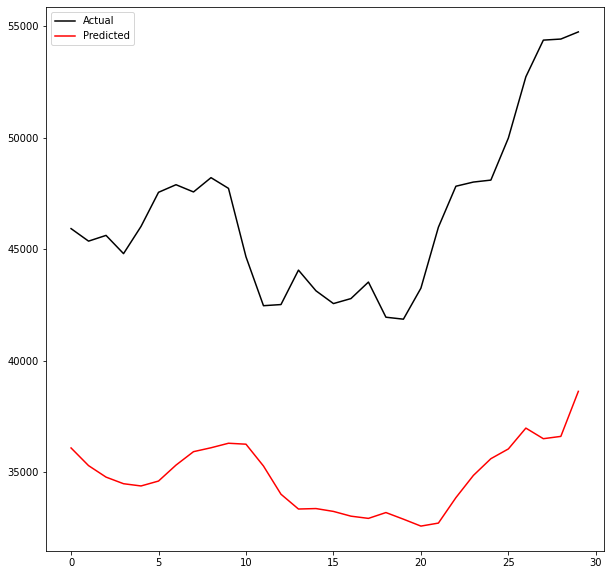

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01elu64Int3_159.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00446: early stopping
Training R-Squared: 0.9965773927164362

Testing R-Squared: 0.9951908504794377

30day Holdout R-Squared: 0.197250372067446

30day Holdout MAE: 2673.264713541667

30day Holdout MAPE: 5.530912226837128

30day Holdout RMSE: 3303.2936047122425


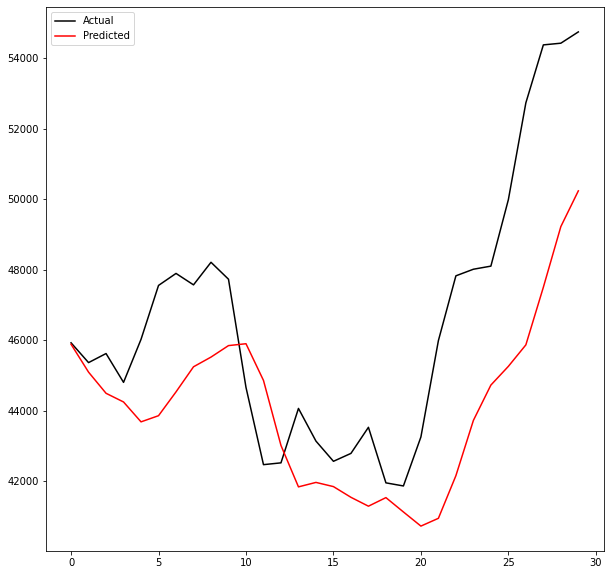

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001relu64Int3_160.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00653: early stopping
Training R-Squared: 0.9948273209611861

Testing R-Squared: 0.9942858762075

30day Holdout R-Squared: -1.8887309131549523

30day Holdout MAE: 5896.605598958334

30day Holdout MAPE: 12.450576269352341

30day Holdout RMSE: 6266.2925202286715


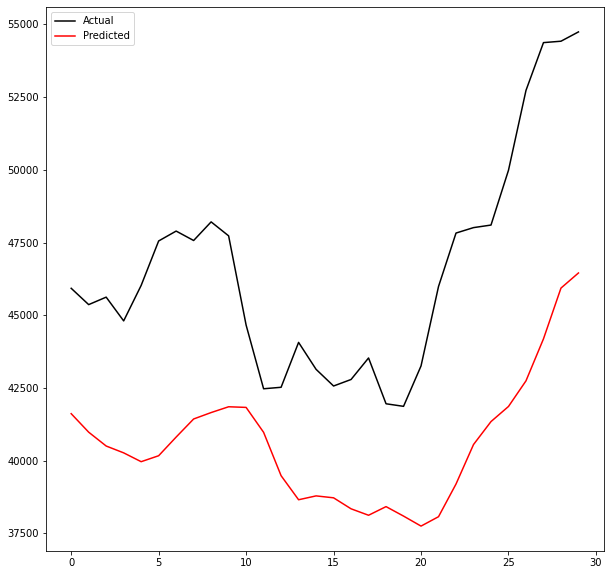

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001elu64Int3_161.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01112: early stopping
Training R-Squared: 0.996136187160748

Testing R-Squared: 0.9950016521254899

30day Holdout R-Squared: 0.5528505288432408

30day Holdout MAE: 1983.0725260416666

30day Holdout MAPE: 4.142199753101016

30day Holdout RMSE: 2465.3777990401018


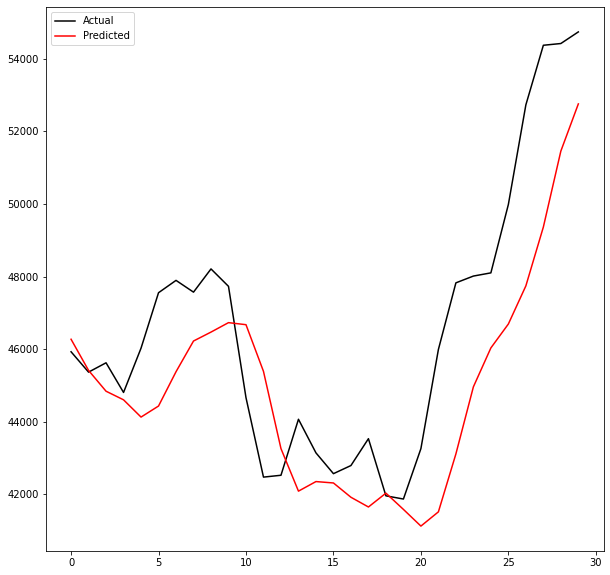

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int3_162.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01060: early stopping
Training R-Squared: 0.9955263429974064

Testing R-Squared: 0.9967453457686666

30day Holdout R-Squared: -1.3692354234635697

30day Holdout MAE: 5352.910677083333

30day Holdout MAPE: 11.324081068925397

30day Holdout RMSE: 5674.9394063085865


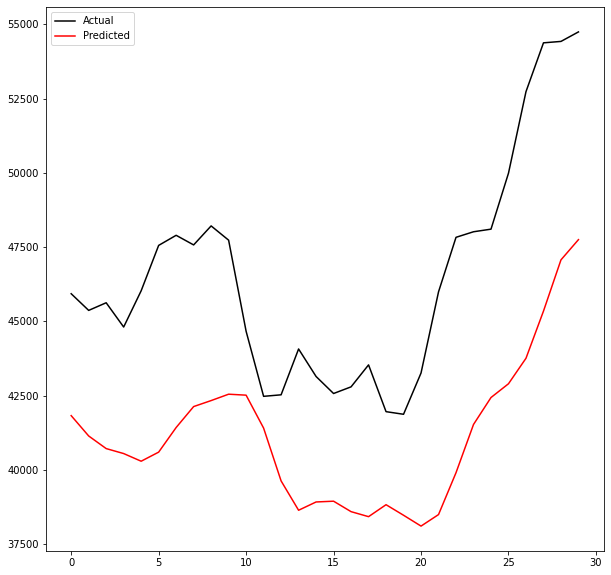

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001elu64Int3_163.hdf5
Number of Neurons: 300
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00171: early stopping
Training R-Squared: 0.9902127637381676

Testing R-Squared: 0.9875735283700002

30day Holdout R-Squared: 0.698921179469535

30day Holdout MAE: 1623.2216145833333

30day Holdout MAPE: 3.493508013231227

30day Holdout RMSE: 2023.0062433862695


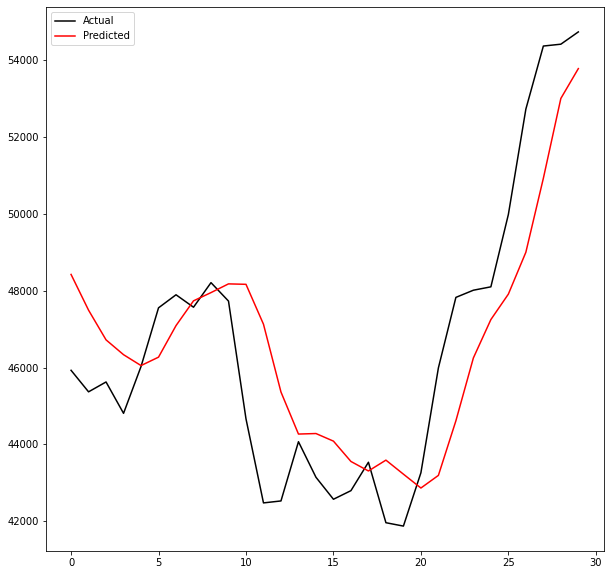

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01relu64Int3_164.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00481: early stopping
Training R-Squared: 0.9959021264073633

Testing R-Squared: 0.9942831124480767

30day Holdout R-Squared: -127.02345218945598

30day Holdout MAE: 40003.725748697914

30day Holdout MAPE: 85.04622915140091

30day Holdout RMSE: 41715.92586864983


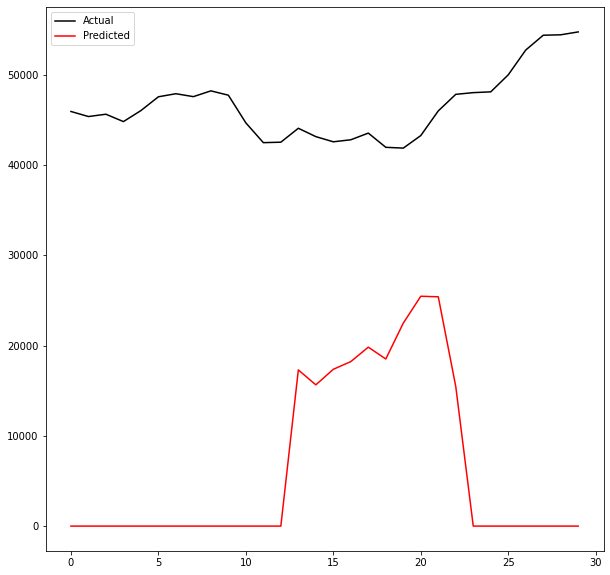

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01elu64Int3_165.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00303: early stopping
Training R-Squared: 0.9920813181118017

Testing R-Squared: 0.9941512704732995

30day Holdout R-Squared: -0.6865328636449823

30day Holdout MAE: 4266.064973958333

30day Holdout MAPE: 8.936662018012623

30day Holdout RMSE: 4788.004216528512


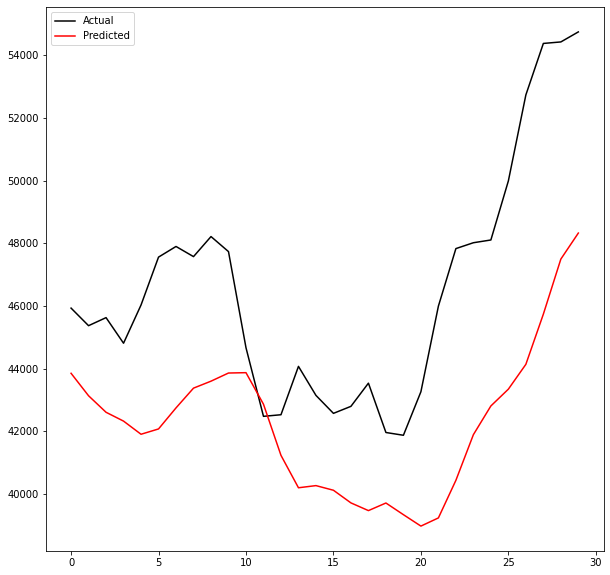

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001relu64Int3_166.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00226: early stopping
Training R-Squared: 0.9757216112369023

Testing R-Squared: 0.9727419276511544

30day Holdout R-Squared: 0.5073972040176689

30day Holdout MAE: 2050.1334635416665

30day Holdout MAPE: 4.2477652514053466

30day Holdout RMSE: 2587.650131784872


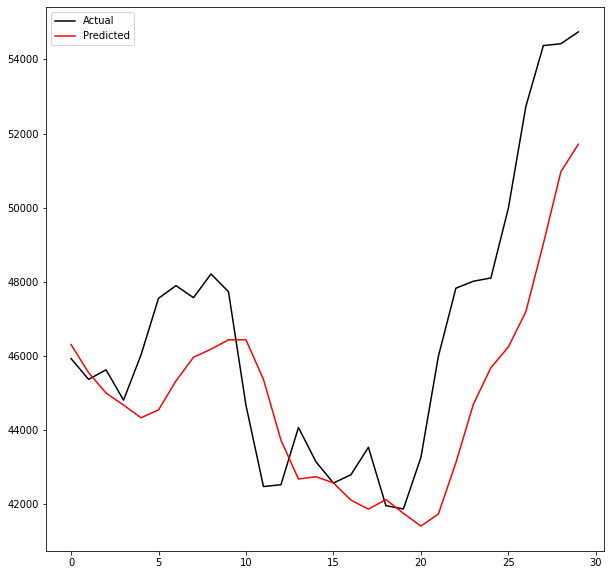

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001elu64Int3_167.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01100: early stopping
Training R-Squared: 0.9970371686192921

Testing R-Squared: 0.9961319105328235

30day Holdout R-Squared: 0.4000867306991961

30day Holdout MAE: 2411.8639322916665

30day Holdout MAPE: 5.047445862614486

30day Holdout RMSE: 2855.6261750905146


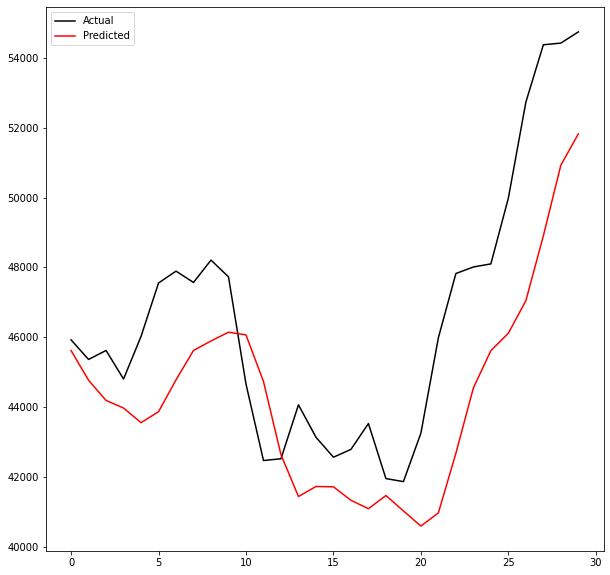

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001relu64Int3_168.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00665: early stopping
Training R-Squared: 0.995393246688516

Testing R-Squared: 0.9964199618044414

30day Holdout R-Squared: -1.6515416833345125

30day Holdout MAE: 5666.862630208333

30day Holdout MAPE: 11.986881067540557

30day Holdout RMSE: 6003.5253594588185


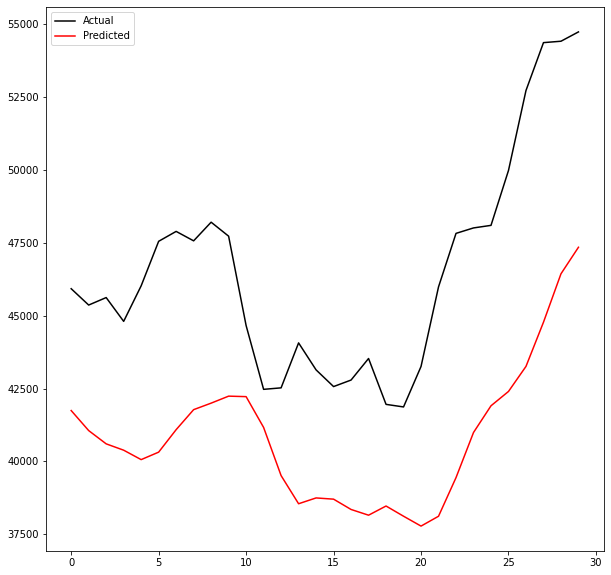

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001elu64Int3_169.hdf5
Number of Neurons: 400
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.6542952438667127

Testing R-Squared: -0.6499885175350233

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


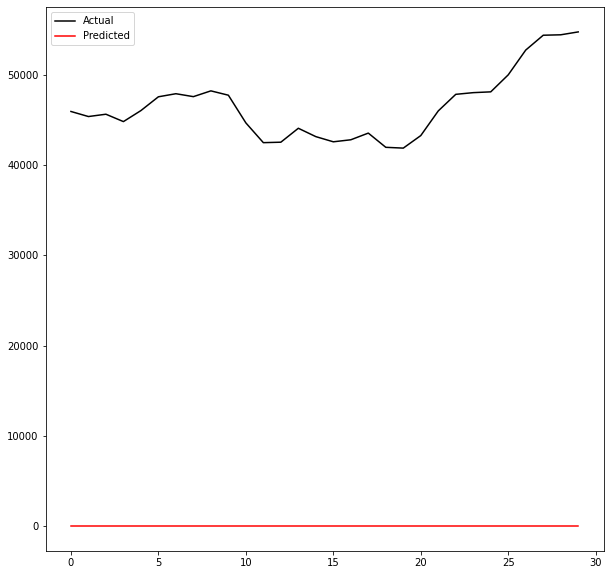

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01relu64Int3_170.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00403: early stopping
Training R-Squared: 0.9937513259183299

Testing R-Squared: 0.9916667060168305

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


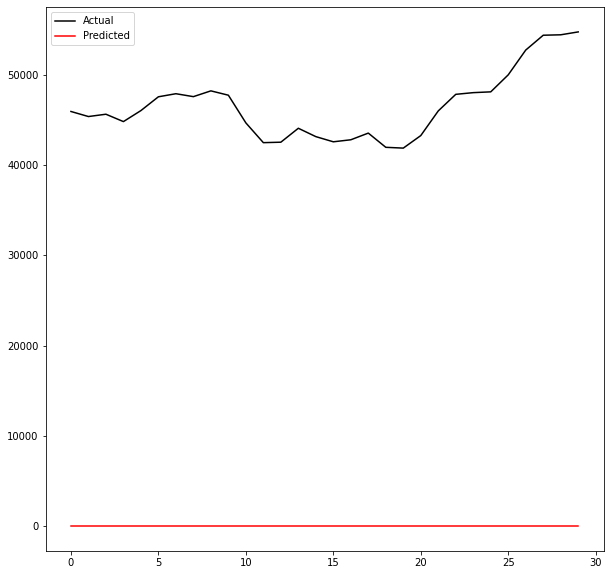

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01elu64Int3_171.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00495: early stopping
Training R-Squared: 0.9961050544843365

Testing R-Squared: 0.9963478342915391

30day Holdout R-Squared: -0.2045023494626137

30day Holdout MAE: 3440.6662760416666

30day Holdout MAPE: 7.153423762796969

30day Holdout RMSE: 4046.3267098910583


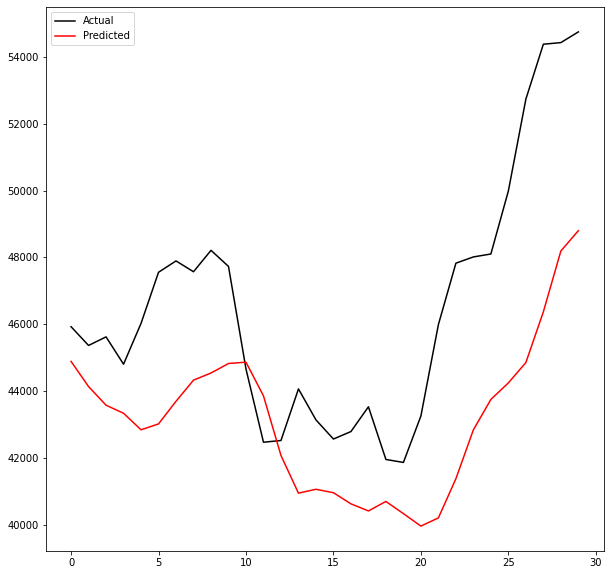

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001relu64Int3_172.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00650: early stopping
Training R-Squared: 0.9907677766590053

Testing R-Squared: 0.9905269085512656

30day Holdout R-Squared: -11.387517936013353

30day Holdout MAE: 12714.234114583332

30day Holdout MAPE: 27.09434939336377

30day Holdout RMSE: 12976.251917680665


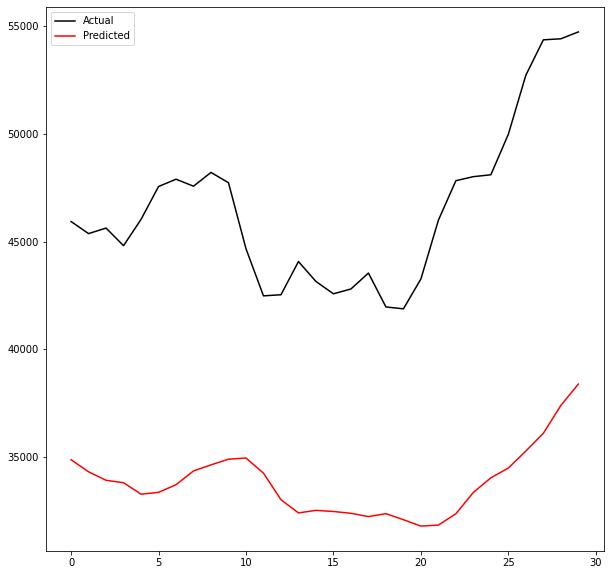

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001elu64Int3_173.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00414: early stopping
Training R-Squared: 0.9957762829374546

Testing R-Squared: 0.994344459765758

30day Holdout R-Squared: 0.4929735685981711

30day Holdout MAE: 2139.2325520833333

30day Holdout MAPE: 4.464815696129861

30day Holdout RMSE: 2625.260595577315


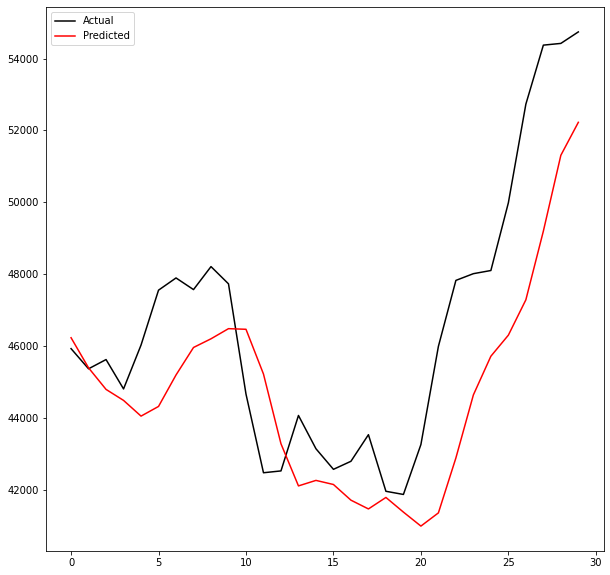

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001relu64Int3_174.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00650: early stopping
Training R-Squared: 0.9938647800676861

Testing R-Squared: 0.9958242052582738

30day Holdout R-Squared: -2.3963428995078124

30day Holdout MAE: 6512.8140625

30day Holdout MAPE: 13.826130346386917

30day Holdout RMSE: 6794.584208947614


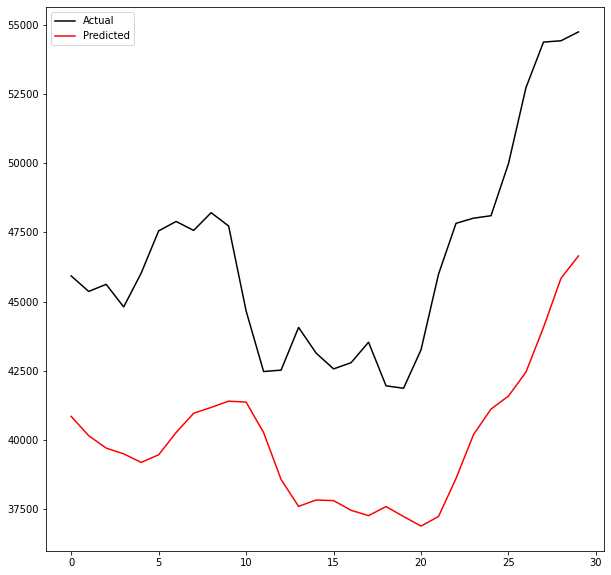

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001elu64Int3_175.hdf5
Number of Neurons: 500
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00495: early stopping
Training R-Squared: 0.9918791831724406

Testing R-Squared: 0.9882407646175857

30day Holdout R-Squared: 0.6697981746616488

30day Holdout MAE: 1709.14765625

30day Holdout MAPE: 3.737044532044061

30day Holdout RMSE: 2118.5896921432904


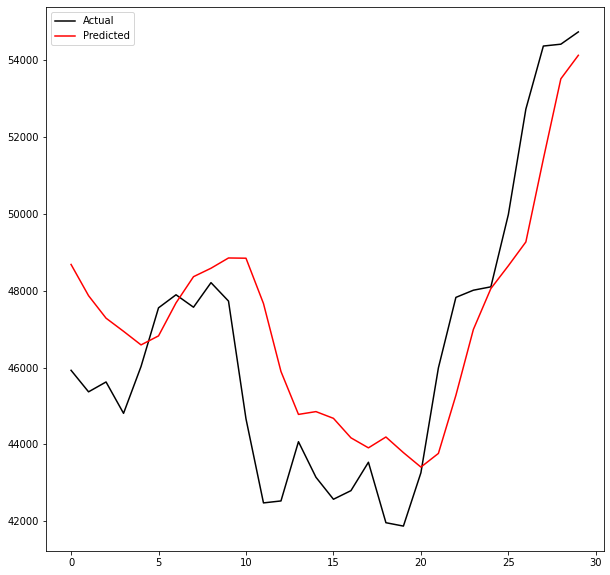

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01relu64Int3_176.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00439: early stopping
Training R-Squared: 0.9867844648712348

Testing R-Squared: 0.9844119130281808

30day Holdout R-Squared: -159.25168558521753

30day Holdout MAE: 46526.36666666667

30day Holdout MAPE: 100.0021621847311

30day Holdout RMSE: 46672.2161622951


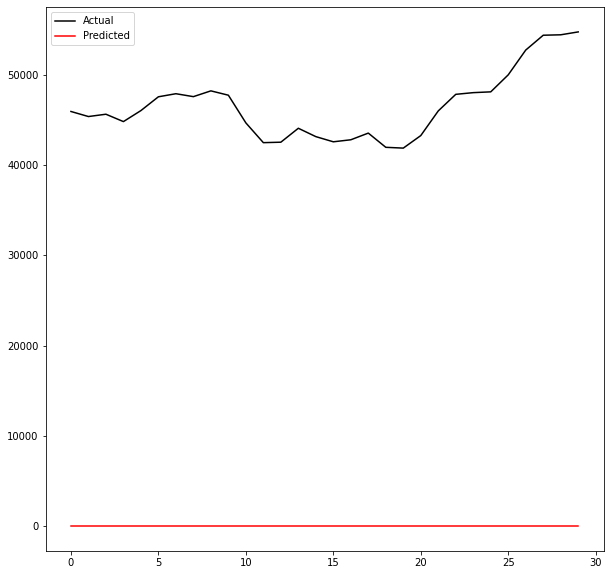

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01elu64Int3_177.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.01
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00555: early stopping
Training R-Squared: 0.994435450388667

Testing R-Squared: 0.9924120337578852

30day Holdout R-Squared: 0.6324726275045962

30day Holdout MAE: 1800.142578125

30day Holdout MAPE: 3.838880506774326

30day Holdout RMSE: 2235.125765644789


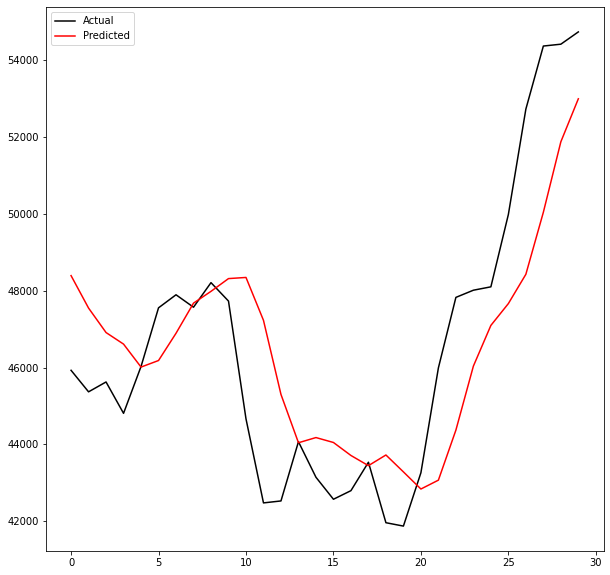

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001relu64Int3_178.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00671: early stopping
Training R-Squared: 0.9943693706518394

Testing R-Squared: 0.9934544940908642

30day Holdout R-Squared: -19.445371087811704

30day Holdout MAE: 16378.462760416667

30day Holdout MAPE: 34.9239940608159

30day Holdout RMSE: 16670.73004294958


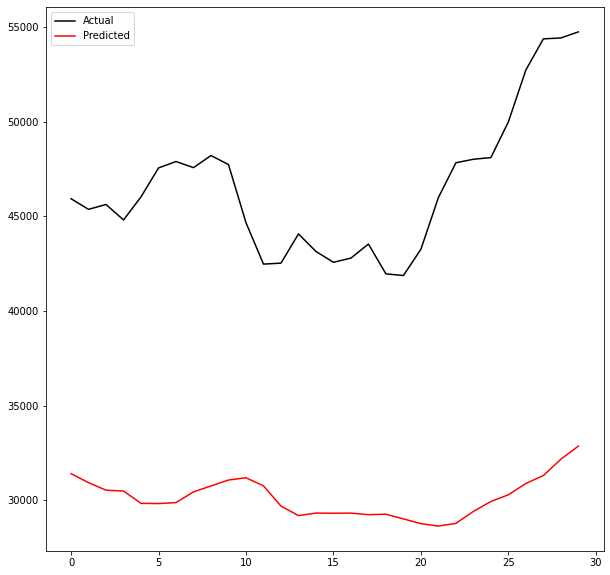

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001elu64Int3_179.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00670: early stopping
Training R-Squared: 0.9967951190300983

Testing R-Squared: 0.9955954854424546

30day Holdout R-Squared: 0.24843276963055783

30day Holdout MAE: 2738.171484375

30day Holdout MAPE: 5.721531511237486

30day Holdout RMSE: 3196.2521855700134


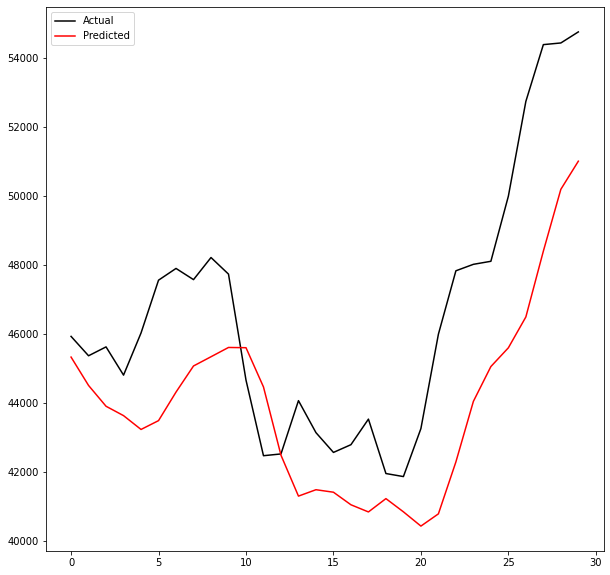

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001relu64Int3_180.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 



[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00673: early stopping
Training R-Squared: 0.995462278846766

Testing R-Squared: 0.996532072143377

30day Holdout R-Squared: -1.9707054766198224

30day Holdout MAE: 6060.697786458333

30day Holdout MAPE: 12.853777513821404

30day Holdout RMSE: 6354.580979704161


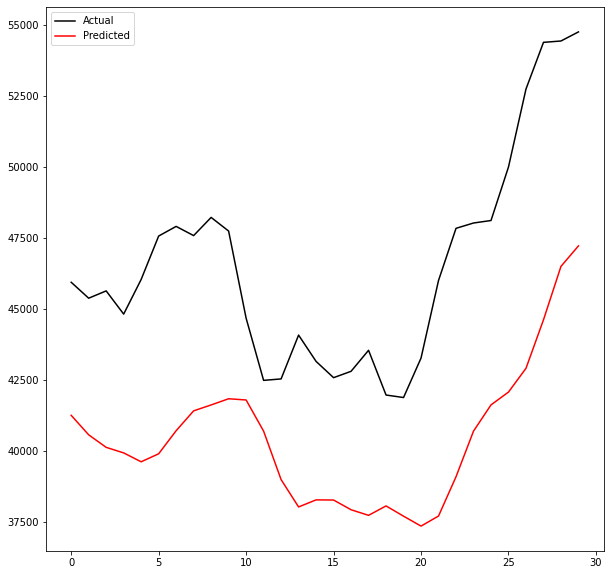

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001elu64Int3_181.hdf5
Number of Neurons: 600
Activation: elu
Optimizer: RMSprop
Learning Rate: 0.0001
Batch Size: 64 





In [50]:
opt_list = ['Adam', 'RMSprop']
activation_list = ['relu', 'elu']
neuron_list = [200, 300, 400, 500, 600]
lr_list = [0.01, 0.001, 0.0001]

count += 1

for op in opt_list:
    for neuron in neuron_list:
        for l in lr_list:
            for act in activation_list:
                interval3_ann_model_nextday(X, y, lr=l, activation=act,
                                            neurons=neuron, opt=op, batch_size=64, epochs=5000, count=count)
                count += 1

## Interval 4 (April 1, 2013 - September 1, 2021)

In [51]:
# create a 4 hidden layer model function for testing hyperparameters

def interval4_ann_model_nextday(X, y, lr=0.01, neurons=300, activation='relu', opt='Adam', batch_size=64, epochs=5000, count=0):
    ''' 
        X is a dataframe of the dates and features using non-standardized values
        The Date column must be the first column in the X dataframe
        y is a dataframe or 1D array of the target values
    '''
    # assign the string values to variables for file naming later in the Checkpoint
    opt_name = opt
    acti = activation
    # remove the . in the learning rate
    learn_rt = re.sub('\.', '-', str(lr))
    
    # create a holdout series of the last 30 days of data
    X_holdout = X.iloc[-30:, 1:] # exclude the first column which is the date column
    y_holdout = y[-30:]
    
    # extract the data from the dates of Interval 4
    date_bool = (X.iloc[:, 0] >= '2013/04/01') & (X.iloc[:, 0] <= '2021/09/01')
    X = X[date_bool]
    # remove the date column
    X = X.iloc[:, 1:]
    # adjust the range of y df
    y = y[X.index]
    
    # create train test split of data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=15)
    
    # scale the data
    estimators = [] # create a list for the scalers
    estimators.append(['minmax', MinMaxScaler()])
    estimators.append(['robust', RobustScaler()])
    # add the scalers to the Pipeline
    scale = Pipeline(estimators, verbose=True)
    # fit the scaler to the training data
    scale.fit(X_train)
    # transform the training, testing, and holdout data
    X_train = scale.transform(X_train)
    X_test = scale.transform(X_test)
    X_holdout = scale.transform(X_holdout)
    

    # define the shape of the input number of features
    shape = X_train.shape[1]
    
    # create call backs to save the model after each epoch if it is the best seen so far
    # and for early stopping when model has not improved after 100 epochs
    mcp_save = ModelCheckpoint('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int4'+'_'+str(count)+'.hdf5', save_best_only=True, monitor='val_loss', mode='auto')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=100, verbose=1, mode='auto')
        
    # create a special definition for the ANN model to adjust hyperparameters
    def seq_model(initializer='normal', activation=activation, neurons=neurons, NUM_FEATURES=shape, opt=opt, lr=lr):
        # create model
        model = Sequential()
        model.add(Dense(neurons, input_shape=(NUM_FEATURES,), kernel_initializer=initializer, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(1, activation=activation, kernel_initializer=initializer))
        # Compile model
        # select an optimizer
        if opt == 'Adam':
            opt = tf.keras.optimizers.Adam(learning_rate=lr)
        elif opt == 'RMSprop':
            opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
        elif opt == 'Adagrad':
            opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
        model.compile(loss='logcosh', optimizer=opt, metrics=['mae'])
        return model
        
    # define the 4 Dense layer model
    ann_model = seq_model(activation=activation, neurons=neurons, NUM_FEATURES=shape)
    

    # create the regressor
    regressor=KerasRegressor(build_fn=seq_model, batch_size=batch_size, epochs=epochs, verbose=0, shuffle=True,
                         validation_split=0.1, validation_freq=1,
                        use_multiprocessing=True, callbacks=[mcp_save,earlyStopping])
    
    # fit the model on training data
    regressor.fit(X_train, y_train)
    
    # use training data for predictions
    y_train_pred = regressor.predict(X_train)
    # calculate R-squared score for train data
    r2 = r2_score(y_train, y_train_pred)
    print('Training R-Squared:', r2)
    
    # use testing data for predictions
    y_test_pred = regressor.predict(X_test)
    # calculate R-squared score for test data
    r2 = r2_score(y_test, y_test_pred)
    print('\nTesting R-Squared:', r2)
    
    # use holdout data for predictions
    y_holdout_pred = regressor.predict(X_holdout)
    # calculate R-squared score for holdout data
    r2 = r2_score(y_holdout, y_holdout_pred)
    print('\n30day Holdout R-Squared:', r2)
    # calculate mean absolute error for holdout data
    mae = mean_absolute_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAE:', mae)
    # calculate mean absolute percentage error for holdout data
    mape = mean_absolute_percentage_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAPE:', mape)
    # calculate root mean squared error 
    rmse = np.sqrt(mean_squared_error(y_holdout, y_holdout_pred))
    print('\n30day Holdout RMSE:', rmse)
    
    # create a df of the holdout predicted and actual
    holdout_df = pd.DataFrame(zip(y_holdout, y_holdout_pred), columns=['actual', 'predicted'])
    
    plt.plot(holdout_df.index, holdout_df['actual'], color='black', label='Actual')
    plt.plot(holdout_df.index, holdout_df['predicted'], color='red', label='Predicted')
    plt.legend()
    plt.show()
    
    print('---------Model Summary For Above Results----------')
    print('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int4'+'_'+str(count)+'.hdf5')
    print('Number of Neurons:', neurons)
    print('Activation:', activation)
    print('Optimizer:', opt_name)
    print('Learning Rate:', lr)
    
    # to be used as the comparison metric
    return r2

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00284: early stopping
Training R-Squared: 0.9973329278186684

Testing R-Squared: 0.9968272210095802

30day Holdout R-Squared: 0.5188381440734091

30day Holdout MAE: 2129.3125

30day Holdout MAPE: 4.458899100170907

30day Holdout RMSE: 2557.423878030582


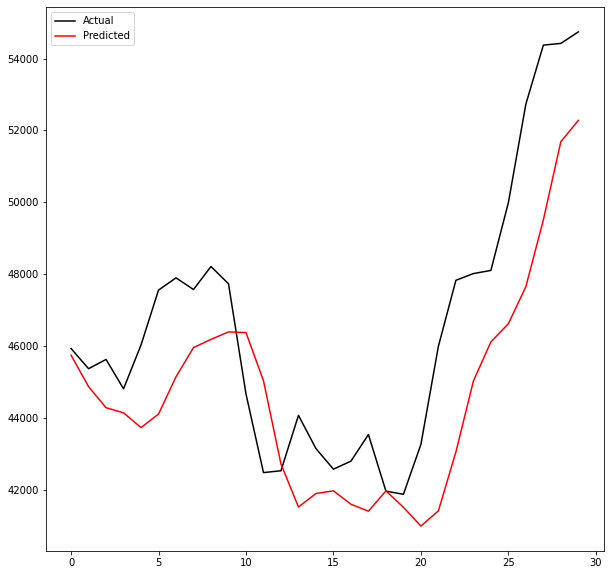

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01relu64Int4_183.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.36031726194235114

Testing R-Squared: -0.3691120377549306

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


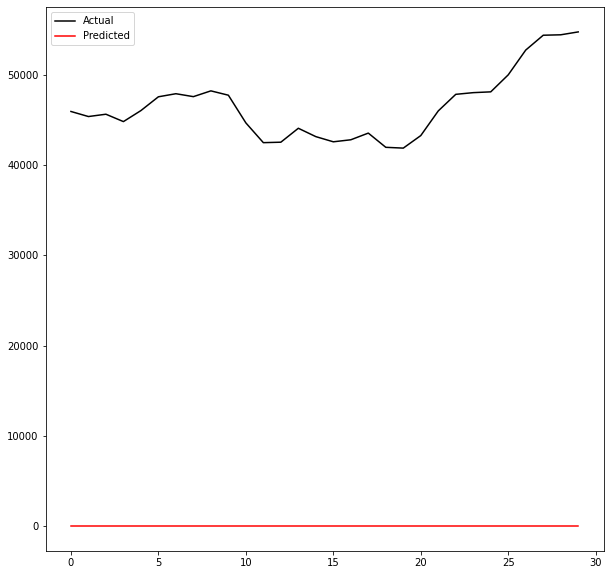

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001relu64Int4_184.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01171: early stopping
Training R-Squared: 0.9977836214306619

Testing R-Squared: 0.997393149211382

30day Holdout R-Squared: 0.7539780703793856

30day Holdout MAE: 1382.6053385416667

30day Holdout MAPE: 2.9251402134229263

30day Holdout RMSE: 1828.706591588882


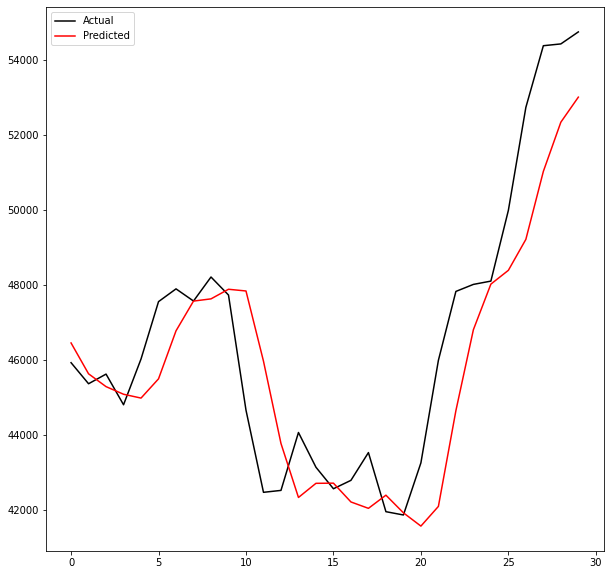

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001relu64Int4_185.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00555: early stopping
Training R-Squared: 0.9926327206715424

Testing R-Squared: 0.9937127231469773

30day Holdout R-Squared: 0.6470764700835554

30day Holdout MAE: 1774.7125

30day Holdout MAPE: 3.908822320977856

30day Holdout RMSE: 2190.26885295827


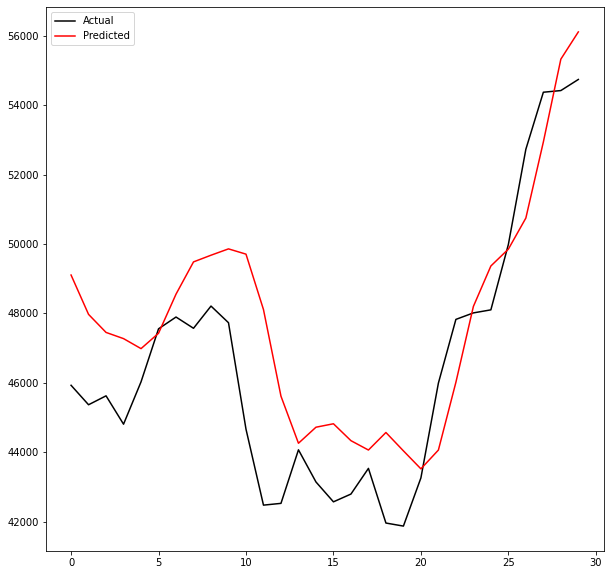

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_186.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00500: early stopping
Training R-Squared: 0.9981869601372297

Testing R-Squared: 0.9978091803819147

30day Holdout R-Squared: 0.8289454225338327

30day Holdout MAE: 1178.8647135416666

30day Holdout MAPE: 2.5636696257575484

30day Holdout RMSE: 1524.8406824217047


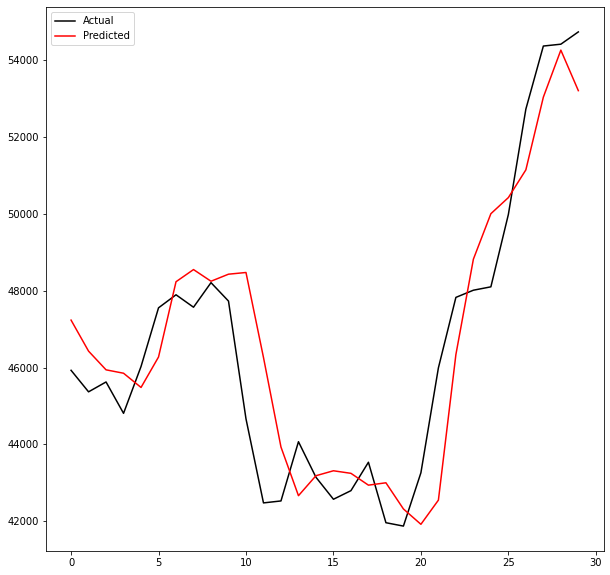

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001relu64Int4_187.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01453: early stopping
Training R-Squared: 0.9980131938337253

Testing R-Squared: 0.9975548202544056

30day Holdout R-Squared: 0.7204698904374178

30day Holdout MAE: 1487.8345052083334

30day Holdout MAPE: 3.128970181826465

30day Holdout RMSE: 1949.2673902799736


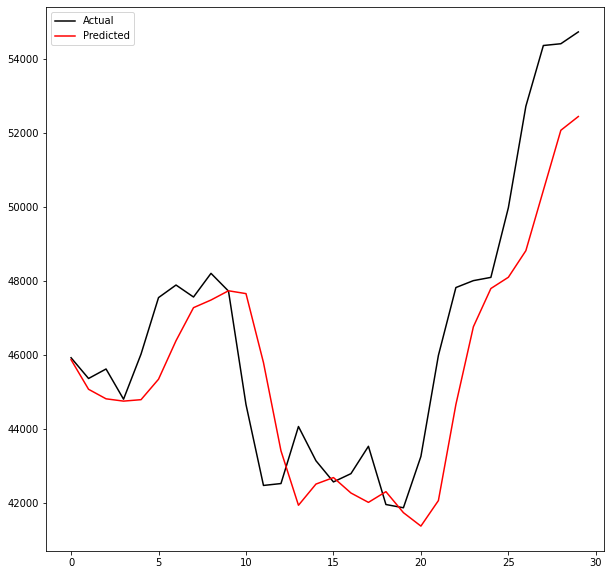

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001relu64Int4_188.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00625: early stopping
Training R-Squared: 0.9971903643557378

Testing R-Squared: 0.9966394728563298

30day Holdout R-Squared: 0.5033629017360323

30day Holdout MAE: 2257.301953125

30day Holdout MAPE: 4.7833340705725265

30day Holdout RMSE: 2598.224651464935


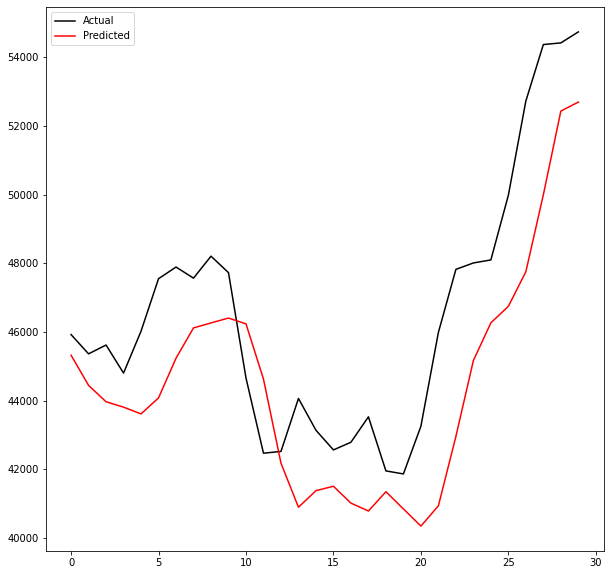

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01relu64Int4_189.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00479: early stopping
Training R-Squared: 0.9964716376357898

Testing R-Squared: 0.9966700543705649

30day Holdout R-Squared: 0.40326246120761333

30day Holdout MAE: 2365.748567708333

30day Holdout MAPE: 5.25997638878776

30day Holdout RMSE: 2848.057803852796


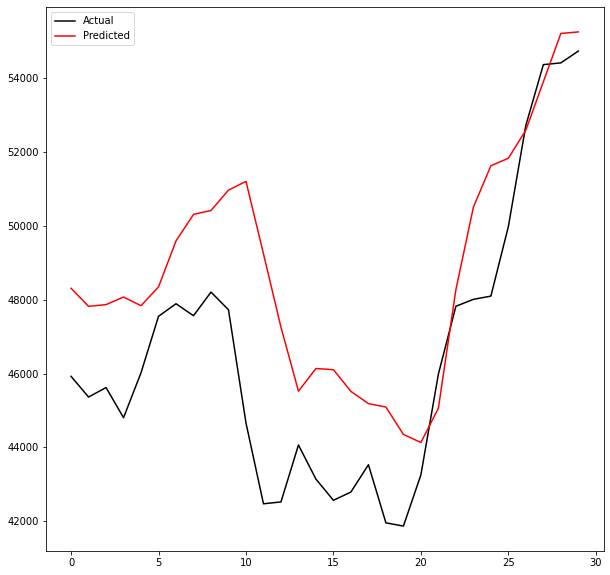

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001relu64Int4_190.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01079: early stopping
Training R-Squared: 0.9979777410421609

Testing R-Squared: 0.9974588729732975

30day Holdout R-Squared: 0.7211697040383198

30day Holdout MAE: 1501.34765625

30day Holdout MAPE: 3.1903692320504975

30day Holdout RMSE: 1946.8258309659684


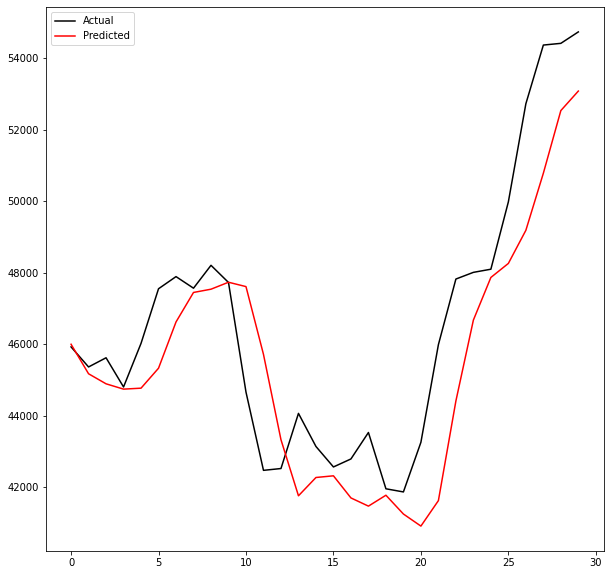

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001relu64Int4_191.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00488: early stopping
Training R-Squared: 0.9972086394841245

Testing R-Squared: 0.9972608635977833

30day Holdout R-Squared: 0.7978875911753573

30day Holdout MAE: 1250.0837239583334

30day Holdout MAPE: 2.7119520589795743

30day Holdout RMSE: 1657.5002750348553


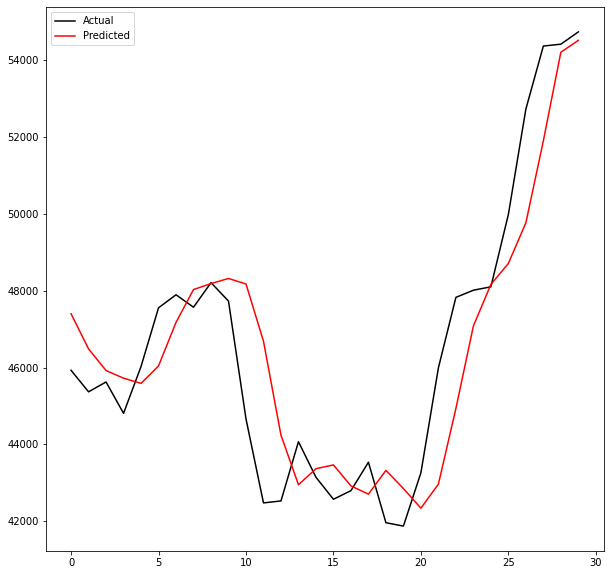

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01relu64Int4_192.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00371: early stopping
Training R-Squared: 0.9977745444109221

Testing R-Squared: 0.9975276993430144

30day Holdout R-Squared: 0.7390147141703655

30day Holdout MAE: 1499.0634114583333

30day Holdout MAPE: 3.2913802267072696

30day Holdout RMSE: 1883.4978616361916


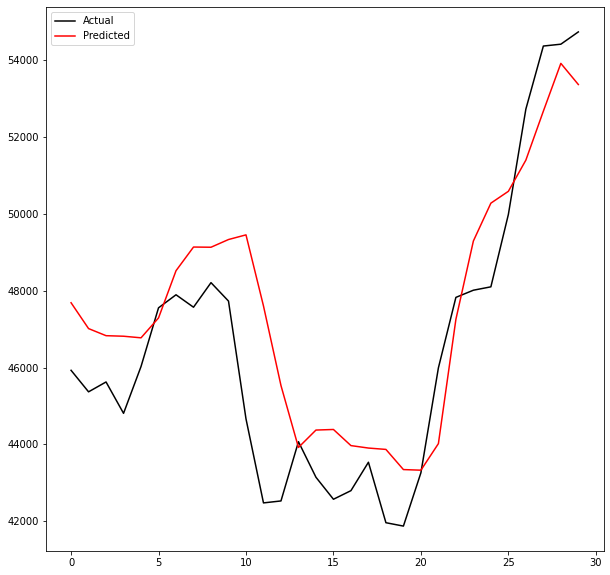

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001relu64Int4_193.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00837: early stopping
Training R-Squared: 0.9980426151849959

Testing R-Squared: 0.99768537359109

30day Holdout R-Squared: 0.7803274122907083

30day Holdout MAE: 1299.0470052083333

30day Holdout MAPE: 2.768351734464287

30day Holdout RMSE: 1728.005231913988


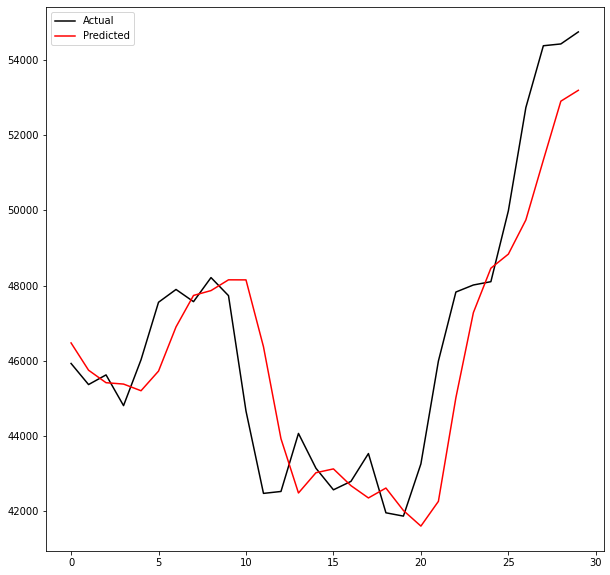

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001relu64Int4_194.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00410: early stopping
Training R-Squared: 0.9971109172515622

Testing R-Squared: 0.9971828397869262

30day Holdout R-Squared: 0.8046431557413214

30day Holdout MAE: 1218.1239583333333

30day Holdout MAPE: 2.649409153603743

30day Holdout RMSE: 1629.5640522131994


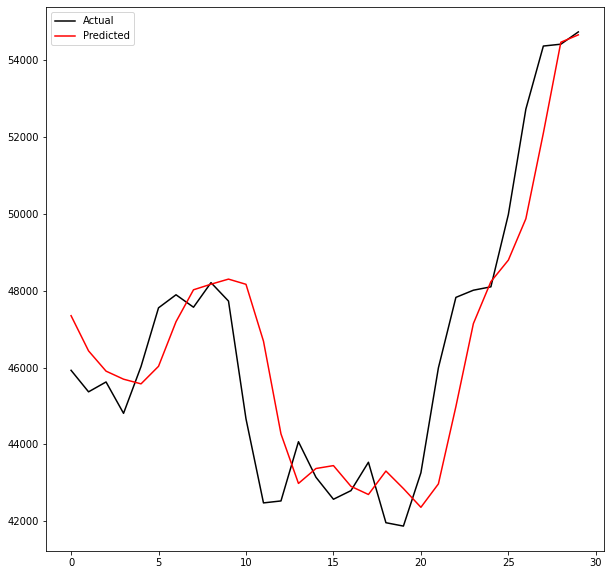

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01relu64Int4_195.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00289: early stopping
Training R-Squared: 0.9942734088393419

Testing R-Squared: 0.9927926169451075

30day Holdout R-Squared: 0.2641771681438122

30day Holdout MAE: 2870.1263020833335

30day Holdout MAPE: 6.071243085674619

30day Holdout RMSE: 3162.596236539553


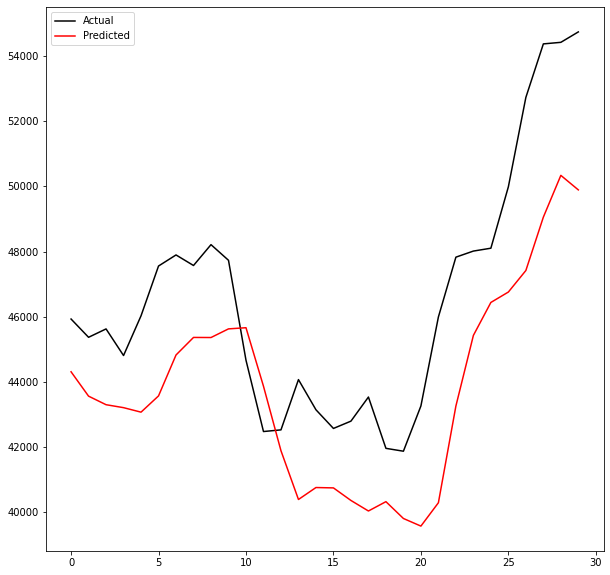

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001relu64Int4_196.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00636: early stopping
Training R-Squared: 0.9979808605597712

Testing R-Squared: 0.9974731319179516

30day Holdout R-Squared: 0.722245069135679

30day Holdout MAE: 1495.1248697916667

30day Holdout MAPE: 3.1545148879722347

30day Holdout RMSE: 1943.068041677627


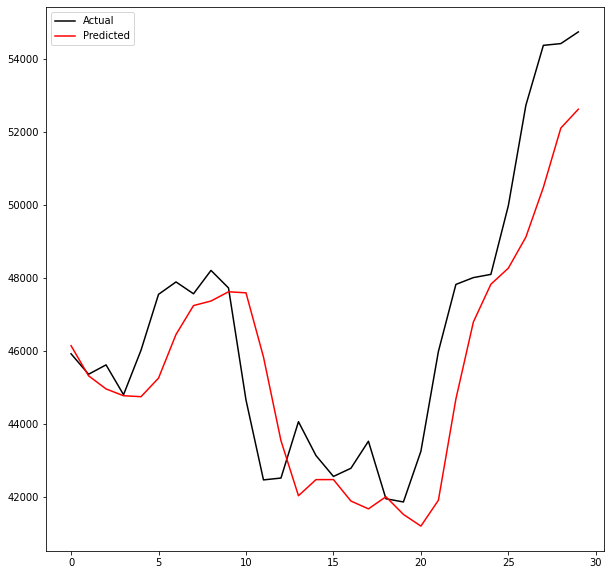

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001relu64Int4_197.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00267: early stopping
Training R-Squared: 0.9969740153134721

Testing R-Squared: 0.9962670433930308

30day Holdout R-Squared: 0.6517462427305185

30day Holdout MAE: 1753.0704427083333

30day Holdout MAPE: 3.69268516131663

30day Holdout RMSE: 2175.730127112619


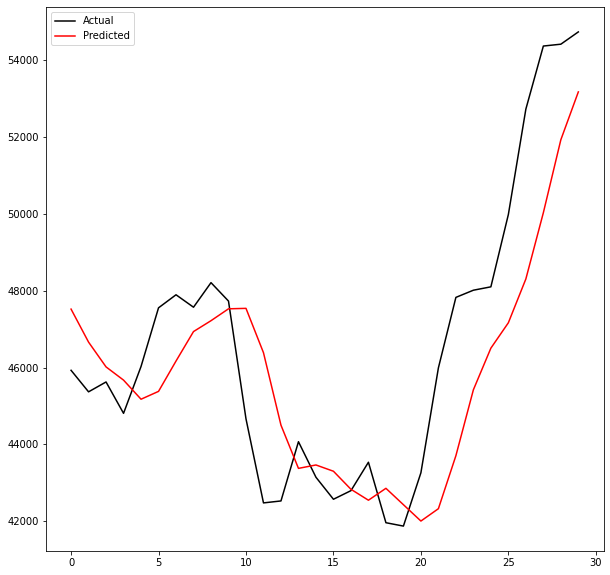

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01relu64Int4_198.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00191: early stopping
Training R-Squared: 0.9898293988073258

Testing R-Squared: 0.990797459032748

30day Holdout R-Squared: 0.1732537087521583

30day Holdout MAE: 2866.1135416666666

30day Holdout MAPE: 6.364751240219031

30day Holdout RMSE: 3352.302861416804


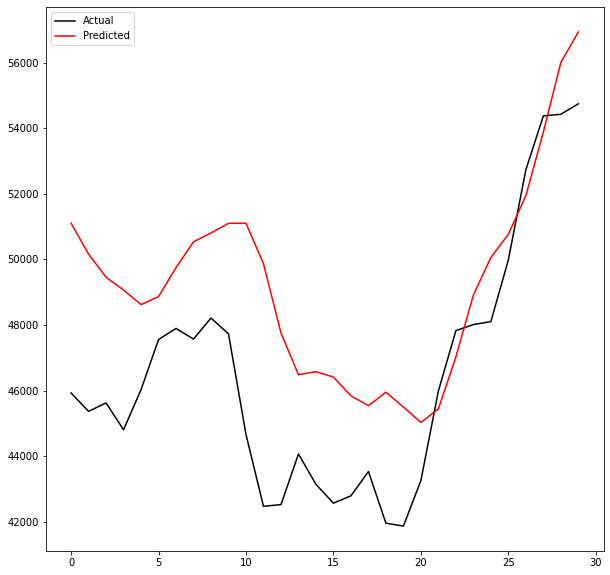

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001relu64Int4_199.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.36031726194235114

Testing R-Squared: -0.3691120377549306

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


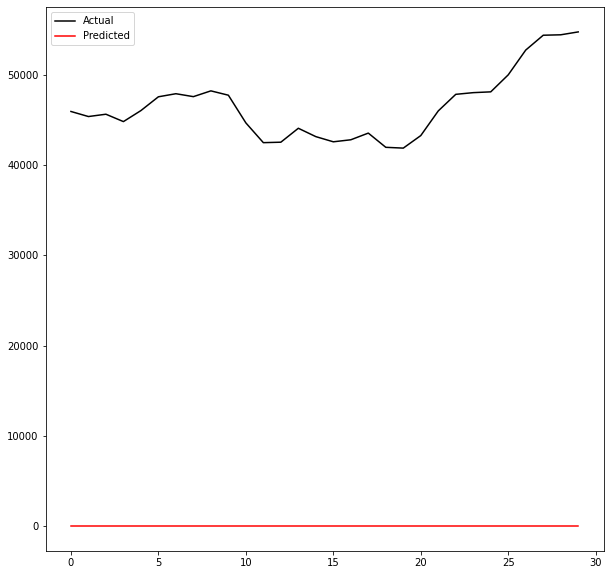

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001relu64Int4_200.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00244: early stopping
Training R-Squared: 0.9705126401917455

Testing R-Squared: 0.9722665117373468

30day Holdout R-Squared: -1.814075663792611

30day Holdout MAE: 5868.91953125

30day Holdout MAPE: 12.840975848524176

30day Holdout RMSE: 6184.790672323223


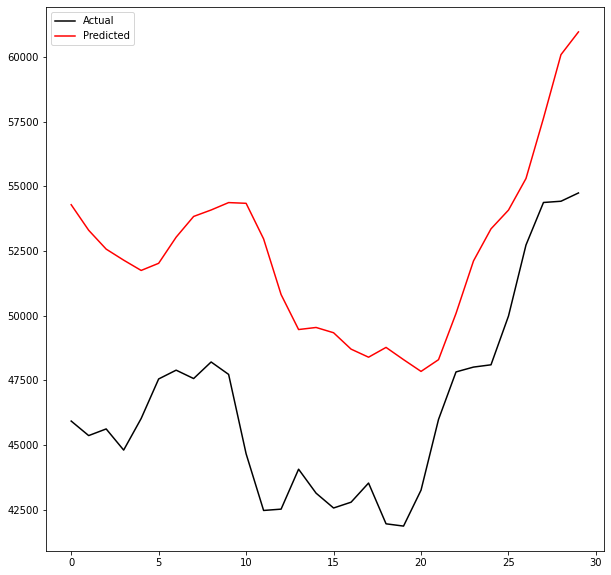

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01relu64Int4_201.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00428: early stopping
Training R-Squared: 0.9935792306581835

Testing R-Squared: 0.9940957594414108

30day Holdout R-Squared: 0.4473640883010307

30day Holdout MAE: 2275.65703125

30day Holdout MAPE: 5.0587916403201385

30day Holdout RMSE: 2740.795746362692


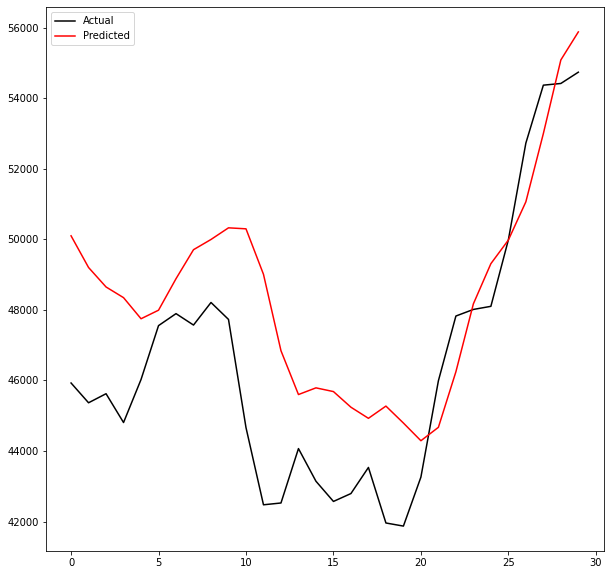

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001relu64Int4_202.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00890: early stopping
Training R-Squared: 0.997288788511035

Testing R-Squared: 0.9971678743376817

30day Holdout R-Squared: 0.7802456277930538

30day Holdout MAE: 1331.8484375

30day Holdout MAPE: 2.8712366886652534

30day Holdout RMSE: 1728.3268717006354


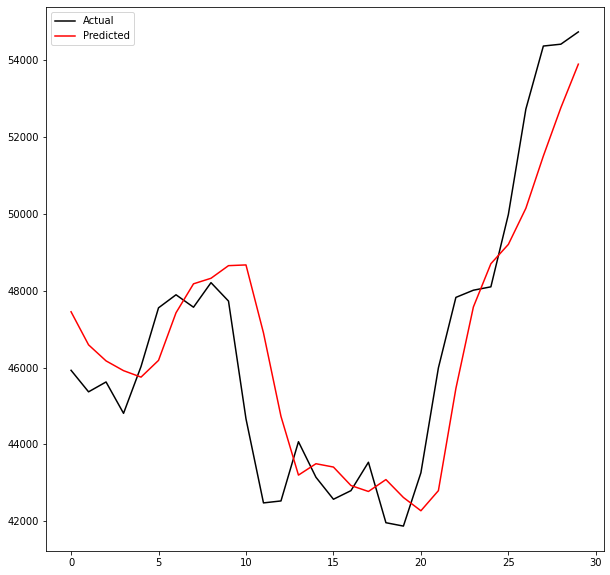

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int4_203.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00233: early stopping
Training R-Squared: 0.9879827013593268

Testing R-Squared: 0.9859898618081598

30day Holdout R-Squared: -0.6035089938685181

30day Holdout MAE: 4209.871875

30day Holdout MAPE: 8.854385016671094

30day Holdout RMSE: 4668.6661600097295


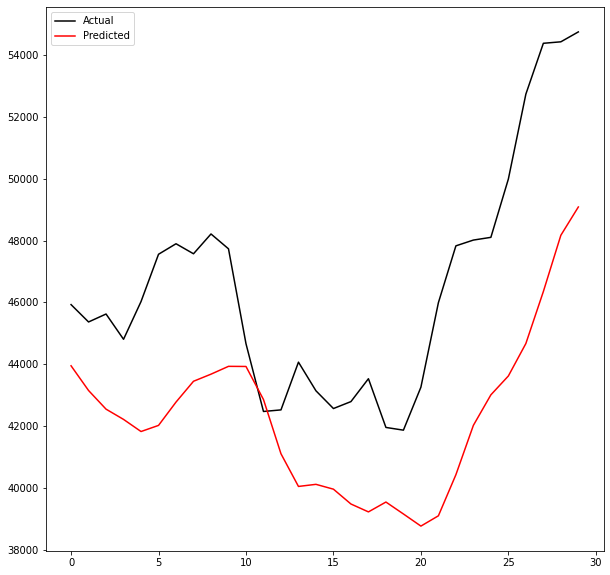

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01relu64Int4_204.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00262: early stopping
Training R-Squared: 0.9908949310548466

Testing R-Squared: 0.9886738553984653

30day Holdout R-Squared: -0.42001656953589017

30day Holdout MAE: 3928.934765625

30day Holdout MAPE: 8.25312412214554

30day Holdout RMSE: 4393.431161810227


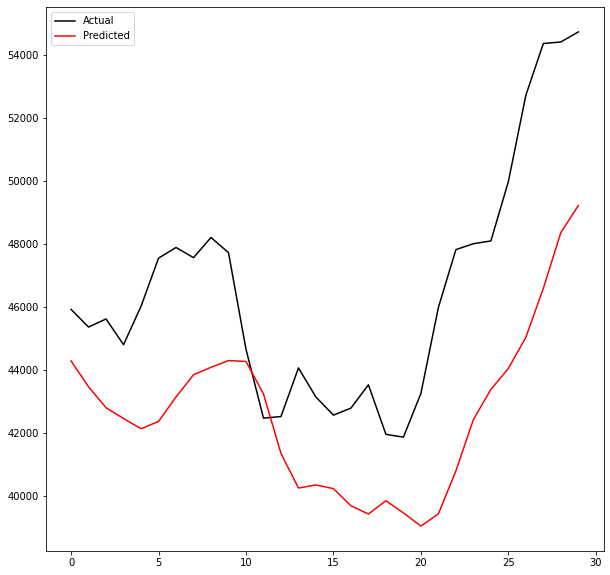

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001relu64Int4_205.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00683: early stopping
Training R-Squared: 0.9972183956904163

Testing R-Squared: 0.9971371045937181

30day Holdout R-Squared: 0.7523162969542254

30day Holdout MAE: 1432.1545572916666

30day Holdout MAPE: 3.094626565698778

30day Holdout RMSE: 1834.872264841675


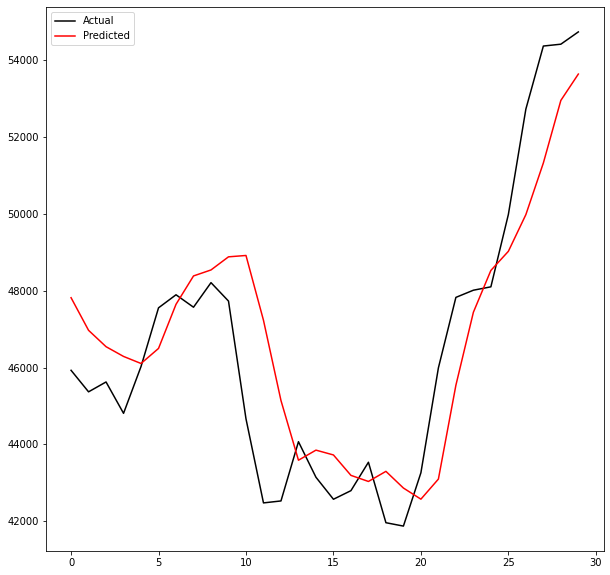

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001relu64Int4_206.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00496: early stopping
Training R-Squared: 0.9961146063719465

Testing R-Squared: 0.9961791107867137

30day Holdout R-Squared: 0.7159164822708041

30day Holdout MAE: 1520.7217447916667

30day Holdout MAPE: 3.3462109729196956

30day Holdout RMSE: 1965.0795613823793


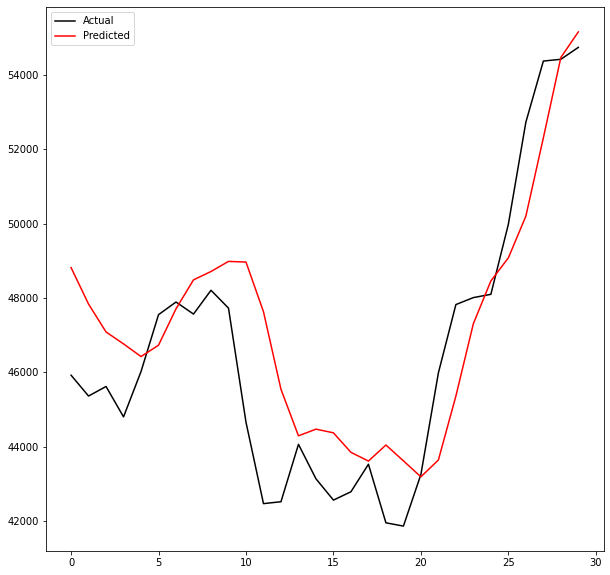

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01relu64Int4_207.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00280: early stopping
Training R-Squared: 0.9886781295072955

Testing R-Squared: 0.9863838744388684

30day Holdout R-Squared: -0.7622321356331909

30day Holdout MAE: 4459.561458333334

30day Holdout MAPE: 9.398505750293985

30day Holdout RMSE: 4894.278499480894


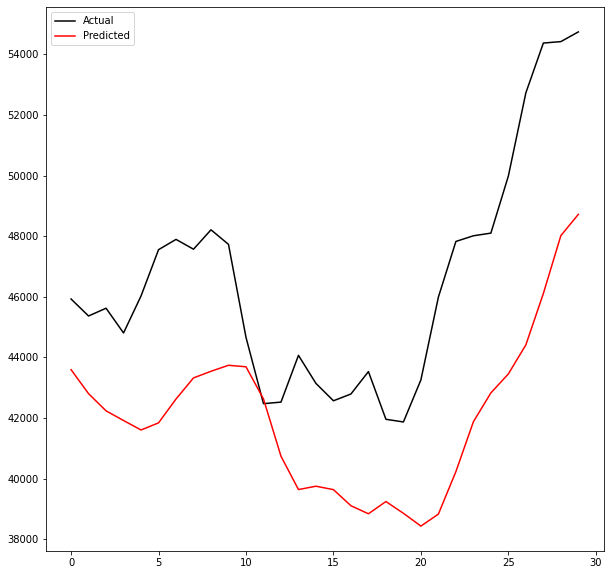

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001relu64Int4_208.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00836: early stopping
Training R-Squared: 0.9978550215315609

Testing R-Squared: 0.9975054665863005

30day Holdout R-Squared: 0.7750879179026154

30day Holdout MAE: 1315.5651041666667

30day Holdout MAPE: 2.800250399536296

30day Holdout RMSE: 1748.4914504116625


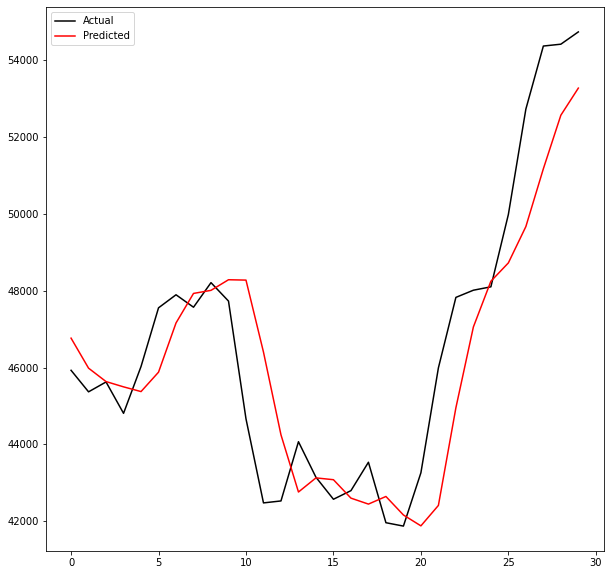

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001relu64Int4_209.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00392: early stopping
Training R-Squared: 0.9949474266307116

Testing R-Squared: 0.9950671029200383

30day Holdout R-Squared: 0.624524862179769

30day Holdout MAE: 1819.3026041666667

30day Holdout MAPE: 4.006708382312483

30day Holdout RMSE: 2259.163759991971


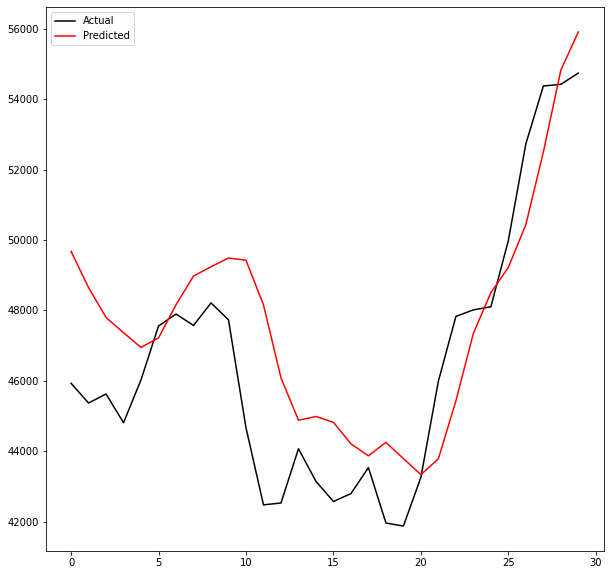

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01relu64Int4_210.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00422: early stopping
Training R-Squared: 0.9975491546518644

Testing R-Squared: 0.9969574949866608

30day Holdout R-Squared: 0.6053671812895536

30day Holdout MAE: 1837.84765625

30day Holdout MAPE: 3.8382166972214637

30day Holdout RMSE: 2316.0808718968833


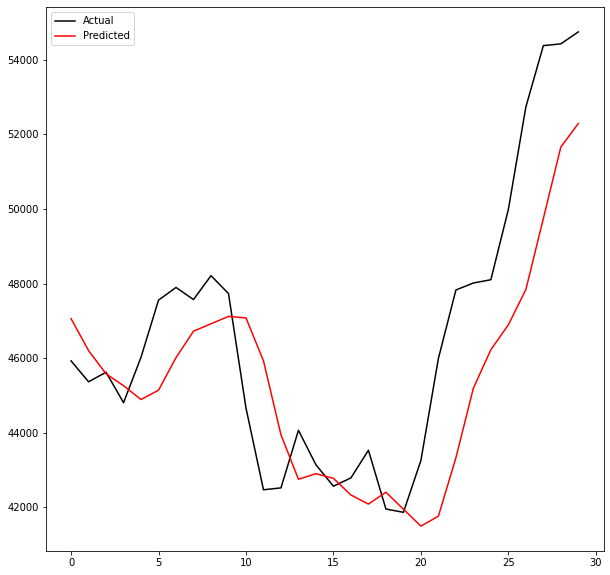

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001relu64Int4_211.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00771: early stopping
Training R-Squared: 0.9963423724979616

Testing R-Squared: 0.995280118042457

30day Holdout R-Squared: 0.3805895083321268

30day Holdout MAE: 2548.129947916667

30day Holdout MAPE: 5.359778240884153

30day Holdout RMSE: 2901.6591699266814


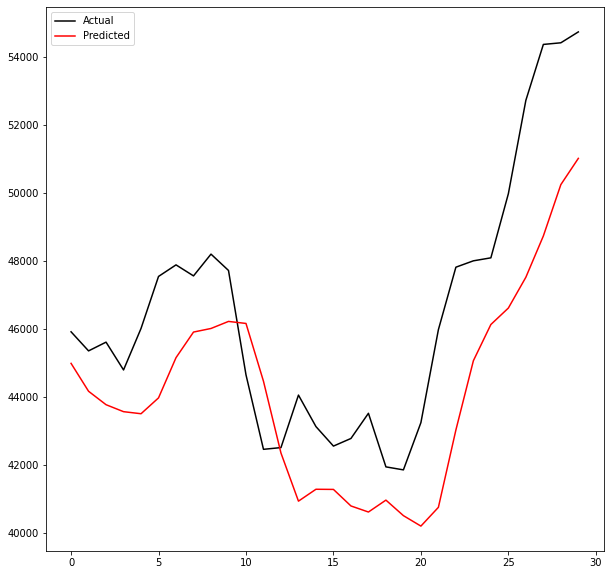

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001relu64Int4_212.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001


In [52]:
opt_list = ['Adam', 'RMSprop']
activation_list = ['relu']
neuron_list = [200, 300, 400, 500, 600]
lr_list = [0.01, 0.001, 0.0001]

count += 1

for op in opt_list:
    for neuron in neuron_list:
        for l in lr_list:
            for act in activation_list:
                interval4_ann_model_nextday(X, y, lr=l, activation=act,
                                            neurons=neuron, opt=op, batch_size=64, epochs=5000, count=count)
                count += 1

## Interval 5 (April 1, 2015 - September 1, 2021)

In [53]:
# create a 3 hidden layer model function for testing hyperparameters

def interval5_ann_model_nextday(X, y, lr=0.01, neurons=300, activation='relu', opt='Adam', batch_size=64, epochs=5000, count=0):
    ''' 
        X is a dataframe of the dates and features using non-standardized values
        The Date column must be the first column in the X dataframe
        y is a dataframe or 1D array of the target values
    '''
    # assign the string values to variables for file naming later in the Checkpoint
    opt_name = opt
    acti = activation
    # remove the . in the learning rate
    learn_rt = re.sub('\.', '-', str(lr))
    
    # create a holdout series of the last 30 days of data
    X_holdout = X.iloc[-30:, 1:] # exclude the first column which is the date column
    y_holdout = y[-30:]
    
    # extract the data from the dates of Interval 5
    date_bool = (X.iloc[:, 0] >= '2015/04/01') & (X.iloc[:, 0] <= '2021/09/01')
    X = X[date_bool]
    # remove the date column
    X = X.iloc[:, 1:]
    # adjust the range of y df
    y = y[X.index]
    
    # create train test split of data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=15)
    
    # scale the data
    estimators = [] # create a list for the scalers
    estimators.append(['minmax', MinMaxScaler()])
    estimators.append(['robust', RobustScaler()])
    # add the scalers to the Pipeline
    scale = Pipeline(estimators, verbose=True)
    # fit the scaler to the training data
    scale.fit(X_train)
    # transform the training, testing, and holdout data
    X_train = scale.transform(X_train)
    X_test = scale.transform(X_test)
    X_holdout = scale.transform(X_holdout)
    

        
    # define the shape of the input number of features
    shape = X_train.shape[1]
    
    # create call backs to save the model after each epoch if it is the best seen so far
    # and for early stopping when model has not improved after 100 epochs
    mcp_save = ModelCheckpoint('trained_models/ANN5_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int5'+'_'+str(count)+'.hdf5', save_best_only=True, monitor='val_loss', mode='auto')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=100, verbose=1, mode='auto')
        
    # create a special definition for the ANN model to adjust hyperparameters
    def seq_model(initializer='normal', activation=activation, neurons=neurons, NUM_FEATURES=shape, opt=opt, lr=lr):
        # create model
        model = Sequential()
        model.add(Dense(neurons, input_shape=(NUM_FEATURES,), kernel_initializer=initializer, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(1, activation=activation, kernel_initializer=initializer))
        # Compile model
        # select an optimizer
        if opt == 'Adam':
            opt = tf.keras.optimizers.Adam(learning_rate=lr)
        elif opt == 'RMSprop':
            opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
        elif opt == 'Adagrad':
            opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
        model.compile(loss='logcosh', optimizer=opt, metrics=['mae'])
        return model
        
    # define the 4 Dense layer model
    ann_model = seq_model(activation=activation, neurons=neurons, NUM_FEATURES=shape)
    

    # create the regressor
    regressor=KerasRegressor(build_fn=seq_model, batch_size=batch_size, epochs=epochs, verbose=0, shuffle=True,
                         validation_split=0.1, validation_freq=1,
                        use_multiprocessing=True, callbacks=[mcp_save,earlyStopping])
    
    # fit the model on training data
    regressor.fit(X_train, y_train)
    
    # use training data for predictions
    y_train_pred = regressor.predict(X_train)
    # calculate R-squared score for train data
    r2 = r2_score(y_train, y_train_pred)
    print('Training R-Squared:', r2)
    
    # use testing data for predictions
    y_test_pred = regressor.predict(X_test)
    # calculate R-squared score for test data
    r2 = r2_score(y_test, y_test_pred)
    print('\nTesting R-Squared:', r2)
    
    # use holdout data for predictions
    y_holdout_pred = regressor.predict(X_holdout)
    # calculate R-squared score for holdout data
    r2 = r2_score(y_holdout, y_holdout_pred)
    print('\n30day Holdout R-Squared:', r2)
    # calculate mean absolute error for holdout data
    mae = mean_absolute_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAE:', mae)
    # calculate mean absolute percentage error for holdout data
    mape = mean_absolute_percentage_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAPE:', mape)
    # calculate root mean squared error 
    rmse = np.sqrt(mean_squared_error(y_holdout, y_holdout_pred))
    print('\n30day Holdout RMSE:', rmse)
    
    # create a df of the holdout predicted and actual
    holdout_df = pd.DataFrame(zip(y_holdout, y_holdout_pred), columns=['actual', 'predicted'])
    
    plt.plot(holdout_df.index, holdout_df['actual'], color='black', label='Actual')
    plt.plot(holdout_df.index, holdout_df['predicted'], color='red', label='Predicted')
    plt.legend()
    plt.show()
    
    print('---------Model Summary For Above Results----------')
    print('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int5'+'_'+str(count)+'.hdf5')
    print('Number of Neurons:', neurons)
    print('Activation:', activation)
    print('Optimizer:', opt_name)
    print('Learning Rate:', lr)

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.5074790013052708

Testing R-Squared: -0.54685551936133

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


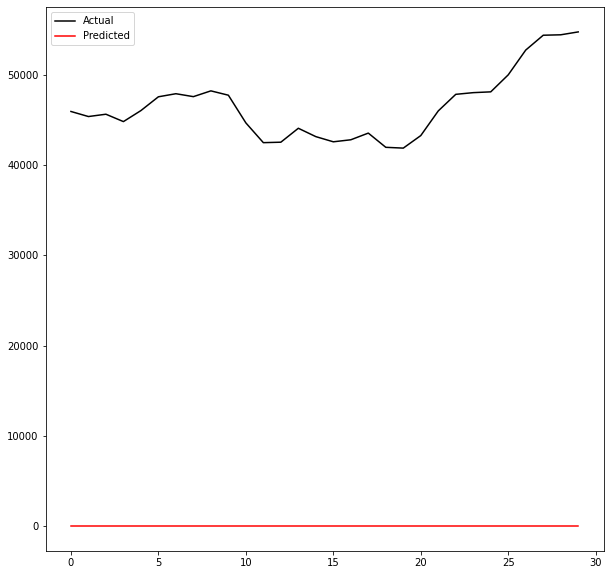

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01relu64Int5_214.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00391: early stopping
Training R-Squared: 0.997582975533873

Testing R-Squared: 0.9972285097692135

30day Holdout R-Squared: 0.8006397868488714

30day Holdout MAE: 1231.3364583333334

30day Holdout MAPE: 2.703497587310973

30day Holdout RMSE: 1646.1763753324235


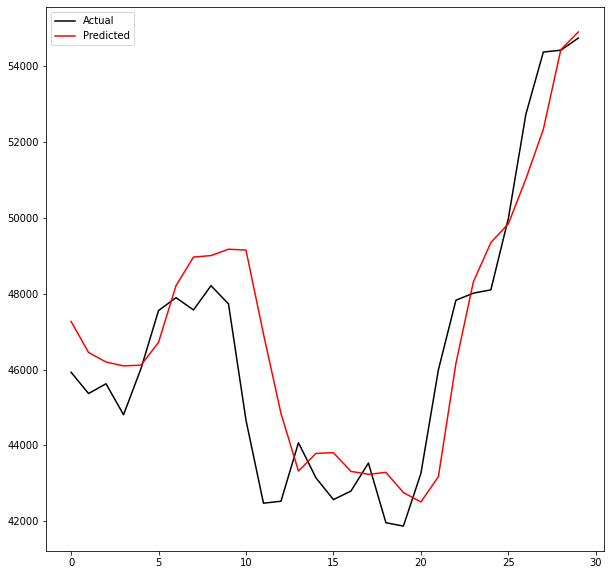

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001relu64Int5_215.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00708: early stopping
Training R-Squared: 0.997415556121498

Testing R-Squared: 0.9971641034347177

30day Holdout R-Squared: 0.7116758700349157

30day Holdout MAE: 1554.8536458333333

30day Holdout MAPE: 3.2659572645413473

30day Holdout RMSE: 1979.6919411291876


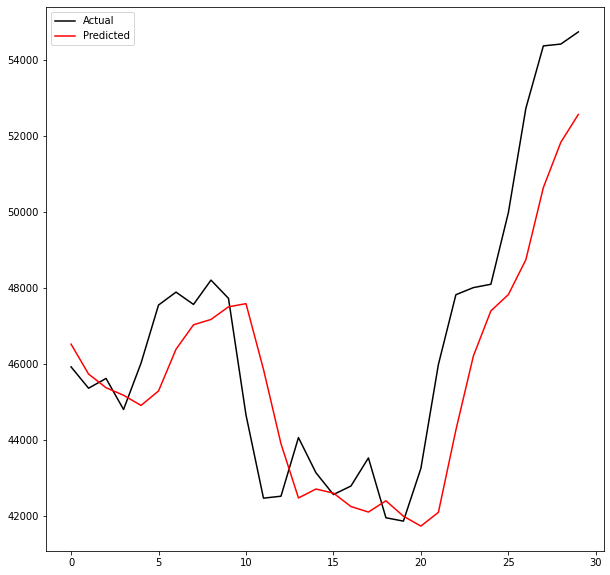

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001relu64Int5_216.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00606: early stopping
Training R-Squared: 0.9966506390786769

Testing R-Squared: 0.996367020640599

30day Holdout R-Squared: 0.6722338021245046

30day Holdout MAE: 1708.0377604166667

30day Holdout MAPE: 3.7486697389499986

30day Holdout RMSE: 2110.7616828141818


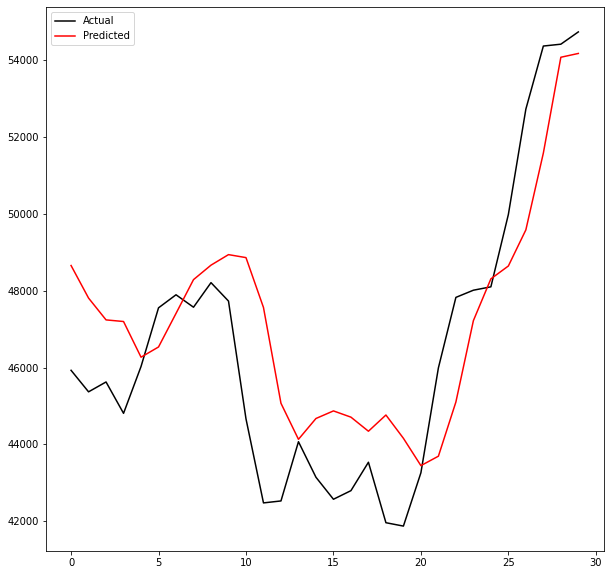

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int5_217.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00291: early stopping
Training R-Squared: 0.9974991282200973

Testing R-Squared: 0.9970332047082164

30day Holdout R-Squared: 0.6986602067689575

30day Holdout MAE: 1617.4884114583333

30day Holdout MAPE: 3.4027642117761117

30day Holdout RMSE: 2023.8828162479435


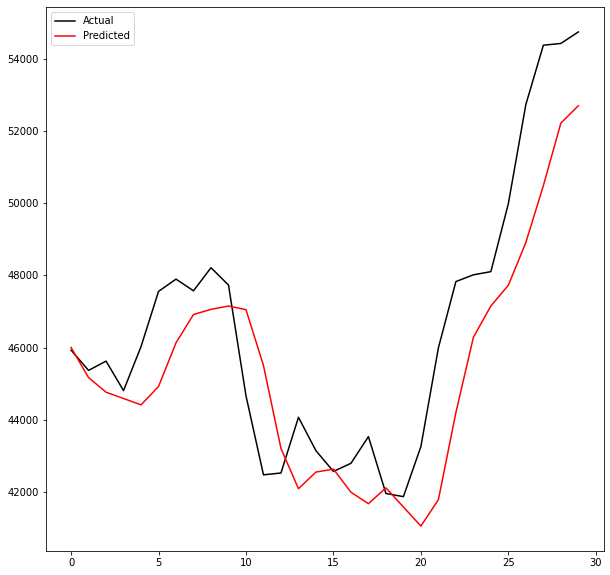

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001relu64Int5_218.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00467: early stopping
Training R-Squared: 0.9972613437856092

Testing R-Squared: 0.9969478982313651

30day Holdout R-Squared: 0.6579620571150748

30day Holdout MAE: 1731.4524739583333

30day Holdout MAPE: 3.6303409490262917

30day Holdout RMSE: 2156.2259228977073


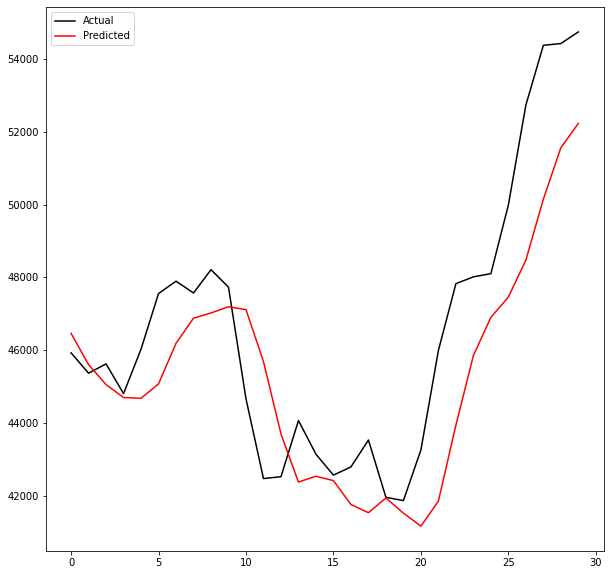

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001relu64Int5_219.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00379: early stopping
Training R-Squared: 0.9974875480825655

Testing R-Squared: 0.9968089427529581

30day Holdout R-Squared: 0.699167843284838

30day Holdout MAE: 1631.7467447916667

30day Holdout MAPE: 3.4707689975962763

30day Holdout RMSE: 2022.1773828849084


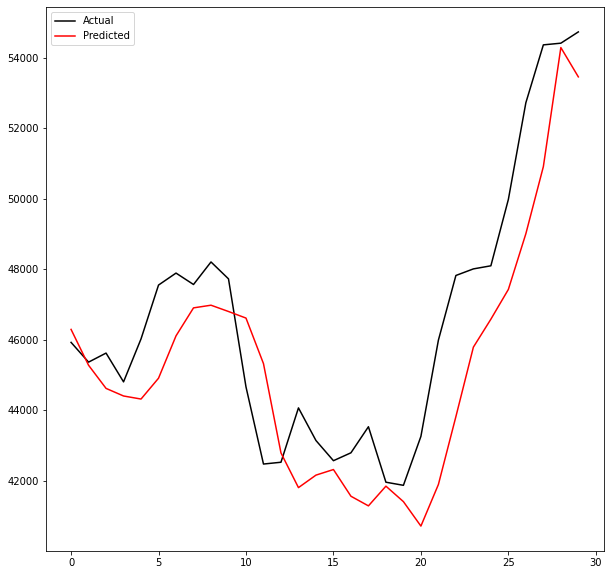

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01relu64Int5_220.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00321: early stopping
Training R-Squared: 0.9969063072721488

Testing R-Squared: 0.9966057859768974

30day Holdout R-Squared: 0.7461020687751085

30day Holdout MAE: 1465.4690104166666

30day Holdout MAPE: 3.2061858955808686

30day Holdout RMSE: 1857.7475669470161


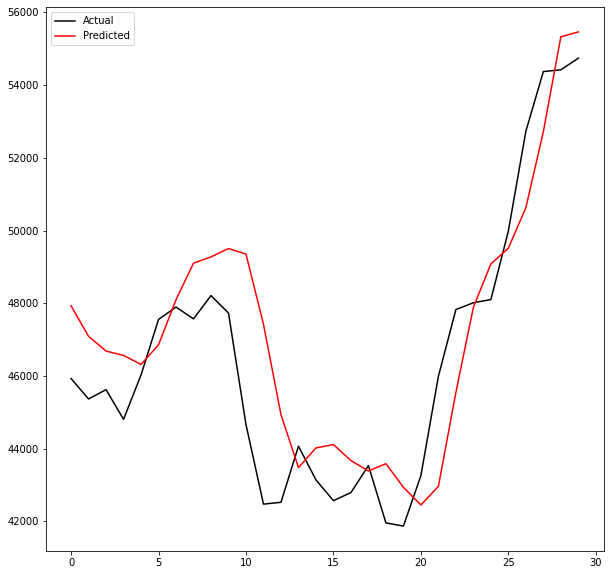

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001relu64Int5_221.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00696: early stopping
Training R-Squared: 0.9977304655787328

Testing R-Squared: 0.9974863814852407

30day Holdout R-Squared: 0.7029907966006386

30day Holdout MAE: 1571.168359375

30day Holdout MAPE: 3.30376234675711

30day Holdout RMSE: 2009.2874588438945


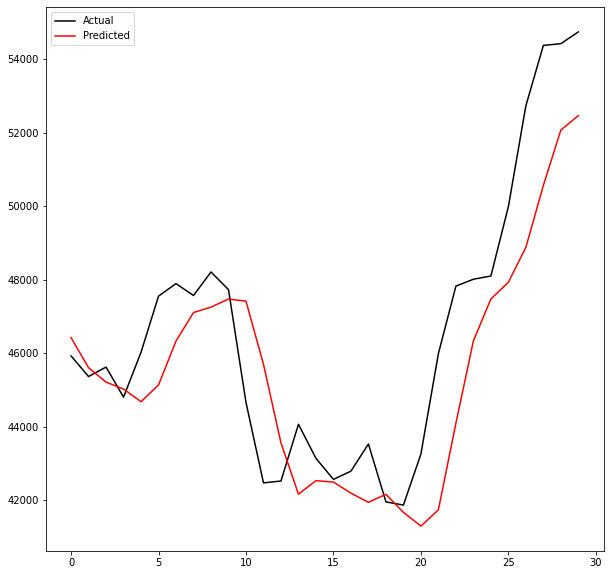

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001relu64Int5_222.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00589: early stopping
Training R-Squared: 0.9979229173776005

Testing R-Squared: 0.997370697055337

30day Holdout R-Squared: 0.5868537108859285

30day Holdout MAE: 1925.7342447916667

30day Holdout MAPE: 4.073374634825224

30day Holdout RMSE: 2369.7855566355743


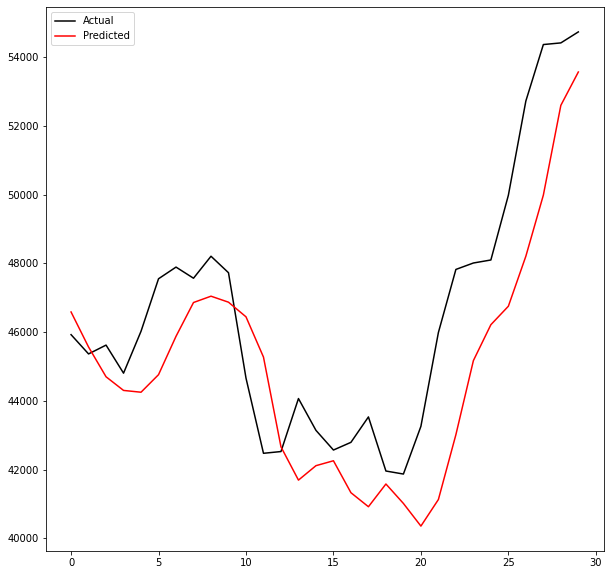

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01relu64Int5_223.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00482: early stopping
Training R-Squared: 0.9976628686194016

Testing R-Squared: 0.9972221335994074

30day Holdout R-Squared: 0.7693293309010092

30day Holdout MAE: 1390.9930989583333

30day Holdout MAPE: 3.0482443638979126

30day Holdout RMSE: 1770.7339244518732


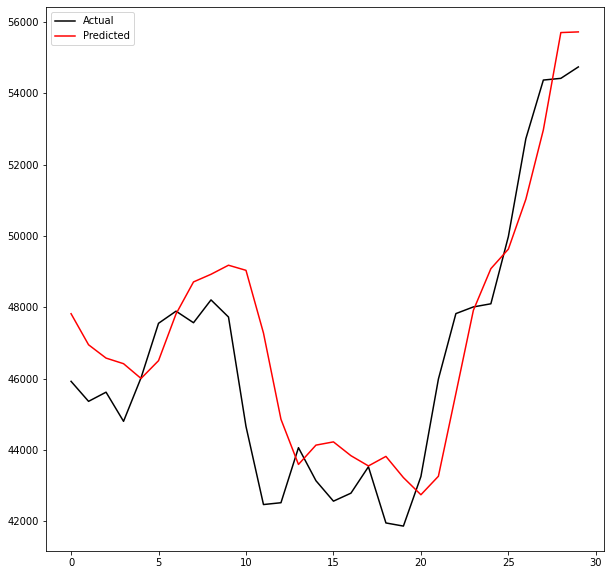

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001relu64Int5_224.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00419: early stopping
Training R-Squared: 0.9975787324067852

Testing R-Squared: 0.9971869625643556

30day Holdout R-Squared: 0.6466210559712262

30day Holdout MAE: 1780.2037760416667

30day Holdout MAPE: 3.748174445665952

30day Holdout RMSE: 2191.6815637587647


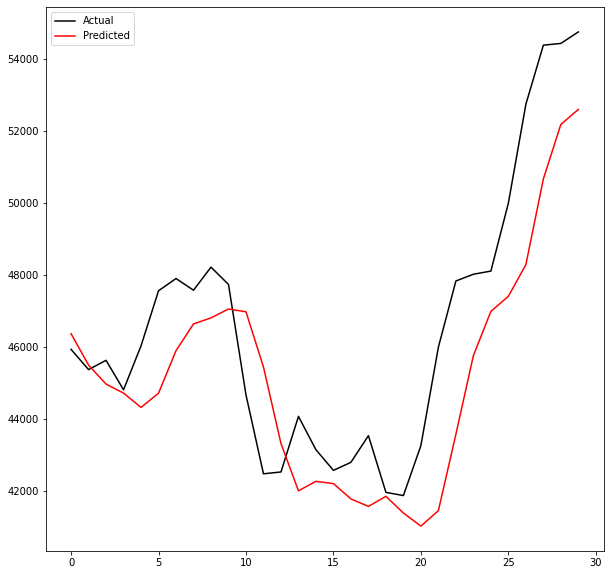

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001relu64Int5_225.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00351: early stopping
Training R-Squared: 0.9939529420639541

Testing R-Squared: 0.993819760066277

30day Holdout R-Squared: 0.6947790053295855

30day Holdout MAE: 1616.619140625

30day Holdout MAPE: 3.577169545606176

30day Holdout RMSE: 2036.8747370096892


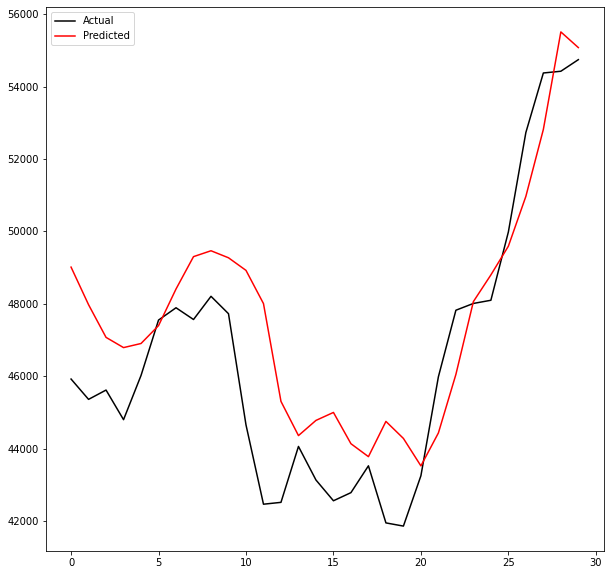

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01relu64Int5_226.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00454: early stopping
Training R-Squared: 0.9984261641108586

Testing R-Squared: 0.9976968460205138

30day Holdout R-Squared: 0.7752201252702607

30day Holdout MAE: 1277.1779947916666

30day Holdout MAPE: 2.734172812852269

30day Holdout RMSE: 1747.97747750645


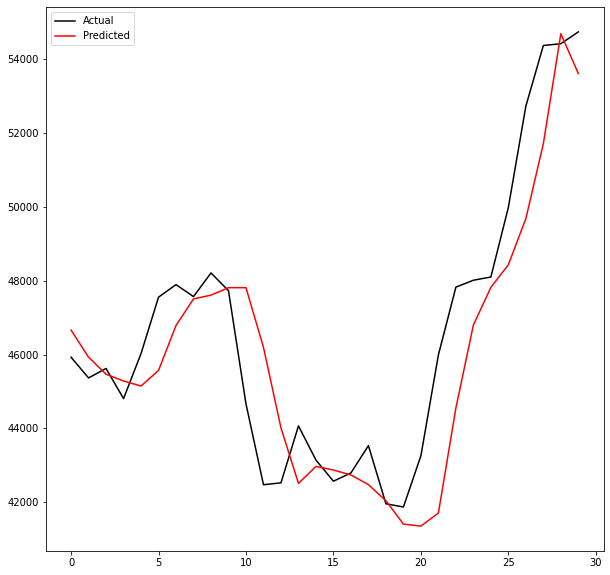

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001relu64Int5_227.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00634: early stopping
Training R-Squared: 0.9979023674804924

Testing R-Squared: 0.9974396958540838

30day Holdout R-Squared: 0.6965271452884427

30day Holdout MAE: 1603.53125

30day Holdout MAPE: 3.4000928995313164

30day Holdout RMSE: 2031.033305172961


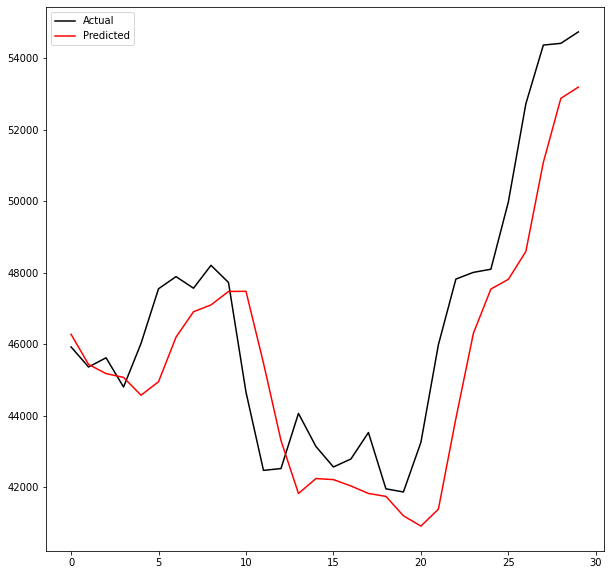

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001relu64Int5_228.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00706: early stopping
Training R-Squared: 0.9855096539568575

Testing R-Squared: 0.9838540346290164

30day Holdout R-Squared: -1.311793972150591

30day Holdout MAE: 5254.897265625

30day Holdout MAPE: 11.153145571983405

30day Holdout RMSE: 5605.723642262206


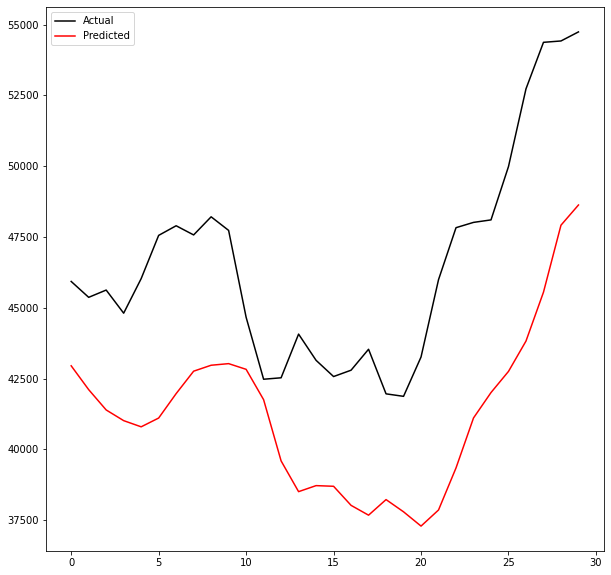

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01relu64Int5_229.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00286: early stopping
Training R-Squared: 0.9945426334410321

Testing R-Squared: 0.9946685488283951

30day Holdout R-Squared: 0.6520352244183815

30day Holdout MAE: 1728.491796875

30day Holdout MAPE: 3.8224365269681377

30day Holdout RMSE: 2174.8272270875627


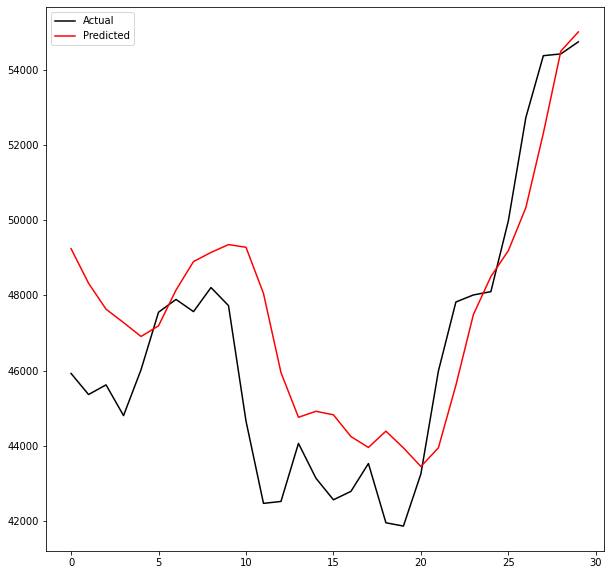

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001relu64Int5_230.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00892: early stopping
Training R-Squared: 0.9974492989846542

Testing R-Squared: 0.9972456686030071

30day Holdout R-Squared: 0.6801401077652788

30day Holdout MAE: 1650.4868489583334

30day Holdout MAPE: 3.4623883773427866

30day Holdout RMSE: 2085.148612332655


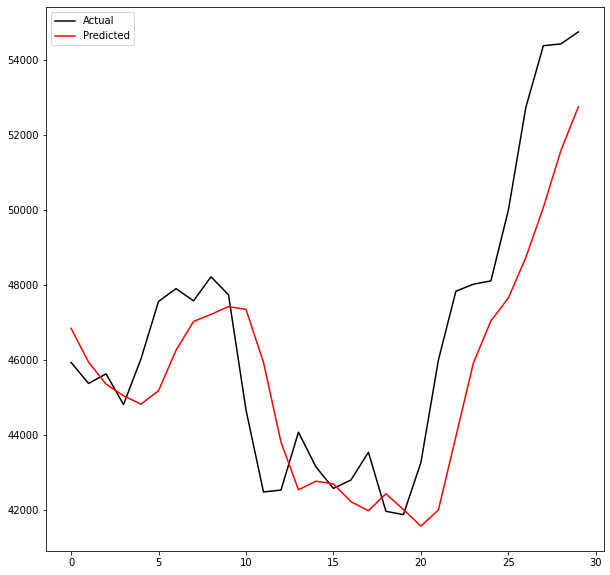

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001relu64Int5_231.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00406: early stopping
Training R-Squared: 0.9933939455048771

Testing R-Squared: 0.9928668254512767

30day Holdout R-Squared: -0.1998967188126728

30day Holdout MAE: 3633.72421875

30day Holdout MAPE: 7.660980376684424

30day Holdout RMSE: 4038.5833730366417


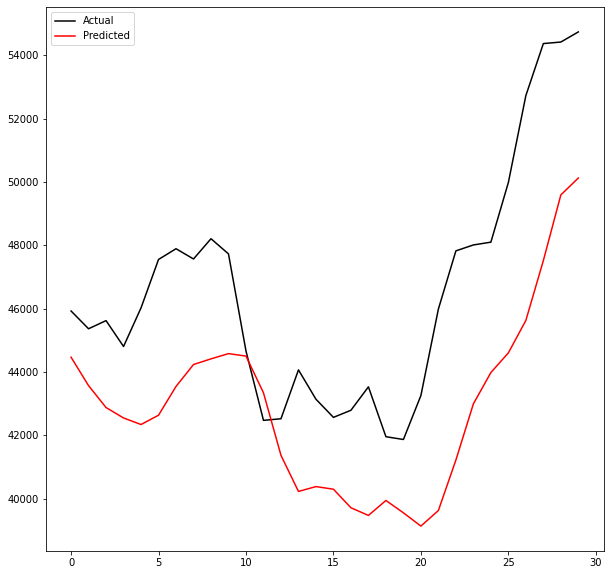

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01relu64Int5_232.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00409: early stopping
Training R-Squared: 0.9880663096691904

Testing R-Squared: 0.9865713747172067

30day Holdout R-Squared: -0.7791688266589818

30day Holdout MAE: 4572.718359375

30day Holdout MAPE: 9.700891540601878

30day Holdout RMSE: 4917.741544734658


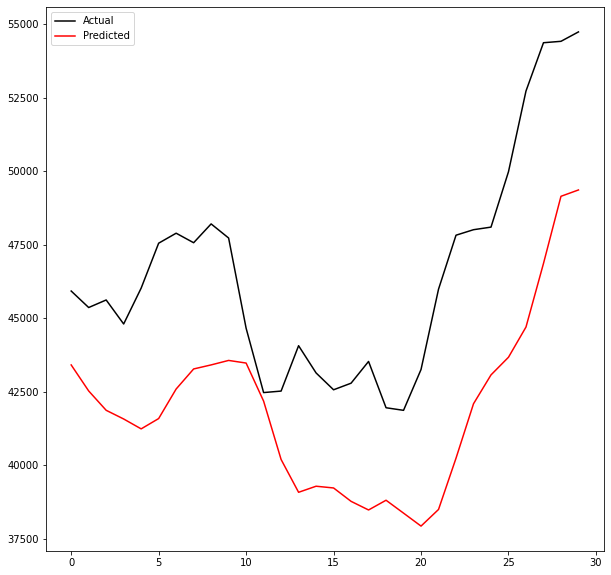

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001relu64Int5_233.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00898: early stopping
Training R-Squared: 0.9966992124057196

Testing R-Squared: 0.9962226697760714

30day Holdout R-Squared: 0.46739622395176683

30day Holdout MAE: 2328.623828125

30day Holdout MAPE: 4.900363935729524

30day Holdout RMSE: 2690.6625909772856


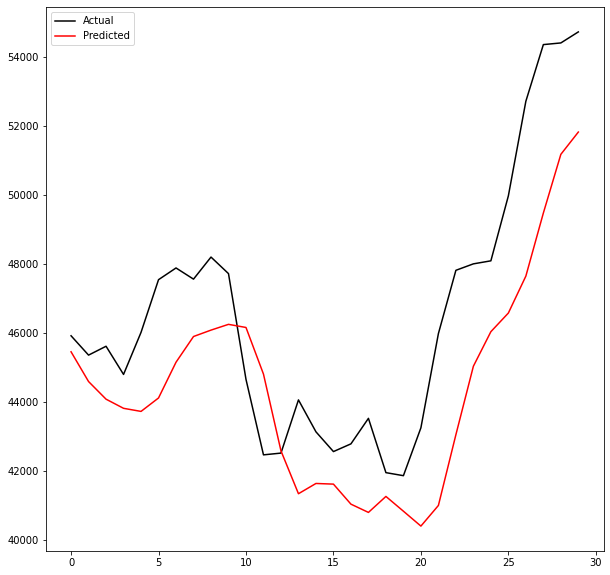

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int5_234.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00497: early stopping
Training R-Squared: 0.9788738779658352

Testing R-Squared: 0.979243513767514

30day Holdout R-Squared: -0.38003011474978

30day Holdout MAE: 3940.9934895833335

30day Holdout MAPE: 8.668258756223981

30day Holdout RMSE: 4331.131819887906


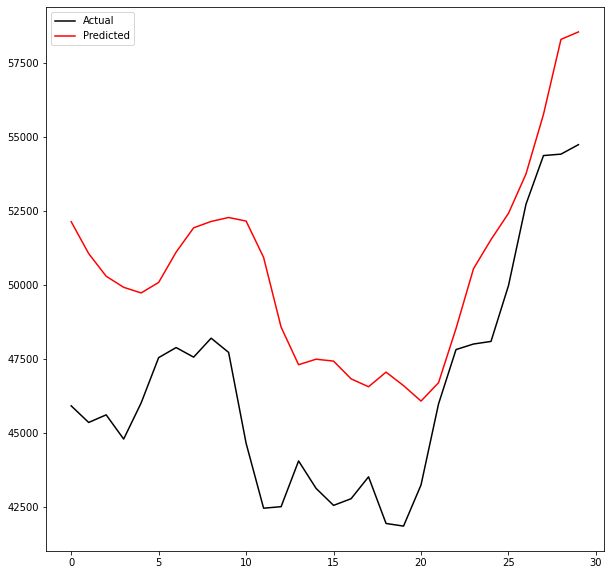

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01relu64Int5_235.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00418: early stopping
Training R-Squared: 0.9969171753983368

Testing R-Squared: 0.9964528709379841

30day Holdout R-Squared: 0.5404093977583899

30day Holdout MAE: 2015.516796875

30day Holdout MAPE: 4.212410768698502

30day Holdout RMSE: 2499.439850757816


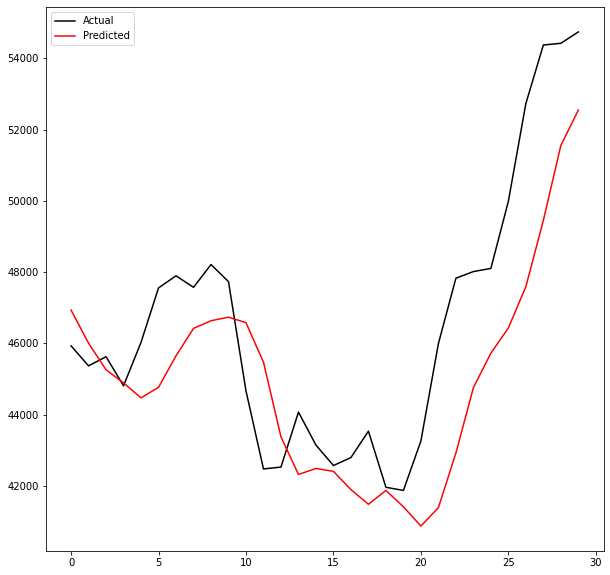

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001relu64Int5_236.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00593: early stopping
Training R-Squared: 0.9973745578064316

Testing R-Squared: 0.9969995832129894

30day Holdout R-Squared: 0.5903345484801419

30day Holdout MAE: 1906.1520833333334

30day Holdout MAPE: 3.9799803168084473

30day Holdout RMSE: 2359.7814891062544


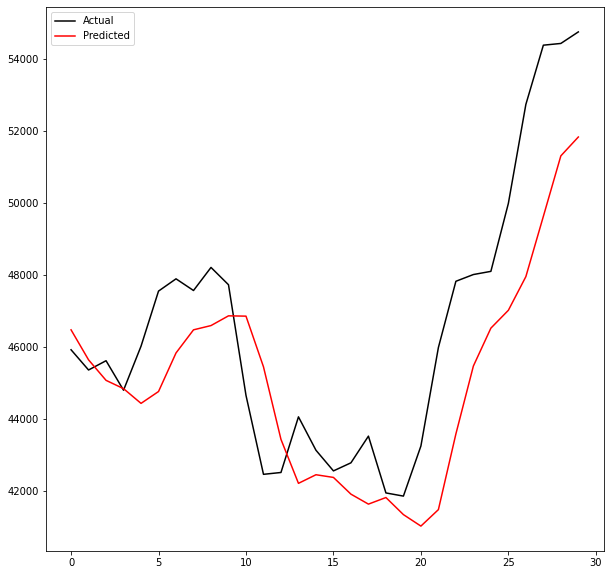

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001relu64Int5_237.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00461: early stopping
Training R-Squared: 0.9970879929578788

Testing R-Squared: 0.9970297788328312

30day Holdout R-Squared: 0.74501765047405

30day Holdout MAE: 1473.441015625

30day Holdout MAPE: 3.1477766236333866

30day Holdout RMSE: 1861.710633776835


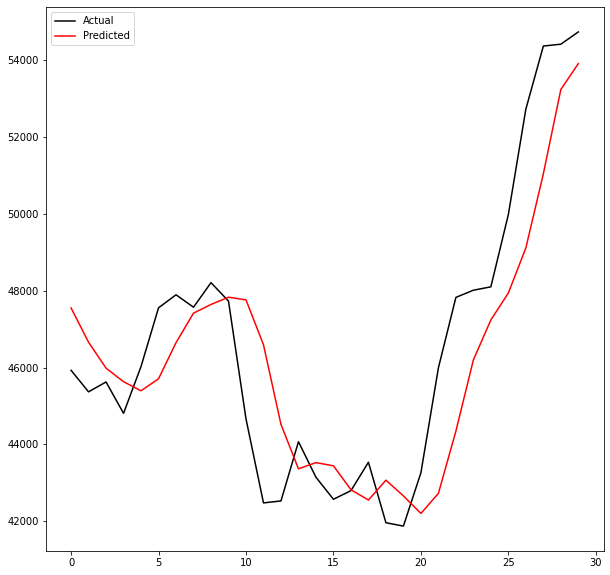

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01relu64Int5_238.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00493: early stopping
Training R-Squared: 0.9976000603812599

Testing R-Squared: 0.9970852297809145

30day Holdout R-Squared: 0.6827715676497601

30day Holdout MAE: 1665.95703125

30day Holdout MAPE: 3.510933541104264

30day Holdout RMSE: 2076.553729135407


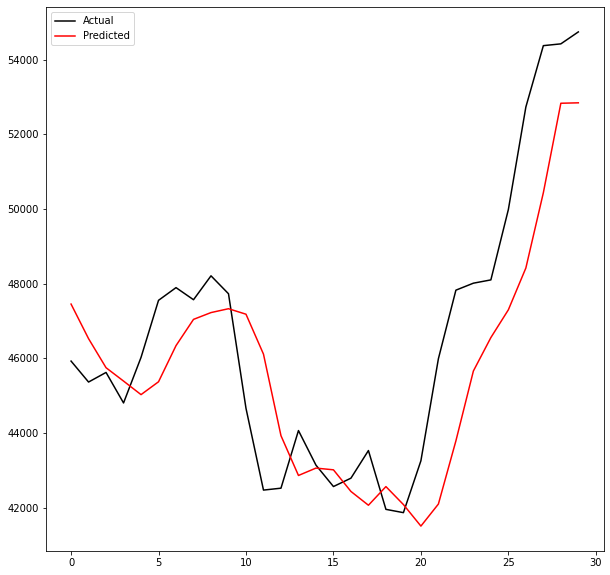

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001relu64Int5_239.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00338: early stopping
Training R-Squared: 0.9972454231522195

Testing R-Squared: 0.9966937060353764

30day Holdout R-Squared: 0.5232191361513241

30day Holdout MAE: 2048.0579427083335

30day Holdout MAPE: 4.257813773946187

30day Holdout RMSE: 2545.7545471333606


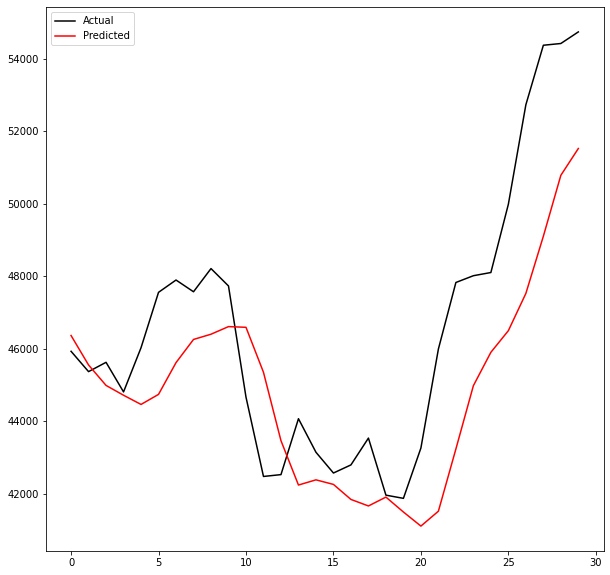

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001relu64Int5_240.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00302: early stopping
Training R-Squared: 0.9899529453827612

Testing R-Squared: 0.9901955510798728

30day Holdout R-Squared: 0.21209299813423577

30day Holdout MAE: 2812.6076822916666

30day Holdout MAPE: 6.229322829863673

30day Holdout RMSE: 3272.612614260954


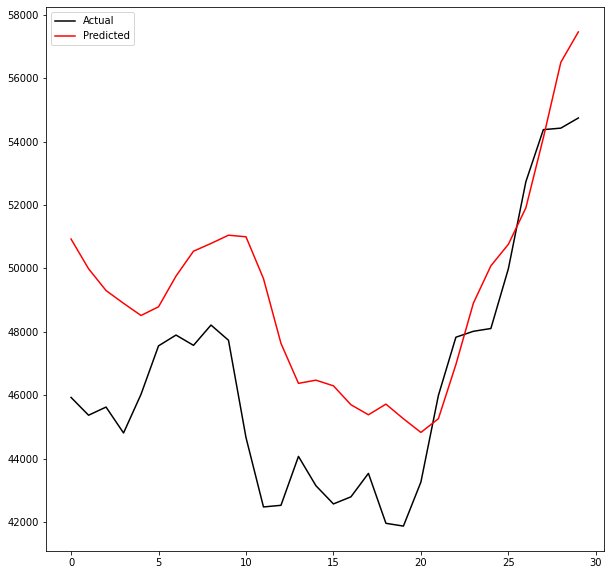

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01relu64Int5_241.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00223: early stopping
Training R-Squared: 0.9964821023886395

Testing R-Squared: 0.9957832798542263

30day Holdout R-Squared: 0.48201589258493027

30day Holdout MAE: 2207.5377604166665

30day Holdout MAPE: 4.632151968646971

30day Holdout RMSE: 2653.477061414529


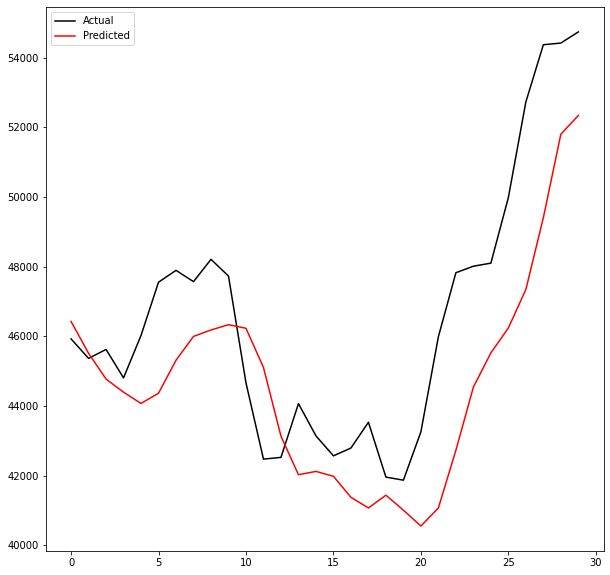

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001relu64Int5_242.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00322: early stopping
Training R-Squared: 0.9972753441159821

Testing R-Squared: 0.996795899054951

30day Holdout R-Squared: 0.5959007013998625

30day Holdout MAE: 1886.174609375

30day Holdout MAPE: 3.935488187319273

30day Holdout RMSE: 2343.695404116394


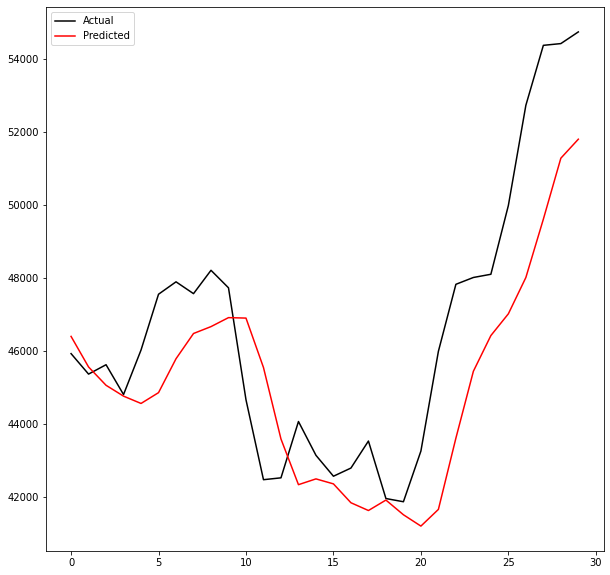

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001relu64Int5_243.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001


In [54]:
opt_list = ['Adam', 'RMSprop']
activation_list = ['relu']
neuron_list = [200, 300, 400, 500, 600]
lr_list = [0.01, 0.001, 0.0001]

count += 1

for op in opt_list:
    for neuron in neuron_list:
        for l in lr_list:
            for act in activation_list:
                interval5_ann_model_nextday(X, y, lr=l, activation=act,
                                            neurons=neuron, opt=op, batch_size=64, epochs=5000, count=count)
                count += 1

## Interval 6 - (April 1, 2014 - September 1, 2021)

In [55]:
# create a 3 hidden layer model function for testing hyperparameters

def interval6_ann_model_nextday(X, y, lr=0.01, neurons=300, activation='relu', opt='Adam', batch_size=64, epochs=5000, count=0):
    ''' 
        X is a dataframe of the dates and features using non-standardized values
        The Date column must be the first column in the X dataframe
        y is a dataframe or 1D array of the target values
    '''
    # assign the string values to variables for file naming later in the Checkpoint
    opt_name = opt
    acti = activation
    # remove the . in the learning rate
    learn_rt = re.sub('\.', '-', str(lr))
    
    # create a holdout series of the last 30 days of data
    X_holdout = X.iloc[-30:, 1:] # exclude the first column which is the date column
    y_holdout = y[-30:]
    
    # extract the data from the dates of Interval 6
    date_bool = (X.iloc[:, 0] >= '2014/04/01') & (X.iloc[:, 0] <= '2021/09/01')
    X = X[date_bool]
    # remove the date column
    X = X.iloc[:, 1:]
    # adjust the range of y df
    y = y[X.index]
    
    # create train test split of data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=15)
    
    # scale the data
    estimators = [] # create a list for the scalers
    estimators.append(['minmax', MinMaxScaler()])
    estimators.append(['robust', RobustScaler()])
    # add the scalers to the Pipeline
    scale = Pipeline(estimators, verbose=True)
    # fit the scaler to the training data
    scale.fit(X_train)
    # transform the training, testing, and holdout data
    X_train = scale.transform(X_train)
    X_test = scale.transform(X_test)
    X_holdout = scale.transform(X_holdout)
    

        
    # define the shape of the input number of features
    shape = X_train.shape[1]
    
    # create call backs to save the model after each epoch if it is the best seen so far
    # and for early stopping when model has not improved after 100 epochs
    mcp_save = ModelCheckpoint('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int6'+'_'+str(count)+'.hdf5', save_best_only=True, monitor='val_loss', mode='auto')
    earlyStopping = EarlyStopping(monitor='val_loss', patience=100, verbose=1, mode='auto')
        
    # create a special definition for the ANN model to adjust hyperparameters
    def seq_model(initializer='normal', activation=activation, neurons=neurons, NUM_FEATURES=shape, opt=opt, lr=lr):
        # create model
        model = Sequential()
        model.add(Dense(neurons, input_shape=(NUM_FEATURES,), kernel_initializer=initializer, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(neurons, activation=activation))
        model.add(Dense(1, activation=activation, kernel_initializer=initializer))
        # Compile model
        # select an optimizer
        if opt == 'Adam':
            opt = tf.keras.optimizers.Adam(learning_rate=lr)
        elif opt == 'RMSprop':
            opt = tf.keras.optimizers.RMSprop(learning_rate=lr)
        elif opt == 'Adagrad':
            opt = tf.keras.optimizers.Adagrad(learning_rate=lr)
        
        model.compile(loss='logcosh', optimizer=opt, metrics=['mae'])
        return model
        
    # define the 4 Dense layer model
    ann_model = seq_model(activation=activation, neurons=neurons, NUM_FEATURES=shape)
    

    # create the regressor
    regressor=KerasRegressor(build_fn=seq_model, batch_size=batch_size, epochs=epochs, verbose=0, shuffle=True,
                         validation_split=0.1, validation_freq=1,
                        use_multiprocessing=True, callbacks=[mcp_save,earlyStopping])
    
    # fit the model on training data
    regressor.fit(X_train, y_train)
    
    # use training data for predictions
    y_train_pred = regressor.predict(X_train)
    # calculate R-squared score for train data
    r2 = r2_score(y_train, y_train_pred)
    print('Training R-Squared:', r2)
    
    # use testing data for predictions
    y_test_pred = regressor.predict(X_test)
    # calculate R-squared score for test data
    r2 = r2_score(y_test, y_test_pred)
    print('\nTesting R-Squared:', r2)
    
    # use holdout data for predictions
    y_holdout_pred = regressor.predict(X_holdout)
    # calculate R-squared score for holdout data
    r2 = r2_score(y_holdout, y_holdout_pred)
    print('\n30day Holdout R-Squared:', r2)
    # calculate mean absolute error for holdout data
    mae = mean_absolute_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAE:', mae)
    # calculate mean absolute percentage error for holdout data
    mape = mean_absolute_percentage_error(y_holdout, y_holdout_pred)
    print('\n30day Holdout MAPE:', mape)
    # calculate root mean squared error 
    rmse = np.sqrt(mean_squared_error(y_holdout, y_holdout_pred))
    print('\n30day Holdout RMSE:', rmse)
    
    # create a df of the holdout predicted and actual
    holdout_df = pd.DataFrame(zip(y_holdout, y_holdout_pred), columns=['actual', 'predicted'])
    
    plt.plot(holdout_df.index, holdout_df['actual'], color='black', label='Actual')
    plt.plot(holdout_df.index, holdout_df['predicted'], color='red', label='Predicted')
    plt.legend()
    plt.show()
    
    print('---------Model Summary For Above Results----------')
    print('trained_models/ANN4_reg_nextday' + str(neurons)+ opt_name + str(learn_rt)+ acti +str(batch_size)+'Int6'+'_'+str(count)+'.hdf5')
    print('Number of Neurons:', neurons)
    print('Activation:', activation)
    print('Optimizer:', opt_name)
    print('Learning Rate:', lr)

[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00490: early stopping
Training R-Squared: 0.9971406825308746

Testing R-Squared: 0.9954652113892604

30day Holdout R-Squared: 0.7841850351680856

30day Holdout MAE: 1321.5065104166667

30day Holdout MAPE: 2.889457866245888

30day Holdout RMSE: 1712.7654666521344


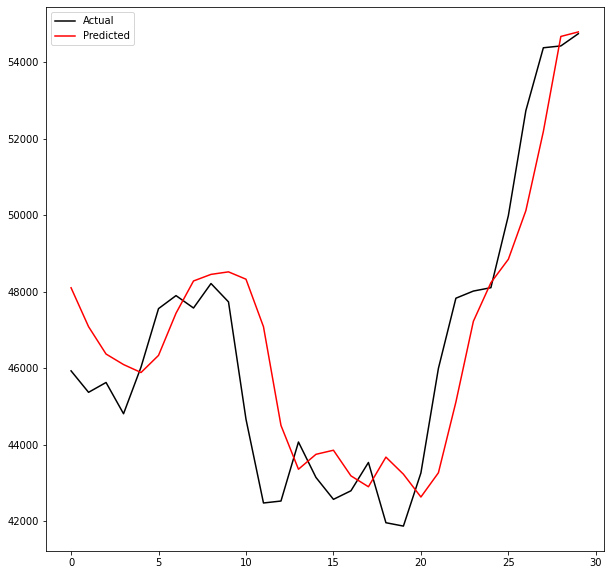

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-01relu64Int6_245.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00695: early stopping
Training R-Squared: 0.9982450589819118

Testing R-Squared: 0.9965803851814309

30day Holdout R-Squared: 0.7429233187941675

30day Holdout MAE: 1488.8393229166666

30day Holdout MAPE: 3.2272597767895315

30day Holdout RMSE: 1869.340702991588


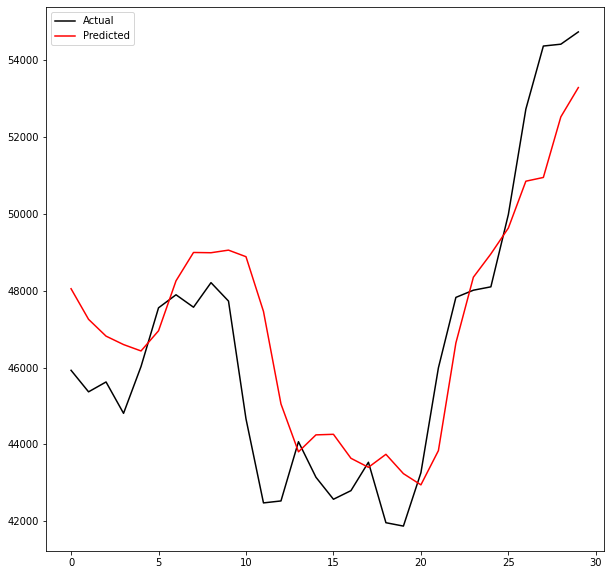

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-001relu64Int6_246.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01894: early stopping
Training R-Squared: 0.9980391965205223

Testing R-Squared: 0.9965548927197702

30day Holdout R-Squared: 0.735609755009347

30day Holdout MAE: 1456.67265625

30day Holdout MAPE: 3.08286643531039

30day Holdout RMSE: 1895.744626766201


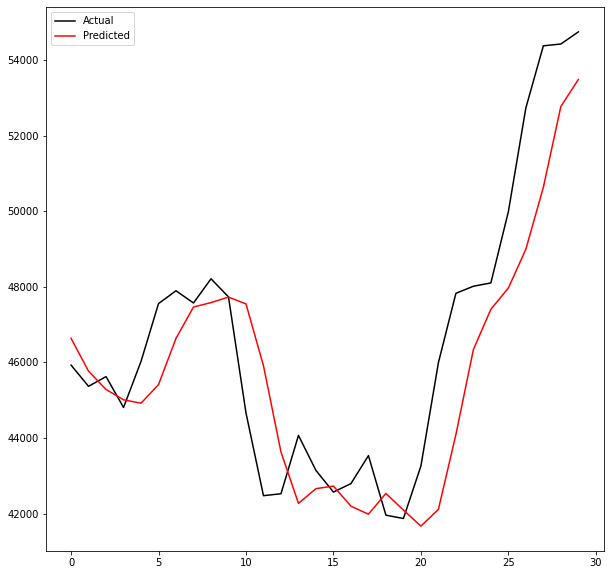

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200Adam0-0001relu64Int6_247.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00719: early stopping
Training R-Squared: 0.997025717253892

Testing R-Squared: 0.99536400200121

30day Holdout R-Squared: 0.36461724239106774

30day Holdout MAE: 2522.452734375

30day Holdout MAPE: 5.283038685392865

30day Holdout RMSE: 2938.8324911558507


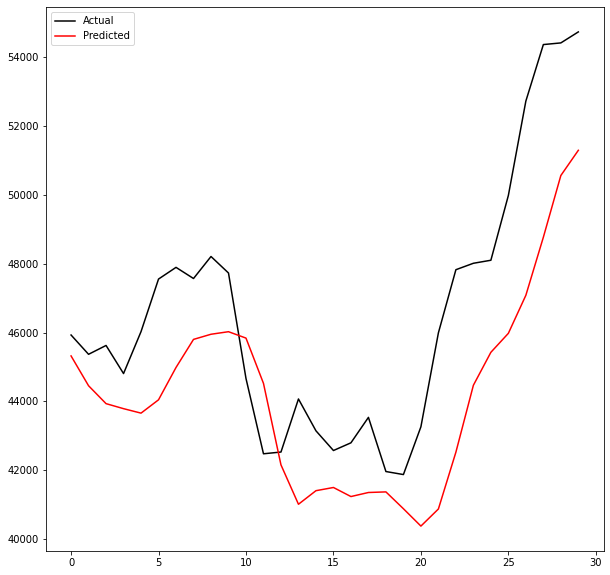

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int6_248.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00384: early stopping
Training R-Squared: 0.998204007170361

Testing R-Squared: 0.9965073829532237

30day Holdout R-Squared: 0.7407683392531296

30day Holdout MAE: 1473.9942708333333

30day Holdout MAPE: 3.1136617024040865

30day Holdout RMSE: 1877.1593507577365


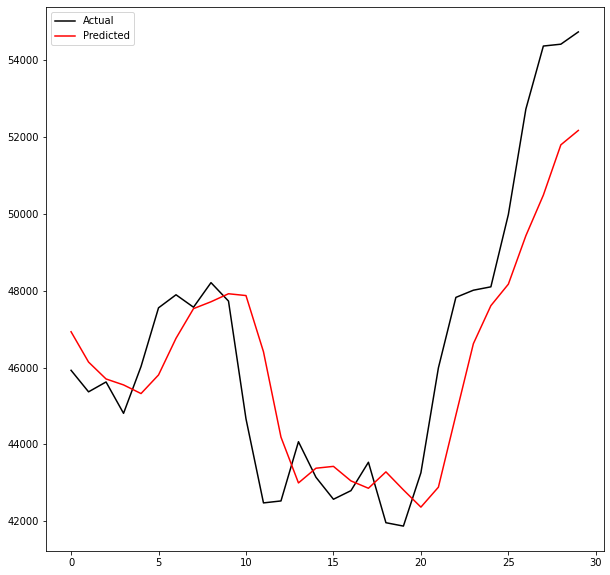

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-001relu64Int6_249.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01621: early stopping
Training R-Squared: 0.9981673872936411

Testing R-Squared: 0.9967259511265012

30day Holdout R-Squared: 0.7594734781970198

30day Holdout MAE: 1356.900390625

30day Holdout MAPE: 2.8685587980640634

30day Holdout RMSE: 1808.1672778968411


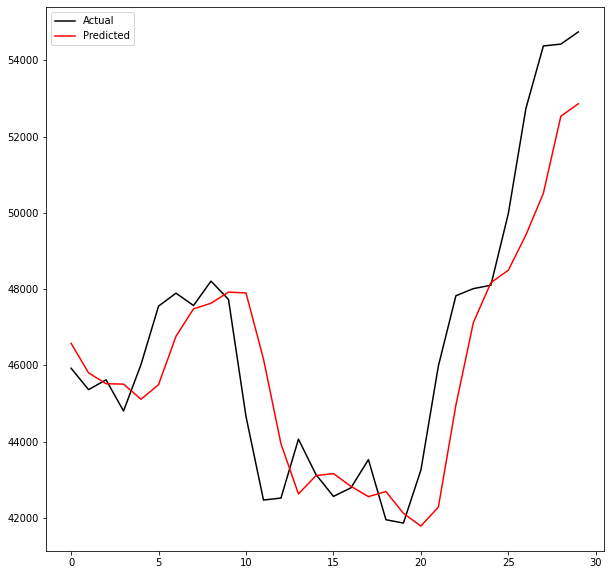

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-0001relu64Int6_250.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00454: early stopping
Training R-Squared: 0.9977431119092621

Testing R-Squared: 0.9960250950843434

30day Holdout R-Squared: 0.634701476447401

30day Holdout MAE: 1811.058984375

30day Holdout MAPE: 3.827966975276527

30day Holdout RMSE: 2228.338062252751


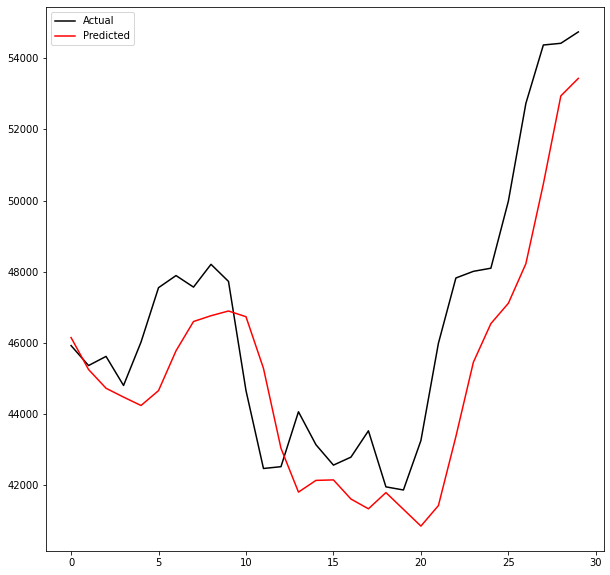

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-01relu64Int6_251.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00709: early stopping
Training R-Squared: 0.9986368582525825

Testing R-Squared: 0.9969092799338634

30day Holdout R-Squared: 0.7630263799372764

30day Holdout MAE: 1394.394140625

30day Holdout MAPE: 3.035136579280999

30day Holdout RMSE: 1794.7630571299103


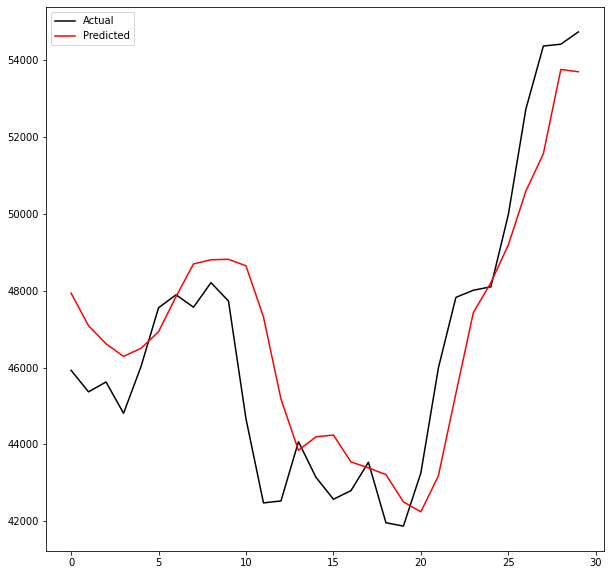

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-001relu64Int6_252.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01109: early stopping
Training R-Squared: 0.9982355974228536

Testing R-Squared: 0.9966803875448129

30day Holdout R-Squared: 0.7286898780630904

30day Holdout MAE: 1450.4822916666667

30day Holdout MAPE: 3.0470777318076507

30day Holdout RMSE: 1920.3930181178664


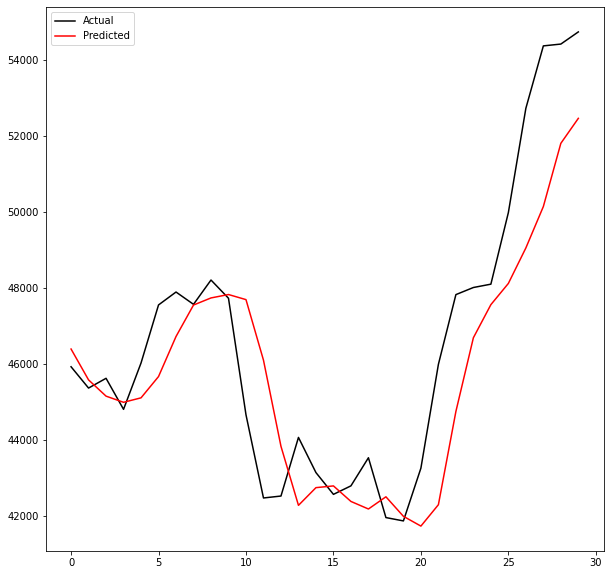

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400Adam0-0001relu64Int6_253.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00449: early stopping
Training R-Squared: 0.997856001394563

Testing R-Squared: 0.9959493341375453

30day Holdout R-Squared: 0.5492871242324134

30day Holdout MAE: 2028.21796875

30day Holdout MAPE: 4.235413496399366

30day Holdout RMSE: 2475.1817975219715


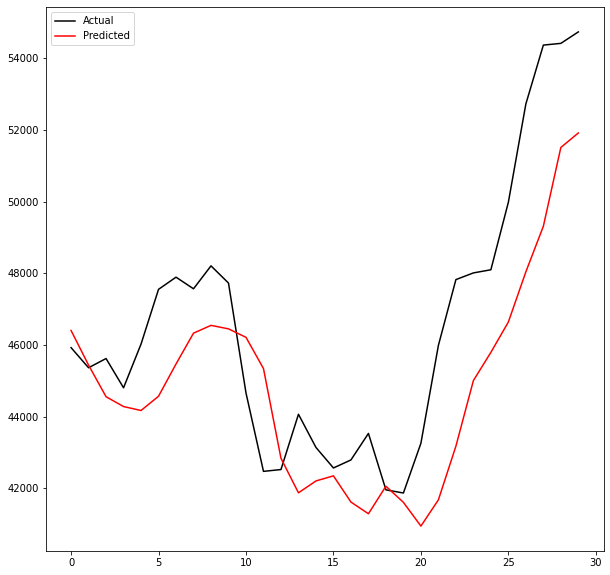

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-01relu64Int6_254.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00744: early stopping
Training R-Squared: 0.9989090870536734

Testing R-Squared: 0.9970573208310567

30day Holdout R-Squared: 0.7340578086375356

30day Holdout MAE: 1493.8701822916667

30day Holdout MAPE: 3.2300734674381126

30day Holdout RMSE: 1901.3004088367095


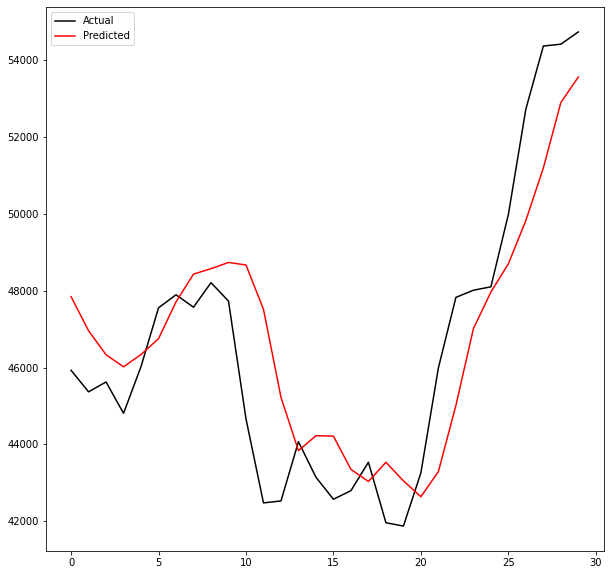

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-001relu64Int6_255.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.4271429550883794

Testing R-Squared: -0.4169732108755153

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


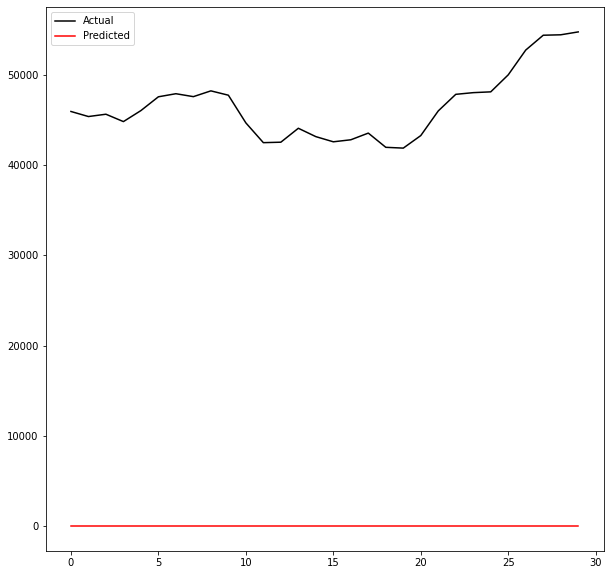

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500Adam0-0001relu64Int6_256.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00491: early stopping
Training R-Squared: 0.9965631214537134

Testing R-Squared: 0.9951069395649583

30day Holdout R-Squared: 0.679268104248806

30day Holdout MAE: 1656.5838541666667

30day Holdout MAPE: 3.6839127253915285

30day Holdout RMSE: 2087.9889487075175


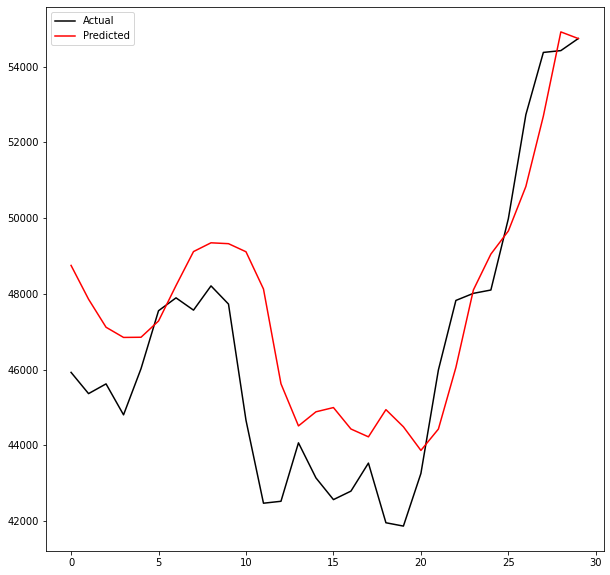

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-01relu64Int6_257.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00335: early stopping
Training R-Squared: 0.9979923866752427

Testing R-Squared: 0.9961983010717869

30day Holdout R-Squared: 0.7917216871808977

30day Holdout MAE: 1329.58828125

30day Holdout MAPE: 2.866511821505203

30day Holdout RMSE: 1682.5932624789314


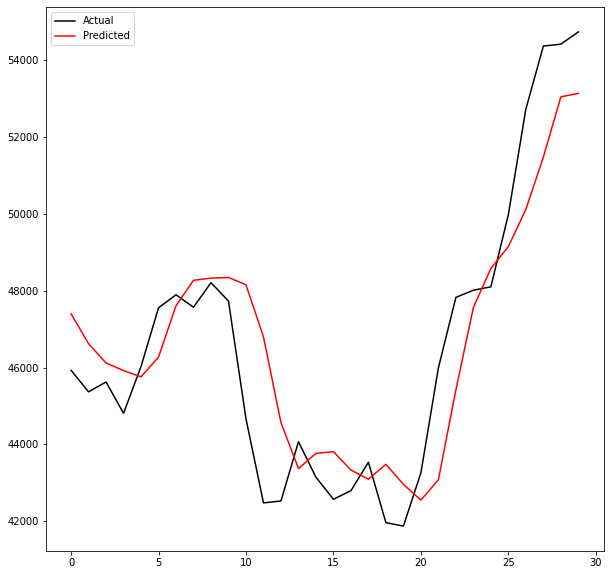

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-001relu64Int6_258.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00968: early stopping
Training R-Squared: 0.9983675814323515

Testing R-Squared: 0.9967595705468384

30day Holdout R-Squared: 0.7530453442031595

30day Holdout MAE: 1408.121484375

30day Holdout MAPE: 2.9730997974662987

30day Holdout RMSE: 1832.169837542404


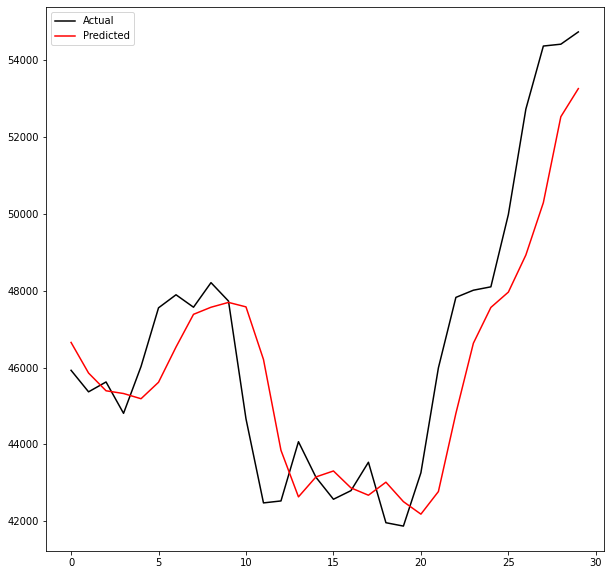

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600Adam0-0001relu64Int6_259.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: Adam
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.4271429550883794

Testing R-Squared: -0.4169732108755153

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


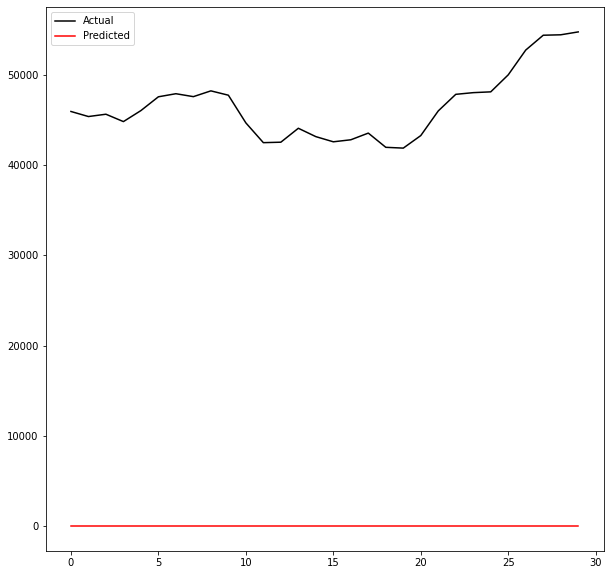

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-01relu64Int6_260.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00312: early stopping
Training R-Squared: 0.9975222074487948

Testing R-Squared: 0.9960519931086299

30day Holdout R-Squared: 0.7033845422594562

30day Holdout MAE: 1616.8723958333333

30day Holdout MAPE: 3.4432141813187185

30day Holdout RMSE: 2007.9551590602596


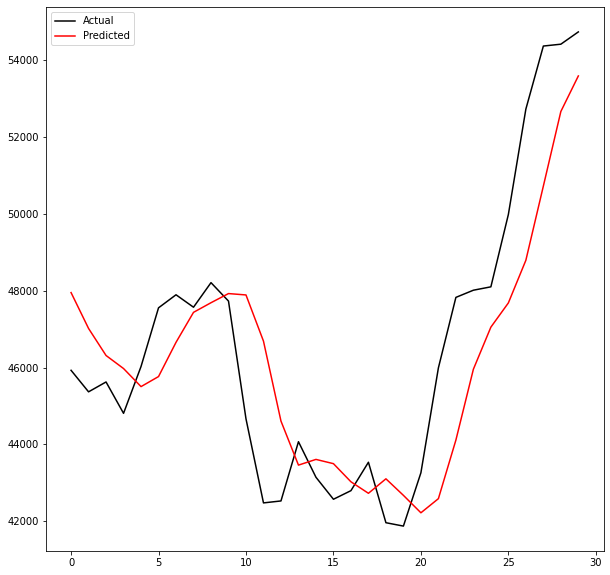

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-001relu64Int6_261.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00984: early stopping
Training R-Squared: 0.9974097414502977

Testing R-Squared: 0.9960823109010951

30day Holdout R-Squared: 0.7514830527397938

30day Holdout MAE: 1451.5266927083333

30day Holdout MAPE: 3.1144653438888796

30day Holdout RMSE: 1837.9560628074682


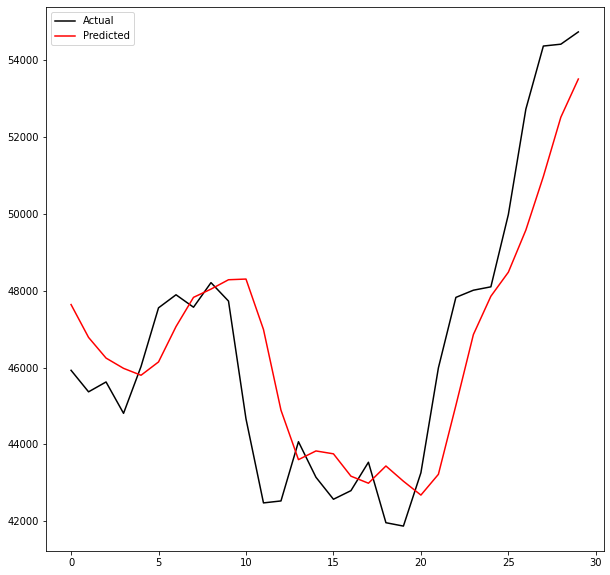

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday200RMSprop0-0001relu64Int6_262.hdf5
Number of Neurons: 200
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00727: early stopping
Training R-Squared: 0.9922250913719046

Testing R-Squared: 0.991507350063903

30day Holdout R-Squared: 0.2916067318783284

30day Holdout MAE: 2665.142057291667

30day Holdout MAPE: 5.9098844972706015

30day Holdout RMSE: 3103.0897215416835


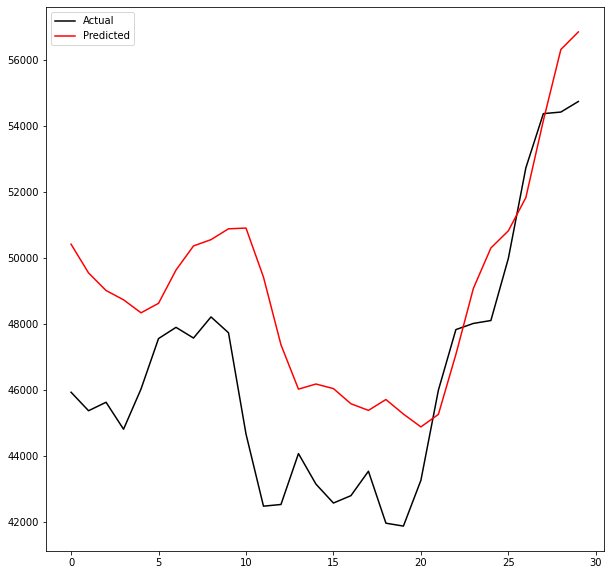

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-01relu64Int6_263.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00482: early stopping
Training R-Squared: 0.9959445309219906

Testing R-Squared: 0.9933737871458267

30day Holdout R-Squared: 0.23067867790917818

30day Holdout MAE: 2790.4606770833334

30day Holdout MAPE: 5.860022561488157

30day Holdout RMSE: 3233.783976117945


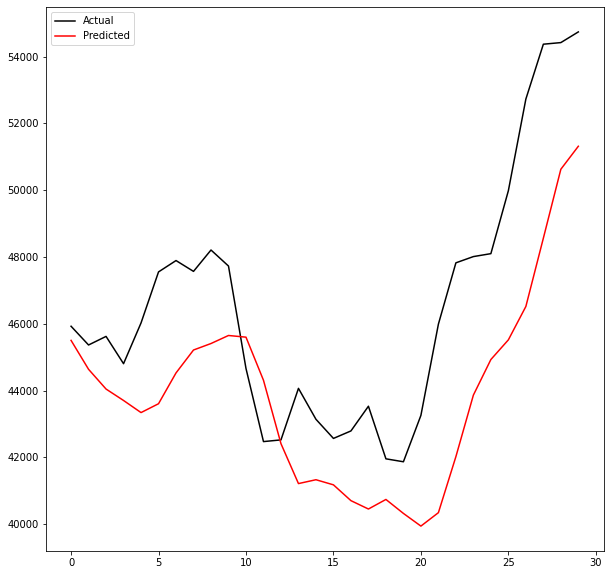

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-001relu64Int6_264.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00869: early stopping
Training R-Squared: 0.997670410410418

Testing R-Squared: 0.995810355495047

30day Holdout R-Squared: 0.6049352455518999

30day Holdout MAE: 1899.1098958333334

30day Holdout MAPE: 3.9775401047050116

30day Holdout RMSE: 2317.348030204319


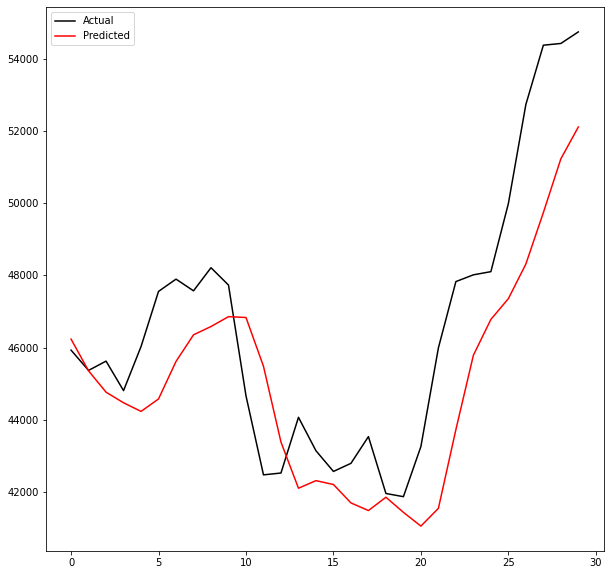

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300RMSprop0-0001relu64Int6_265.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01009: early stopping
Training R-Squared: 0.9969849980061961

Testing R-Squared: 0.9947184383963542

30day Holdout R-Squared: 0.5583375561929562

30day Holdout MAE: 2004.50078125

30day Holdout MAPE: 4.197047254600679

30day Holdout RMSE: 2450.204626996295


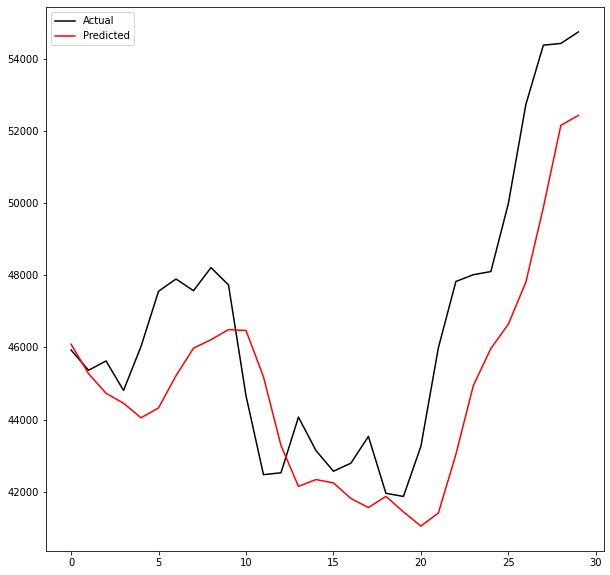

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-01relu64Int6_266.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00840: early stopping
Training R-Squared: 0.9945132524631256

Testing R-Squared: 0.9927461301367836

30day Holdout R-Squared: 0.6234546248401306

30day Holdout MAE: 1856.8869791666666

30day Holdout MAPE: 4.105523766982911

30day Holdout RMSE: 2262.381177996002


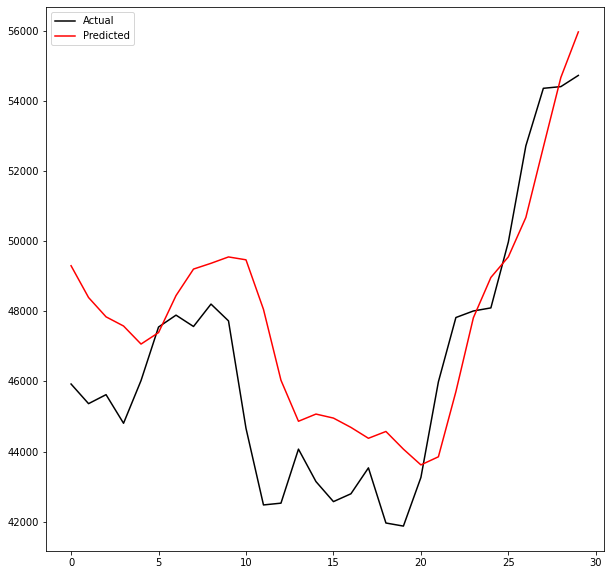

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-001relu64Int6_267.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 01102: early stopping
Training R-Squared: 0.9973873331480363

Testing R-Squared: 0.9961103098218801

30day Holdout R-Squared: 0.7736914164575621

30day Holdout MAE: 1353.5084635416667

30day Holdout MAPE: 2.9567054165549074

30day Holdout RMSE: 1753.9113287853631


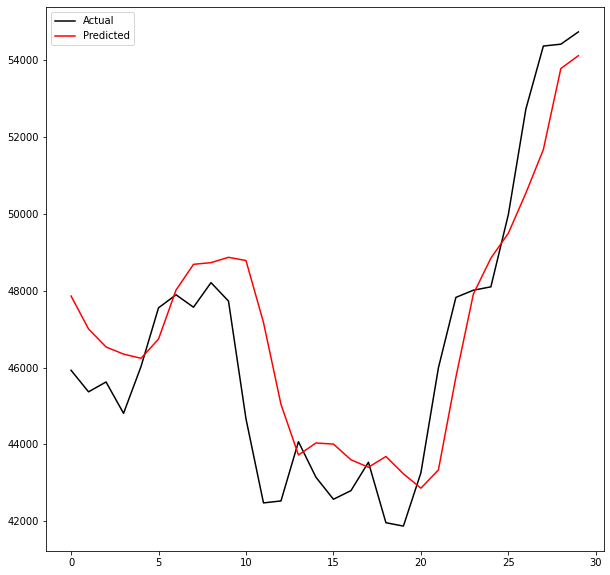

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday400RMSprop0-0001relu64Int6_268.hdf5
Number of Neurons: 400
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00513: early stopping
Training R-Squared: 0.9961467738421907

Testing R-Squared: 0.9941650199682859

30day Holdout R-Squared: 0.5196280979168357

30day Holdout MAE: 2065.7243489583334

30day Holdout MAPE: 4.307815717640998

30day Holdout RMSE: 2555.3236734217458


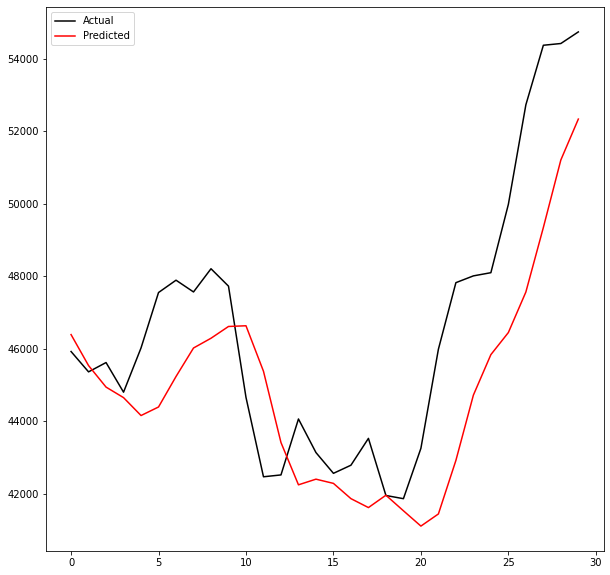

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-01relu64Int6_269.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00422: early stopping
Training R-Squared: 0.9943915174281139

Testing R-Squared: 0.9935167879918103

30day Holdout R-Squared: 0.6021253584451565

30day Holdout MAE: 1882.1390625

30day Holdout MAPE: 4.161860477293744

30day Holdout RMSE: 2325.574465339152


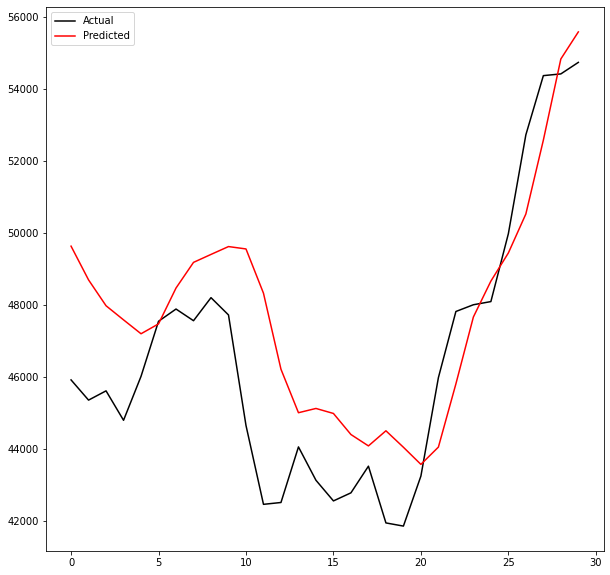

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-001relu64Int6_270.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00702: early stopping
Training R-Squared: 0.997868646839032

Testing R-Squared: 0.996427589443629

30day Holdout R-Squared: 0.7428263293569377

30day Holdout MAE: 1468.1856770833333

30day Holdout MAPE: 3.126629379015606

30day Holdout RMSE: 1869.6933005208891


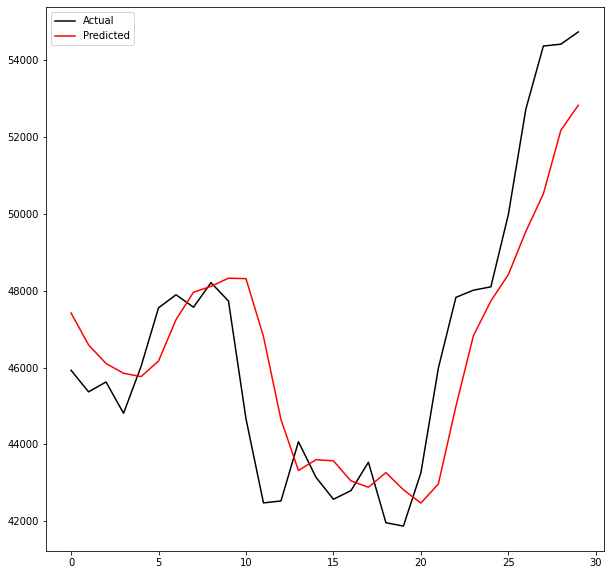

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday500RMSprop0-0001relu64Int6_271.hdf5
Number of Neurons: 500
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00433: early stopping
Training R-Squared: 0.9975704434506514

Testing R-Squared: 0.9954839884853233

30day Holdout R-Squared: 0.7318207097813259

30day Holdout MAE: 1527.521484375

30day Holdout MAPE: 3.246632252016223

30day Holdout RMSE: 1909.2805068932068


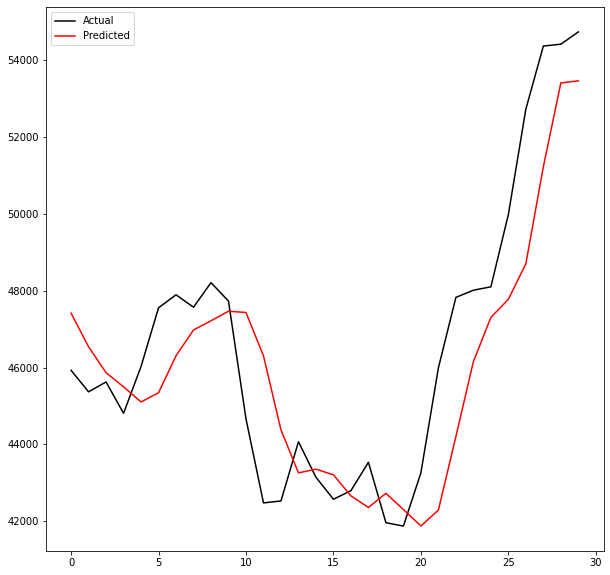

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-01relu64Int6_272.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.01
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00513: early stopping
Training R-Squared: 0.9956798095584272

Testing R-Squared: 0.9946592395806549

30day Holdout R-Squared: 0.6799102386305

30day Holdout MAE: 1660.4244791666667

30day Holdout MAPE: 3.663465131452888

30day Holdout RMSE: 2085.897729735329


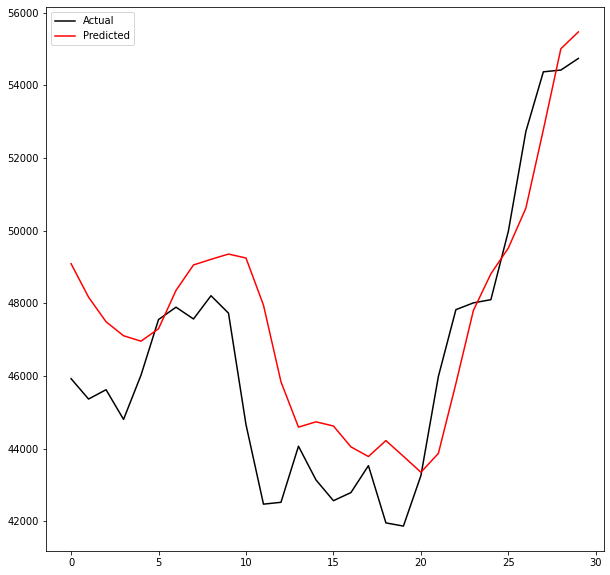

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-001relu64Int6_273.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.001
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00924: early stopping
Training R-Squared: 0.9980683028728825

Testing R-Squared: 0.9963316460571217

30day Holdout R-Squared: 0.6656734138238929

30day Holdout MAE: 1682.7083333333333

30day Holdout MAPE: 3.514960274354383

30day Holdout RMSE: 2131.7809499839323


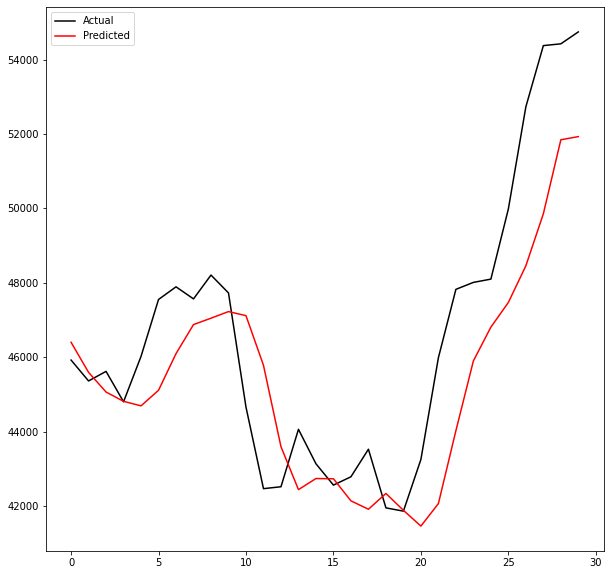

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday600RMSprop0-0001relu64Int6_274.hdf5
Number of Neurons: 600
Activation: relu
Optimizer: RMSprop
Learning Rate: 0.0001


In [56]:
opt_list = ['Adam', 'RMSprop']
activation_list = ['relu']
neuron_list = [200, 300, 400, 500, 600]
lr_list = [0.01, 0.001, 0.0001]

count += 1

for op in opt_list:
    for neuron in neuron_list:
        for l in lr_list:
            for act in activation_list:
                interval6_ann_model_nextday(X, y, lr=l, activation=act,
                                            neurons=neuron, opt=op, batch_size=64, epochs=5000, count=count)
                count += 1

## Feature Adjustment Using Best Interval

In [69]:
# create a list of features
features = X.columns[1:]

# start with 4 features
features_4 = features[:4]
features_4


Index(['median_transaction_fee30trxUSD', 'median_transaction_fee7trxUSD',
       'price90emaUSD', 'size90trx'],
      dtype='object')

In [70]:
# add the date column to the beginning of the features list
cols = ['Date'] + list(features_4)
cols

['Date',
 'median_transaction_fee30trxUSD',
 'median_transaction_fee7trxUSD',
 'price90emaUSD',
 'size90trx']

['Date', 'median_transaction_fee30trxUSD', 'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx', 'transactions']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00539: early stopping
Training R-Squared: 0.9980955416800747

Testing R-Squared: 0.9966449088032676

30day Holdout R-Squared: -0.40425722580562673

30day Holdout MAE: 3794.995052083333

30day Holdout MAPE: 8.483746378748084

30day Holdout RMSE: 4368.983994631599


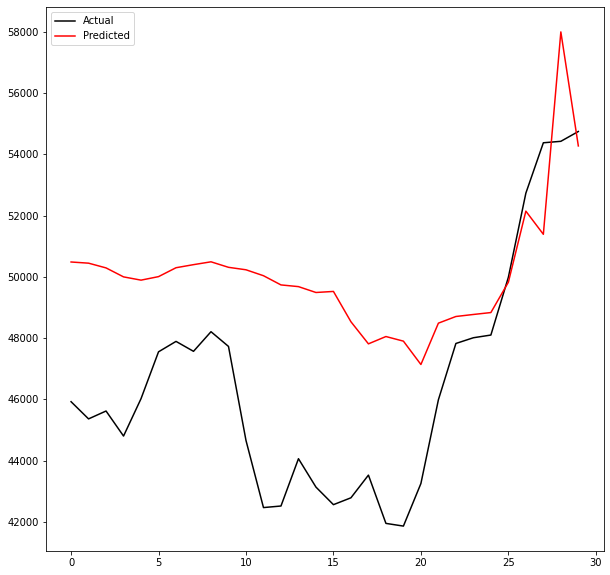

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_283.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['Date', 'median_transaction_fee30trxUSD', 'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx', 'price30wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00259: early stopping
Training R-Squared: 0.9935079123300763

Testing R-Squared: 0.9914018721083184

30day Holdout R-Squared: -0.516026912709894

30day Holdout MAE: 3686.62890625

30day Holdout MAPE: 7.68551969107172

30day Holdout RMSE: 4539.526708003176


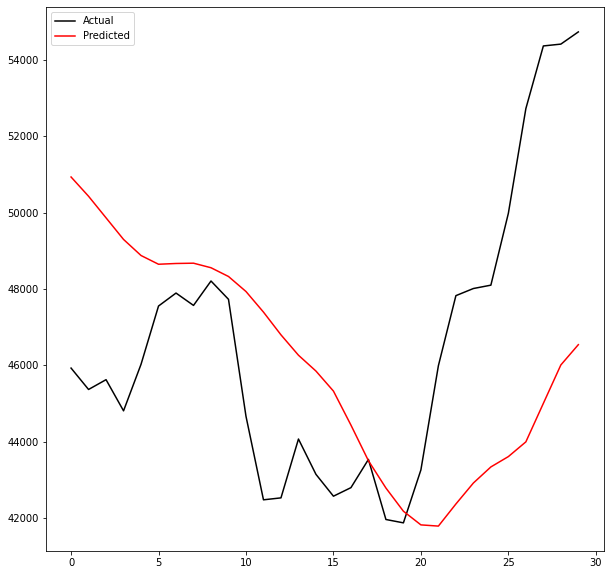

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_284.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['Date', 'median_transaction_fee30trxUSD', 'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx', 'price3wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00414: early stopping
Training R-Squared: 0.9960645607234575

Testing R-Squared: 0.9949236210908868

30day Holdout R-Squared: 0.5523254737746992

30day Holdout MAE: 2032.6127604166666

30day Holdout MAPE: 4.268934194190469

30day Holdout RMSE: 2466.8248312054025


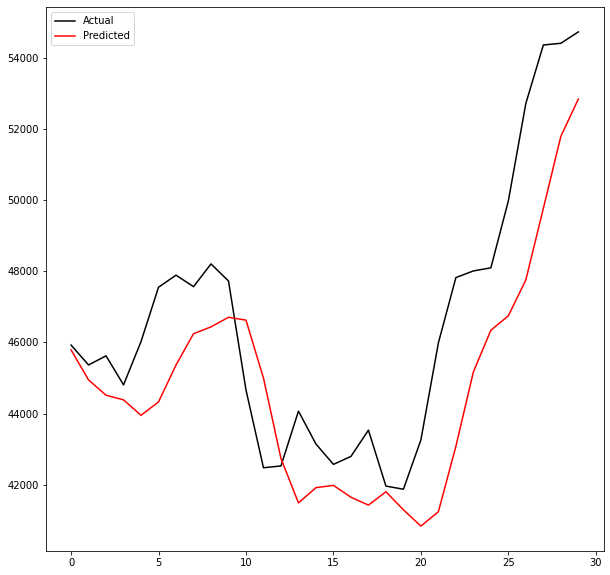

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_285.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['Date', 'median_transaction_fee30trxUSD', 'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx', 'price3wmaUSD', 'price7wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00891: early stopping
Training R-Squared: 0.9973399236096315

Testing R-Squared: 0.9969343683665711

30day Holdout R-Squared: 0.6296479611931308

30day Holdout MAE: 1868.8419270833333

30day Holdout MAPE: 3.9584590080767903

30day Holdout RMSE: 2243.698460628469


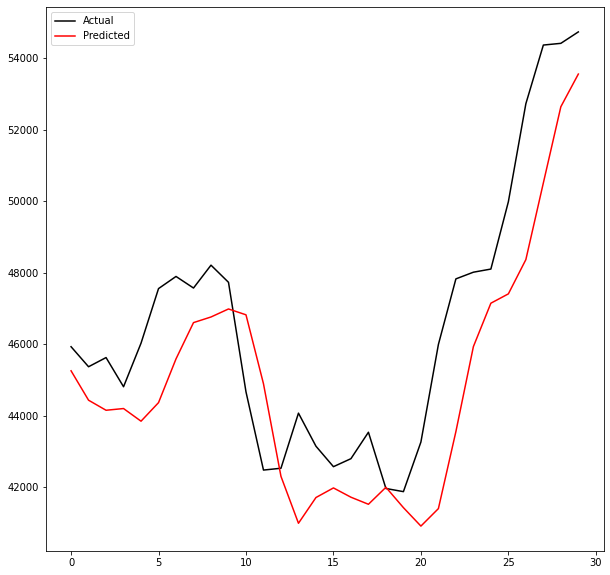

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_286.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['Date', 'median_transaction_fee30trxUSD', 'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx', 'price3wmaUSD', 'price7wmaUSD', 'median_transaction_fee7rocUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00452: early stopping
Training R-Squared: 0.997543794384305

Testing R-Squared: 0.9971924737915486

30day Holdout R-Squared: 0.7157653072682475

30day Holdout MAE: 1517.8919270833333

30day Holdout MAPE: 3.203924477645423

30day Holdout RMSE: 1965.6023502422229


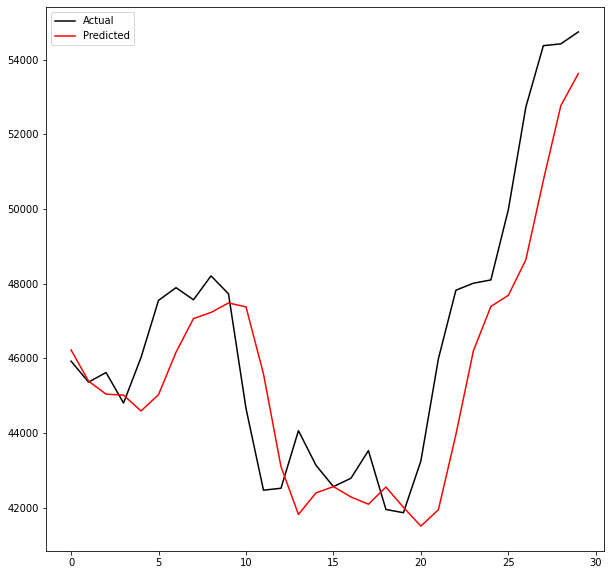

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_287.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['Date', 'median_transaction_fee30trxUSD', 'median_transaction_fee7trxUSD', 'price90emaUSD', 'size90trx', 'price3wmaUSD', 'price7wmaUSD', 'median_transaction_fee7rocUSD', 'difficulty30rsi']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00229: early stopping
Training R-Squared: 0.9960086926722176

Testing R-Squared: 0.9963723851430879

30day Holdout R-Squared: 0.7492486537266969

30day Holdout MAE: 1433.3434895833334

30day Holdout MAPE: 3.1212179317866564

30day Holdout RMSE: 1846.2000431410531


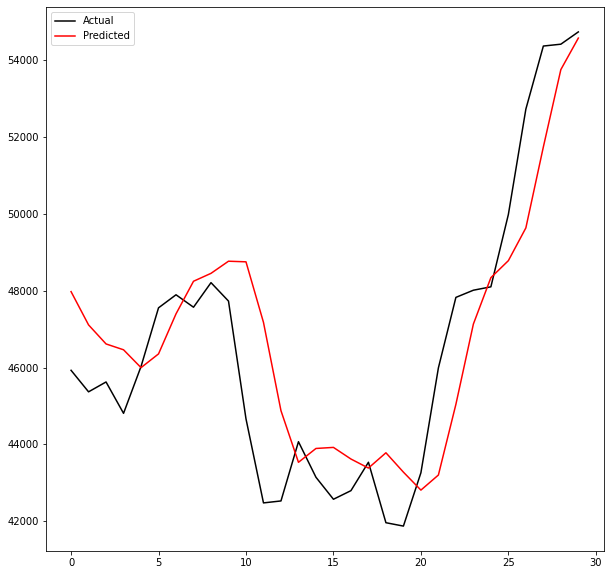

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_288.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01


In [71]:
# set the parameters from the best parameters so far from interval 4
act = 'relu'
neuron = 300
op = 'Adam'
l = 0.01

# set a variable for the max R squared
r_sq_max = 0

count += 1 
# iterate through the features to add to the columns list
for feat in features[4:]:
    cols.append(feat)
    print(cols)

    # update X with the new features
    new_X = X[cols]
    r_sq = interval4_ann_model_nextday(new_X, y, lr=l, activation=act, neurons=neuron, opt=op, batch_size=64, epochs=5000, count=count)
    count += 1
    
    if r_sq < r_sq_max:
        cols = cols[:-1]
    else:
        r_sq_max = r_sq

### Iteratively test 100 features
Take the 100 best features and iterate through them adding one at a time. If the holdout R-squared improves, keep the feature in the list. If the R-squared does not improve, drop the feature and try the process on the next feature.

In [60]:
X_100

,price3wmaUSD,price90wmaUSD,price30smaUSD,transactionvalue90emaUSD,price3emaUSD,transactionvalue90wmaUSD,transactionvalue90smaUSD,price7smaUSD,price14emaUSD,price90emaUSD,...,fee_to_reward7momUSD,transactionvalue7varUSD,price30momUSD,transactions30var,price30rocUSD,top100cap90wma,hashrate30std,transactionfees7trxUSD,median_transaction_fee3momUSD,transactions7trx
0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-0.017617,-1.000000,-0.001352,-0.999460,-0.844407,0.209034,-1.000000,-0.969228,-0.027404,-0.337119
1,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-0.017617,-1.000000,-0.001352,-0.999461,-0.844407,0.214160,-1.000000,-0.969228,-0.027404,-0.516024
2,-0.999998,-1.000000,-1.000000,-1.000000,-0.999998,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-0.017617,-1.000000,-0.001352,-0.999463,-0.844407,0.218965,-1.000000,-0.969228,-0.027404,-0.628934
3,-0.999997,-1.000000,-1.000000,-1.000000,-0.999998,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-0.017617,-1.000000,-0.001352,-0.999465,-0.844407,0.223343,-1.000000,-0.969228,-0.027404,-0.702302
4,-0.999997,-1.000000,-1.000000,-1.000000,-0.999998,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-0.017617,-1.000000,-0.001352,-0.999467,-0.844407,0.227829,-1.000000,-0.969228,-0.027404,-0.758267
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4098,0.557645,0.614204,0.573571,0.962914,0.560008,0.955311,0.945293,0.506880,0.526855,0.692749,...,-0.015602,-0.968210,-0.014927,-0.564930,-0.846157,-0.817716,-0.176107,-0.969108,-0.024578,-0.727302
4099,0.621660,0.621925,0.574705,0.983699,0.623133,0.976840,0.963352,0.557211,0.556362,0.699860,...,0.012105,-0.907158,0.037183,-0.565422,-0.839575,-0.818570,-0.156450,-0.967304,0.009278,-0.724627
4100,0.686787,0.630784,0.579721,0.989633,0.680950,0.985090,0.972362,0.608742,0.589218,0.708196,...,0.043348,-0.917206,0.172759,-0.487943,-0.821806,-0.819424,-0.132310,-0.964187,0.036068,-0.716967
4101,0.719478,0.639501,0.589033,0.997117,0.710658,0.994687,0.988164,0.647813,0.617897,0.716378,...,0.015032,-0.917163,0.322010,-0.481888,-0.799079,-0.820172,-0.127271,-0.961839,0.029800,-0.714639


In [61]:
features_cols = list(X_100.columns)
len(features_cols)

100

In [72]:
# take the first 5 features from the VIF list
first_5 = top_20_feat[:5]

# remove them from the features_col
for feat in first_5:
    features_cols.remove(feat)
    
# check they are removed
'top100cap30trx' in features_cols

False

In [73]:
# add Date to the beginning of the cols list
cols = ['Date'] + first_5
cols

['Date',
 'median_transaction_fee3momUSD',
 'fee_to_reward7momUSD',
 'top100cap7mom',
 'mining_profitability7rsi',
 'top100cap14mom']

In [77]:
# take just the 100 best features from the full untransformed dataframe
columns = ['Date'] + list(X_100.columns)
X = full_df.loc[:, columns]
X.head()

,Date,price3wmaUSD,price90wmaUSD,price30smaUSD,transactionvalue90emaUSD,price3emaUSD,transactionvalue90wmaUSD,transactionvalue90smaUSD,price7smaUSD,price14emaUSD,...,fee_to_reward7momUSD,transactionvalue7varUSD,price30momUSD,transactions30var,price30rocUSD,top100cap90wma,hashrate30std,transactionfees7trxUSD,median_transaction_fee3momUSD,transactions7trx
0,2010/07/17,0.000,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1035417,0.0,24.672,1.253759e+09,0.0,0.0,19.663
1,2010/07/18,0.000,0.0,0.0,0.0,0.000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1032220,0.0,24.720,1.309381e+09,0.0,0.0,10.904
2,2010/07/19,0.075,0.0,0.0,0.0,0.069,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1028765,0.0,24.765,1.356011e+09,0.0,0.0,5.376
3,2010/07/20,0.080,0.0,0.0,0.0,0.074,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1024554,0.0,24.806,1.403524e+09,0.0,0.0,1.784
4,2010/07/21,0.079,0.0,0.0,0.0,0.075,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1021915,0.0,24.848,1.451090e+09,0.0,0.0,-0.956


['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00158: early stopping
Training R-Squared: 0.9950567691797477

Testing R-Squared: 0.9956953197153922

30day Holdout R-Squared: 0.8593868708441326

30day Holdout MAE: 1249.6891927083334

30day Holdout MAPE: 2.730838747353844

30day Holdout RMSE: 1382.5156511942341


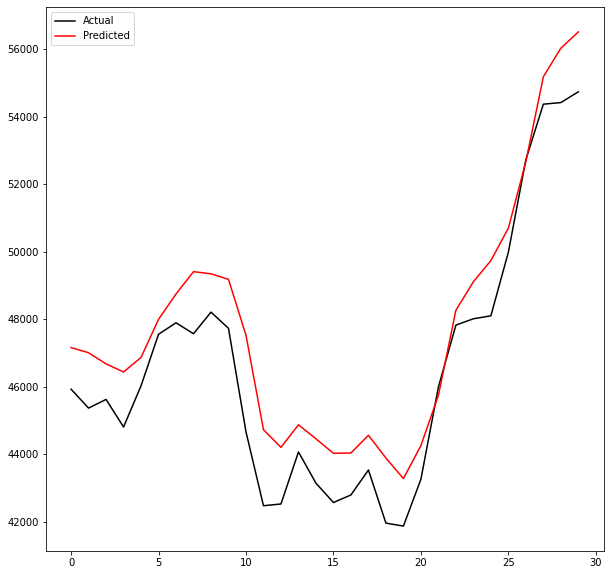

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_290.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price90wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00154: early stopping
Training R-Squared: 0.9908725730241332

Testing R-Squared: 0.9896231522056973

30day Holdout R-Squared: 0.43977185940895613

30day Holdout MAE: 2683.6192708333333

30day Holdout MAPE: 5.790633944674939

30day Holdout RMSE: 2759.5583405217667


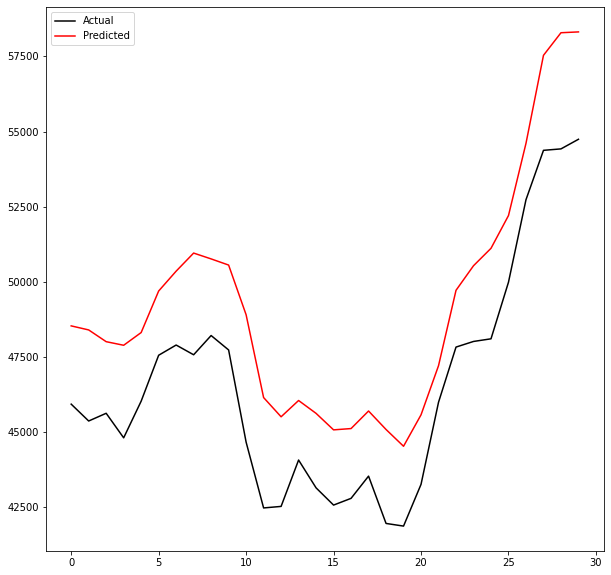

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_291.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'price30smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.36031726180160173

Testing R-Squared: -0.36911203765480627

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


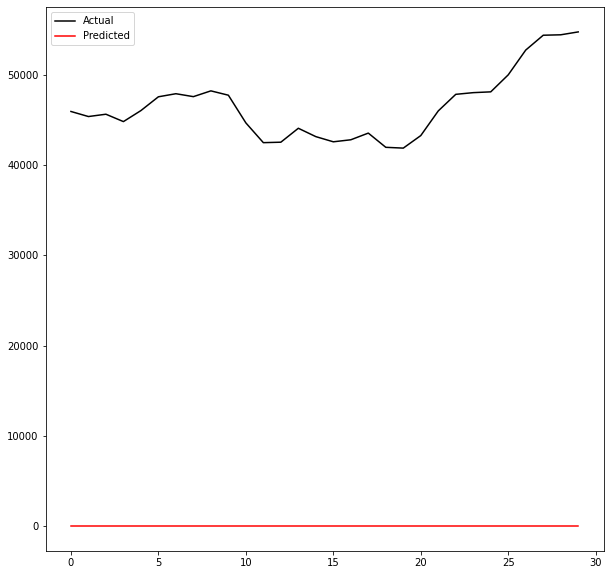

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_292.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00623: early stopping
Training R-Squared: 0.9970951884291088

Testing R-Squared: 0.9958246666633641

30day Holdout R-Squared: 0.9680824941852639

30day Holdout MAE: 503.34752604166664

30day Holdout MAPE: 1.0948782975957843

30day Holdout RMSE: 658.6756264537938


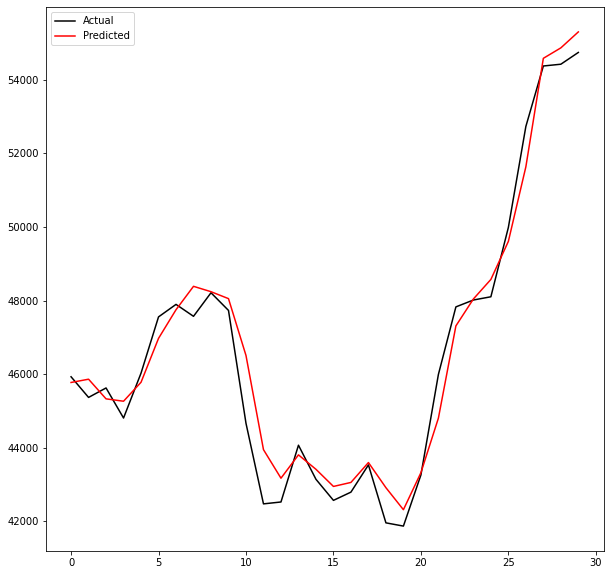

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_293.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'price3emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00122: early stopping
Training R-Squared: 0.995664635716646

Testing R-Squared: 0.9951820266116969

30day Holdout R-Squared: 0.7349575829591217

30day Holdout MAE: 1696.7596354166667

30day Holdout MAPE: 3.568525739291436

30day Holdout RMSE: 1898.0813055853828


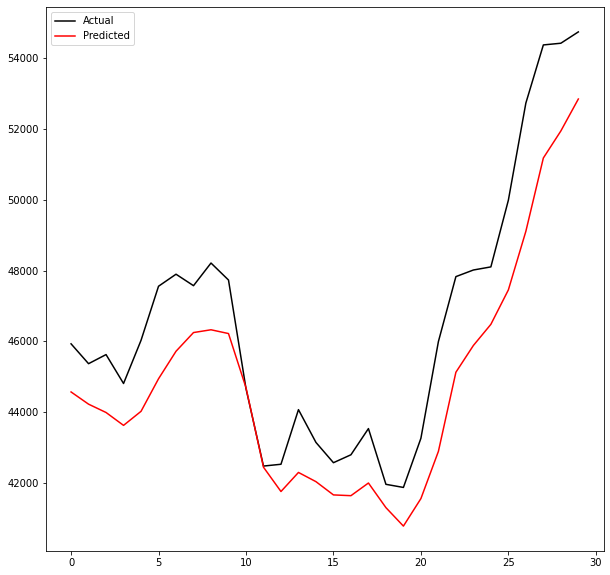

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_294.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'transactionvalue90wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00183: early stopping
Training R-Squared: 0.9964791203663302

Testing R-Squared: 0.9960100055535785

30day Holdout R-Squared: 0.9481312169752167

30day Holdout MAE: 684.8139322916667

30day Holdout MAPE: 1.4637261425574266

30day Holdout RMSE: 839.6729241914733


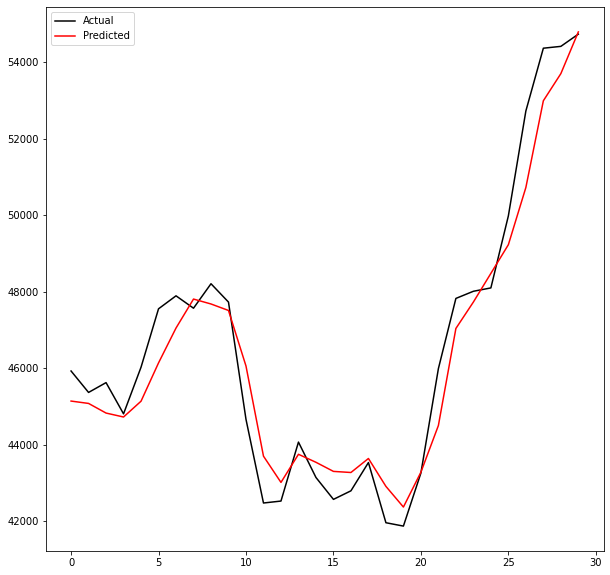

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_295.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'transactionvalue90smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00186: early stopping
Training R-Squared: 0.9966852318958144

Testing R-Squared: 0.9955740658388151

30day Holdout R-Squared: 0.9432461592520984

30day Holdout MAE: 717.44765625

30day Holdout MAPE: 1.5114546201669272

30day Holdout RMSE: 878.3239975195564


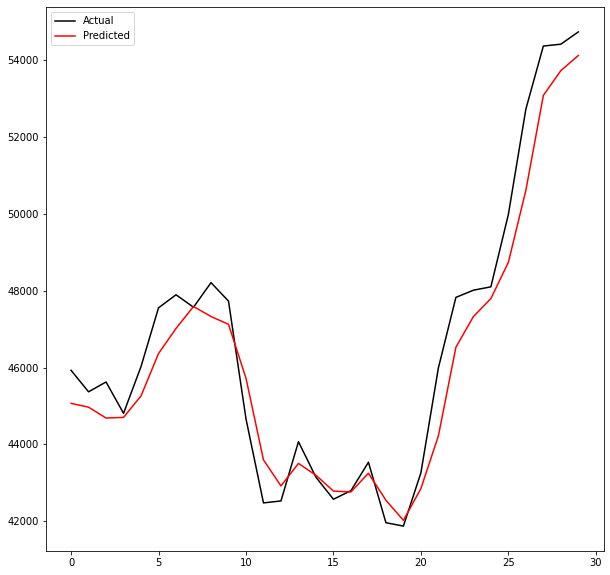

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_296.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'price7smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00170: early stopping
Training R-Squared: 0.9908147381757231

Testing R-Squared: 0.9917603828156716

30day Holdout R-Squared: 0.5505136968198718

30day Holdout MAE: 2294.014713541667

30day Holdout MAPE: 5.0315971302714955

30day Holdout RMSE: 2471.8115160625894


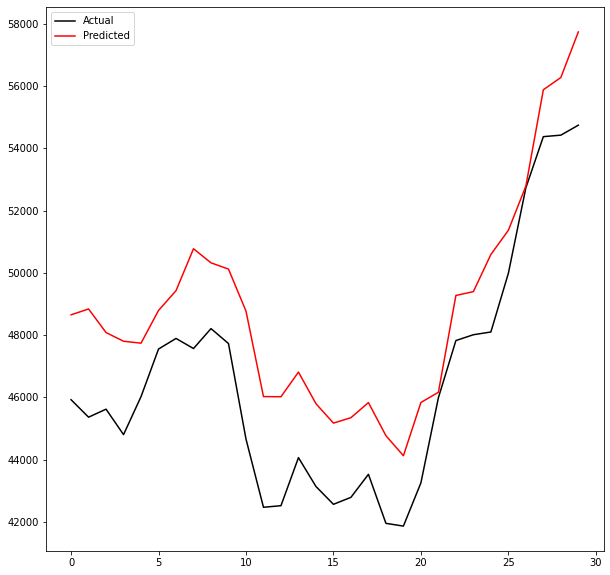

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_297.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'price14emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00499: early stopping
Training R-Squared: 0.9976821681629318

Testing R-Squared: 0.997037917167484

30day Holdout R-Squared: 0.6508153688084303

30day Holdout MAE: 2008.578125

30day Holdout MAPE: 4.250723770985377

30day Holdout RMSE: 2178.636023726073


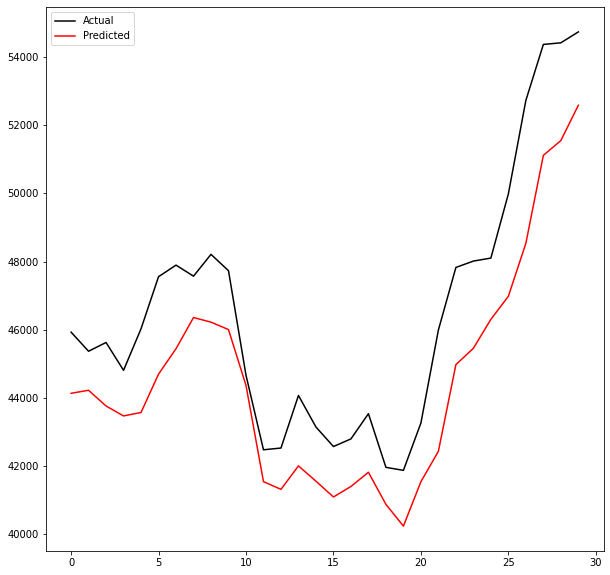

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_298.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'price90emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00239: early stopping
Training R-Squared: 0.9943945186861791

Testing R-Squared: 0.9934430861343416

30day Holdout R-Squared: 0.8112684984751539

30day Holdout MAE: 1459.5225260416667

30day Holdout MAPE: 3.103590047022852

30day Holdout RMSE: 1601.6931478176243


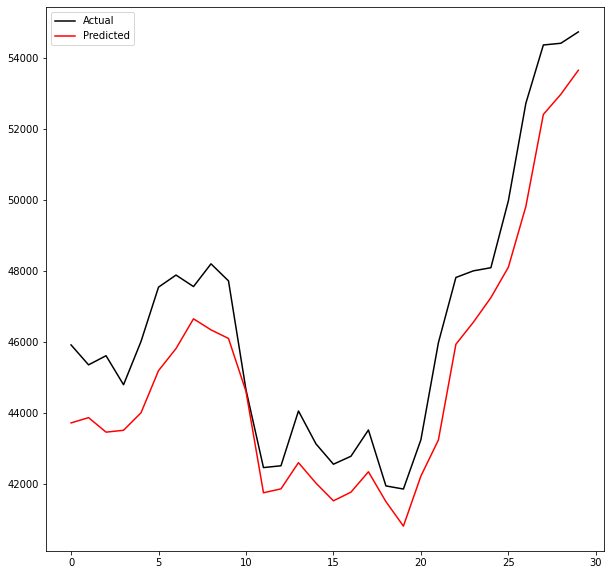

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_299.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'transactionvalue30wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00350: early stopping
Training R-Squared: 0.9956610446791263

Testing R-Squared: 0.9955744754729492

30day Holdout R-Squared: 0.9419967669546139

30day Holdout MAE: 714.459375

30day Holdout MAPE: 1.5181346643632359

30day Holdout RMSE: 887.9391826091089


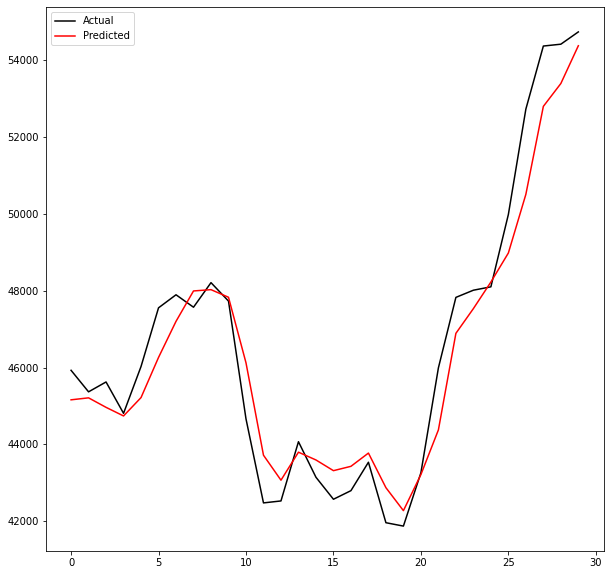

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_300.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'price14wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00377: early stopping
Training R-Squared: 0.9971418219023661

Testing R-Squared: 0.9964047315601998

30day Holdout R-Squared: 0.8012035798368531

30day Holdout MAE: 1424.8884114583334

30day Holdout MAPE: 2.9985904300140733

30day Holdout RMSE: 1643.847024396556


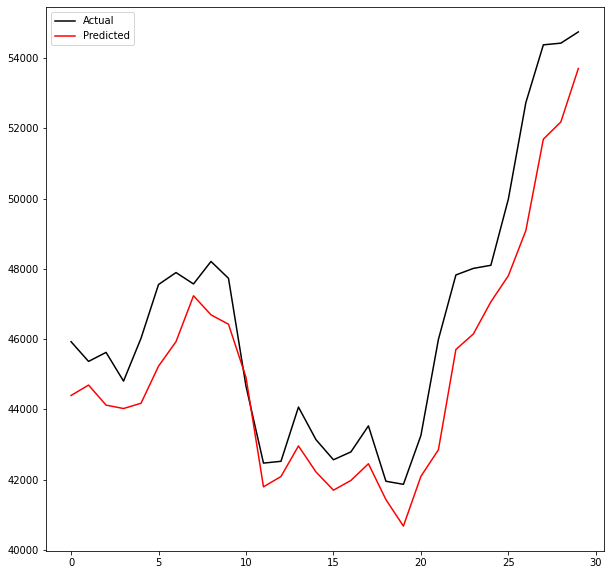

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_301.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'price90smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00303: early stopping
Training R-Squared: 0.9949355526834751

Testing R-Squared: 0.9922152999106219

30day Holdout R-Squared: 0.9374691363291402

30day Holdout MAE: 705.670703125

30day Holdout MAPE: 1.5080043282115252

30day Holdout RMSE: 921.9435571218079


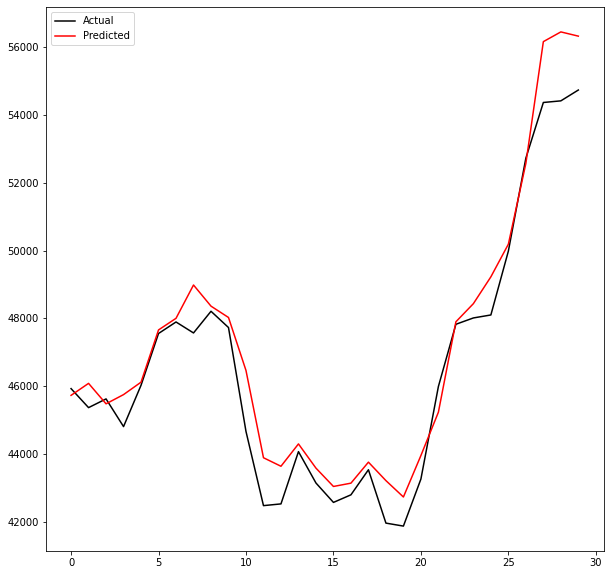

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_302.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'transactionvalue30emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00190: early stopping
Training R-Squared: 0.9966791787960398

Testing R-Squared: 0.9965985098178122

30day Holdout R-Squared: 0.43687705654880726

30day Holdout MAE: 2654.2734375

30day Holdout MAPE: 5.818508739001212

30day Holdout RMSE: 2766.6787295353206


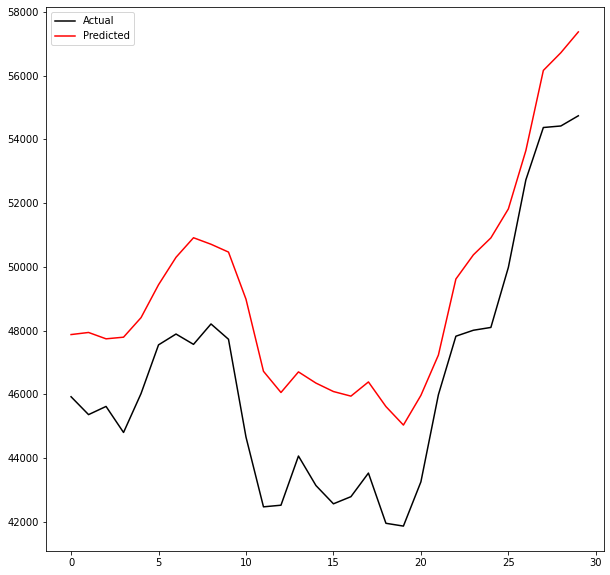

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_303.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'price3smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00370: early stopping
Training R-Squared: 0.997368032855629

Testing R-Squared: 0.9968318686912315

30day Holdout R-Squared: 0.9314386542139692

30day Holdout MAE: 762.1997395833333

30day Holdout MAPE: 1.675057086556792

30day Holdout RMSE: 965.376642909898


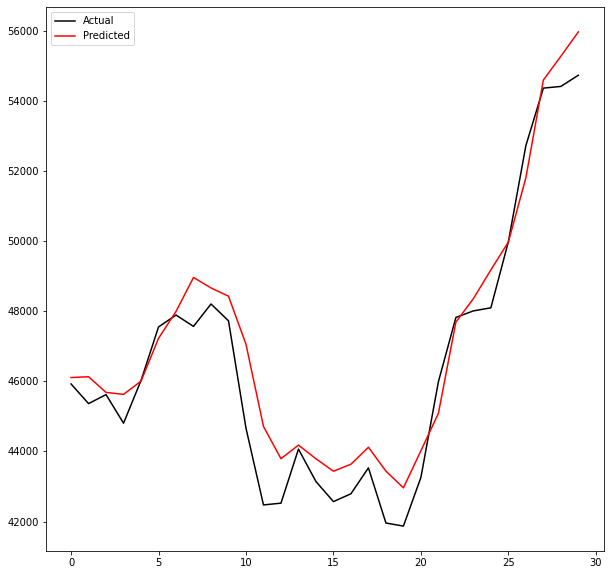

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_304.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'price7wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00133: early stopping
Training R-Squared: 0.9965280398920068

Testing R-Squared: 0.9960944805024448

30day Holdout R-Squared: 0.8723090826626541

30day Holdout MAE: 1071.205859375

30day Holdout MAPE: 2.23637975402342

30day Holdout RMSE: 1317.4590452992272


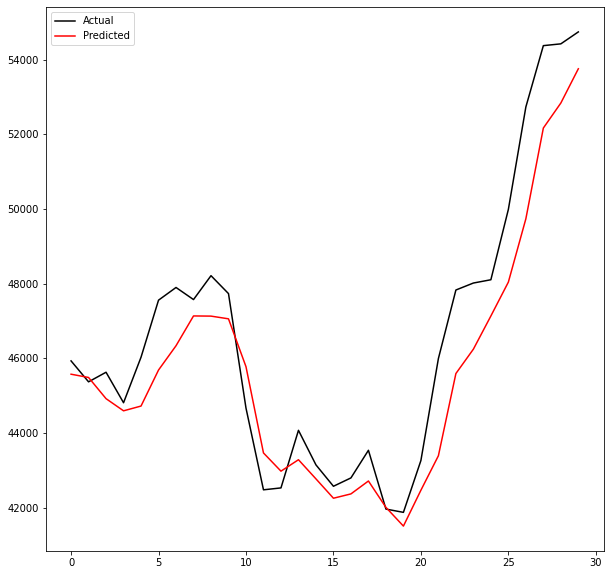

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_305.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'price30emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00311: early stopping
Training R-Squared: 0.9967857851280085

Testing R-Squared: 0.9964685643655046

30day Holdout R-Squared: 0.8715720956308173

30day Holdout MAE: 1150.598828125

30day Holdout MAPE: 2.4267834966132793

30day Holdout RMSE: 1321.2555301406408


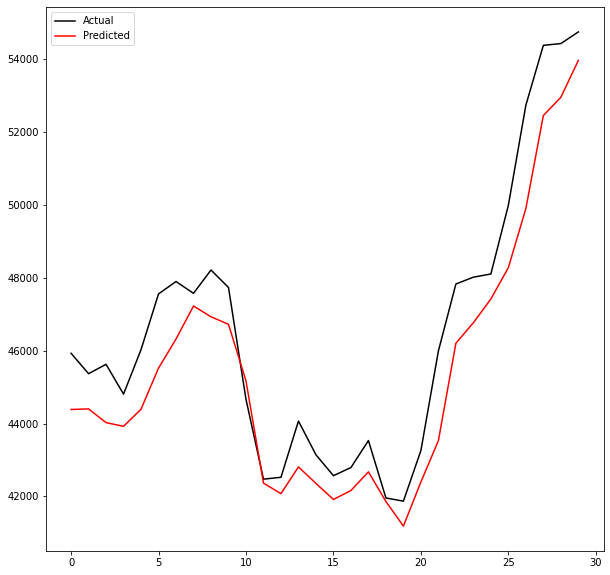

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_306.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'price30wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.36031726194235114

Testing R-Squared: -0.3691120377549306

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


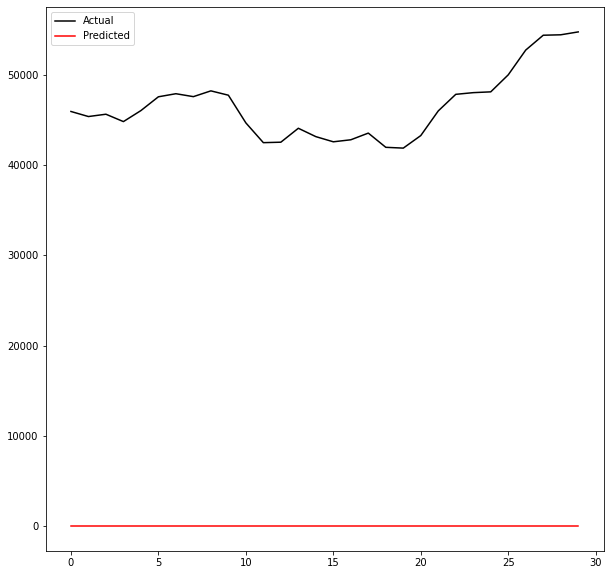

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_307.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'price14smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00256: early stopping
Training R-Squared: 0.9961505137865532

Testing R-Squared: 0.996237375370609

30day Holdout R-Squared: 0.9442191164843506

30day Holdout MAE: 725.4069010416666

30day Holdout MAPE: 1.5741956924829745

30day Holdout RMSE: 870.7626942804038


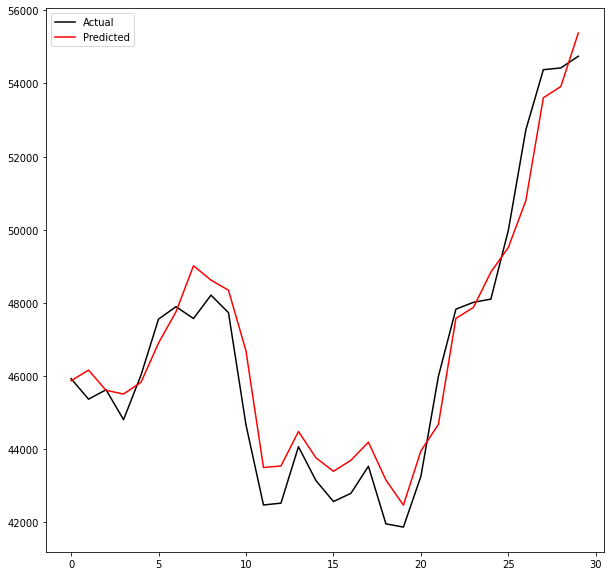

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_308.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'transactionvalue14smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00251: early stopping
Training R-Squared: 0.9968667264876083

Testing R-Squared: 0.9964973989810019

30day Holdout R-Squared: 0.9648003779434083

30day Holdout MAE: 540.5708333333333

30day Holdout MAPE: 1.1678452381013968

30day Holdout RMSE: 691.7132905683372


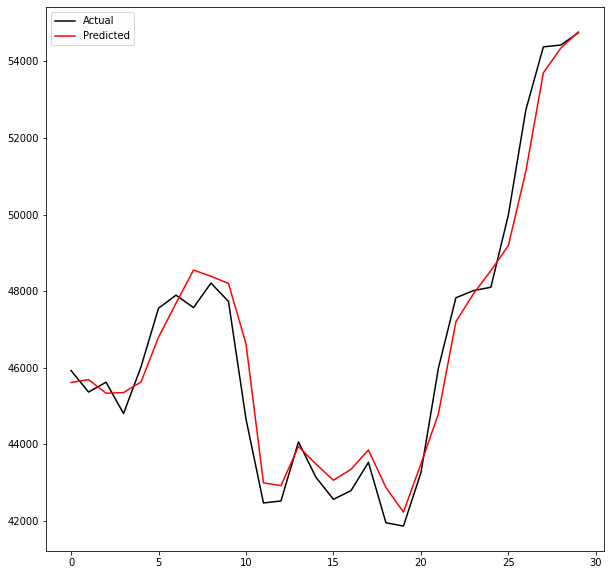

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_309.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'price7emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00206: early stopping
Training R-Squared: 0.9973378919024507

Testing R-Squared: 0.996860803710507

30day Holdout R-Squared: 0.8651668364691819

30day Holdout MAE: 1043.8938802083333

30day Holdout MAPE: 2.15818306770256

30day Holdout RMSE: 1353.8030314070747


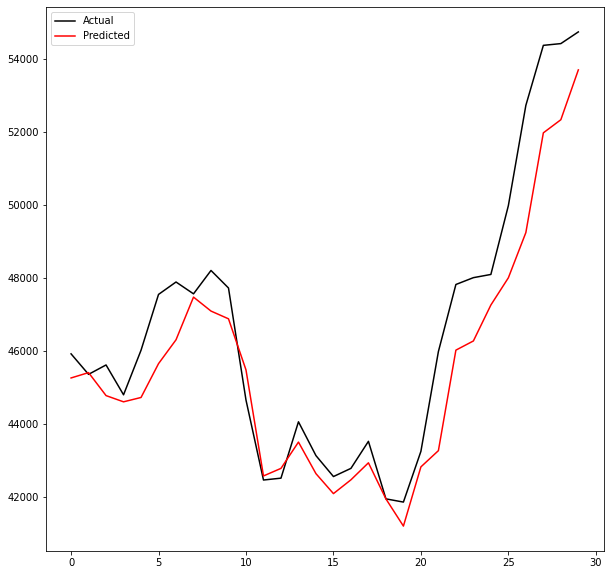

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_310.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'transactionvalue30smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00311: early stopping
Training R-Squared: 0.9972988556876018

Testing R-Squared: 0.996594942553678

30day Holdout R-Squared: 0.9528197507968826

30day Holdout MAE: 631.4479166666666

30day Holdout MAPE: 1.3912016325496288

30day Holdout RMSE: 800.824286214619


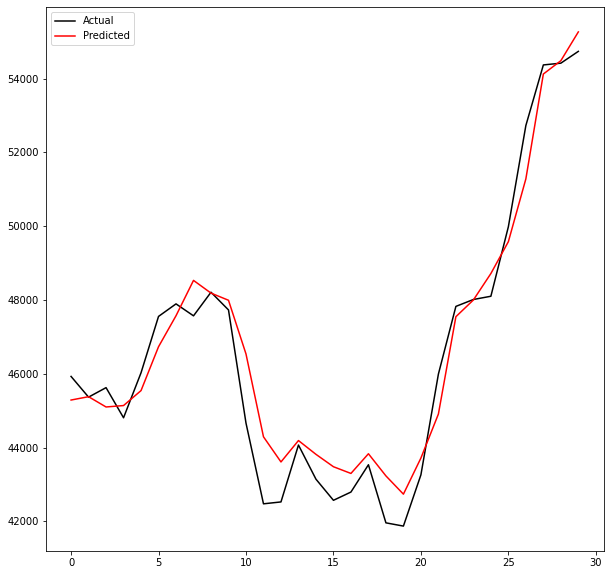

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_311.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty3ema']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00256: early stopping
Training R-Squared: 0.9966067019653745

Testing R-Squared: 0.9953897894469497

30day Holdout R-Squared: 0.8649122393643688

30day Holdout MAE: 1227.805078125

30day Holdout MAPE: 2.607345640630705

30day Holdout RMSE: 1355.0805797857572


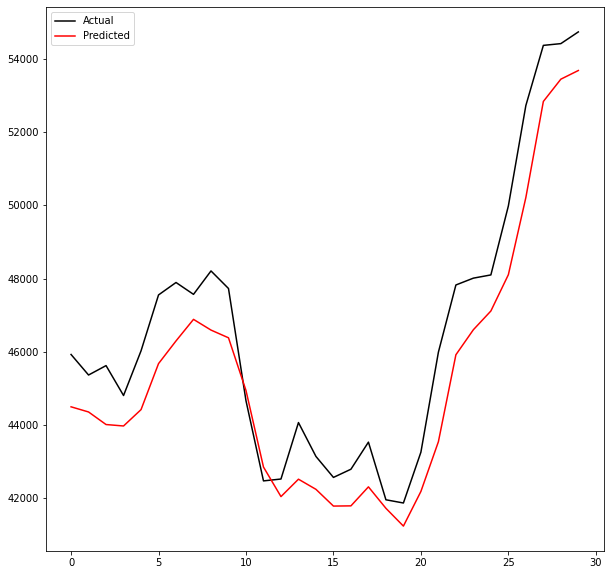

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_312.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'hashrate14sma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00174: early stopping
Training R-Squared: 0.9974152666738964

Testing R-Squared: 0.9964913981560074

30day Holdout R-Squared: 0.9404297550656644

30day Holdout MAE: 731.1454427083333

30day Holdout MAPE: 1.6087910635657006

30day Holdout RMSE: 899.8535057491193


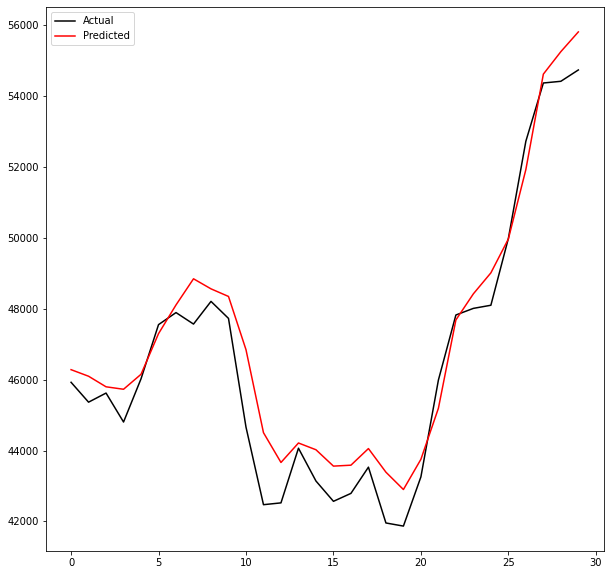

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_313.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty7ema']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00347: early stopping
Training R-Squared: 0.9978504627657512

Testing R-Squared: 0.9973891157114051

30day Holdout R-Squared: 0.9674330543446458

30day Holdout MAE: 532.9497395833333

30day Holdout MAPE: 1.1622112797133897

30day Holdout RMSE: 665.343065456443


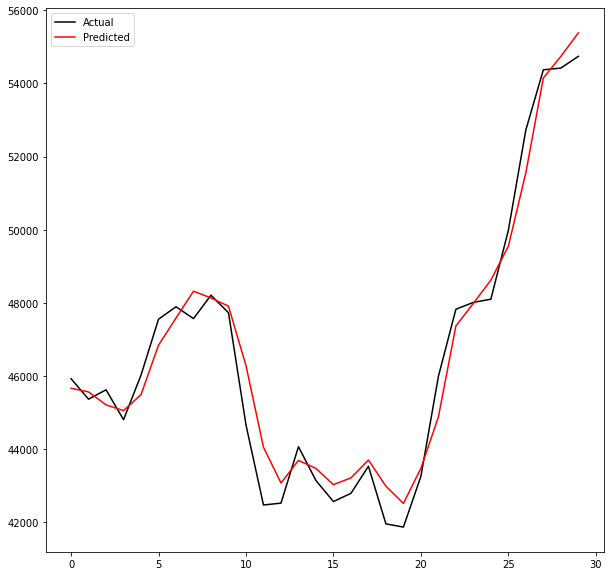

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_314.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'hashrate30sma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00348: early stopping
Training R-Squared: 0.9968670574301927

Testing R-Squared: 0.9966276370153774

30day Holdout R-Squared: 0.9573793506955043

30day Holdout MAE: 607.2515625

30day Holdout MAPE: 1.3282899993555368

30day Holdout RMSE: 761.1445655279763


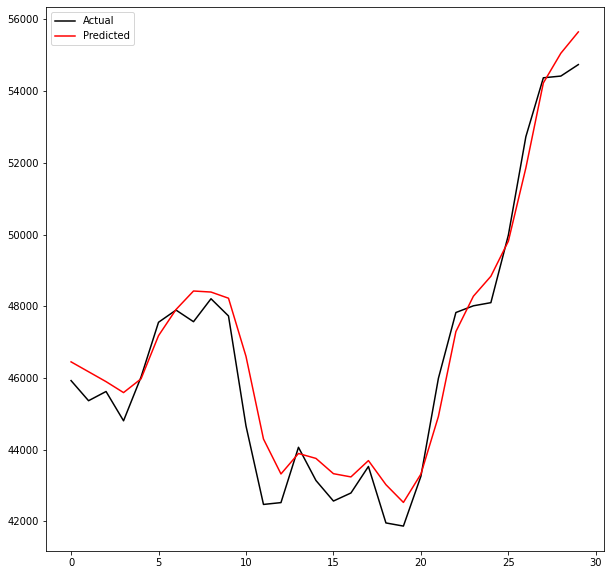

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_315.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'hashrate30ema']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00461: early stopping
Training R-Squared: 0.9977907183206303

Testing R-Squared: 0.9971282342890087

30day Holdout R-Squared: 0.9104248840859323

30day Holdout MAE: 931.6494791666667

30day Holdout MAPE: 1.9611906766971967

30day Holdout RMSE: 1103.4453007915658


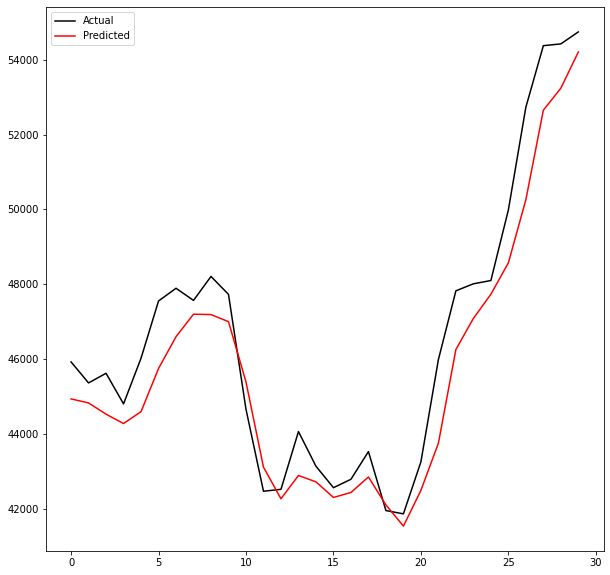

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_316.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30ema']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00418: early stopping
Training R-Squared: 0.9974016505610497

Testing R-Squared: 0.9969127590037173

30day Holdout R-Squared: 0.9144565736276278

30day Holdout MAE: 932.8118489583334

30day Holdout MAPE: 1.9702824682741433

30day Holdout RMSE: 1078.3269039447816


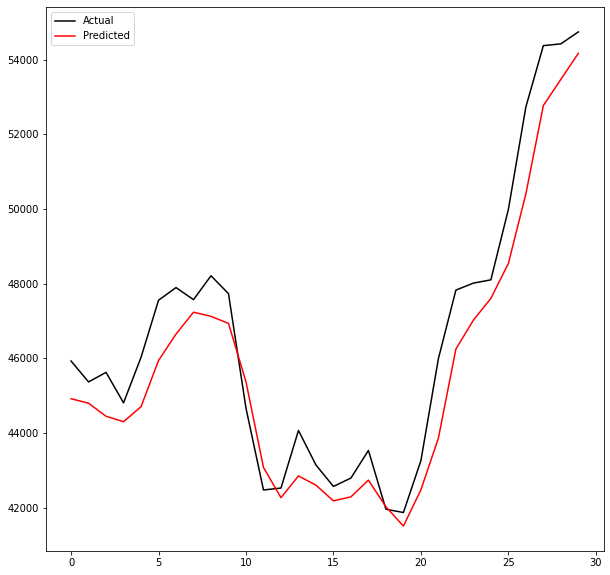

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_317.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'price90rsiUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00283: early stopping
Training R-Squared: 0.9964515747623734

Testing R-Squared: 0.9966260422529793

30day Holdout R-Squared: 0.6509424302467717

30day Holdout MAE: 2081.676171875

30day Holdout MAPE: 4.511787819363753

30day Holdout RMSE: 2178.239606202148


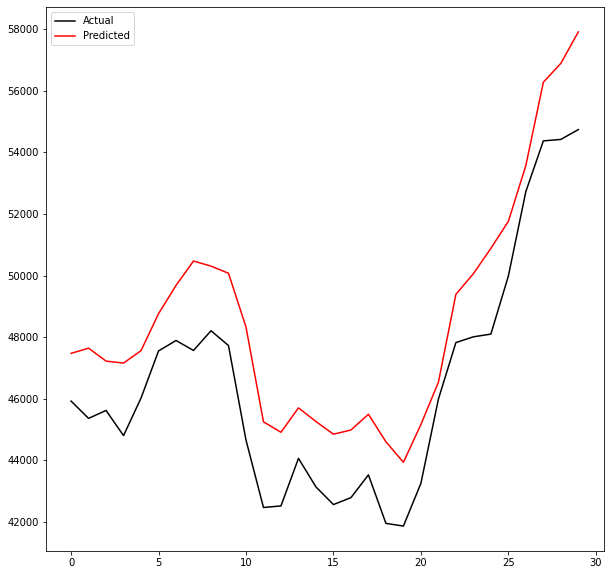

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_318.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty14sma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00201: early stopping
Training R-Squared: 0.9966799149055853

Testing R-Squared: 0.9955407396956614

30day Holdout R-Squared: 0.9113104728749986

30day Holdout MAE: 932.6768229166667

30day Holdout MAPE: 2.044906989593322

30day Holdout RMSE: 1097.9771187390638


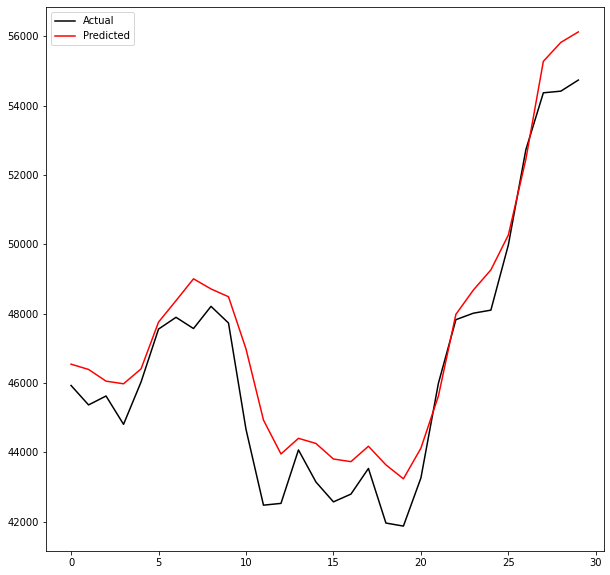

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_319.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty14ema']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00224: early stopping
Training R-Squared: 0.9973330039228577

Testing R-Squared: 0.9967921304901897

30day Holdout R-Squared: 0.8683325295587232

30day Holdout MAE: 1189.706640625

30day Holdout MAPE: 2.5208615381316704

30day Holdout RMSE: 1337.8159396449967


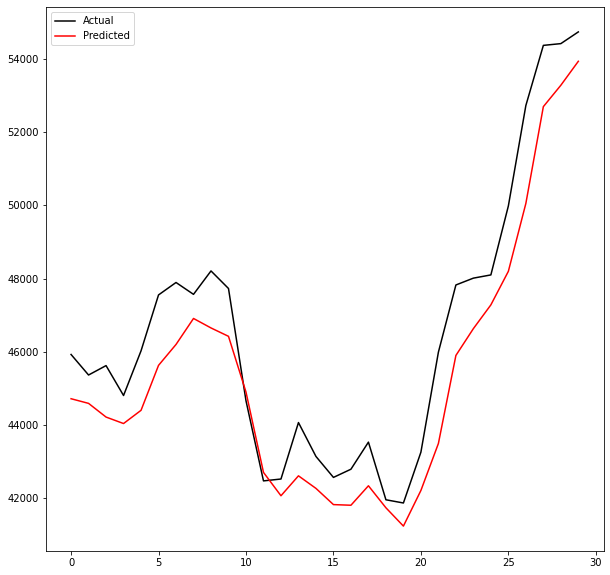

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_320.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00333: early stopping
Training R-Squared: 0.9972518210621865

Testing R-Squared: 0.9961403377427507

30day Holdout R-Squared: 0.9691098125945449

30day Holdout MAE: 502.925390625

30day Holdout MAPE: 1.0714211406858976

30day Holdout RMSE: 647.9886390737984


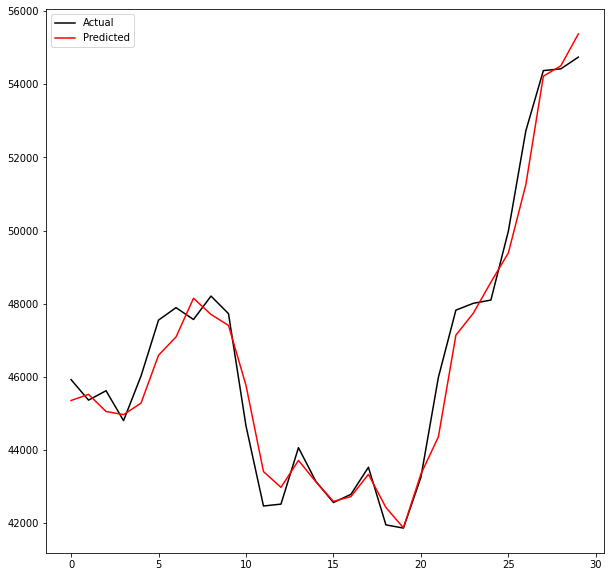

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_321.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'difficulty90wma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00401: early stopping
Training R-Squared: 0.9975578661819072

Testing R-Squared: 0.9967315799385698

30day Holdout R-Squared: 0.8657120488340576

30day Holdout MAE: 1216.65546875

30day Holdout MAPE: 2.5828952495257256

30day Holdout RMSE: 1351.0631349220848


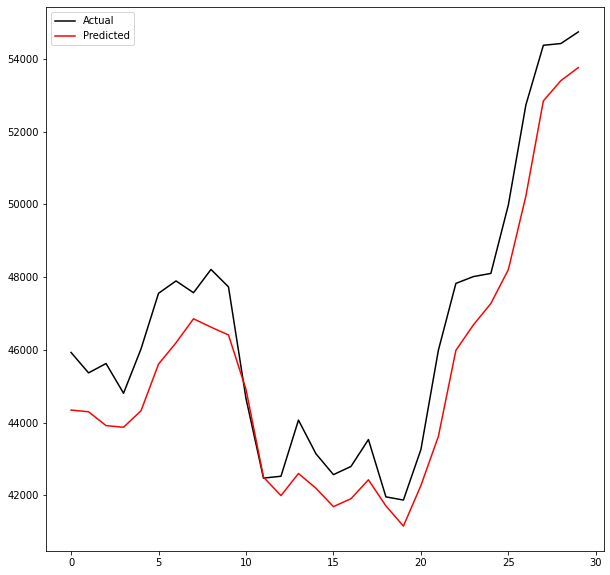

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_322.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'difficulty90sma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00253: early stopping
Training R-Squared: 0.9977075508882169

Testing R-Squared: 0.9973243790723059

30day Holdout R-Squared: 0.9263944362516442

30day Holdout MAE: 833.6928385416667

30day Holdout MAPE: 1.8334139911927043

30day Holdout RMSE: 1000.2589401960466


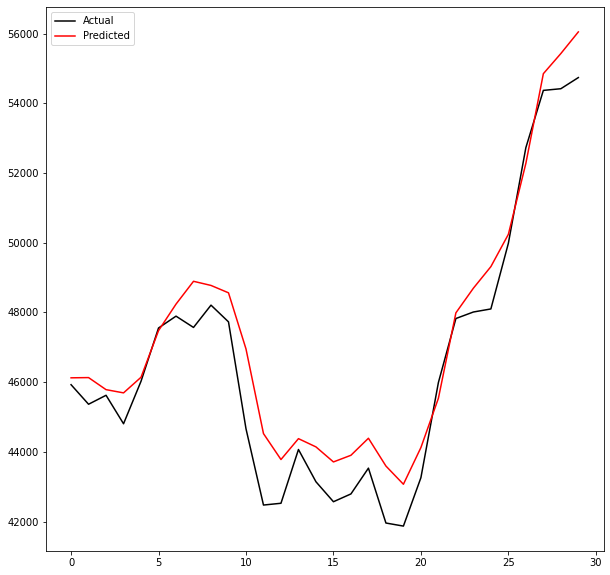

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_323.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'difficulty7sma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00272: early stopping
Training R-Squared: 0.9947358056810853

Testing R-Squared: 0.9945003310945042

30day Holdout R-Squared: 0.8300380580001722

30day Holdout MAE: 1371.8350260416667

30day Holdout MAPE: 3.008512476388814

30day Holdout RMSE: 1519.9628119455315


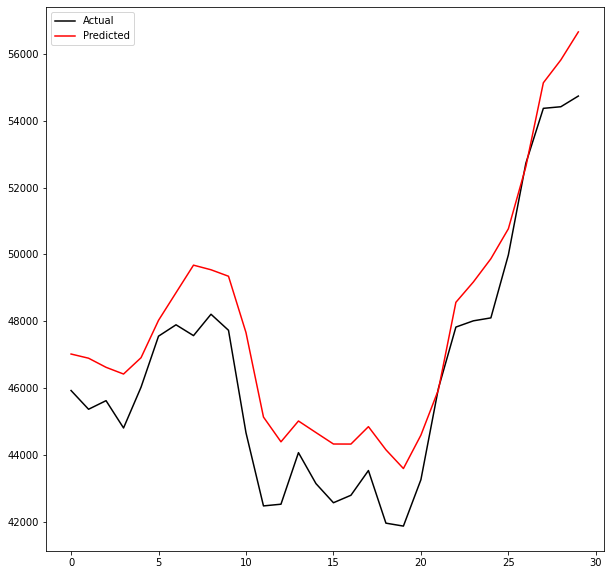

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_324.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'hashrate30wma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00253: early stopping
Training R-Squared: 0.9927637558754796

Testing R-Squared: 0.9916073377759725

30day Holdout R-Squared: 0.52329581987198

30day Holdout MAE: 2437.7350260416665

30day Holdout MAPE: 5.19813270870906

30day Holdout RMSE: 2545.5498138947573


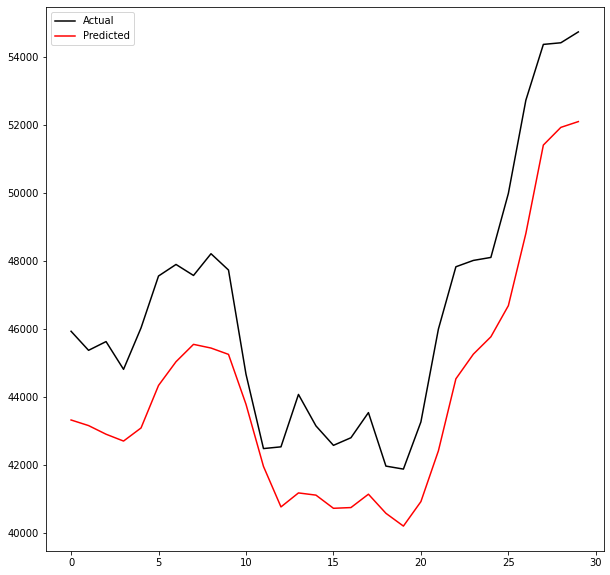

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_325.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'transactions90var']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00554: early stopping
Training R-Squared: 0.9956174073046642

Testing R-Squared: 0.9952355492968915

30day Holdout R-Squared: 0.8561516087538936

30day Holdout MAE: 1252.1065104166667

30day Holdout MAPE: 2.7031323707743815

30day Holdout RMSE: 1398.3298374695817


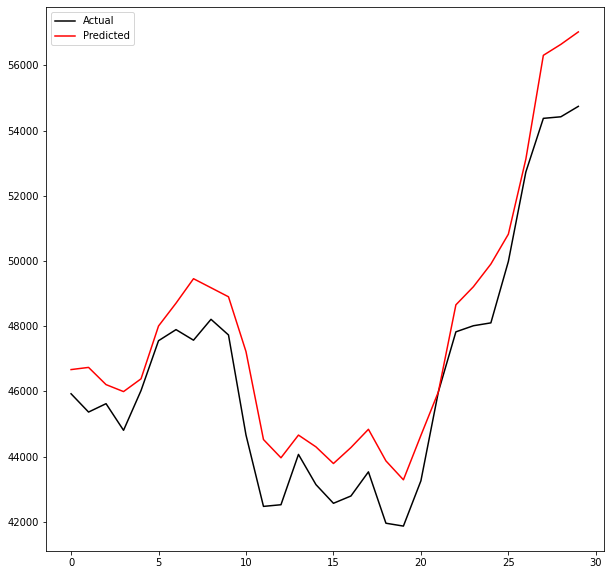

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_326.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'hashrate90wma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00278: early stopping
Training R-Squared: 0.9975993629607316

Testing R-Squared: 0.996876966997644

30day Holdout R-Squared: 0.9279365129464551

30day Holdout MAE: 819.04609375

30day Holdout MAPE: 1.7261424065583713

30day Holdout RMSE: 989.7254926994915


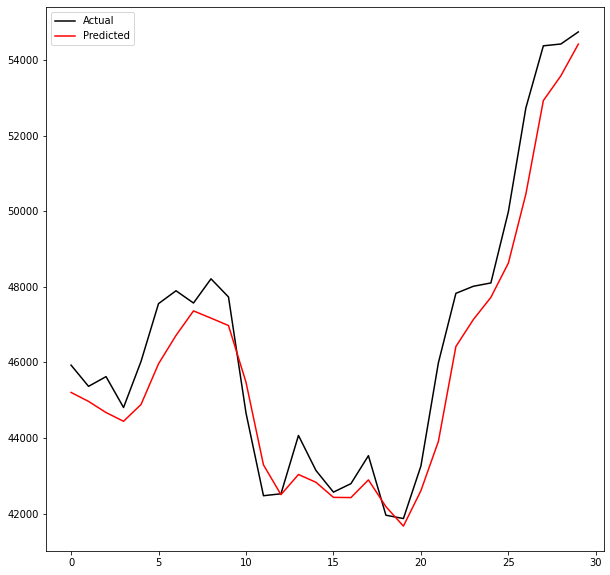

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_327.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'hashrate90sma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00211: early stopping
Training R-Squared: 0.9899269629043289

Testing R-Squared: 0.9904647919093055

30day Holdout R-Squared: 0.14445361109661958

30day Holdout MAE: 3349.366015625

30day Holdout MAPE: 7.258152984144396

30day Holdout RMSE: 3410.1925505020586


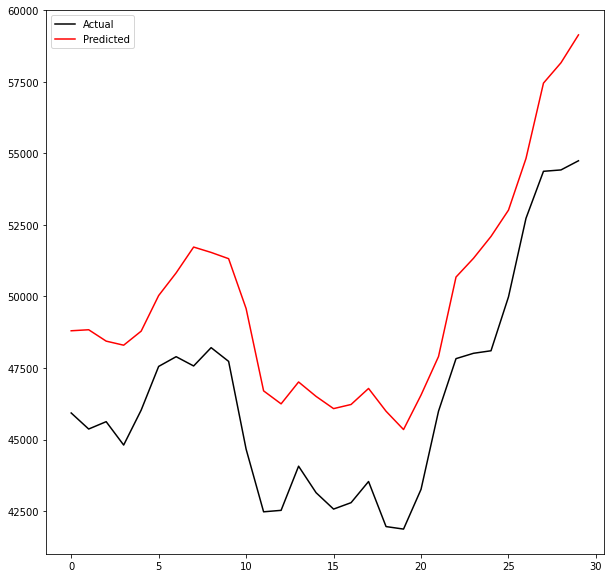

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_328.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'difficulty30wma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00339: early stopping
Training R-Squared: 0.9973480914154752

Testing R-Squared: 0.9964133273867607

30day Holdout R-Squared: 0.9429198138241597

30day Holdout MAE: 722.0901041666667

30day Holdout MAPE: 1.5582738216959982

30day Holdout RMSE: 880.8456431307937


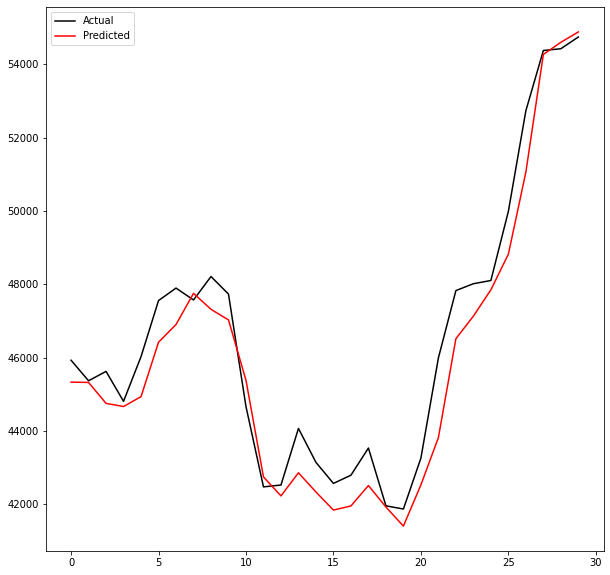

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_329.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'transactionvalue30varUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00355: early stopping
Training R-Squared: 0.9967439674031843

Testing R-Squared: 0.9964685508513714

30day Holdout R-Squared: -29.63679669960362

30day Holdout MAE: 18996.400651041666

30day Holdout MAPE: 41.73605316533842

30day Holdout RMSE: 20406.982752078326


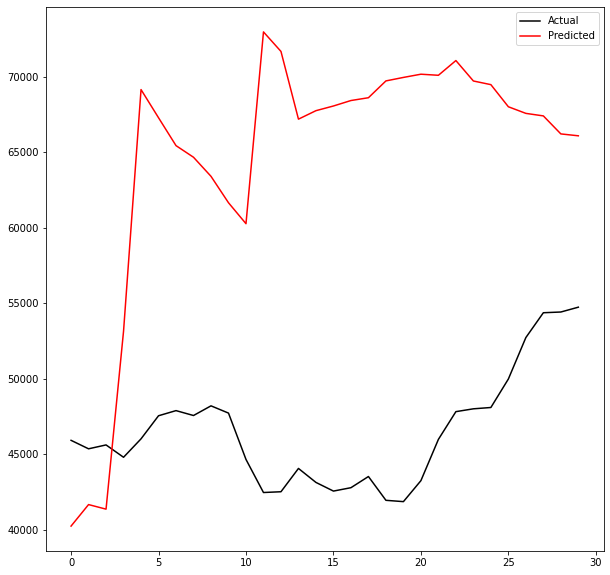

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_330.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'hashrate90ema']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00291: early stopping
Training R-Squared: 0.9978353651980855

Testing R-Squared: 0.9972656830212735

30day Holdout R-Squared: 0.9665246584579301

30day Holdout MAE: 540.212890625

30day Holdout MAPE: 1.1775361489668432

30day Holdout RMSE: 674.5585144560482


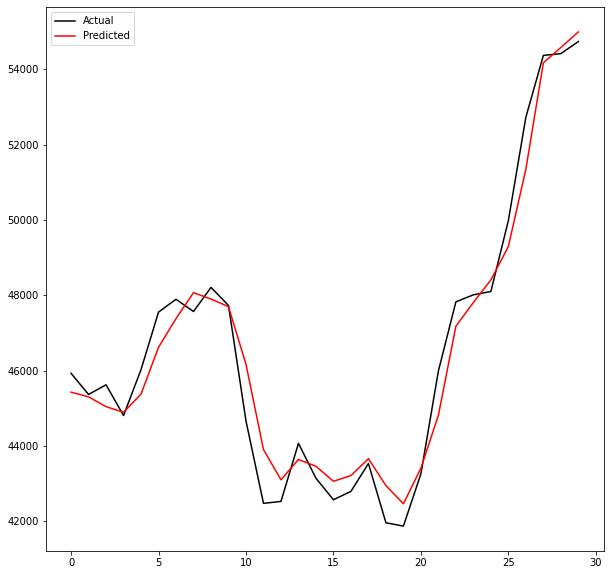

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_331.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'transactionvalue30trxUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00180: early stopping
Training R-Squared: 0.9955271009799143

Testing R-Squared: 0.9929398705016131

30day Holdout R-Squared: 0.9500842644444158

30day Holdout MAE: 672.5563802083333

30day Holdout MAPE: 1.4245029186618974

30day Holdout RMSE: 823.7128815256591


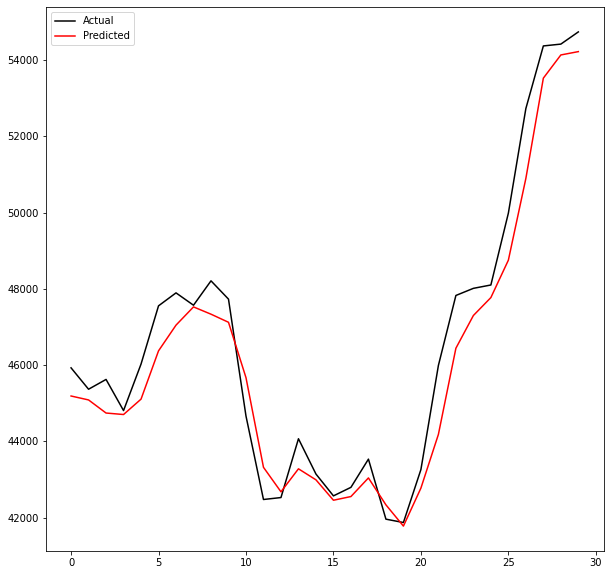

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_332.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'difficulty14wma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00281: early stopping
Training R-Squared: 0.9972719416366063

Testing R-Squared: 0.99645034177173

30day Holdout R-Squared: 0.953689633292937

30day Holdout MAE: 621.5720052083333

30day Holdout MAPE: 1.3280255989743297

30day Holdout RMSE: 793.4073694756644


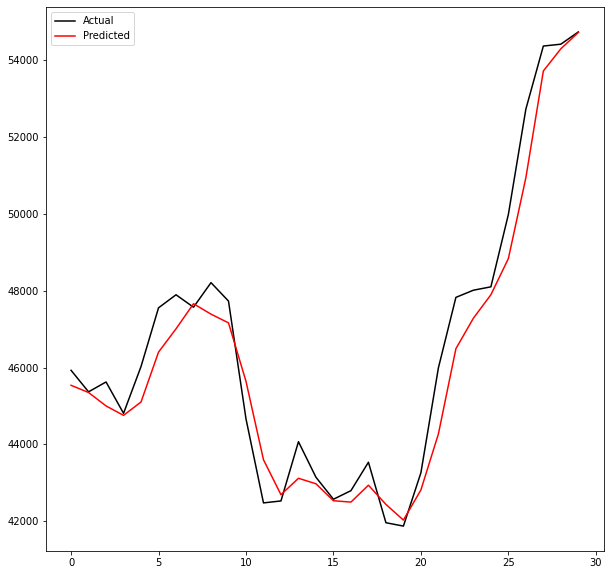

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_333.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'transactionvalue30stdUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00253: early stopping
Training R-Squared: 0.9971338427289904

Testing R-Squared: 0.995448746035692

30day Holdout R-Squared: 0.852304607261837

30day Holdout MAE: 1198.1013020833334

30day Holdout MAPE: 2.6648841034921733

30day Holdout RMSE: 1416.904547240571


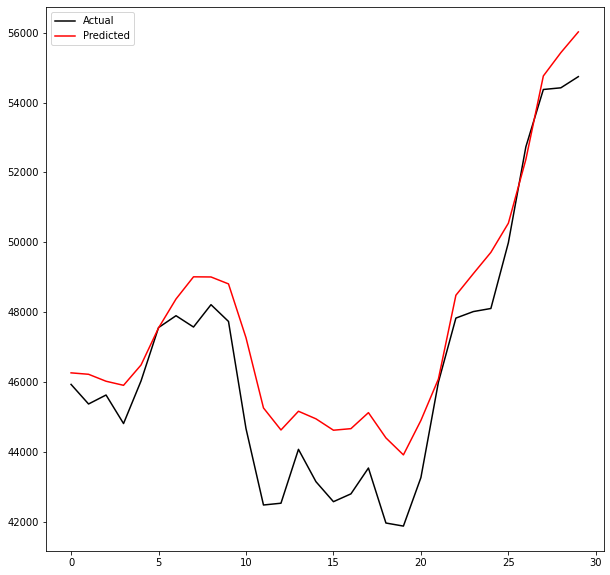

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_334.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'activeaddresses90trx']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00284: early stopping
Training R-Squared: 0.9968147452411134

Testing R-Squared: 0.9959183250427235

30day Holdout R-Squared: 0.8097875931578209

30day Holdout MAE: 1427.4967447916667

30day Holdout MAPE: 3.008168433306613

30day Holdout RMSE: 1607.9648117531315


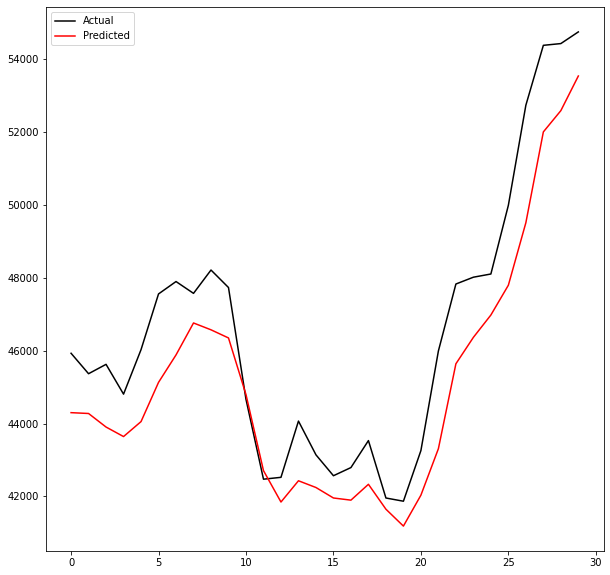

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_335.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'mediantransactionvalue14trxUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.36031726194235114

Testing R-Squared: -0.3691120377549306

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


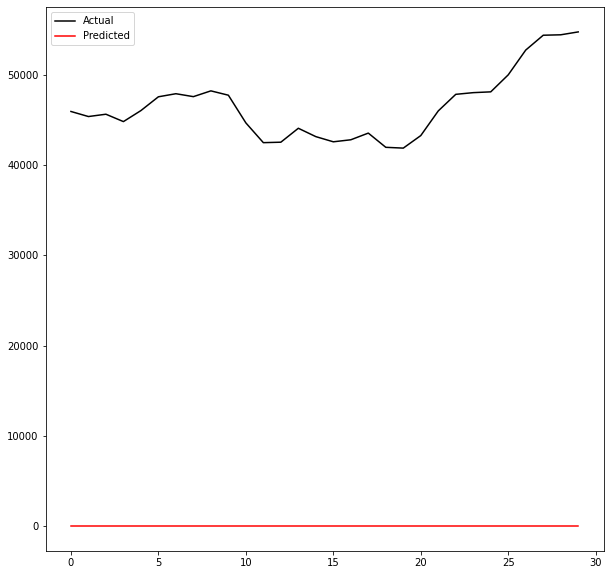

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_336.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'hashrate14wma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00346: early stopping
Training R-Squared: 0.9975363124765856

Testing R-Squared: 0.9973042026376281

30day Holdout R-Squared: 0.9568122043781228

30day Holdout MAE: 617.0938802083333

30day Holdout MAPE: 1.356533652491563

30day Holdout RMSE: 766.1920453851493


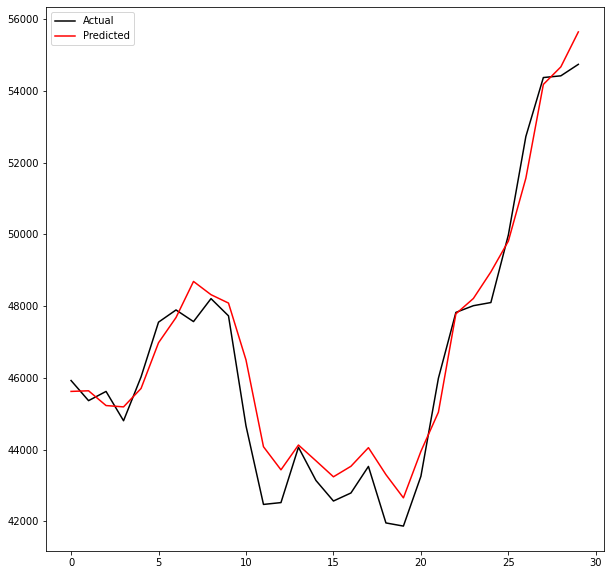

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_337.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'transactions90std']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.36031726194235114

Testing R-Squared: -0.3691120377549306

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


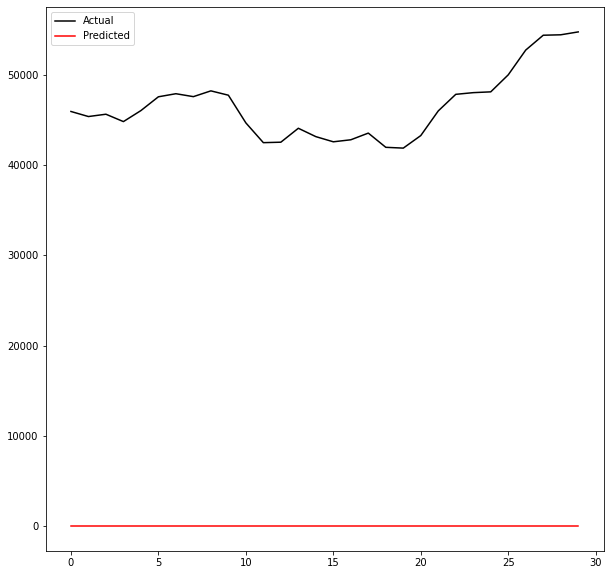

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_338.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'mediantransactionvalue30wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00360: early stopping
Training R-Squared: 0.9973288413760973

Testing R-Squared: 0.9964324953421911

30day Holdout R-Squared: 0.9616491292670775

30day Holdout MAE: 580.0212239583333

30day Holdout MAPE: 1.257728465936317

30day Holdout RMSE: 722.0125299505958


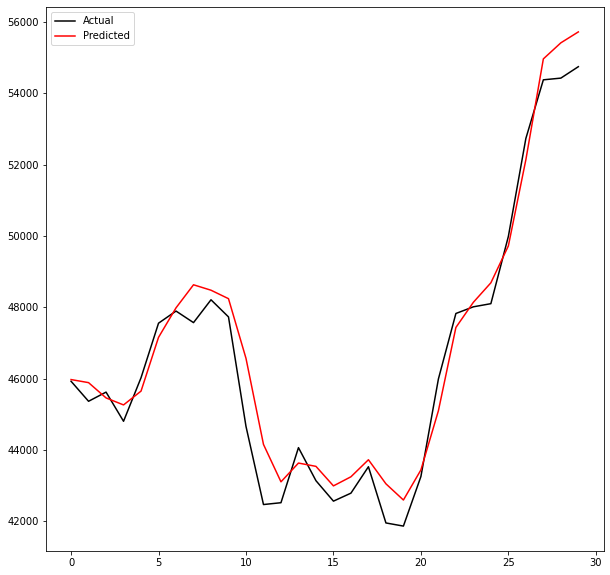

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_339.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'price3rsiUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00267: early stopping
Training R-Squared: 0.9967752340684837

Testing R-Squared: 0.9969364538830818

30day Holdout R-Squared: 0.8656762420949268

30day Holdout MAE: 1165.497265625

30day Holdout MAPE: 2.470447749508203

30day Holdout RMSE: 1351.2432476588997


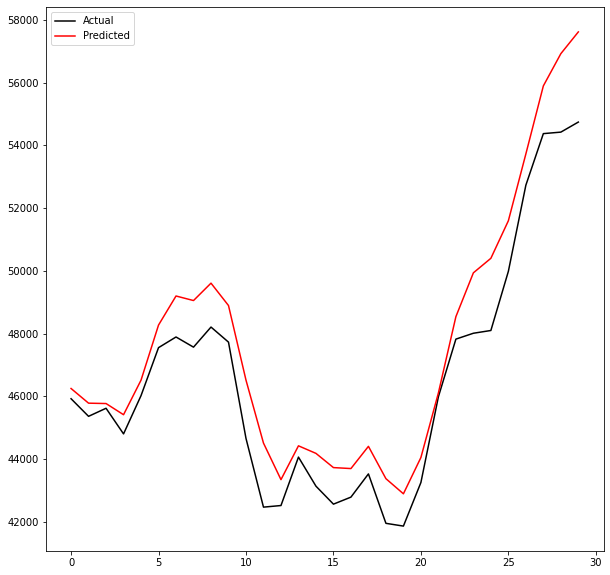

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_340.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00283: early stopping
Training R-Squared: 0.9976043124460418

Testing R-Squared: 0.9968982434736472

30day Holdout R-Squared: 0.9711430482631839

30day Holdout MAE: 482.51471354166665

30day Holdout MAPE: 1.0353745878642933

30day Holdout RMSE: 626.2999061529584


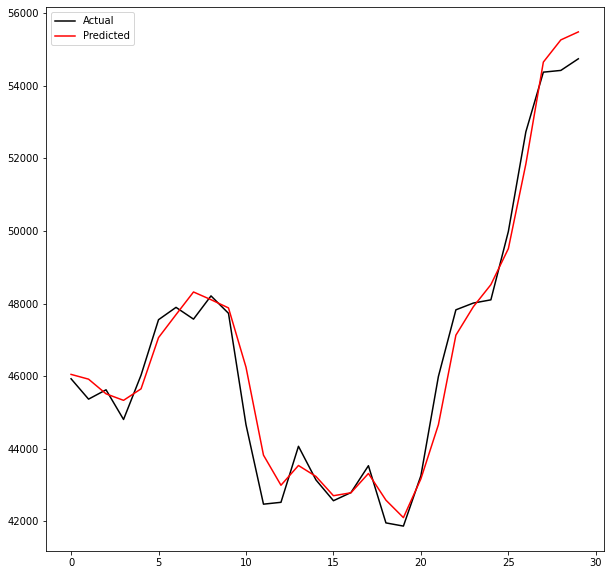

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_341.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'fee_to_reward90trxUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00271: early stopping
Training R-Squared: 0.9955500479698803

Testing R-Squared: 0.9936968707274758

30day Holdout R-Squared: 0.6806413245828613

30day Holdout MAE: 1989.4213541666666

30day Holdout MAPE: 4.252016965902131

30day Holdout RMSE: 2083.5142697382616


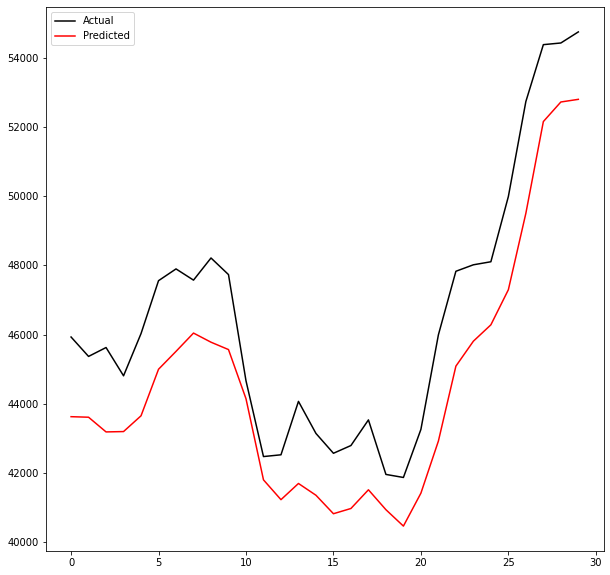

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_342.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'transactionvalue14wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00321: early stopping
Training R-Squared: 0.9976744302097613

Testing R-Squared: 0.9973392202671849

30day Holdout R-Squared: 0.9595226842655048

30day Holdout MAE: 529.4971354166667

30day Holdout MAPE: 1.1265500437595972

30day Holdout RMSE: 741.759252485925


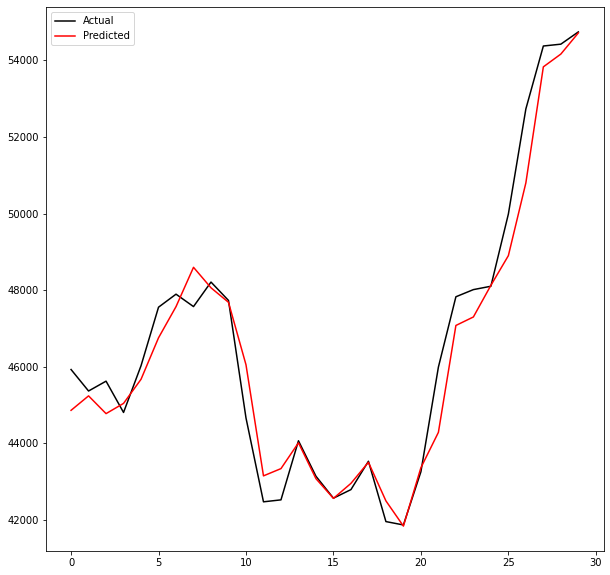

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_343.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'transactionvalue90stdUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00237: early stopping
Training R-Squared: 0.9962536512982341

Testing R-Squared: 0.9952941667657345

30day Holdout R-Squared: 0.9480484203056058

30day Holdout MAE: 642.0384114583334

30day Holdout MAPE: 1.3578927758937536

30day Holdout RMSE: 840.3428300163812


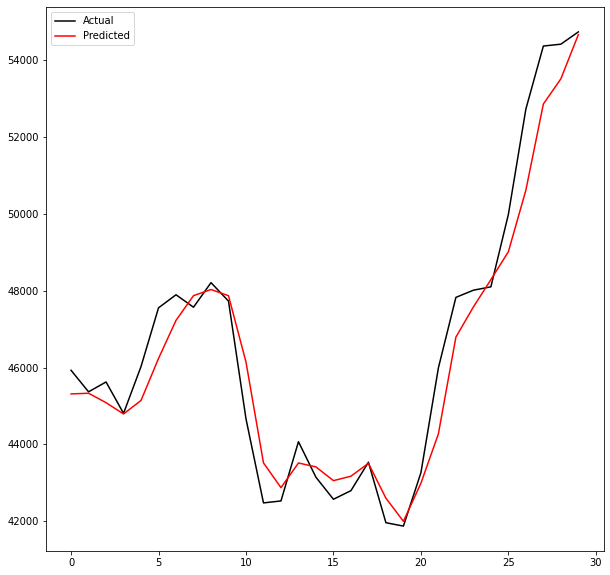

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_344.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'activeaddresses30sma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00238: early stopping
Training R-Squared: 0.9950117524319436

Testing R-Squared: 0.9949569956997246

30day Holdout R-Squared: 0.49519205019763

30day Holdout MAE: 2539.2493489583335

30day Holdout MAPE: 5.4985276878201015

30day Holdout RMSE: 2619.5109179147944


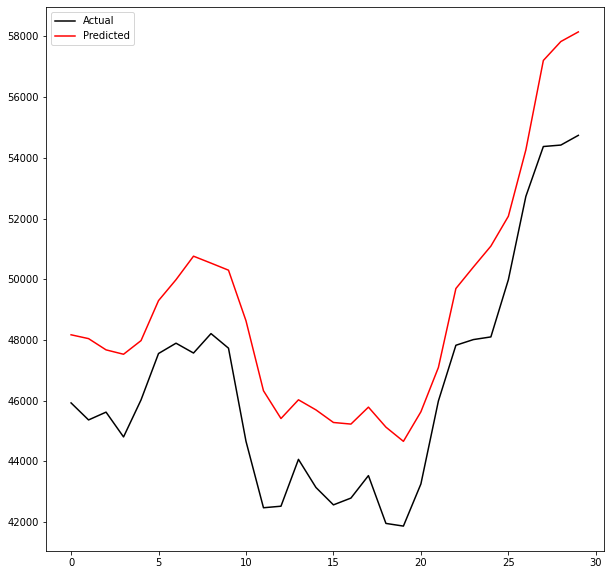

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_345.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'sentinusd90emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00282: early stopping
Training R-Squared: 0.9960380396506971

Testing R-Squared: 0.9934466316035683

30day Holdout R-Squared: 0.9188486174849366

30day Holdout MAE: 902.8911458333333

30day Holdout MAPE: 1.9100709356496655

30day Holdout RMSE: 1050.2799663116011


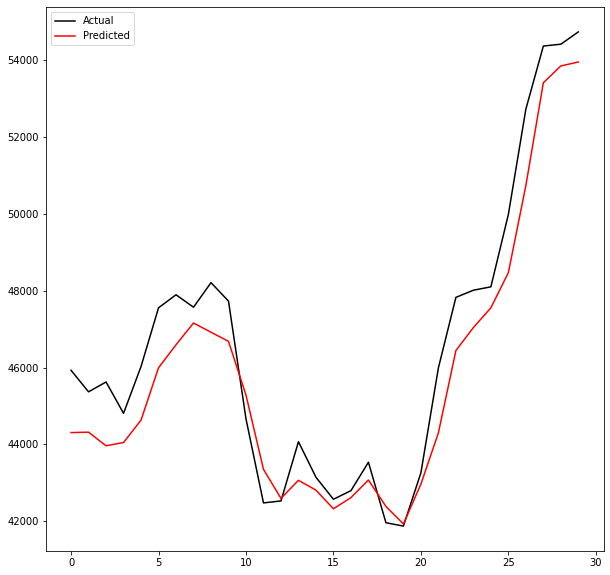

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_346.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'sentinusd30smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00225: early stopping
Training R-Squared: 0.9977908603953435

Testing R-Squared: 0.9963914343939526

30day Holdout R-Squared: 0.8459579889145233

30day Holdout MAE: 1308.6740885416666

30day Holdout MAPE: 2.7876318739904806

30day Holdout RMSE: 1447.0272510557475


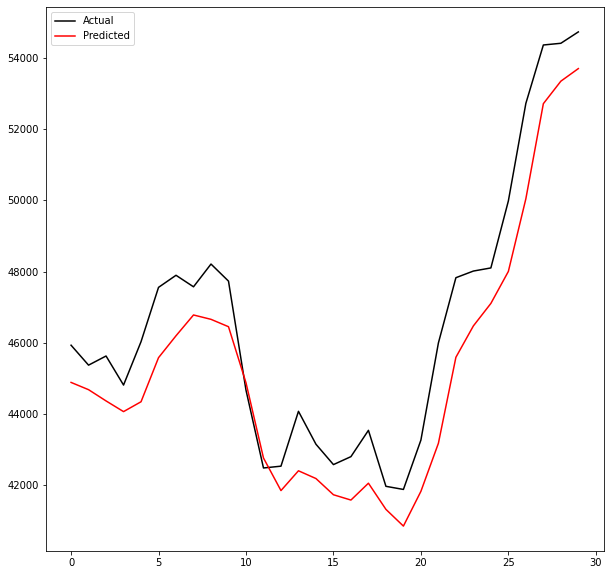

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_347.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'difficulty90ema']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00302: early stopping
Training R-Squared: 0.9962494801034558

Testing R-Squared: 0.9952984275254272

30day Holdout R-Squared: 0.5501546558372779

30day Holdout MAE: 2373.561588541667

30day Holdout MAPE: 5.068350645419328

30day Holdout RMSE: 2472.7985366616413


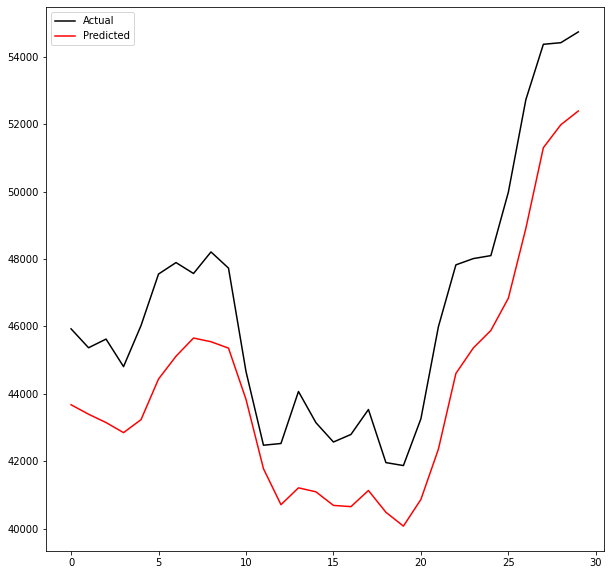

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_348.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'top100cap30std']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00169: early stopping
Training R-Squared: 0.9977059816984275

Testing R-Squared: 0.9972366174163765

30day Holdout R-Squared: 0.9642671508904412

30day Holdout MAE: 525.384375

30day Holdout MAPE: 1.1255640276083116

30day Holdout RMSE: 696.9328616943768


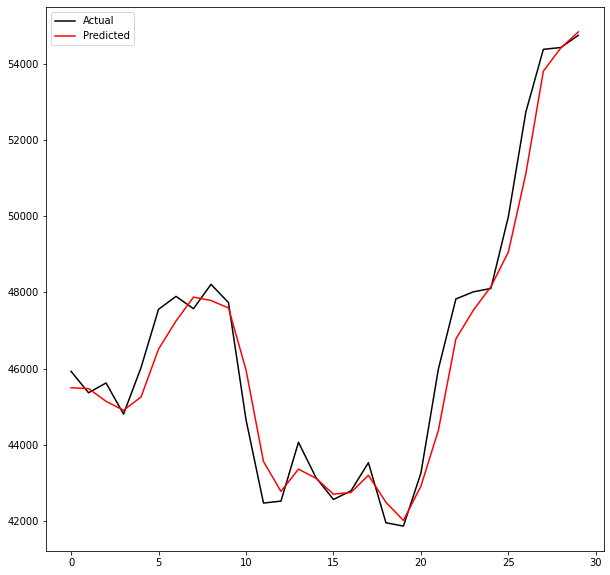

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_349.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'price7rsiUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00377: early stopping
Training R-Squared: 0.9971764428485989

Testing R-Squared: 0.9943843379018026

30day Holdout R-Squared: 0.7383254716732468

30day Holdout MAE: 1753.0208333333333

30day Holdout MAPE: 3.8043180369518232

30day Holdout RMSE: 1885.983309794443


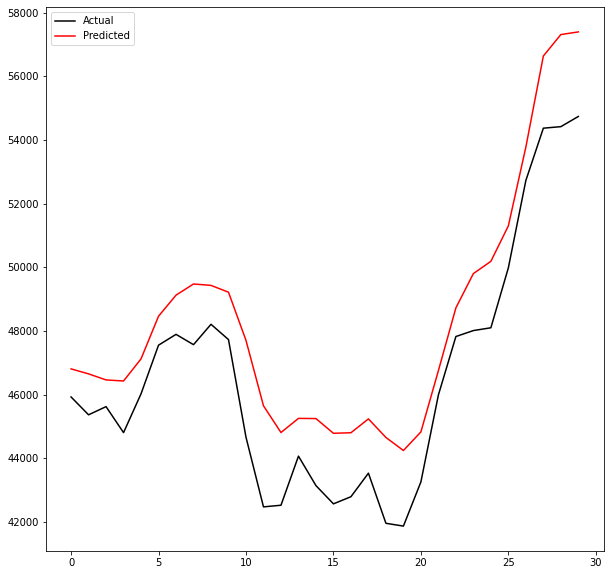

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_350.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'price90stdUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00177: early stopping
Training R-Squared: 0.9940436592964805

Testing R-Squared: 0.9948826704432783

30day Holdout R-Squared: 0.8443991114895771

30day Holdout MAE: 1305.1430989583334

30day Holdout MAPE: 2.825572730860806

30day Holdout RMSE: 1454.3306479612347


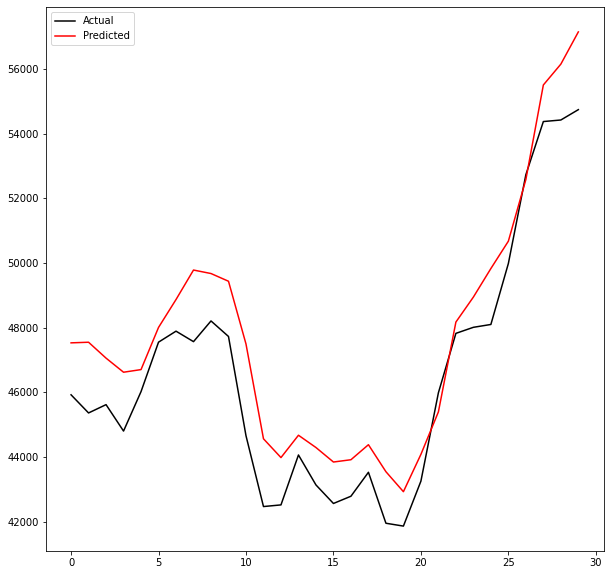

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_351.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'top100cap3std']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00340: early stopping
Training R-Squared: 0.9952325441312232

Testing R-Squared: 0.9937953266722089

30day Holdout R-Squared: 0.7754766771789007

30day Holdout MAE: 1609.0536458333333

30day Holdout MAPE: 3.490441552219129

30day Holdout RMSE: 1746.9796680046832


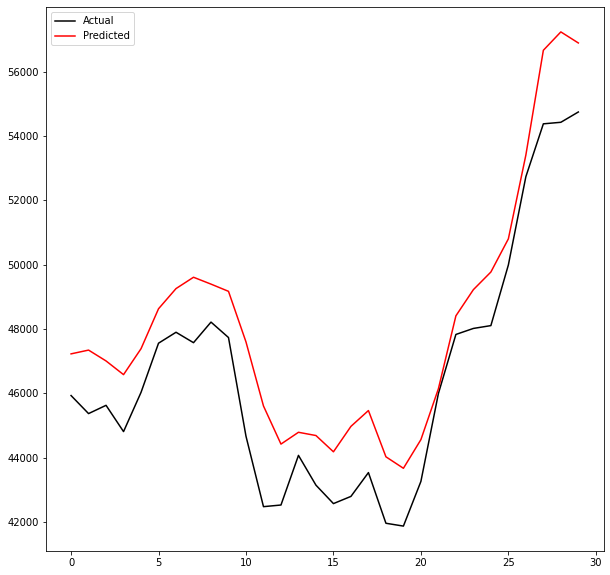

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_352.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'transactionvalue7smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00499: early stopping
Training R-Squared: 0.9957761843454539

Testing R-Squared: 0.9947732726571721

30day Holdout R-Squared: 0.8557391547034017

30day Holdout MAE: 1157.6044270833333

30day Holdout MAPE: 2.4261952301535104

30day Holdout RMSE: 1400.3331062164764


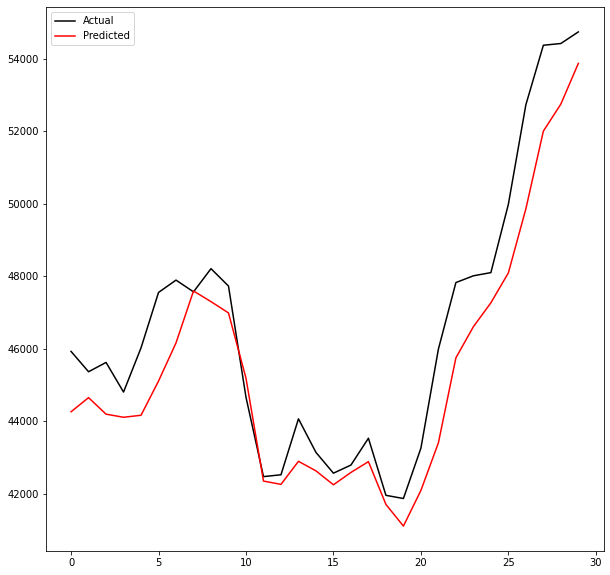

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_353.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'top100cap14roc']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00369: early stopping
Training R-Squared: 0.9961479171991414

Testing R-Squared: 0.9959693344677838

30day Holdout R-Squared: 0.7345618798715055

30day Holdout MAE: 1768.5018229166667

30day Holdout MAPE: 3.843496884265596

30day Holdout RMSE: 1899.4976760572902


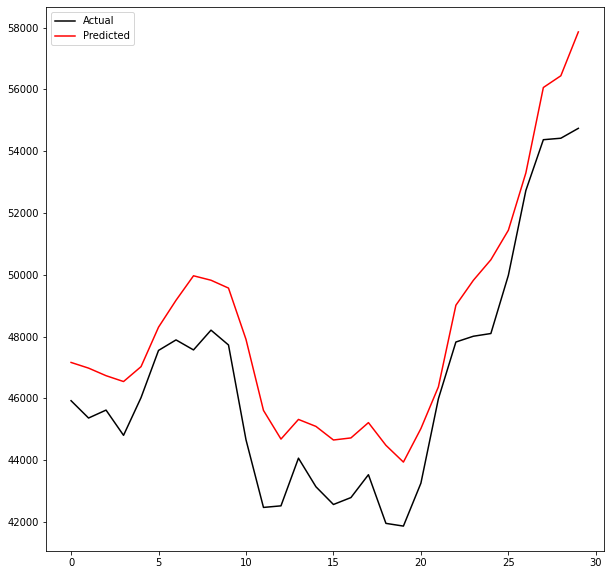

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_354.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'mediantransactionvalue90wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00170: early stopping
Training R-Squared: 0.9956418337194508

Testing R-Squared: 0.9965065486291914

30day Holdout R-Squared: 0.780835190202507

30day Holdout MAE: 1598.666796875

30day Holdout MAPE: 3.478334843604155

30day Holdout RMSE: 1726.0069158261551


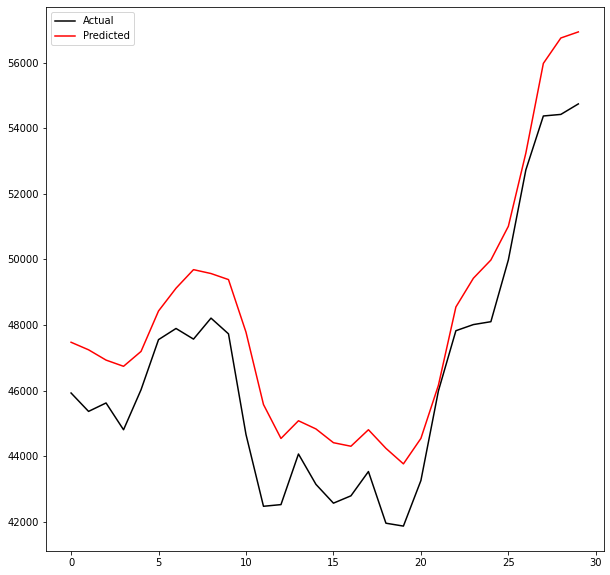

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_355.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'fee_to_reward90wmaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00242: early stopping
Training R-Squared: 0.9958674146365972

Testing R-Squared: 0.9953044896463784

30day Holdout R-Squared: 0.8891380689000485

30day Holdout MAE: 1080.429296875

30day Holdout MAPE: 2.296744183441422

30day Holdout RMSE: 1227.575860495547


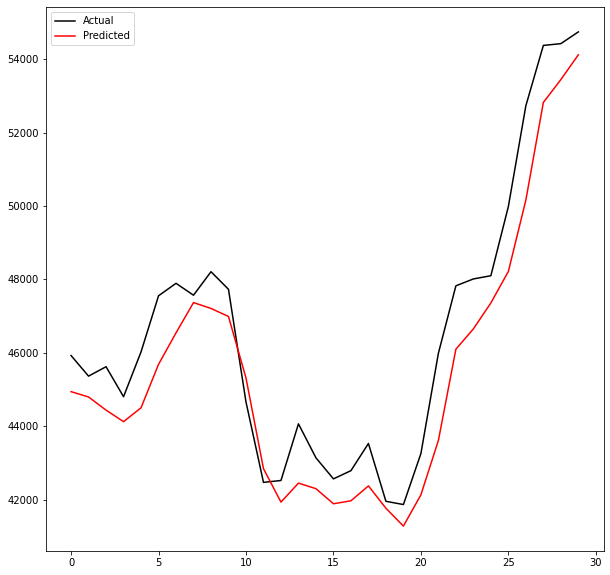

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_356.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'mediantransactionvalue30smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00290: early stopping
Training R-Squared: 0.9938788034627537

Testing R-Squared: 0.993315940867864

30day Holdout R-Squared: 0.9543063849203793

30day Holdout MAE: 639.2184895833333

30day Holdout MAPE: 1.3899797192842367

30day Holdout RMSE: 788.1064457620458


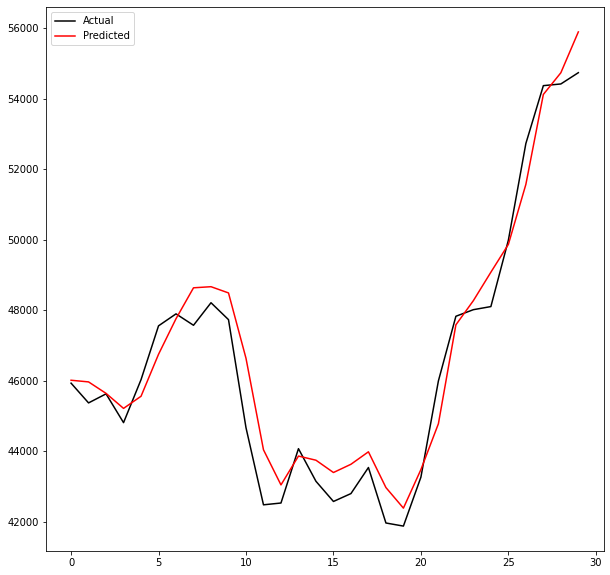

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_357.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'mediantransactionvalue30emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00250: early stopping
Training R-Squared: 0.9976823148050425

Testing R-Squared: 0.9973056016544154

30day Holdout R-Squared: 0.9451156376744457

30day Holdout MAE: 696.648046875

30day Holdout MAPE: 1.4975093730210427

30day Holdout RMSE: 863.7368160656731


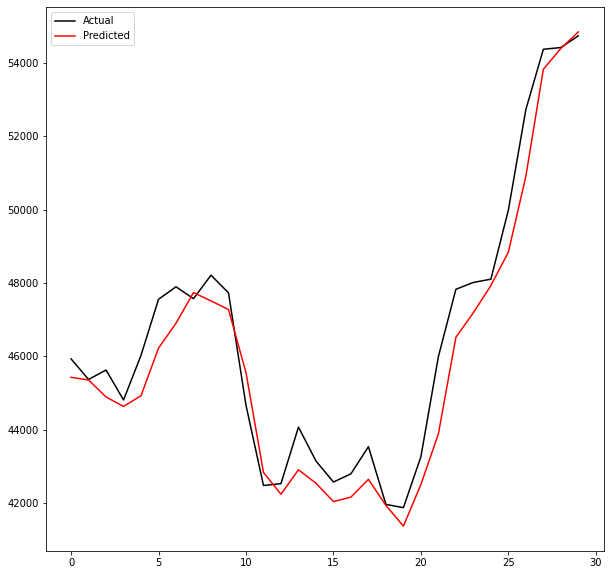

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_358.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'transactions30std']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00135: early stopping
Training R-Squared: 0.9954558721408822

Testing R-Squared: 0.9948074596453085

30day Holdout R-Squared: 0.9448633686728259

30day Holdout MAE: 703.485546875

30day Holdout MAPE: 1.515318984694219

30day Holdout RMSE: 865.7195686043713


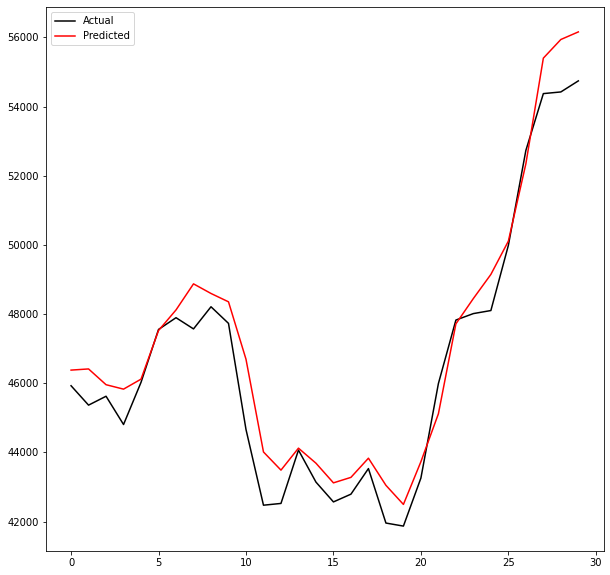

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_359.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'sentinusd14rocUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.36031726194235114

Testing R-Squared: -0.3691120377549306

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


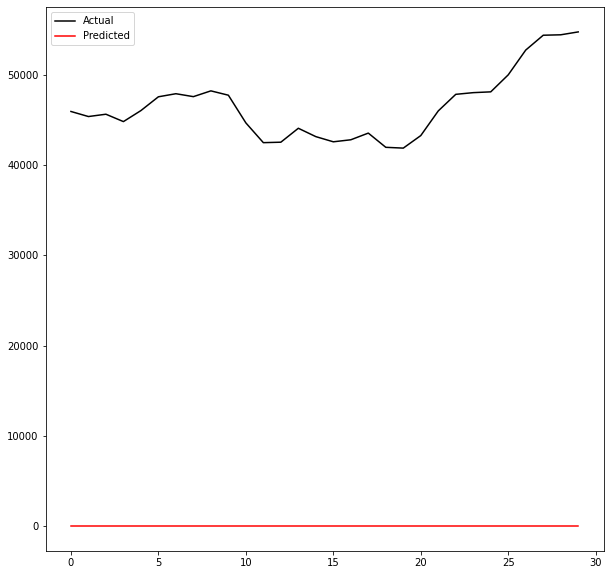

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_360.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'top100cap90ema']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00223: early stopping
Training R-Squared: 0.9950298902790151

Testing R-Squared: 0.9956053418635552

30day Holdout R-Squared: 0.6226722598842498

30day Holdout MAE: 2162.9484375

30day Holdout MAPE: 4.694637090342399

30day Holdout RMSE: 2264.730283064475


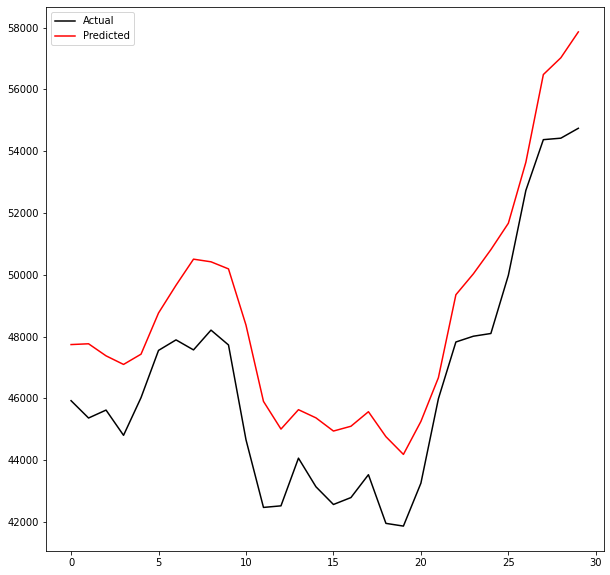

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_361.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'top100cap7roc']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00368: early stopping
Training R-Squared: 0.9968164584504355

Testing R-Squared: 0.9959457272225981

30day Holdout R-Squared: 0.6822414908188926

30day Holdout MAE: 1970.7565104166667

30day Holdout MAPE: 4.2143711016358765

30day Holdout RMSE: 2078.2879267522026


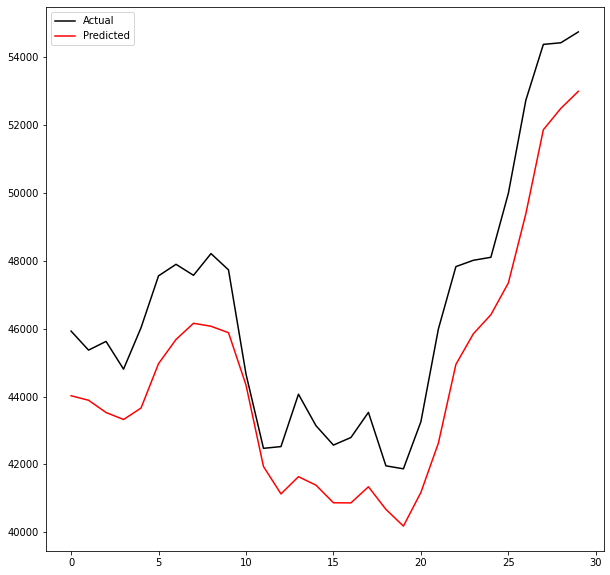

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_362.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'sentinusd30emaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00156: early stopping
Training R-Squared: 0.9958797258160956

Testing R-Squared: 0.9929185298746654

30day Holdout R-Squared: 0.9571532273173383

30day Holdout MAE: 609.5209635416667

30day Holdout MAPE: 1.3033145277640021

30day Holdout RMSE: 763.1610164909978


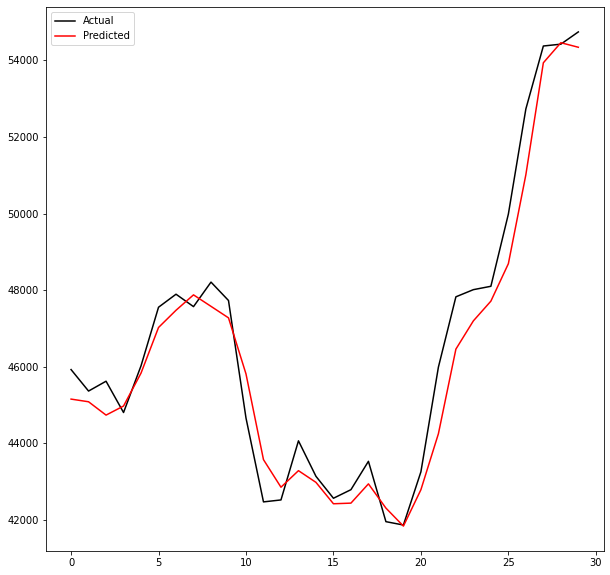

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_363.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'transactionvalue90varUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00282: early stopping
Training R-Squared: 0.9965119759370681

Testing R-Squared: 0.9943875637516207

30day Holdout R-Squared: -17.964034013589114

30day Holdout MAE: 15565.437760416668

30day Holdout MAPE: 33.92178555467899

30day Holdout RMSE: 16055.450016667219


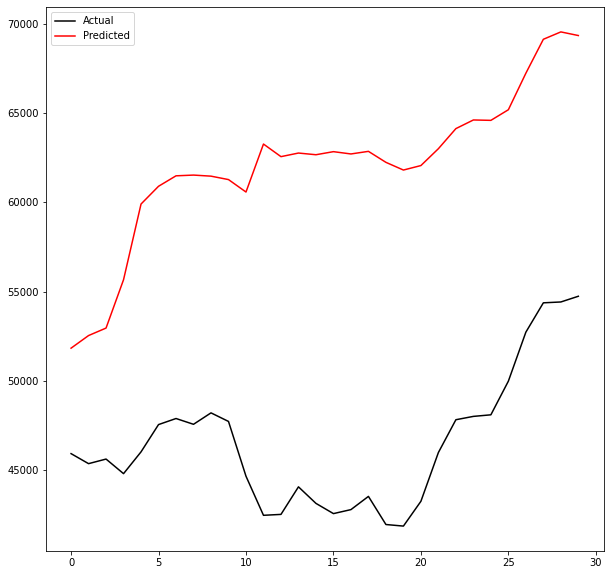

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_364.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'difficulty90mom']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00464: early stopping
Training R-Squared: 0.9972211226245177

Testing R-Squared: 0.9944849871160192

30day Holdout R-Squared: 0.9562263560893812

30day Holdout MAE: 637.7889322916667

30day Holdout MAPE: 1.3454670498078776

30day Holdout RMSE: 771.3712896242665


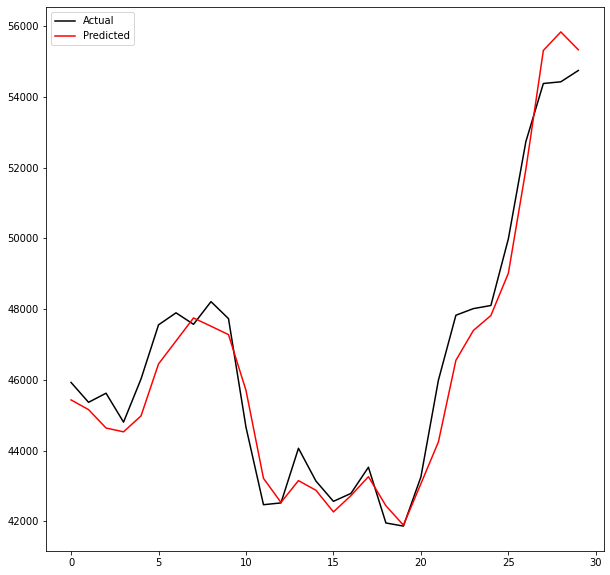

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_365.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'price90varUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00324: early stopping
Training R-Squared: 0.99689164587242

Testing R-Squared: 0.9968970162467213

30day Holdout R-Squared: 0.9653722012184927

30day Holdout MAE: 559.6725260416666

30day Holdout MAPE: 1.1976661809205984

30day Holdout RMSE: 686.0717905888099


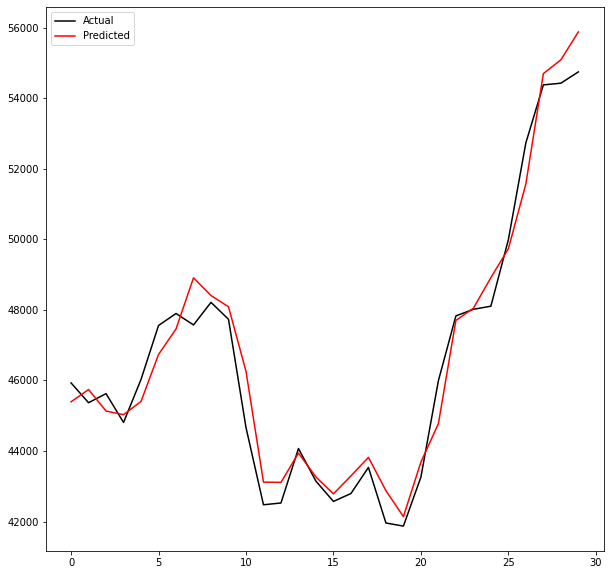

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_366.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'sentinusd14momUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00285: early stopping
Training R-Squared: 0.9941793961863199

Testing R-Squared: 0.9935301269244631

30day Holdout R-Squared: -0.8831836341188806

30day Holdout MAE: 3527.7194661458334

30day Holdout MAPE: 7.714223865172086

30day Holdout RMSE: 5059.451716658342


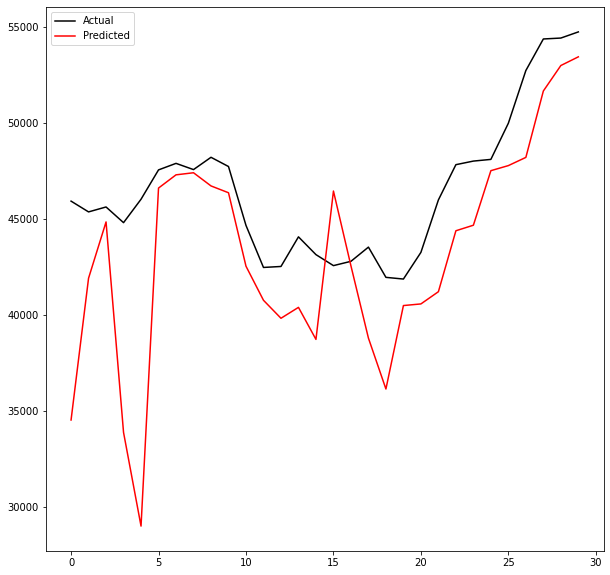

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_367.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'hashrate7trx']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00280: early stopping
Training R-Squared: 0.9976367782467215

Testing R-Squared: 0.9970117323797639

30day Holdout R-Squared: 0.9401459945855563

30day Holdout MAE: 730.831640625

30day Holdout MAPE: 1.5969385881294866

30day Holdout RMSE: 901.9941676374891


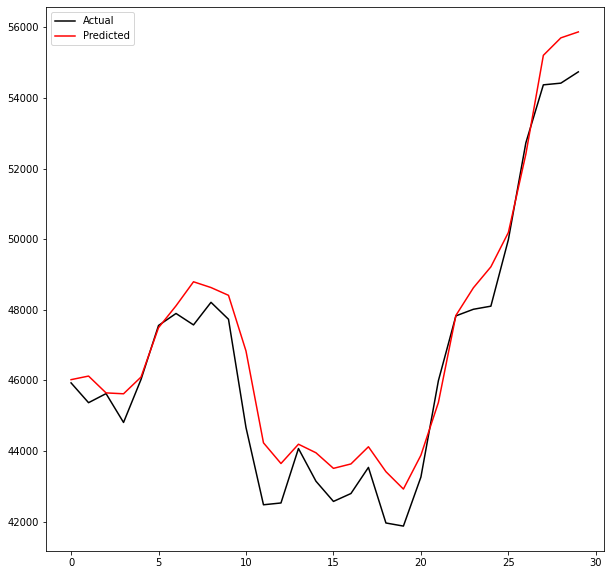

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_368.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'sentinusd7smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00249: early stopping
Training R-Squared: 0.9976501384350204

Testing R-Squared: 0.9968723443068973

30day Holdout R-Squared: 0.39390247623528485

30day Holdout MAE: 2621.578645833333

30day Holdout MAPE: 5.66936616157769

30day Holdout RMSE: 2870.307163767282


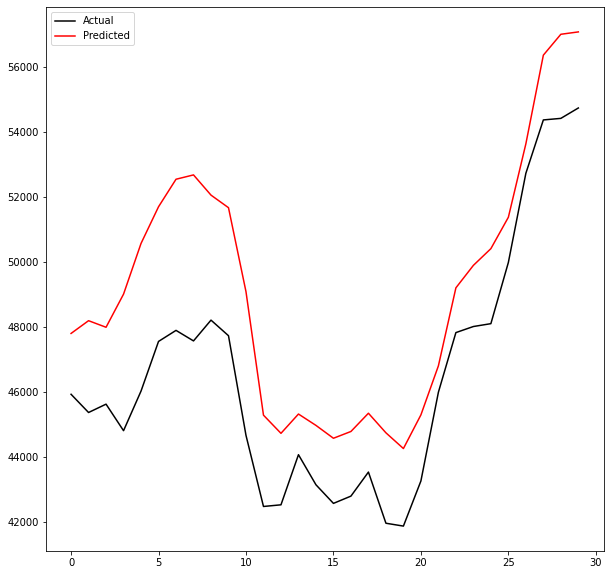

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_369.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'fee_to_reward90stdUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00101: early stopping
Training R-Squared: -0.36031726194235114

Testing R-Squared: -0.3691120377549306

30day Holdout R-Squared: -159.24484000557823

30day Holdout MAE: 46525.36666666667

30day Holdout MAPE: 100.0

30day Holdout RMSE: 46671.21928733667


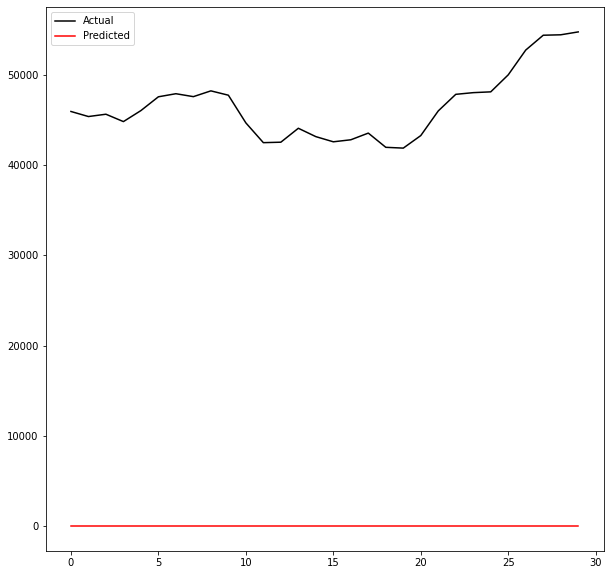

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_370.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'hashrate30var']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00288: early stopping
Training R-Squared: 0.9977612034210569

Testing R-Squared: 0.9973888480269012

30day Holdout R-Squared: 0.8584588515584516

30day Holdout MAE: 1229.5114583333334

30day Holdout MAPE: 2.6901216269642347

30day Holdout RMSE: 1387.0703156913123


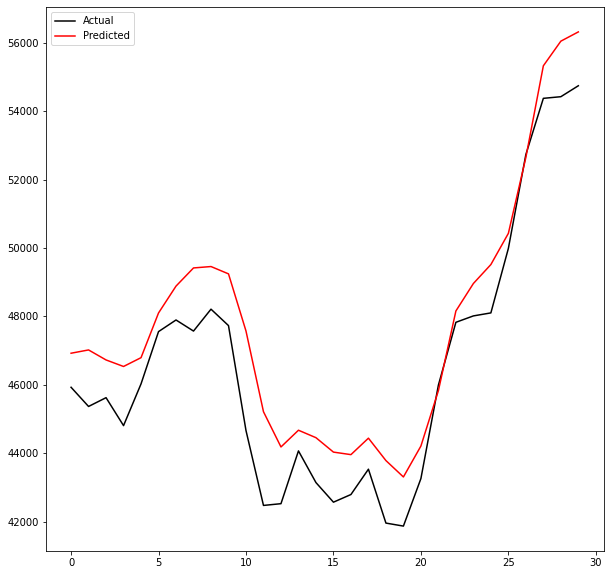

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_371.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'sentbyaddress90var']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00250: early stopping
Training R-Squared: 0.9968931737526806

Testing R-Squared: 0.9963885039368566

30day Holdout R-Squared: 0.912895846941076

30day Holdout MAE: 931.5915364583333

30day Holdout MAPE: 2.006511676506031

30day Holdout RMSE: 1088.1193946544715


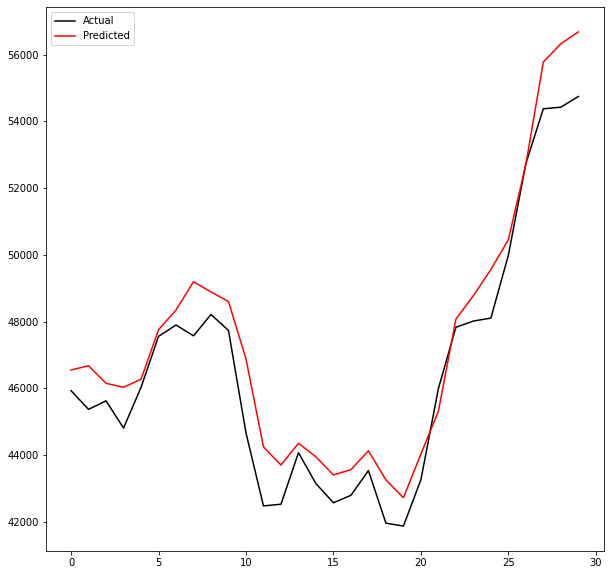

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_372.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'top100cap30var']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00281: early stopping
Training R-Squared: 0.9914489516703524

Testing R-Squared: 0.9903819342401254

30day Holdout R-Squared: 0.6570953351664504

30day Holdout MAE: 2051.928776041667

30day Holdout MAPE: 4.384788259541346

30day Holdout RMSE: 2158.956125727021


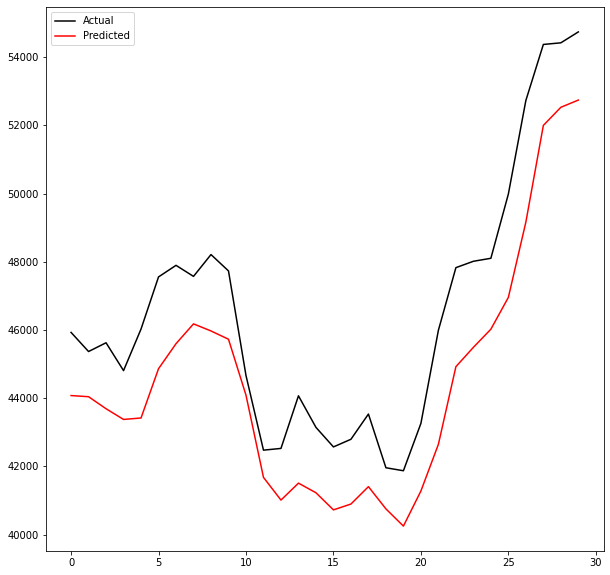

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_373.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'price3trxUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00379: early stopping
Training R-Squared: 0.996665512264358

Testing R-Squared: 0.9968475165331615

30day Holdout R-Squared: 0.9272627334668665

30day Holdout MAE: 832.9649739583333

30day Holdout MAPE: 1.837111731086905

30day Holdout RMSE: 994.3415975700618


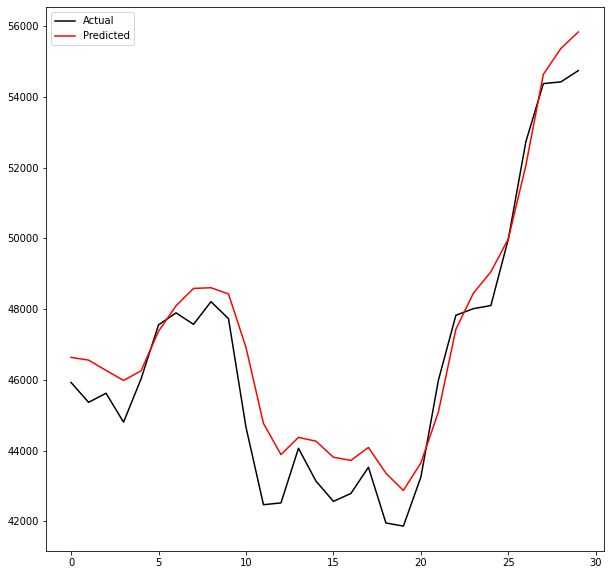

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_374.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'confirmationtime7std']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00306: early stopping
Training R-Squared: 0.9948449128652745

Testing R-Squared: 0.9952222863382216

30day Holdout R-Squared: 0.7659019550690948

30day Holdout MAE: 1652.7404947916666

30day Holdout MAPE: 3.547513445604196

30day Holdout RMSE: 1783.8404736359055


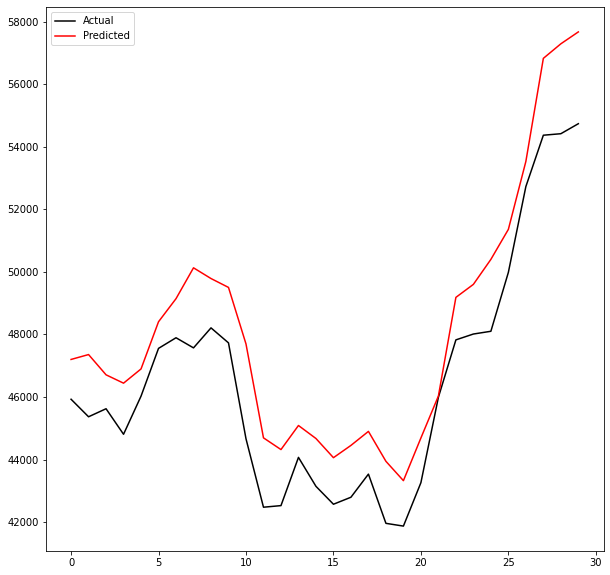

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_375.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'sentinusd90smaUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00315: early stopping
Training R-Squared: 0.9978970674617204

Testing R-Squared: 0.9974705497607218

30day Holdout R-Squared: 0.9611380675750574

30day Holdout MAE: 587.5756510416667

30day Holdout MAPE: 1.2797710118006753

30day Holdout RMSE: 726.8073594577469


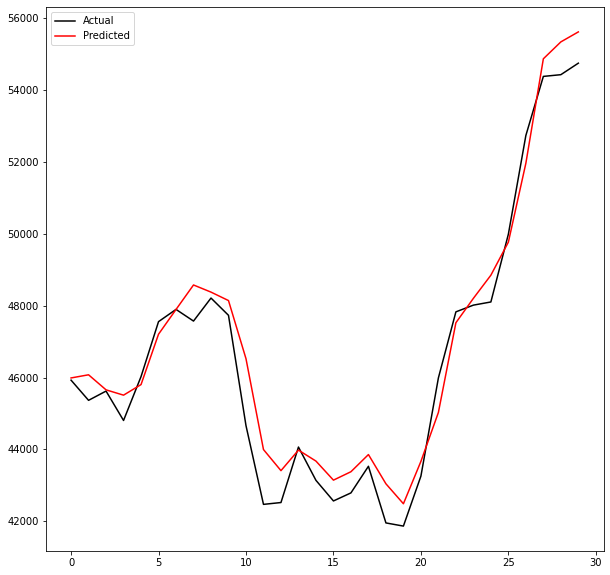

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_376.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'transactionvalue7varUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00360: early stopping
Training R-Squared: 0.996275515320356

Testing R-Squared: 0.9959994410573925

30day Holdout R-Squared: -19.226223077212776

30day Holdout MAE: 14176.056380208332

30day Holdout MAPE: 31.458230144773076

30day Holdout RMSE: 16581.144973805698


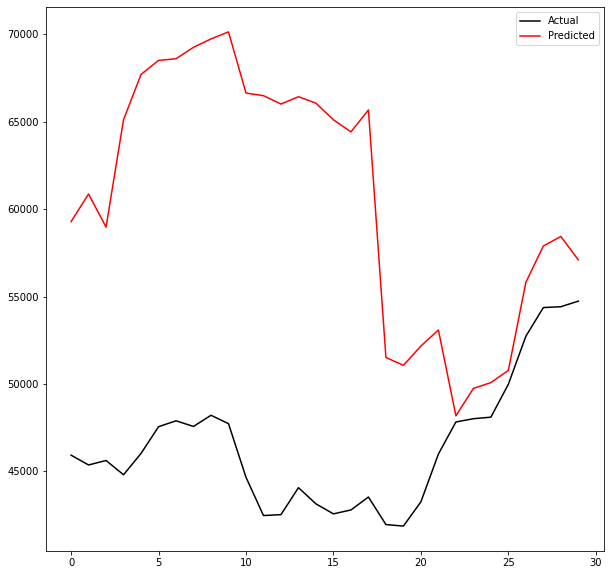

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_377.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'price30momUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00488: early stopping
Training R-Squared: 0.9976594797731486

Testing R-Squared: 0.9954583207692671

30day Holdout R-Squared: 0.794924559571152

30day Holdout MAE: 1483.1583333333333

30day Holdout MAPE: 3.1989607037412835

30day Holdout RMSE: 1669.605806913454


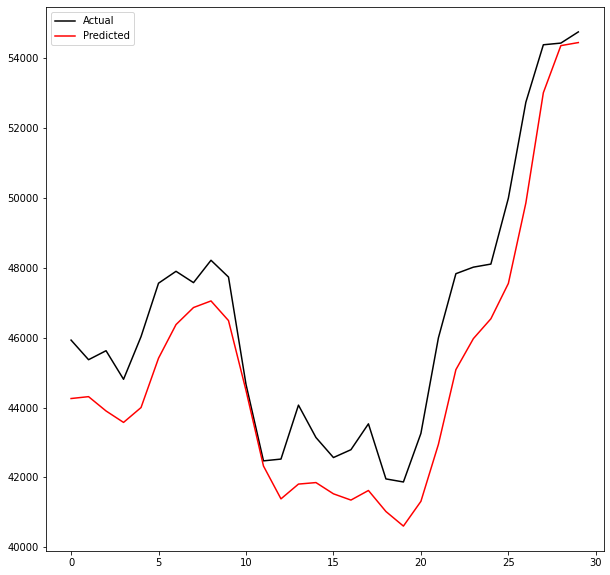

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_378.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'transactions30var']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00270: early stopping
Training R-Squared: 0.996324415430542

Testing R-Squared: 0.9960895669909066

30day Holdout R-Squared: 0.895370859331211

30day Holdout MAE: 1038.1877604166666

30day Holdout MAPE: 2.2563986904225444

30day Holdout RMSE: 1192.5688168791576


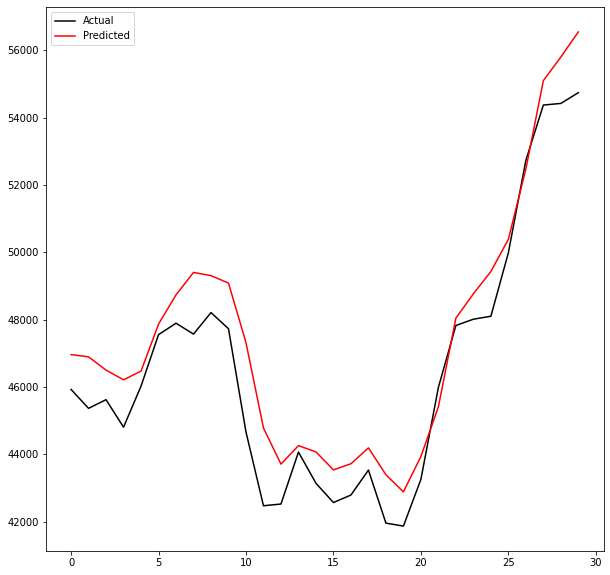

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_379.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'price30rocUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00239: early stopping
Training R-Squared: 0.995465367520967

Testing R-Squared: 0.9911117019727534

30day Holdout R-Squared: 0.936943573378222

30day Holdout MAE: 698.9639322916667

30day Holdout MAPE: 1.5360444545415195

30day Holdout RMSE: 925.8098519664766


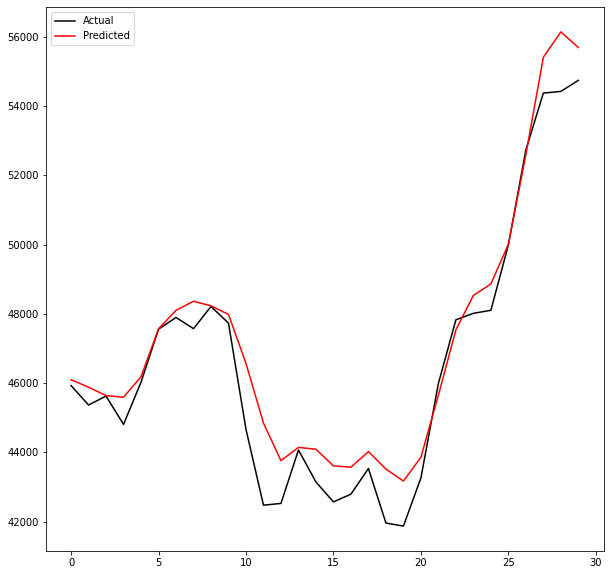

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_380.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'top100cap90wma']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00223: early stopping
Training R-Squared: 0.9966440671354658

Testing R-Squared: 0.9929803447276934

30day Holdout R-Squared: 0.9688073372394354

30day Holdout MAE: 509.40208333333334

30day Holdout MAPE: 1.0977337232539706

30day Holdout RMSE: 651.1534486409186


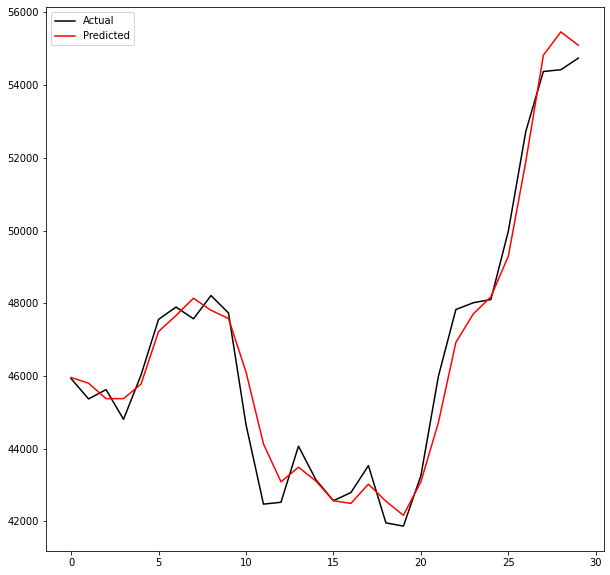

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_381.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'hashrate30std']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00317: early stopping
Training R-Squared: 0.997441384232735

Testing R-Squared: 0.997052373143686

30day Holdout R-Squared: 0.8819573988135243

30day Holdout MAE: 1133.9541666666667

30day Holdout MAPE: 2.4645656885944436

30day Holdout RMSE: 1266.7079773021665


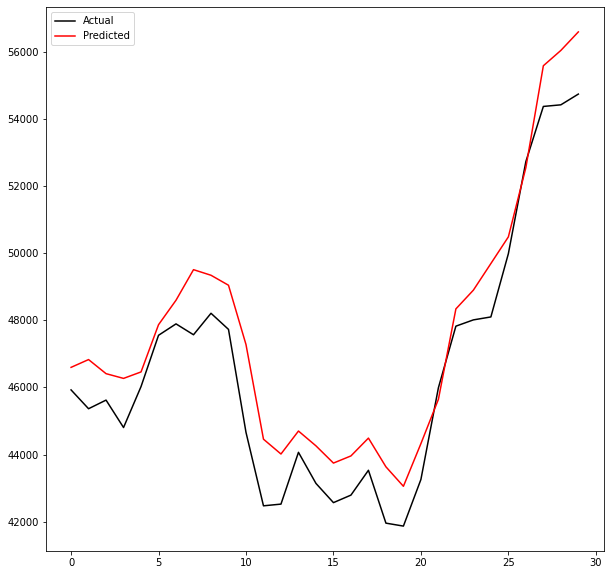

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_382.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'transactionfees7trxUSD']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00374: early stopping
Training R-Squared: 0.9976920453735574

Testing R-Squared: 0.9965983318648298

30day Holdout R-Squared: 0.9644580737670955

30day Holdout MAE: 559.905078125

30day Holdout MAPE: 1.1956502386860053

30day Holdout RMSE: 695.0684897774216


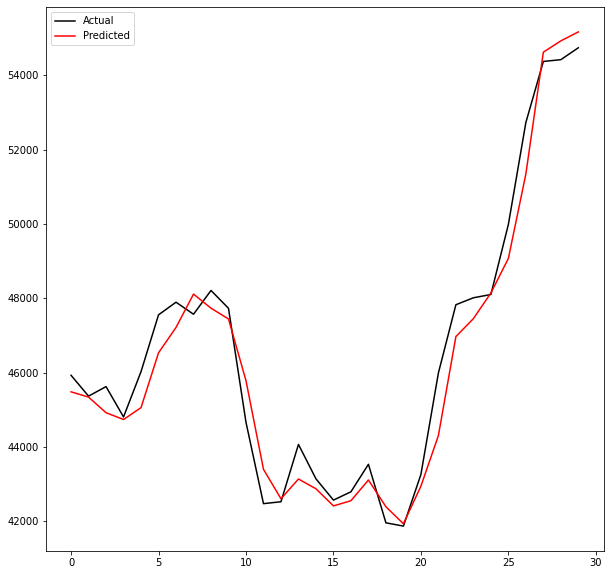

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_383.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01
['median_transaction_fee3momUSD', 'fee_to_reward7momUSD', 'top100cap7mom', 'mining_profitability7rsi', 'top100cap14mom', 'price3wmaUSD', 'transactionvalue90emaUSD', 'difficulty30sma', 'fee_to_reward90smaUSD', 'transactions7trx']
[Pipeline] ............ (step 1 of 2) Processing minmax, total=   0.0s
[Pipeline] ............ (step 2 of 2) Processing robust, total=   0.0s
Epoch 00346: early stopping
Training R-Squared: 0.9977045155565456

Testing R-Squared: 0.9965841683580233

30day Holdout R-Squared: 0.8593861133077181

30day Holdout MAE: 1218.1662760416666

30day Holdout MAPE: 2.621323854533874

30day Holdout RMSE: 1382.5193752580717


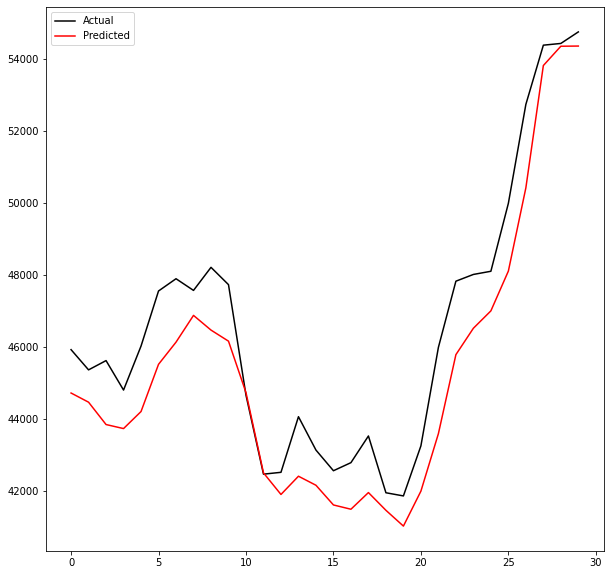

---------Model Summary For Above Results----------
trained_models/ANN4_reg_nextday300Adam0-01relu64Int4_384.hdf5
Number of Neurons: 300
Activation: relu
Optimizer: Adam
Learning Rate: 0.01


In [82]:
# set a variable for the max R squared
r_sq_max = 0

count += 1

# iterate through the features to add to the columns list
for feat in features_cols:
    cols.append(feat)
    print(cols[1:])

    # update X with the new features
    new_X = X[cols]
    r_sq = interval4_ann_model_nextday(new_X, y, lr=l, activation=act, neurons=neuron, opt=op, batch_size=64, epochs=5000, count=count)
    
    count += 1
    
    if r_sq > r_sq_max:
        r_sq_max = r_sq
    
    elif r_sq < r_sq_max:
        cols = cols[:-1]

## Compare to a Benchmark

The benchmark model will be where the current price is used as the prediction of the next day price.

Example:

Price for today is 49987, then the prediction for the next day will be 49987.

Then all metrics will be based on the comparison of that predicted next day price vs the actual next day price, which in this example is 52731.

In [17]:
# isolate the price
y_df = full_df[['Date','priceUSD']]
y_df.tail()

,Date,priceUSD
4098,2021/10/05,49987.0
4099,2021/10/06,52731.0
4100,2021/10/07,54374.0
4101,2021/10/08,54422.0
4102,2021/10/09,54742.0


In [18]:
# create a new column with the values of the current price
y_df['act_next_day'] = y_df['priceUSD'].shift(-1)
y_df = y_df.dropna()
y_df.tail()

C:\Users\dagar\anaconda3\envs\nn37\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Date,priceUSD,act_next_day
4097,2021/10/04,48102.0,49987.0
4098,2021/10/05,49987.0,52731.0
4099,2021/10/06,52731.0,54374.0
4100,2021/10/07,54374.0,54422.0
4101,2021/10/08,54422.0,54742.0


In [19]:
# take the final 30 days of values
y_final = y_df.iloc[-30:, :]
y_final

,Date,priceUSD,act_next_day
4072,2021/09/09,46406.0,45928.0
4073,2021/09/10,45928.0,45367.0
4074,2021/09/11,45367.0,45624.0
4075,2021/09/12,45624.0,44807.0
4076,2021/09/13,44807.0,46027.0
4077,2021/09/14,46027.0,47555.0
4078,2021/09/15,47555.0,47895.0
4079,2021/09/16,47895.0,47571.0
4080,2021/09/17,47571.0,48211.0
4081,2021/09/18,48211.0,47731.0


In [23]:
y_true = y_final['act_next_day']
y_pred = y_final['priceUSD']

# view the r2_score and the MAPE score
r2 = r2_score(y_true, y_pred)
mape = mean_absolute_percentage_error(y_true, y_pred)

print('MAPE score:', mape)
print('R-squared:', r2)

MAPE score: 2.1935807434348966
R-squared: 0.8687748775767602


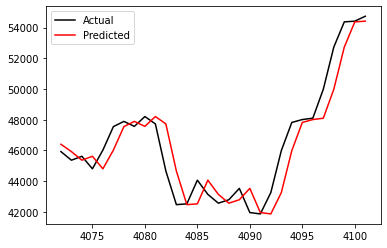

In [24]:
plt.plot(y_true.index, y_true, color='black', label='Actual')
plt.plot(y_pred.index, y_pred, color='red', label='Predicted')
plt.legend()
plt.show()

